### Exp 1.2 - RNN - Boulder- 2 HOUR summary:
1. import bird model ghi values
2. import actual data
3. merge the two based on the common timestamps
4. drop all rows if 'ghi' value is 0
5. ** DO NOT drop all rows with dw_solar < 0 **
6. Manage missing values: Drop any row if it has -9999.9
7. Make Kt column ('dw_solar'/'ghi') 
8. Group the data into hourly format (by finding mean)
9. assign hierarchical index
10. get the subdataframes for each day and shift the Kt values
11. drop the year, month, day, hour and minute columns
12. feed the data into RNN alrogithm
    - RNN seq_lenth = 1
    - learning rate = 0.001
    - single RNN layer
    - num of epochs = 5000

** in this experiment we are not giving Kt as one of the features. We are using hierarchical index to make sub dataframe for every day and then shift the Kt values one cell up to make it as one hour forecast. **

### NOTE
** the test['Kt'].max() values after grouping into hourly data is 7279.907547 = this is a outlier. The reason might be having a dw_solar reading with QC=2 value. Still haven't checked that. But the second highest value of 'Kt' parameter in the testset is 672 (which is way lower) **

In [1]:
import numpy as np
import pandas as pd
import datetime
import glob
import os.path
from pandas.compat import StringIO

### NREL Bird Model implementation: for obtaining clear sky GHI

In [2]:
import itertools
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [3]:
%matplotlib inline
sns.set_color_codes()

In [4]:
import pvlib
from pvlib import clearsky, atmosphere
from pvlib.location import Location

In [5]:
bod = Location(40.0150,-105.2705, 'US/Mountain', 1655.064, 'Boulder')

In [6]:
times2009 = pd.DatetimeIndex(start='2009-01-01', end='2010-01-01', freq='1min',
                        tz=bod.tz)   # 12 months of 2009 - For testing
times2010and2011 = pd.DatetimeIndex(start='2010-01-01', end='2012-01-01', freq='1min',
                        tz=bod.tz)   # 24 months of 2010 and 2011 - For training
#times2011 = pd.DatetimeIndex(start='2011-01-01', end='2012-01-01', freq='1min',
                       # tz=bod.tz)   # 12 months of 2011  - For training

In [7]:
cs_2009 = bod.get_clearsky(times2009) 
cs_2010and2011 = bod.get_clearsky(times2010and2011) # ineichen with climatology table by default
#cs_2011 = bod.get_clearsky(times2011) 

In [8]:
cs_2009.drop(['dni','dhi'],axis=1, inplace=True) #updating the same dataframe by dropping two columns
cs_2010and2011.drop(['dni','dhi'],axis=1, inplace=True) #updating the same dataframe by dropping two columns
#cs_2011.drop(['dni','dhi'],axis=1, inplace=True) #updating the same dataframe by dropping two columns

In [9]:
cs_2009.reset_index(inplace=True)
cs_2010and2011.reset_index(inplace=True)
#cs_2011.reset_index(inplace=True)

In [10]:
cs_2009['index']=cs_2009['index'].apply(lambda x:x.to_datetime())
cs_2009['year'] = cs_2009['index'].apply(lambda x:x.year)
cs_2009['month'] = cs_2009['index'].apply(lambda x:x.month)
cs_2009['day'] = cs_2009['index'].apply(lambda x:x.day)
cs_2009['hour'] = cs_2009['index'].apply(lambda x:x.hour)
cs_2009['min'] = cs_2009['index'].apply(lambda x:x.minute)

In [11]:
cs_2010and2011['index']=cs_2010and2011['index'].apply(lambda x:x.to_datetime())
cs_2010and2011['year'] = cs_2010and2011['index'].apply(lambda x:x.year)
cs_2010and2011['month'] = cs_2010and2011['index'].apply(lambda x:x.month)
cs_2010and2011['day'] = cs_2010and2011['index'].apply(lambda x:x.day)
cs_2010and2011['hour'] = cs_2010and2011['index'].apply(lambda x:x.hour)
cs_2010and2011['min'] = cs_2010and2011['index'].apply(lambda x:x.minute)

In [12]:
print(cs_2009.shape)
print(cs_2010and2011.shape)
#print(cs_2011.shape)

(525601, 7)
(1051201, 7)


In [13]:
cs_2009.drop(cs_2009.index[-1], inplace=True)
cs_2010and2011.drop(cs_2010and2011.index[-1], inplace=True)
#cs_2011.drop(cs_2011.index[-1], inplace=True)

In [14]:
print(cs_2009.shape)
print(cs_2010and2011.shape)
#print(cs_2011.shape)

(525600, 7)
(1051200, 7)


In [15]:
cs_2010and2011.head()

,index,ghi,year,month,day,hour,min
0,2010-01-01 00:00:00-07:00,0.0,2010,1,1,0,0
1,2010-01-01 00:01:00-07:00,0.0,2010,1,1,0,1
2,2010-01-01 00:02:00-07:00,0.0,2010,1,1,0,2
3,2010-01-01 00:03:00-07:00,0.0,2010,1,1,0,3
4,2010-01-01 00:04:00-07:00,0.0,2010,1,1,0,4


### Import files from each year in a separate dataframe


- year            integer	 year, i.e., 1995
- jday            integer	 Julian day (1 through 365 [or 366])
- month           integer	 number of the month (1-12)
- day             integer	 day of the month(1-31)
- hour            integer	 hour of the day (0-23)
- min             integer	 minute of the hour (0-59)
- dt              real	 decimal time (hour.decimalminutes, e.g., 23.5 = 2330)
- zen             real	 solar zenith angle (degrees)
- dw_solar        real	 downwelling global solar (Watts m^-2)
- uw_solar        real	 upwelling global solar (Watts m^-2)
- direct_n        real	 direct-normal solar (Watts m^-2)
- diffuse         real	 downwelling diffuse solar (Watts m^-2)
- dw_ir           real	 downwelling thermal infrared (Watts m^-2)
- dw_casetemp     real	 downwelling IR case temp. (K)
- dw_dometemp     real	 downwelling IR dome temp. (K)
- uw_ir           real	 upwelling thermal infrared (Watts m^-2)
- uw_casetemp     real	 upwelling IR case temp. (K)
- uw_dometemp     real	 upwelling IR dome temp. (K)
- uvb             real	 global UVB (milliWatts m^-2)
- par             real	 photosynthetically active radiation (Watts m^-2)
- netsolar        real	 net solar (dw_solar - uw_solar) (Watts m^-2)
- netir           real	 net infrared (dw_ir - uw_ir) (Watts m^-2)
- totalnet        real	 net radiation (netsolar+netir) (Watts m^-2)
- temp            real	 10-meter air temperature (?C)
- rh              real	 relative humidity (%)
- windspd         real	 wind speed (ms^-1)
- winddir         real	 wind direction (degrees, clockwise from north)
- pressure        real	 station pressure (mb)


In [16]:
cols = ['year', 'jday', 'month', 'day','hour','min','dt','zen','dw_solar','dw_solar_QC','uw_solar',
       'uw_solar_QC', 'direct_n','direct_n_QC','diffuse', 'diffuse_QC', 'dw_ir', 'dw_ir_QC', 'dw_casetemp',
       'dw_casetemp_QC', 'dw_dometemp','dw_dometemp_QC','uw_ir', 'uw_ir_QC', 'uw_casetemp','uw_casetemp_QC',
       'uw_dometemp','uw_dometemp_QC','uvb','uvb_QC','par','par_QC','netsolar','netsolar_QC','netir','netir_QC',
       'totalnet','totalnet_QC','temp','temp_QC','rh','rh_QC','windspd','windspd_QC','winddir','winddir_QC',
       'pressure','pressure_QC']

In [18]:
path = r'.\\data\\Boulder\\Exp_1_train'
all_files = glob.glob(path + "/*.dat")
all_files.sort()

df_big_train = pd.concat([pd.read_csv(f, skipinitialspace = True, quotechar = '"',skiprows=(2),delimiter=' ', 
                 index_col=False,header=None, names=cols) for f in all_files],ignore_index=True)
df_big_train.shape

(1050018, 48)

In [19]:
path = r'.\\data\\Boulder\\Exp_1_test'
all_files = glob.glob(path + "/*.dat")
all_files.sort()

df_big_test = pd.concat((pd.read_csv(f, skipinitialspace = True, quotechar = '"',skiprows=(2),delimiter=' ', 
                 index_col=False,header=None, names=cols) for f in all_files),ignore_index=True)
df_big_test.shape

(525132, 48)

In [20]:
df_big_test[df_big_test['dw_solar']==-9999.9].shape

(3702, 48)

### Merging Clear Sky GHI And the big dataframe

In [21]:
df_train = pd.merge(df_big_train, cs_2010and2011, on=['year','month','day','hour','min'])
df_train.shape

(1050018, 50)

In [22]:
df_test = pd.merge(df_big_test, cs_2009, on=['year','month','day','hour','min'])
df_test.shape

(525132, 50)

In [23]:
df_train.drop(['index'],axis=1, inplace=True) #updating the same dataframe by dropping the index columns from clear sky model
df_test.drop(['index'], axis=1, inplace=True)

In [24]:
df_train.shape

(1050018, 49)

### Managing missing values

In [25]:
# Resetting index
df_train.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)

In [26]:
# Dropping rows with two or more -9999.9 values in columns

In [27]:
# Step1: Get indices of all rows with 2 or more -999
missing_data_indices = np.where((df_train <=-9999.9).apply(sum, axis=1)>=2)[0]
# Step2: Drop those indices
df_train.drop(missing_data_indices, axis=0, inplace=True)
# Checking that the rows are dropped
df_train.shape

(1034397, 49)

In [28]:
missing_data_indices_test = np.where((df_test <= -9999.9).apply(sum, axis=1)>=2)[0]
df_test.drop(missing_data_indices_test, axis=0, inplace=True)
df_test.shape

(505639, 49)

In [29]:
# For the rows with only one cell as -9999.9, replacing this cell with the mean of the column

#### First resetting index after dropping rows in the previous part of the code

In [30]:
# 2nd time - Reseting Index
df_train.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)

In [31]:
one_miss_train_idx = np.where((df_train <=-9999.9).apply(sum, axis=1)==1)[0]

In [32]:
len(one_miss_train_idx)

10058

In [33]:
df_train.shape

(1034397, 49)

In [34]:
col_names = df_train.columns
from collections import defaultdict
stats = defaultdict(int)
total_single_missing_values = 0
for name in col_names:
    col_mean = df_train[~(df_train[name] == -9999.9)][name].mean()
    missing_indices = np.where((df_train[name] == -9999.9))
    stats[name] = len(missing_indices[0])
    df_train[name].loc[missing_indices] = col_mean
    total_single_missing_values += sum(df_train[name] == -9999.9)
    

C:\Users\s269596\AppData\Local\Continuum\Anaconda3\lib\site-packages\pandas\core\indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [35]:
df_col_min = df_train.apply(min, axis=0)
df_col_max = df_train.apply(max, axis =0)
#print(df_col_min, df_col_max)

In [36]:
train = np.where((df_train <=-9999.9).apply(sum, axis=1)==1)[0]

In [37]:
len(train)

0

In [38]:
# doing the same thing on test dataset

In [39]:
one_miss_test_idx = np.where((df_test <=-9999.9).apply(sum, axis=1)==1)[0]
len(one_miss_test_idx)

6657

In [40]:
col_names_test = df_test.columns
from collections import defaultdict
stats_test = defaultdict(int)
total_single_missing_values_test = 0
for name in col_names_test:
    col_mean = df_test[~(df_test[name] == -9999.9)][name].mean()
    missing_indices = np.where((df_test[name] == -9999.9))
    stats_test[name] = len(missing_indices[0])
    df_test[name].loc[missing_indices] = col_mean
    total_single_missing_values_test += sum(df_test[name] == -9999.9)
    

C:\Users\s269596\AppData\Local\Continuum\Anaconda3\lib\site-packages\pandas\core\indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [41]:
test = np.where((df_test <=-9999.9).apply(sum, axis=1)==1)[0]

In [42]:
len(test)

0

In [43]:
df_train.shape

(1034397, 49)

In [44]:
df_test.shape

(505639, 49)

### Exploratory Data Analysis

In [45]:
dw_solar_everyday = df_test.groupby(['jday'])['dw_solar'].mean()
ghi_everyday = df_test.groupby(['jday'])['ghi'].mean()
j_day = df_test['jday'].unique()

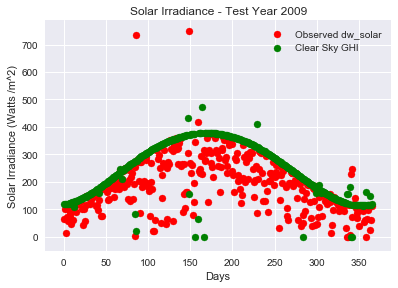

In [46]:
fig = plt.figure()

axes1 = fig.add_axes([0.1,0.1,0.8,0.8])
#axes2 = fig.add_axes([0.1,0.1,0.8,0.8])

axes1.scatter(j_day,dw_solar_everyday,label='Observed dw_solar',color='red')
axes1.scatter(j_day, ghi_everyday, label='Clear Sky GHI',color='green')

axes1.set_xlabel('Days')
axes1.set_ylabel('Solar Irradiance (Watts /m^2)')
axes1.set_title('Solar Irradiance - Test Year 2009')
axes1.legend(loc='best')

fig.savefig('Figure2a.png', bbox_inches = 'tight')

C:\Users\s269596\AppData\Local\Continuum\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


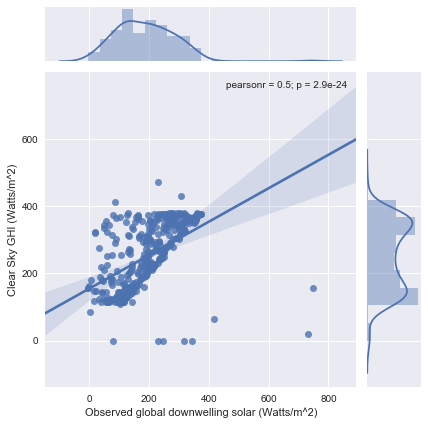

In [47]:
sns.jointplot(x=dw_solar_everyday,y=ghi_everyday,kind='reg')
#plt.title('observed dw_solar vs clear sky ghi')
plt.xlabel('Observed global downwelling solar (Watts/m^2)')
plt.ylabel('Clear Sky GHI (Watts/m^2)')
plt.savefig('Figure3a.png', bbox_inches='tight')

### making the Kt (clear sky index at time t) column by first removing rows with ghi==0

In [48]:
df_train = df_train[df_train['ghi']!=0]
df_test = df_test[df_test['ghi']!=0]
df_train['Kt'] = df_train['dw_solar']/df_train['ghi']
df_test['Kt'] = df_test['dw_solar']/df_test['ghi']

In [49]:
df_train.reset_index(inplace=True)
df_test.reset_index(inplace=True)

In [50]:
print("test Kt max: "+str(df_test['Kt'].max()))
print("test Kt min: "+str(df_test['Kt'].min()))
print("test Kt mean: "+str(df_test['Kt'].mean()))
print("\n")
print("train Kt max: "+str(df_train['Kt'].max()))
print("train Kt min: "+str(df_train['Kt'].min()))
print("train Kt mean: "+str(df_train['Kt'].mean()))

test Kt max: 18622.003582590547
test Kt min: -1997.8414616673917
test Kt mean: 3.2082558853348537


train Kt max: 275783.5110086593
train Kt min: -1561.168664736838
train Kt mean: 3.977201231349393


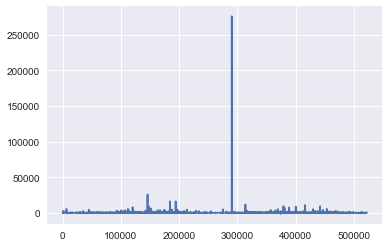

In [51]:
plt.plot(df_train['Kt'])

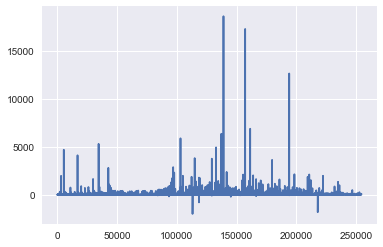

In [52]:
plt.plot(df_test['Kt'])

In [53]:
df_train= df_train[df_train['Kt']< 5000]
df_train= df_train[df_train['Kt']> -1000]
df_test= df_test[df_test['Kt']< 5000]
df_test= df_test[df_test['Kt']> -1000]

#### Group the data (train dataframe)

In [54]:
zen = df_train.groupby(['year','month','day','hour'])['zen'].mean()
dw_solar = df_train.groupby(['year','month','day','hour'])['dw_solar'].mean()
uw_solar = df_train.groupby(['year','month','day','hour'])['uw_solar'].mean()
direct_n = df_train.groupby(['year','month','day','hour'])['direct_n'].mean()
diffuse = df_train.groupby(['year','month','day','hour'])['diffuse'].mean()
dw_ir = df_train.groupby(['year','month','day','hour'])['dw_ir'].mean()
dw_casetemp = df_train.groupby(['year','month','day','hour'])['dw_casetemp'].mean()
dw_dometemp = df_train.groupby(['year','month','day','hour'])['dw_dometemp'].mean()
uw_ir = df_train.groupby(['year','month','day','hour'])['uw_ir'].mean()
uw_casetemp = df_train.groupby(['year','month','day','hour'])['uw_casetemp'].mean()
uw_dometemp = df_train.groupby(['year','month','day','hour'])['uw_dometemp'].mean()
uvb = df_train.groupby(['year','month','day','hour'])['uvb'].mean()
par = df_train.groupby(['year','month','day','hour'])['par'].mean()
netsolar = df_train.groupby(['year','month','day','hour'])['netsolar'].mean()
netir = df_train.groupby(['year','month','day','hour'])['netir'].mean()
totalnet = df_train.groupby(['year','month','day','hour'])['totalnet'].mean()
temp = df_train.groupby(['year','month','day','hour'])['temp'].mean()
rh = df_train.groupby(['year','month','day','hour'])['rh'].mean()
windspd = df_train.groupby(['year','month','day','hour'])['windspd'].mean()
winddir = df_train.groupby(['year','month','day','hour'])['winddir'].mean()
pressure = df_train.groupby(['year','month','day','hour'])['pressure'].mean()
ghi = df_train.groupby(['year','month','day','hour'])['ghi'].mean()
Kt = df_train.groupby(['year','month','day','hour'])['Kt'].mean()

In [55]:
df_new_train = pd.concat([zen,dw_solar,uw_solar,direct_n,diffuse,dw_ir,dw_casetemp,dw_dometemp,uw_ir,uw_casetemp,uw_dometemp,
                    uvb,par,netsolar,netir,totalnet,temp,rh,windspd,winddir,pressure,ghi,Kt], axis=1)

In [56]:
df_new_train.head()

zen  dw_solar  uw_solar  direct_n   diffuse  \
year   month day hour                                                       
2010.0 1.0   1.0 7.0   161.031471 -2.950000 -0.711765  1.138235  0.538235   
                 8.0   155.139333 -3.753333 -0.936667  1.285000  0.513333   
                 9.0   145.065667 -3.293333 -0.251667  1.255000  0.488333   
                 10.0  133.892500 -3.641667 -0.710000  1.795000  0.406667   
                 11.0  122.454000 -3.126667 -0.471667  1.275000  0.456667   

                            dw_ir  dw_casetemp  dw_dometemp       uw_ir  \
year   month day hour                                                     
2010.0 1.0   1.0 7.0   224.085294   270.364706   269.979412  268.744118   
                 8.0   223.563333   270.761667   270.405000  275.378333   
                 9.0   212.618333   270.150000   269.700000  273.045000   
                 10.0  215.475000   269.760000   269.403333  270.496667   
                 11.0  216.165000   269.116667   268.663333  269.205000   

                       uw_casetemp    ...     netsolar      netir   totalnet  \
year   month day hour                 ...                                      
2010.0 1.0   1.0 7.0    268.611765    ...          0.0 -44.652941 -44.652941   
                 8.0    269.453333    ...          0.0 -51.813333 -51.813333   
                 9.0    268.510000    ...          0.0 -60.421667 -60.421667   
                 10.0   267.760000    ...          0.0 -55.031667 -55.031667   
                 11.0   267.470000    ...          0.0 -53.050000 -53.050000   

                           temp         rh   windspd     winddir    pressure  \
year   month day hour                                                          
2010.0 1.0   1.0 7.0  -3.211765  56.261765  2.835294  107.311765  830.647059   
                 8.0  -2.645000  53.351667  3.866667  147.821667  830.728333   
                 9.0  -3.716667  59.238333  3.315000   63.578333  831.020000   
                 10.0 -3.923333  60.121667  3.076667   71.128333  831.073333   
                 11.0 -4.565000  61.175000  3.535000  184.166667  831.015000   

                              ghi        Kt  
year   month day hour                        
2010.0 1.0   1.0 7.0    33.080713 -0.116856  
                 8.0   143.676328 -0.030061  
                 9.0   299.581054 -0.011214  
                 10.0  419.749575 -0.008772  
                 11.0  486.001859 -0.006431  

[5 rows x 23 columns]

#### Groupdata - test dataframe

In [57]:
test_zen = df_test.groupby(['month','day','hour'])['zen'].mean()
test_dw_solar = df_test.groupby(['month','day','hour'])['dw_solar'].mean()
test_uw_solar = df_test.groupby(['month','day','hour'])['uw_solar'].mean()
test_direct_n = df_test.groupby(['month','day','hour'])['direct_n'].mean()
test_diffuse = df_test.groupby(['month','day','hour'])['diffuse'].mean()
test_dw_ir = df_test.groupby(['month','day','hour'])['dw_ir'].mean()
test_dw_casetemp = df_test.groupby(['month','day','hour'])['dw_casetemp'].mean()
test_dw_dometemp = df_test.groupby(['month','day','hour'])['dw_dometemp'].mean()
test_uw_ir = df_test.groupby(['month','day','hour'])['uw_ir'].mean()
test_uw_casetemp = df_test.groupby(['month','day','hour'])['uw_casetemp'].mean()
test_uw_dometemp = df_test.groupby(['month','day','hour'])['uw_dometemp'].mean()
test_uvb = df_test.groupby(['month','day','hour'])['uvb'].mean()
test_par = df_test.groupby(['month','day','hour'])['par'].mean()
test_netsolar = df_test.groupby(['month','day','hour'])['netsolar'].mean()
test_netir = df_test.groupby(['month','day','hour'])['netir'].mean()
test_totalnet = df_test.groupby(['month','day','hour'])['totalnet'].mean()
test_temp = df_test.groupby(['month','day','hour'])['temp'].mean()
test_rh = df_test.groupby(['month','day','hour'])['rh'].mean()
test_windspd = df_test.groupby(['month','day','hour'])['windspd'].mean()
test_winddir = df_test.groupby(['month','day','hour'])['winddir'].mean()
test_pressure = df_test.groupby(['month','day','hour'])['pressure'].mean()
test_ghi = df_test.groupby(['month','day','hour'])['ghi'].mean()
test_Kt = df_test.groupby(['month','day','hour'])['Kt'].mean()

In [58]:
df_new_test = pd.concat([test_zen,test_dw_solar,test_uw_solar,test_direct_n,test_diffuse,test_dw_ir,
                         test_dw_casetemp,test_dw_dometemp,test_uw_ir,test_uw_casetemp,test_uw_dometemp,
                    test_uvb,test_par,test_netsolar,test_netir,test_totalnet,test_temp,test_rh,
                         test_windspd,test_winddir,test_pressure,test_ghi,test_Kt], axis=1)

In [59]:
df_new_test.loc[2].xs(17,level='day')

,zen,dw_solar,uw_solar,direct_n,diffuse,dw_ir,dw_casetemp,dw_dometemp,uw_ir,uw_casetemp,...,netsolar,netir,totalnet,temp,rh,windspd,winddir,pressure,ghi,Kt
hour,,,,,,,,,,,,,,,,,,,,,
6.0,151.473333,-3.300000,-0.233333,-3.483333,-0.116667,233.200000,280.250000,279.550000,309.550000,279.016667,...,0.000000,-76.316667,-76.316667,6.783333,37.650000,3.866667,253.666667,820.400000,11.691876,-0.326406
7.0,151.355333,-3.783333,-1.331667,2.156667,-0.118333,232.493333,279.143333,278.730000,301.550000,278.228333,...,0.000000,-69.071667,-69.071667,6.888333,36.541667,2.335000,236.583333,819.853333,85.439689,-0.067258
8.0,147.215333,-3.510000,-1.576667,1.040000,-0.085000,228.316667,278.118333,277.690000,292.126667,276.498333,...,0.000000,-63.806667,-63.806667,5.211667,41.668333,1.003333,183.796667,819.033333,276.176482,-0.013317
9.0,139.073167,-4.836667,-1.441667,3.286667,0.153333,228.880000,278.088333,277.798333,301.906667,276.206667,...,0.000000,-73.030000,-73.030000,5.850000,36.901667,2.431667,154.540000,817.888333,459.734986,-0.010574
10.0,128.876667,-4.575000,-0.933333,0.893333,-0.031667,230.783333,278.736667,278.345000,308.195000,277.050000,...,0.000000,-77.415000,-77.415000,5.566667,34.063333,3.446667,180.726667,816.726667,599.596511,-0.007646
11.0,117.762500,-4.770000,-1.326667,2.743333,0.120000,241.015000,279.501667,279.201667,304.923333,277.420000,...,0.000000,-63.898333,-63.898333,6.798333,28.861667,1.726667,144.958333,816.071667,681.707415,-0.006993
12.0,106.328333,-4.698333,-1.208333,1.531667,0.030000,229.035000,280.325000,279.935000,312.165000,278.568333,...,0.000000,-83.126667,-83.126667,7.463333,28.286667,3.046667,217.635000,815.656667,699.157260,-0.006720
13.0,94.871333,-3.521667,0.295000,18.040000,1.958333,227.543333,280.648333,280.078333,324.303333,279.133333,...,1.470000,-96.761667,-95.290000,7.078333,32.360000,10.041667,249.865000,815.330000,650.549614,-0.005250
14.0,83.779333,78.048333,23.100000,542.223333,32.271667,230.468333,281.270000,280.663333,329.951667,278.816667,...,75.555000,-99.493333,-23.943333,6.751667,36.701667,9.171667,242.581667,815.920000,539.852805,0.152844


### Shifting Kt values to make 1 hour ahead forecast

#### Train dataset

In [60]:
levels_index= []
for m in df_new_train.index.levels:
    levels_index.append(m)

In [61]:
for i in levels_index[0]:
    for j in levels_index[1]:
        df_new_train.loc[i].loc[j]['Kt'] = df_new_train.loc[i].loc[j]['Kt'].shift(-2)

In [62]:
df_new_train = df_new_train[~(df_new_train['Kt'].isnull())]

#### Test dataset

In [63]:
levels_index2= []
for m in df_new_test.index.levels:
    levels_index2.append(m)

In [64]:
for i in levels_index2[0]:
    for j in levels_index2[1]:
        df_new_test.loc[i].loc[j]['Kt'] = df_new_test.loc[i].loc[j]['Kt'].shift(-2)

In [65]:
df_new_test = df_new_test[~(df_new_test['Kt'].isnull())]

In [66]:
df_new_test[df_new_test['Kt']==df_new_test['Kt'].max()]

,,,zen,dw_solar,uw_solar,direct_n,diffuse,dw_ir,dw_casetemp,dw_dometemp,uw_ir,uw_casetemp,...,netsolar,netir,totalnet,temp,rh,windspd,winddir,pressure,ghi,Kt
month,day,hour,,,,,,,,,,,,,,,,,,,,,
3.0,11.0,17.0,49.548167,735.108333,114.276667,995.438333,76.996667,195.418333,275.195,274.79,373.26,271.84,...,608.371667,-177.845,430.52,-2.916667,57.606667,1.868333,100.52,833.776667,275.370273,1026.823214


### Normalize train and test dataframe

In [67]:
train_norm = (df_new_train - df_new_train.mean()) / (df_new_train.max() - df_new_train.min())
test_norm =  (df_new_test - df_new_test.mean()) / (df_new_test.max() - df_new_test.min())

In [68]:
train_norm.reset_index(inplace=True,drop=True)
test_norm.reset_index(inplace=True,drop=True)

### Making train and test sets with train_norm and test_norm

#### finding the gcf (greatest common factor) of train and test dataset's length and chop off the extra rows to make it divisible with the batchsize

In [69]:
from fractions import gcd
gcd(train_norm.shape[0],test_norm.shape[0])

C:\Users\s269596\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: fractions.gcd() is deprecated. Use math.gcd() instead.
  


1

In [70]:
import math
def roundup(x):
    return int(math.ceil(x / 100.0)) * 100

In [71]:
train_lim = roundup(train_norm.shape[0])
test_lim = roundup(test_norm.shape[0])

train_random = train_norm.sample(train_lim-train_norm.shape[0])
test_random = test_norm.sample(test_lim-test_norm.shape[0])

train_norm = train_norm.append(train_random)
test_norm = test_norm.append(test_random)

In [72]:
X1 = train_norm.drop('Kt',axis=1)
y1 = train_norm['Kt']

X2 = test_norm.drop('Kt',axis=1)
y2 = test_norm['Kt']

In [73]:
print("X1_train shape is {}".format(X1.shape))
print("y1_train shape is {}".format(y1.shape))
print("X2_test shape is {}".format(X2.shape))
print("y2_test shape is {}".format(y2.shape))

X1_train shape is (9400, 22)
y1_train shape is (9400,)
X2_test shape is (3900, 22)
y2_test shape is (3900,)


In [74]:
X_train = np.array(X1)
y_train  = np.array(y1)
X_test = np.array(X2)
y_test = np.array(y2)

### start of RNN

In [75]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.datasets as dsets
from torch.autograd import Variable

In [76]:
class RNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim):
        super(RNNModel, self).__init__()
        #Hidden Dimension
        self.hidden_dim = hidden_dim
        
        # Number of hidden layers
        self.layer_dim = layer_dim
        
        #Building the RNN
        self.rnn = nn.RNN(input_dim, hidden_dim, layer_dim, batch_first=True, nonlinearity='relu')
        
        # Readout layer
        self.fc = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, x):
        # Initializing the hidden state with zeros
        # (layer_dim, batch_size, hidden_dim)
        h0 = Variable(torch.zeros(self.layer_dim, x.size(0), self.hidden_dim))
        
        #One time step (the last one perhaps?)
        out, hn = self.rnn(x, h0)
        
        # Indexing hidden state of the last time step
        # out.size() --> ??
        #out[:,-1,:] --> is it going to be 100,100
        out = self.fc(out[:,-1,:])
        # out.size() --> 100,1
        return out
        

In [77]:
# Instantiating Model Class
input_dim = 22
hidden_dim = 15
layer_dim = 1
output_dim = 1
batch_size = 100

model = RNNModel(input_dim, hidden_dim, layer_dim, output_dim)

# Instantiating Loss Class
criterion = nn.MSELoss()

# Instantiate Optimizer Class
learning_rate = 0.001
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

# converting numpy array to torch tensor
X_train = torch.from_numpy(X_train)
y_train = torch.from_numpy(y_train)
X_test = torch.from_numpy(X_test)
y_test = torch.from_numpy(y_test)

# initializing lists to store losses over epochs:
train_loss = []
test_loss = []
train_iter = []
test_iter = []

In [79]:
# Training the model
seq_dim = 1

n_iter =0
num_samples = len(X_train)
test_samples = len(X_test)
batch_size = 100
num_epochs = 1000
feat_dim = X_train.shape[1]

X_train = X_train.type(torch.FloatTensor)
y_train = y_train.type(torch.FloatTensor)
X_test = X_test.type(torch.FloatTensor)
y_test = y_test.type(torch.FloatTensor)

for epoch in range(num_epochs):
    for i in range(0, int(num_samples/batch_size -1)):
        
        
        features = Variable(X_train[i*batch_size:(i+1)*batch_size, :]).view(-1, seq_dim, feat_dim)
        Kt_value = Variable(y_train[i*batch_size:(i+1)*batch_size])
        
        #print("Kt_value={}".format(Kt_value))
        
        optimizer.zero_grad()
        
        outputs = model(features)
        #print("outputs ={}".format(outputs))
        
        loss = criterion(outputs, Kt_value)
        
        train_loss.append(loss.data[0])
        train_iter.append(n_iter)

        #print("loss = {}".format(loss))
        loss.backward()
        
        optimizer.step()
        
        
            
        if n_iter%500 == 0:
            for i in range(0,int(test_samples/batch_size -1)):
                features = Variable(X_test[i*batch_size:(i+1)*batch_size, :]).view(-1, seq_dim, feat_dim)
                Kt_test = Variable(y_test[i*batch_size:(i+1)*batch_size])
                
                outputs = model(features)
                
                mse = np.sqrt(np.mean((Kt_test.data.numpy() - outputs.data.numpy().squeeze())**2)/num_samples)
                
                test_iter.append(n_iter)
                test_loss.append(mse)
                
        n_iter += 1  
                
        print('Epoch: {} Iteration: {}. Train_MSE: {}. Test_MSE: {}'.format(epoch, n_iter, loss.data[0], mse))
               

Epoch: 0 Iteration: 1. Train_MSE: 0.08539342880249023. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 2. Train_MSE: 0.0755024254322052. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 3. Train_MSE: 0.07760009169578552. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 4. Train_MSE: 0.07980143278837204. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 5. Train_MSE: 0.08240543305873871. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 6. Train_MSE: 0.08724137395620346. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 7. Train_MSE: 0.0778113305568695. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 8. Train_MSE: 0.07601811736822128. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 9. Train_MSE: 0.08032999187707901. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 10. Train_MSE: 0.0776074007153511. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 11. Train_MSE: 0.07750343531370163. Test_MSE: 0.002976108212793123
Epoch: 0 Iteration: 12. Train_MSE: 0.07057403028011322.

Epoch: 1 Iteration: 179. Train_MSE: 0.0235418900847435. Test_MSE: 0.002976108212793123
Epoch: 1 Iteration: 180. Train_MSE: 0.025344951078295708. Test_MSE: 0.002976108212793123
Epoch: 1 Iteration: 181. Train_MSE: 0.027889879420399666. Test_MSE: 0.002976108212793123
Epoch: 1 Iteration: 182. Train_MSE: 0.028020571917295456. Test_MSE: 0.002976108212793123
Epoch: 1 Iteration: 183. Train_MSE: 0.02681533619761467. Test_MSE: 0.002976108212793123
Epoch: 1 Iteration: 184. Train_MSE: 0.02923387475311756. Test_MSE: 0.002976108212793123
Epoch: 1 Iteration: 185. Train_MSE: 0.02792387455701828. Test_MSE: 0.002976108212793123
Epoch: 1 Iteration: 186. Train_MSE: 0.027782203629612923. Test_MSE: 0.002976108212793123
Epoch: 2 Iteration: 187. Train_MSE: 0.029207326471805573. Test_MSE: 0.002976108212793123
Epoch: 2 Iteration: 188. Train_MSE: 0.025009388104081154. Test_MSE: 0.002976108212793123
Epoch: 2 Iteration: 189. Train_MSE: 0.025691907852888107. Test_MSE: 0.002976108212793123
Epoch: 2 Iteration: 190. T

Epoch: 3 Iteration: 357. Train_MSE: 0.015790047124028206. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 358. Train_MSE: 0.007947546429932117. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 359. Train_MSE: 0.007675206754356623. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 360. Train_MSE: 0.007944876328110695. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 361. Train_MSE: 0.007895936258137226. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 362. Train_MSE: 0.008812745101749897. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 363. Train_MSE: 0.007755964994430542. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 364. Train_MSE: 0.007569542154669762. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 365. Train_MSE: 0.007691888604313135. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 366. Train_MSE: 0.008702791295945644. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 367. Train_MSE: 0.01005380880087614. Test_MSE: 0.002976108212793123
Epoch: 3 Iteration: 36

Epoch: 5 Iteration: 528. Train_MSE: 0.007497281301766634. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 529. Train_MSE: 0.0055606733076274395. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 530. Train_MSE: 0.005239252932369709. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 531. Train_MSE: 0.0038450220599770546. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 532. Train_MSE: 0.004404409322887659. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 533. Train_MSE: 0.003725521033629775. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 534. Train_MSE: 0.0033342039678245783. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 535. Train_MSE: 0.003704303177073598. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 536. Train_MSE: 0.0033029895275831223. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 537. Train_MSE: 0.0032578178215771914. Test_MSE: 0.0008216540558956164
Epoch: 5 Iteration: 538. Train_MSE: 0.0033008826430886984. Test_MSE: 0.0008216540558956164
Epoc

Epoch: 7 Iteration: 712. Train_MSE: 0.0024195436853915453. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 713. Train_MSE: 0.002371923066675663. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 714. Train_MSE: 0.0056317211128771305. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 715. Train_MSE: 0.003438382176682353. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 716. Train_MSE: 0.0032030963338911533. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 717. Train_MSE: 0.0019153840839862823. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 718. Train_MSE: 0.002230721991509199. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 719. Train_MSE: 0.0020315470173954964. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 720. Train_MSE: 0.0017499711830168962. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 721. Train_MSE: 0.0019317722180858254. Test_MSE: 0.0008216540558956164
Epoch: 7 Iteration: 722. Train_MSE: 0.0017816234612837434. Test_MSE: 0.0008216540558956164
Ep

Epoch: 9 Iteration: 913. Train_MSE: 0.0012297607026994228. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 914. Train_MSE: 0.001790936104953289. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 915. Train_MSE: 0.011080242693424225. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 916. Train_MSE: 0.0011639762669801712. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 917. Train_MSE: 0.0011126543395221233. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 918. Train_MSE: 0.0011080936528742313. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 919. Train_MSE: 0.0013429058017209172. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 920. Train_MSE: 0.0035055470652878284. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 921. Train_MSE: 0.001120286644436419. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 922. Train_MSE: 0.0008705732179805636. Test_MSE: 0.0008216540558956164
Epoch: 9 Iteration: 923. Train_MSE: 0.001115935854613781. Test_MSE: 0.0008216540558956164
Epo

Epoch: 11 Iteration: 1083. Train_MSE: 0.001264481688849628. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1084. Train_MSE: 0.0011164427269250154. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1085. Train_MSE: 0.0013270131312310696. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1086. Train_MSE: 0.0048138354904949665. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1087. Train_MSE: 0.0025131460279226303. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1088. Train_MSE: 0.0022720808628946543. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1089. Train_MSE: 0.0010695504024624825. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1090. Train_MSE: 0.0011619427241384983. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1091. Train_MSE: 0.001389556797221303. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1092. Train_MSE: 0.0011830638395622373. Test_MSE: 0.0003778759924612396
Epoch: 11 Iteration: 1093. Train_MSE: 0.0011933366768062115. Test_MSE: 0

Epoch: 13 Iteration: 1281. Train_MSE: 0.0008934615761972964. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1282. Train_MSE: 0.001041236100718379. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1283. Train_MSE: 0.0012264116667211056. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1284. Train_MSE: 0.0013544750399887562. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1285. Train_MSE: 0.0010690041817724705. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1286. Train_MSE: 0.0017685666680335999. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1287. Train_MSE: 0.01123469602316618. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1288. Train_MSE: 0.0010234126821160316. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1289. Train_MSE: 0.0009829435730352998. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1290. Train_MSE: 0.0009558743913657963. Test_MSE: 0.0003778759924612396
Epoch: 13 Iteration: 1291. Train_MSE: 0.0012515992857515812. Test_MSE: 0.

Epoch: 15 Iteration: 1482. Train_MSE: 0.0010021452326327562. Test_MSE: 0.0003778759924612396
Epoch: 15 Iteration: 1483. Train_MSE: 0.0006674628239125013. Test_MSE: 0.0003778759924612396
Epoch: 15 Iteration: 1484. Train_MSE: 0.0006706452113576233. Test_MSE: 0.0003778759924612396
Epoch: 15 Iteration: 1485. Train_MSE: 0.000588616996537894. Test_MSE: 0.0003778759924612396
Epoch: 15 Iteration: 1486. Train_MSE: 0.0004938695346936584. Test_MSE: 0.0003778759924612396
Epoch: 15 Iteration: 1487. Train_MSE: 0.0005551808280870318. Test_MSE: 0.0003778759924612396
Epoch: 15 Iteration: 1488. Train_MSE: 0.00043293050839565694. Test_MSE: 0.0003778759924612396
Epoch: 16 Iteration: 1489. Train_MSE: 0.0006410621572285891. Test_MSE: 0.0003778759924612396
Epoch: 16 Iteration: 1490. Train_MSE: 0.0004212015774101019. Test_MSE: 0.0003778759924612396
Epoch: 16 Iteration: 1491. Train_MSE: 0.000713388784788549. Test_MSE: 0.0003778759924612396
Epoch: 16 Iteration: 1492. Train_MSE: 0.000434230751125142. Test_MSE: 0

Epoch: 17 Iteration: 1665. Train_MSE: 0.000961274083238095. Test_MSE: 0.0002869111335647936
Epoch: 17 Iteration: 1666. Train_MSE: 0.0007434748113155365. Test_MSE: 0.0002869111335647936
Epoch: 17 Iteration: 1667. Train_MSE: 0.0010164272971451283. Test_MSE: 0.0002869111335647936
Epoch: 17 Iteration: 1668. Train_MSE: 0.0009828335605561733. Test_MSE: 0.0002869111335647936
Epoch: 17 Iteration: 1669. Train_MSE: 0.0006324978312477469. Test_MSE: 0.0002869111335647936
Epoch: 17 Iteration: 1670. Train_MSE: 0.0006253141327761114. Test_MSE: 0.0002869111335647936
Epoch: 17 Iteration: 1671. Train_MSE: 0.0005560650024563074. Test_MSE: 0.0002869111335647936
Epoch: 17 Iteration: 1672. Train_MSE: 0.000447553931735456. Test_MSE: 0.0002869111335647936
Epoch: 17 Iteration: 1673. Train_MSE: 0.0005141485598869622. Test_MSE: 0.0002869111335647936
Epoch: 17 Iteration: 1674. Train_MSE: 0.00039257100434042513. Test_MSE: 0.0002869111335647936
Epoch: 18 Iteration: 1675. Train_MSE: 0.0005864007980562747. Test_MSE: 

Epoch: 19 Iteration: 1853. Train_MSE: 0.0010097954655066133. Test_MSE: 0.0002869111335647936
Epoch: 19 Iteration: 1854. Train_MSE: 0.0009659617207944393. Test_MSE: 0.0002869111335647936
Epoch: 19 Iteration: 1855. Train_MSE: 0.0006113919080235064. Test_MSE: 0.0002869111335647936
Epoch: 19 Iteration: 1856. Train_MSE: 0.0005969850462861359. Test_MSE: 0.0002869111335647936
Epoch: 19 Iteration: 1857. Train_MSE: 0.0005351737490855157. Test_MSE: 0.0002869111335647936
Epoch: 19 Iteration: 1858. Train_MSE: 0.0004195430956315249. Test_MSE: 0.0002869111335647936
Epoch: 19 Iteration: 1859. Train_MSE: 0.0004890239215455949. Test_MSE: 0.0002869111335647936
Epoch: 19 Iteration: 1860. Train_MSE: 0.0003676415653899312. Test_MSE: 0.0002869111335647936
Epoch: 20 Iteration: 1861. Train_MSE: 0.0005528404726646841. Test_MSE: 0.0002869111335647936
Epoch: 20 Iteration: 1862. Train_MSE: 0.00036884707515127957. Test_MSE: 0.0002869111335647936
Epoch: 20 Iteration: 1863. Train_MSE: 0.0006580334156751633. Test_MSE

Epoch: 21 Iteration: 2024. Train_MSE: 0.0012071110541000962. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2025. Train_MSE: 0.0008436653879471123. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2026. Train_MSE: 0.0009936534333974123. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2027. Train_MSE: 0.0012172790011391044. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2028. Train_MSE: 0.0013448914978653193. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2029. Train_MSE: 0.0010261526331305504. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2030. Train_MSE: 0.0017566318856552243. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2031. Train_MSE: 0.011220323853194714. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2032. Train_MSE: 0.0009855639655143023. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2033. Train_MSE: 0.0009442249429412186. Test_MSE: 0.00026649509882107096
Epoch: 21 Iteration: 2034. Train_MSE: 0.000916042597964406. T

Epoch: 23 Iteration: 2223. Train_MSE: 0.0009212621953338385. Test_MSE: 0.00026649509882107096
Epoch: 23 Iteration: 2224. Train_MSE: 0.000720660318620503. Test_MSE: 0.00026649509882107096
Epoch: 23 Iteration: 2225. Train_MSE: 0.0009882044978439808. Test_MSE: 0.00026649509882107096
Epoch: 23 Iteration: 2226. Train_MSE: 0.0009340125252492726. Test_MSE: 0.00026649509882107096
Epoch: 23 Iteration: 2227. Train_MSE: 0.0005866996361874044. Test_MSE: 0.00026649509882107096
Epoch: 23 Iteration: 2228. Train_MSE: 0.0005628394428640604. Test_MSE: 0.00026649509882107096
Epoch: 23 Iteration: 2229. Train_MSE: 0.0005079183611087501. Test_MSE: 0.00026649509882107096
Epoch: 23 Iteration: 2230. Train_MSE: 0.00038757073343731463. Test_MSE: 0.00026649509882107096
Epoch: 23 Iteration: 2231. Train_MSE: 0.000459355884231627. Test_MSE: 0.00026649509882107096
Epoch: 23 Iteration: 2232. Train_MSE: 0.00033760073711164296. Test_MSE: 0.00026649509882107096
Epoch: 24 Iteration: 2233. Train_MSE: 0.0005140611319802701.

Epoch: 26 Iteration: 2420. Train_MSE: 0.0003377492248546332. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2421. Train_MSE: 0.0006161340861581266. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2422. Train_MSE: 0.00034241288085468113. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2423. Train_MSE: 0.0005566608742810786. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2424. Train_MSE: 0.0006365097942762077. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2425. Train_MSE: 0.0005898860981687903. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2426. Train_MSE: 0.0008352904696948826. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2427. Train_MSE: 0.002890869975090027. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2428. Train_MSE: 0.0008461307152174413. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2429. Train_MSE: 0.0009944518096745014. Test_MSE: 0.00026649509882107096
Epoch: 26 Iteration: 2430. Train_MSE: 0.0008718620520085096.

Epoch: 27 Iteration: 2598. Train_MSE: 0.0009039717842824757. Test_MSE: 0.00025634365841995676
Epoch: 27 Iteration: 2599. Train_MSE: 0.0005711946287192404. Test_MSE: 0.00025634365841995676
Epoch: 27 Iteration: 2600. Train_MSE: 0.0005408818833529949. Test_MSE: 0.00025634365841995676
Epoch: 27 Iteration: 2601. Train_MSE: 0.0004885513917542994. Test_MSE: 0.00025634365841995676
Epoch: 27 Iteration: 2602. Train_MSE: 0.000368555192835629. Test_MSE: 0.00025634365841995676
Epoch: 27 Iteration: 2603. Train_MSE: 0.0004406484658829868. Test_MSE: 0.00025634365841995676
Epoch: 27 Iteration: 2604. Train_MSE: 0.0003183066437486559. Test_MSE: 0.00025634365841995676
Epoch: 28 Iteration: 2605. Train_MSE: 0.0004908007686026394. Test_MSE: 0.00025634365841995676
Epoch: 28 Iteration: 2606. Train_MSE: 0.0003310384345240891. Test_MSE: 0.00025634365841995676
Epoch: 28 Iteration: 2607. Train_MSE: 0.000605564215220511. Test_MSE: 0.00025634365841995676
Epoch: 28 Iteration: 2608. Train_MSE: 0.0003341328410897404. T

Epoch: 30 Iteration: 2795. Train_MSE: 0.0005353808519430459. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2796. Train_MSE: 0.000615669705439359. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2797. Train_MSE: 0.0005701344925910234. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2798. Train_MSE: 0.000819302920717746. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2799. Train_MSE: 0.0028674048371613026. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2800. Train_MSE: 0.0008380485814996064. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2801. Train_MSE: 0.0009815167868509889. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2802. Train_MSE: 0.0008536321693100035. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2803. Train_MSE: 0.0005492297932505608. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2804. Train_MSE: 0.0008787514525465667. Test_MSE: 0.00025634365841995676
Epoch: 30 Iteration: 2805. Train_MSE: 0.0009205375681631267. T

Epoch: 32 Iteration: 2986. Train_MSE: 0.0008351749274879694. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2987. Train_MSE: 0.0009760853718034923. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2988. Train_MSE: 0.0008450946770608425. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2989. Train_MSE: 0.0005430847522802651. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2990. Train_MSE: 0.0008734095608815551. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2991. Train_MSE: 0.0009131588158197701. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2992. Train_MSE: 0.0018044948810711503. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2993. Train_MSE: 0.002470236038789153. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2994. Train_MSE: 0.001193680102005601. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2995. Train_MSE: 0.0013073155423626304. Test_MSE: 0.00025634365841995676
Epoch: 32 Iteration: 2996. Train_MSE: 0.0008715570438653231. T

Epoch: 34 Iteration: 3166. Train_MSE: 0.00031398527789860964. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3167. Train_MSE: 0.0005180605221539736. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3168. Train_MSE: 0.0005994263337925076. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3169. Train_MSE: 0.0005529559566639364. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3170. Train_MSE: 0.000805554969701916. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3171. Train_MSE: 0.0028467813972383738. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3172. Train_MSE: 0.0008326169918291271. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3173. Train_MSE: 0.0009710019221529365. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3174. Train_MSE: 0.0008368697599507868. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3175. Train_MSE: 0.0005373661988414824. Test_MSE: 0.00024844019505250583
Epoch: 34 Iteration: 3176. Train_MSE: 0.0008682695915922523.

Epoch: 36 Iteration: 3365. Train_MSE: 0.0024372355546802282. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3366. Train_MSE: 0.0011788679985329509. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3367. Train_MSE: 0.0012809752952307463. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3368. Train_MSE: 0.0008615407859906554. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3369. Train_MSE: 0.0007481378270313144. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3370. Train_MSE: 0.0010099537903442979. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3371. Train_MSE: 0.0011379451025277376. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3372. Train_MSE: 0.0011066350853070617. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3373. Train_MSE: 0.0007945536053739488. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3374. Train_MSE: 0.0011839679209515452. Test_MSE: 0.00024844019505250583
Epoch: 36 Iteration: 3375. Train_MSE: 0.0008507089223712683.

Epoch: 38 Iteration: 3546. Train_MSE: 0.0008213153341785073. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3547. Train_MSE: 0.0005270015099085867. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3548. Train_MSE: 0.0008583691087551415. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3549. Train_MSE: 0.0008928470779210329. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3550. Train_MSE: 0.0017712393309921026. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3551. Train_MSE: 0.002421570010483265. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3552. Train_MSE: 0.001171963638626039. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3553. Train_MSE: 0.001268540509045124. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3554. Train_MSE: 0.0008566100150346756. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3555. Train_MSE: 0.0007460527704097331. Test_MSE: 0.00024293397167210297
Epoch: 38 Iteration: 3556. Train_MSE: 0.0010007568635046482. Te

Epoch: 40 Iteration: 3747. Train_MSE: 0.0008326867828145623. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3748. Train_MSE: 0.0012927496572956443. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3749. Train_MSE: 0.0013390894746407866. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3750. Train_MSE: 0.0027047828771173954. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3751. Train_MSE: 0.009595961309969425. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3752. Train_MSE: 0.0007526600384153426. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3753. Train_MSE: 0.0007678497349843383. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3754. Train_MSE: 0.001221009180881083. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3755. Train_MSE: 0.0012483678292483091. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3756. Train_MSE: 0.013622915372252464. Test_MSE: 0.00024293397167210297
Epoch: 40 Iteration: 3757. Train_MSE: 0.0008146466570906341. Te

Epoch: 42 Iteration: 3936. Train_MSE: 0.0026850474532693624. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3937. Train_MSE: 0.009568396955728531. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3938. Train_MSE: 0.000746811565477401. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3939. Train_MSE: 0.0007592255715280771. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3940. Train_MSE: 0.0012111789546906948. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3941. Train_MSE: 0.0012361399130895734. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3942. Train_MSE: 0.013590213842689991. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3943. Train_MSE: 0.0008022047695703804. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3944. Train_MSE: 0.0013113954337313771. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3945. Train_MSE: 0.0011265292996540666. Test_MSE: 0.00024293397167210297
Epoch: 42 Iteration: 3946. Train_MSE: 0.0006406620959751308. Te

Epoch: 44 Iteration: 4119. Train_MSE: 0.0008164365426637232. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4120. Train_MSE: 0.0012709499569609761. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4121. Train_MSE: 0.0013141096569597721. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4122. Train_MSE: 0.002666125539690256. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4123. Train_MSE: 0.009541871026158333. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4124. Train_MSE: 0.0007412205450236797. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4125. Train_MSE: 0.0007509475690312684. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4126. Train_MSE: 0.0012016514083370566. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4127. Train_MSE: 0.00122441491112113. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4128. Train_MSE: 0.013558720238506794. Test_MSE: 0.00023903381831558808
Epoch: 44 Iteration: 4129. Train_MSE: 0.0007902418146841228. Test

Epoch: 46 Iteration: 4313. Train_MSE: 0.0012131654657423496. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4314. Train_MSE: 0.013528394512832165. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4315. Train_MSE: 0.0007787385839037597. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4316. Train_MSE: 0.0012805226724594831. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4317. Train_MSE: 0.0011012257309630513. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4318. Train_MSE: 0.0006261881208047271. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4319. Train_MSE: 0.0048655252903699875. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4320. Train_MSE: 0.0004786140925716609. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4321. Train_MSE: 0.00041439940105192363. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4322. Train_MSE: 0.0006274960469454527. Test_MSE: 0.00023903381831558808
Epoch: 46 Iteration: 4323. Train_MSE: 0.0002853456244338304.

Epoch: 48 Iteration: 4501. Train_MSE: 0.0007676810491830111. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4502. Train_MSE: 0.0012658785562962294. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4503. Train_MSE: 0.0010892566060647368. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4504. Train_MSE: 0.0006193654844537377. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4505. Train_MSE: 0.004856300540268421. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4506. Train_MSE: 0.0004726940824184567. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4507. Train_MSE: 0.0004115746996831149. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4508. Train_MSE: 0.0006195850437507033. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4509. Train_MSE: 0.00028228788869455457. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4510. Train_MSE: 0.0002725970698520541. Test_MSE: 0.00023544021899020692
Epoch: 48 Iteration: 4511. Train_MSE: 0.0002973416994791478.

Epoch: 50 Iteration: 4695. Train_MSE: 0.00027939604478888214. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4696. Train_MSE: 0.0002703439968172461. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4697. Train_MSE: 0.0002956536482088268. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4698. Train_MSE: 0.00044816138688474894. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4699. Train_MSE: 0.0021982339676469564. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4700. Train_MSE: 0.0004852892889175564. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4701. Train_MSE: 0.0007717130938544869. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4702. Train_MSE: 0.0009087161743082106. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4703. Train_MSE: 0.0005996028776280582. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4704. Train_MSE: 0.0004779934824910015. Test_MSE: 0.00023544021899020692
Epoch: 50 Iteration: 4705. Train_MSE: 0.001123132882639765

Epoch: 52 Iteration: 4878. Train_MSE: 0.00046156870666891336. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4879. Train_MSE: 0.00040635265759192407. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4880. Train_MSE: 0.0006047423812560737. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4881. Train_MSE: 0.00027664779918268323. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4882. Train_MSE: 0.00026821348001249135. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4883. Train_MSE: 0.00029408439877443016. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4884. Train_MSE: 0.0004416121810209006. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4885. Train_MSE: 0.0021922069136053324. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4886. Train_MSE: 0.0004796738503500819. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4887. Train_MSE: 0.0007624287391081452. Test_MSE: 0.00023544021899020692
Epoch: 52 Iteration: 4888. Train_MSE: 0.000900813203770

Epoch: 54 Iteration: 5053. Train_MSE: 0.009423878975212574. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5054. Train_MSE: 0.0007162444526329637. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5055. Train_MSE: 0.0007139465888030827. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5056. Train_MSE: 0.0011580877471715212. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5057. Train_MSE: 0.0011725808726623654. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5058. Train_MSE: 0.013417607173323631. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5059. Train_MSE: 0.0007368503720499575. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5060. Train_MSE: 0.0012248108396306634. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5061. Train_MSE: 0.0010556955821812153. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5062. Train_MSE: 0.0006004292517900467. Test_MSE: 0.00022973362040023203
Epoch: 54 Iteration: 5063. Train_MSE: 0.004830928985029459. Te

Epoch: 56 Iteration: 5239. Train_MSE: 0.009402591735124588. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5240. Train_MSE: 0.0007117522764019668. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5241. Train_MSE: 0.0007072827429510653. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5242. Train_MSE: 0.001150042051449418. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5243. Train_MSE: 0.001163394539617002. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5244. Train_MSE: 0.013392296619713306. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5245. Train_MSE: 0.0007272997754625976. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5246. Train_MSE: 0.001211983384564519. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5247. Train_MSE: 0.0010452488204464316. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5248. Train_MSE: 0.0005945471930317581. Test_MSE: 0.00022973362040023203
Epoch: 56 Iteration: 5249. Train_MSE: 0.004823195748031139. Test_

Epoch: 58 Iteration: 5421. Train_MSE: 0.0007699347333982587. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5422. Train_MSE: 0.0012060471344739199. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5423. Train_MSE: 0.0012393381912261248. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5424. Train_MSE: 0.0025528213009238243. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5425. Train_MSE: 0.009382062591612339. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5426. Train_MSE: 0.0007073933375068009. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5427. Train_MSE: 0.0007008332177065313. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5428. Train_MSE: 0.0011422063689678907. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5429. Train_MSE: 0.0011545238085091114. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5430. Train_MSE: 0.01336782705038786. Test_MSE: 0.00022973362040023203
Epoch: 58 Iteration: 5431. Train_MSE: 0.0007180723478086293. Te

Epoch: 60 Iteration: 5581. Train_MSE: 0.00040207523852586746. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5582. Train_MSE: 0.00027146475622430444. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5583. Train_MSE: 0.0005002105026505888. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5584. Train_MSE: 0.0002639676386024803. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5585. Train_MSE: 0.0004459999909158796. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5586. Train_MSE: 0.0005332466680556536. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5587. Train_MSE: 0.00047705406905151904. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5588. Train_MSE: 0.000746512261684984. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5589. Train_MSE: 0.002745960606262088. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5590. Train_MSE: 0.0008001119713298976. Test_MSE: 0.00022579522436995774
Epoch: 60 Iteration: 5591. Train_MSE: 0.0009132138802669942

Epoch: 61 Iteration: 5759. Train_MSE: 0.0007947988342493773. Test_MSE: 0.00022579522436995774
Epoch: 61 Iteration: 5760. Train_MSE: 0.0007317691342905164. Test_MSE: 0.00022579522436995774
Epoch: 61 Iteration: 5761. Train_MSE: 0.0005010069580748677. Test_MSE: 0.00022579522436995774
Epoch: 61 Iteration: 5762. Train_MSE: 0.00044073222670704126. Test_MSE: 0.00022579522436995774
Epoch: 61 Iteration: 5763. Train_MSE: 0.000391995970858261. Test_MSE: 0.00022579522436995774
Epoch: 61 Iteration: 5764. Train_MSE: 0.00029695790726691484. Test_MSE: 0.00022579522436995774
Epoch: 61 Iteration: 5765. Train_MSE: 0.0003690904995892197. Test_MSE: 0.00022579522436995774
Epoch: 61 Iteration: 5766. Train_MSE: 0.00024057900009211153. Test_MSE: 0.00022579522436995774
Epoch: 62 Iteration: 5767. Train_MSE: 0.00039872326306067407. Test_MSE: 0.00022579522436995774
Epoch: 62 Iteration: 5768. Train_MSE: 0.0002691619156394154. Test_MSE: 0.00022579522436995774
Epoch: 62 Iteration: 5769. Train_MSE: 0.00049582397332414

Epoch: 63 Iteration: 5921. Train_MSE: 0.0009470022632740438. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5922. Train_MSE: 0.004458426032215357. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5923. Train_MSE: 0.0021015771199017763. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5924. Train_MSE: 0.0020408243872225285. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5925. Train_MSE: 0.0008630105294287205. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5926. Train_MSE: 0.0008182632736861706. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5927. Train_MSE: 0.001094813458621502. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5928. Train_MSE: 0.0009931419044733047. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5929. Train_MSE: 0.0009281747043132782. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5930. Train_MSE: 0.0010093329474329948. Test_MSE: 0.00022579522436995774
Epoch: 63 Iteration: 5931. Train_MSE: 0.0007099977810867131. T

Epoch: 65 Iteration: 6061. Train_MSE: 0.001656628679484129. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6062. Train_MSE: 0.002257474698126316. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6063. Train_MSE: 0.0011005259584635496. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6064. Train_MSE: 0.0011380866635590792. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6065. Train_MSE: 0.0007986740674823523. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6066. Train_MSE: 0.000726336904335767. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6067. Train_MSE: 0.0009043166064657271. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6068. Train_MSE: 0.0009631868451833725. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6069. Train_MSE: 0.0009214995661750436. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6070. Train_MSE: 0.0007131487363949418. Test_MSE: 0.0002242760592991194
Epoch: 65 Iteration: 6071. Train_MSE: 0.0010194723727181554. Test_MSE: 0.

Epoch: 67 Iteration: 6233. Train_MSE: 0.00026388492551632226. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6234. Train_MSE: 0.00048558268463239074. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6235. Train_MSE: 0.00025617488427087665. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6236. Train_MSE: 0.0004334833938628435. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6237. Train_MSE: 0.0005211095558479428. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6238. Train_MSE: 0.00046322972048074007. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6239. Train_MSE: 0.0007360739982686937. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6240. Train_MSE: 0.002724876394495368. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6241. Train_MSE: 0.0007903180085122585. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6242. Train_MSE: 0.0008983252919279039. Test_MSE: 0.0002242760592991194
Epoch: 67 Iteration: 6243. Train_MSE: 0.0007334850961342454. Test_M

Epoch: 69 Iteration: 6436. Train_MSE: 0.0011227871291339397. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6437. Train_MSE: 0.0007905706879682839. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6438. Train_MSE: 0.0007238505058921874. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6439. Train_MSE: 0.0008927482995204628. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6440. Train_MSE: 0.0009448333876207471. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6441. Train_MSE: 0.0009019726421684027. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6442. Train_MSE: 0.000704436912201345. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6443. Train_MSE: 0.0010008839890360832. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6444. Train_MSE: 0.0007408700184896588. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6445. Train_MSE: 0.001163544482551515. Test_MSE: 0.0002242760592991194
Epoch: 69 Iteration: 6446. Train_MSE: 0.0011903620325028896. Test_MSE: 0

Epoch: 70 Iteration: 6583. Train_MSE: 0.0007939932402223349. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6584. Train_MSE: 0.0008962455322034657. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6585. Train_MSE: 0.0010576549684628844. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6586. Train_MSE: 0.0008398555219173431. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6587. Train_MSE: 0.0014395304024219513. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6588. Train_MSE: 0.010555271059274673. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6589. Train_MSE: 0.0007753917598165572. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6590. Train_MSE: 0.0007167630828917027. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6591. Train_MSE: 0.0007065178360790014. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6592. Train_MSE: 0.0009886922780424356. Test_MSE: 0.00022033739379382725
Epoch: 70 Iteration: 6593. Train_MSE: 0.0031096511520445347. 

Epoch: 72 Iteration: 6774. Train_MSE: 0.010538986884057522. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6775. Train_MSE: 0.000769535603467375. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6776. Train_MSE: 0.0007105877157300711. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6777. Train_MSE: 0.0007008877582848072. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6778. Train_MSE: 0.0009827329777181149. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6779. Train_MSE: 0.0030971872620284557. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6780. Train_MSE: 0.0006680627120658755. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6781. Train_MSE: 0.000550104072317481. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6782. Train_MSE: 0.0007575093186460435. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6783. Train_MSE: 0.0006966249784454703. Test_MSE: 0.00022033739379382725
Epoch: 72 Iteration: 6784. Train_MSE: 0.0004858897009398788. Te

Epoch: 74 Iteration: 6972. Train_MSE: 0.0003692728641908616. Test_MSE: 0.00022033739379382725
Epoch: 74 Iteration: 6973. Train_MSE: 0.00028364916215650737. Test_MSE: 0.00022033739379382725
Epoch: 74 Iteration: 6974. Train_MSE: 0.00035643778392113745. Test_MSE: 0.00022033739379382725
Epoch: 74 Iteration: 6975. Train_MSE: 0.00022583999088965356. Test_MSE: 0.00022033739379382725
Epoch: 75 Iteration: 6976. Train_MSE: 0.00038011150900274515. Test_MSE: 0.00022033739379382725
Epoch: 75 Iteration: 6977. Train_MSE: 0.0002566032053437084. Test_MSE: 0.00022033739379382725
Epoch: 75 Iteration: 6978. Train_MSE: 0.00047096674097701907. Test_MSE: 0.00022033739379382725
Epoch: 75 Iteration: 6979. Train_MSE: 0.0002488228783477098. Test_MSE: 0.00022033739379382725
Epoch: 75 Iteration: 6980. Train_MSE: 0.00042129994835704565. Test_MSE: 0.00022033739379382725
Epoch: 75 Iteration: 6981. Train_MSE: 0.0005089865881018341. Test_MSE: 0.00022033739379382725
Epoch: 75 Iteration: 6982. Train_MSE: 0.00044950199662

Epoch: 76 Iteration: 7133. Train_MSE: 0.002027771668508649. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7134. Train_MSE: 0.00084549660095945. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7135. Train_MSE: 0.000799613306298852. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7136. Train_MSE: 0.001055459026247263. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7137. Train_MSE: 0.0009623781661503017. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7138. Train_MSE: 0.000892567855771631. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7139. Train_MSE: 0.0009677484049461782. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7140. Train_MSE: 0.0006838148692622781. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7141. Train_MSE: 0.0007765406626276672. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7142. Train_MSE: 0.0008714401628822088. Test_MSE: 0.00021651960913046932
Epoch: 76 Iteration: 7143. Train_MSE: 0.0010361390886828303. Test_

Epoch: 78 Iteration: 7306. Train_MSE: 0.0008186360937543213. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7307. Train_MSE: 0.0005324326921254396. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7308. Train_MSE: 0.00041936899651773274. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7309. Train_MSE: 0.0010470575653016567. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7310. Train_MSE: 0.000966683030128479. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7311. Train_MSE: 0.0012843030272051692. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7312. Train_MSE: 0.0009266103734262288. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7313. Train_MSE: 0.000681979232467711. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7314. Train_MSE: 0.0008111622300930321. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7315. Train_MSE: 0.0006441649165935814. Test_MSE: 0.00021651960913046932
Epoch: 78 Iteration: 7316. Train_MSE: 0.0009009400964714587. 

Epoch: 80 Iteration: 7466. Train_MSE: 0.0009534989949315786. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7467. Train_MSE: 0.0007159135420806706. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7468. Train_MSE: 0.001126640010625124. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7469. Train_MSE: 0.0011478790547698736. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7470. Train_MSE: 0.0024222079664468765. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7471. Train_MSE: 0.00919801089912653. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7472. Train_MSE: 0.0006662236410193145. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7473. Train_MSE: 0.0006409467896446586. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7474. Train_MSE: 0.0010657149832695723. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7475. Train_MSE: 0.0010723713785409927. Test_MSE: 0.00021651960913046932
Epoch: 80 Iteration: 7476. Train_MSE: 0.013145421631634235. Tes

Epoch: 82 Iteration: 7633. Train_MSE: 0.000439020135672763. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7634. Train_MSE: 0.0007178244995884597. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7635. Train_MSE: 0.0026836770121008158. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7636. Train_MSE: 0.0007664725417271256. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7637. Train_MSE: 0.0008663061889819801. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7638. Train_MSE: 0.0006976935546845198. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7639. Train_MSE: 0.00045947678154334426. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7640. Train_MSE: 0.0007563559920527041. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7641. Train_MSE: 0.0007783265318721533. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7642. Train_MSE: 0.001602672040462494. Test_MSE: 0.00021356817456735466
Epoch: 82 Iteration: 7643. Train_MSE: 0.0021818606182932854. 

Epoch: 84 Iteration: 7835. Train_MSE: 0.0008833339670673013. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7836. Train_MSE: 0.0008369928691536188. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7837. Train_MSE: 0.0006747845327481627. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7838. Train_MSE: 0.0009373812354169786. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7839. Train_MSE: 0.0007076032343320549. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7840. Train_MSE: 0.0011140487622469664. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7841. Train_MSE: 0.0011337818577885628. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7842. Train_MSE: 0.002403337275609374. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7843. Train_MSE: 0.009172617457807064. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7844. Train_MSE: 0.0006596922758035362. Test_MSE: 0.00021356817456735466
Epoch: 84 Iteration: 7845. Train_MSE: 0.0006317225634120405. T

Epoch: 86 Iteration: 8015. Train_MSE: 0.002166325692087412. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8016. Train_MSE: 0.0010590634774416685. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8017. Train_MSE: 0.0010658837854862213. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8018. Train_MSE: 0.0007573597831651568. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8019. Train_MSE: 0.000713186920620501. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8020. Train_MSE: 0.0008482653647661209. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8021. Train_MSE: 0.0008758596959523857. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8022. Train_MSE: 0.0008291598642244935. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8023. Train_MSE: 0.0006711056921631098. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8024. Train_MSE: 0.0009295131894759834. Test_MSE: 0.00021148113662275956
Epoch: 86 Iteration: 8025. Train_MSE: 0.000703574565704912. Te

Epoch: 88 Iteration: 8205. Train_MSE: 0.000711837608832866. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8206. Train_MSE: 0.0008434478077106178. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8207. Train_MSE: 0.0008685437496751547. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8208. Train_MSE: 0.0008215027046389878. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8209. Train_MSE: 0.0006674894830211997. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8210. Train_MSE: 0.000921784492675215. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8211. Train_MSE: 0.0006996238953433931. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8212. Train_MSE: 0.0011019649682566524. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8213. Train_MSE: 0.0011203145841136575. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8214. Train_MSE: 0.002385528990998864. Test_MSE: 0.00021148113662275956
Epoch: 88 Iteration: 8215. Train_MSE: 0.009148749522864819. Tes

Epoch: 90 Iteration: 8394. Train_MSE: 0.000814015744253993. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8395. Train_MSE: 0.0006639440543949604. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8396. Train_MSE: 0.0009141945047304034. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8397. Train_MSE: 0.0006957477307878435. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8398. Train_MSE: 0.0010961127700284123. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8399. Train_MSE: 0.0011137963738292456. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8400. Train_MSE: 0.0023769994731992483. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8401. Train_MSE: 0.009137352928519249. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8402. Train_MSE: 0.0006502954056486487. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8403. Train_MSE: 0.0006185923703014851. Test_MSE: 0.00021148113662275956
Epoch: 90 Iteration: 8404. Train_MSE: 0.0010353407124057412. T

Epoch: 92 Iteration: 8579. Train_MSE: 0.0008542856085114181. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8580. Train_MSE: 0.0008066773298196495. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8581. Train_MSE: 0.0006604517111554742. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8582. Train_MSE: 0.0009067284991033375. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8583. Train_MSE: 0.000691934023052454. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8584. Train_MSE: 0.0010903545189648867. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8585. Train_MSE: 0.0011074078502133489. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8586. Train_MSE: 0.002368688816204667. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8587. Train_MSE: 0.009126285091042519. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8588. Train_MSE: 0.0006472582463175058. Test_MSE: 0.00020951354013015164
Epoch: 92 Iteration: 8589. Train_MSE: 0.0006143851787783206. Te

Epoch: 94 Iteration: 8781. Train_MSE: 0.0008926907903514802. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8782. Train_MSE: 0.0005105481832288206. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8783. Train_MSE: 0.0047216871753335. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8784. Train_MSE: 0.0003814238589257002. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8785. Train_MSE: 0.0003708543663378805. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8786. Train_MSE: 0.0005014649941585958. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8787. Train_MSE: 0.00023893252364359796. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8788. Train_MSE: 0.0002387913700658828. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8789. Train_MSE: 0.00027489496278576553. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8790. Train_MSE: 0.0003499799349810928. Test_MSE: 0.00020951354013015164
Epoch: 94 Iteration: 8791. Train_MSE: 0.002112222835421562. T

Epoch: 96 Iteration: 8974. Train_MSE: 0.00023783452343195677. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8975. Train_MSE: 0.0002742801734711975. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8976. Train_MSE: 0.00034701343975029886. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8977. Train_MSE: 0.0021098151337355375. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8978. Train_MSE: 0.00039589416701346636. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8979. Train_MSE: 0.0006353987846523523. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8980. Train_MSE: 0.000776717730332166. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8981. Train_MSE: 0.0005027914885431528. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8982. Train_MSE: 0.00039440166437998414. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8983. Train_MSE: 0.0010117474012076855. Test_MSE: 0.00020951354013015164
Epoch: 96 Iteration: 8984. Train_MSE: 0.00091940810671076

Epoch: 98 Iteration: 9151. Train_MSE: 0.0005809374270029366. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9152. Train_MSE: 0.0010089019779115915. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9153. Train_MSE: 0.0008803292876109481. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9154. Train_MSE: 0.0005038234521634877. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9155. Train_MSE: 0.004714468494057655. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9156. Train_MSE: 0.00037599875940941274. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9157. Train_MSE: 0.0003684098192024976. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9158. Train_MSE: 0.0004948624409735203. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9159. Train_MSE: 0.00023657501151319593. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9160. Train_MSE: 0.0002368702698731795. Test_MSE: 0.0002059263280177527
Epoch: 98 Iteration: 9161. Train_MSE: 0.0002736617752816528. Test_MSE

Epoch: 100 Iteration: 9339. Train_MSE: 0.0008743416401557624. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9340. Train_MSE: 0.0005005513085052371. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9341. Train_MSE: 0.004711034242063761. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9342. Train_MSE: 0.0003733789490070194. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9343. Train_MSE: 0.0003672190650831908. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9344. Train_MSE: 0.0004916992038488388. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9345. Train_MSE: 0.00023543411225546151. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9346. Train_MSE: 0.00023591535864397883. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9347. Train_MSE: 0.00027305688126944005. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9348. Train_MSE: 0.0003413459926377982. Test_MSE: 0.0002059263280177527
Epoch: 100 Iteration: 9349. Train_MSE: 0.00210522906854748

Epoch: 102 Iteration: 9523. Train_MSE: 0.0005706785013899207. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9524. Train_MSE: 0.0009942261967808008. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9525. Train_MSE: 0.0008684679633006454. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9526. Train_MSE: 0.0004973453469574451. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9527. Train_MSE: 0.004707707557827234. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9528. Train_MSE: 0.00037081760820001364. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9529. Train_MSE: 0.0003660498186945915. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9530. Train_MSE: 0.0004886250826530159. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9531. Train_MSE: 0.0002342894149478525. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9532. Train_MSE: 0.00023497952497564256. Test_MSE: 0.00020360423598417916
Epoch: 102 Iteration: 9533. Train_MSE: 0.00027246

Epoch: 104 Iteration: 9720. Train_MSE: 0.0003359669935889542. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9721. Train_MSE: 0.0021009305492043495. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9722. Train_MSE: 0.00038561527617275715. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9723. Train_MSE: 0.0006217759801074862. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9724. Train_MSE: 0.0007605981663800776. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9725. Train_MSE: 0.0004915825556963682. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9726. Train_MSE: 0.00038508843863382936. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9727. Train_MSE: 0.0009981757029891014. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9728. Train_MSE: 0.0008996183169074357. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9729. Train_MSE: 0.0012219470227137208. Test_MSE: 0.00020360423598417916
Epoch: 104 Iteration: 9730. Train_MSE: 0.0008739

Epoch: 106 Iteration: 9923. Train_MSE: 0.0020038802176713943. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9924. Train_MSE: 0.0008062227861955762. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9925. Train_MSE: 0.0007606459548696876. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9926. Train_MSE: 0.0009802913991734385. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9927. Train_MSE: 0.0008980855345726013. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9928. Train_MSE: 0.0008175441762432456. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9929. Train_MSE: 0.0008866030257195234. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9930. Train_MSE: 0.000629906659014523. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9931. Train_MSE: 0.0006997343152761459. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9932. Train_MSE: 0.0007712877704761922. Test_MSE: 0.00020360423598417916
Epoch: 106 Iteration: 9933. Train_MSE: 0.0009481636

Epoch: 108 Iteration: 10095. Train_MSE: 0.0006155772716738284. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10096. Train_MSE: 0.0007530226721428335. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10097. Train_MSE: 0.00048633175902068615. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10098. Train_MSE: 0.0003807522589340806. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10099. Train_MSE: 0.0009917690185829997. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10100. Train_MSE: 0.0008900155662558973. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10101. Train_MSE: 0.0012128223897889256. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10102. Train_MSE: 0.0008664806373417377. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10103. Train_MSE: 0.0006268186843954027. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10104. Train_MSE: 0.0007600307581014931. Test_MSE: 0.00020304374323836427
Epoch: 108 Iteration: 10105. Train_MSE:

Epoch: 110 Iteration: 10291. Train_MSE: 0.0005968635086901486. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10292. Train_MSE: 0.00080959900515154. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10293. Train_MSE: 0.004335072822868824. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10294. Train_MSE: 0.002009699586778879. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10295. Train_MSE: 0.0020011458545923233. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10296. Train_MSE: 0.000801366288214922. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10297. Train_MSE: 0.0007556765340268612. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10298. Train_MSE: 0.0009714070474728942. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10299. Train_MSE: 0.0008899142849259079. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10300. Train_MSE: 0.0008081999258138239. Test_MSE: 0.00020304374323836427
Epoch: 110 Iteration: 10301. Train_MSE: 0.000

Epoch: 112 Iteration: 10488. Train_MSE: 0.0006199509371072054. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10489. Train_MSE: 0.0006860159919597208. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10490. Train_MSE: 0.0007546913693659008. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10491. Train_MSE: 0.000933394068852067. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10492. Train_MSE: 0.000749470666050911. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10493. Train_MSE: 0.0013020752230659127. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10494. Train_MSE: 0.010307494550943375. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10495. Train_MSE: 0.0006678383215330541. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10496. Train_MSE: 0.0006093279807828367. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10497. Train_MSE: 0.000608462723903358. Test_MSE: 0.00020304374323836427
Epoch: 112 Iteration: 10498. Train_MSE: 0.00

Epoch: 114 Iteration: 10673. Train_MSE: 0.0008672057301737368. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10674. Train_MSE: 0.0006166990497149527. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10675. Train_MSE: 0.0006815751548856497. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10676. Train_MSE: 0.0007493860903196037. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10677. Train_MSE: 0.0009286762215197086. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10678. Train_MSE: 0.0007456695311702788. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10679. Train_MSE: 0.0012968337396159768. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10680. Train_MSE: 0.010301194153726101. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10681. Train_MSE: 0.0006634004530496895. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10682. Train_MSE: 0.0006050777155905962. Test_MSE: 0.0002003971622272776
Epoch: 114 Iteration: 10683. Train_MSE: 0.000604629

Epoch: 116 Iteration: 10864. Train_MSE: 0.000741911877412349. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10865. Train_MSE: 0.0012916502309963107. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10866. Train_MSE: 0.010295089334249496. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10867. Train_MSE: 0.0006590127013623714. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10868. Train_MSE: 0.0006007925258018076. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10869. Train_MSE: 0.0006008538766764104. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10870. Train_MSE: 0.0008848957950249314. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10871. Train_MSE: 0.002890035742893815. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10872. Train_MSE: 0.0005520212580449879. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10873. Train_MSE: 0.0004761669842991978. Test_MSE: 0.0002003971622272776
Epoch: 116 Iteration: 10874. Train_MSE: 0.00064481480

Epoch: 118 Iteration: 11042. Train_MSE: 0.000954205694142729. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11043. Train_MSE: 0.0008738962351344526. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11044. Train_MSE: 0.0007900834316387773. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11045. Train_MSE: 0.000857869687024504. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11046. Train_MSE: 0.0006102736806496978. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11047. Train_MSE: 0.00067284976830706. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11048. Train_MSE: 0.0007390331593342125. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11049. Train_MSE: 0.0009194634039886296. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11050. Train_MSE: 0.0007381971809081733. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11051. Train_MSE: 0.0012865443713963032. Test_MSE: 0.00019780931248963168
Epoch: 118 Iteration: 11052. Train_MSE: 0.01

Epoch: 120 Iteration: 11241. Train_MSE: 0.0005934429354965687. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11242. Train_MSE: 0.0008781751384958625. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11243. Train_MSE: 0.002875749720260501. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11244. Train_MSE: 0.0005438033258542418. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11245. Train_MSE: 0.00047092215390875936. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11246. Train_MSE: 0.0006365361041389406. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11247. Train_MSE: 0.0005948052275925875. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11248. Train_MSE: 0.0004341726016718894. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11249. Train_MSE: 0.00035875121830031276. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11250. Train_MSE: 0.0003150377015117556. Test_MSE: 0.00019780931248963168
Epoch: 120 Iteration: 11251. Train_MSE:

Epoch: 123 Iteration: 11445. Train_MSE: 0.00045727810356765985. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11446. Train_MSE: 0.00039361268864013255. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11447. Train_MSE: 0.0006828473997302353. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11448. Train_MSE: 0.0025924756191670895. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11449. Train_MSE: 0.0006972703849896789. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11450. Train_MSE: 0.0007806014036759734. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11451. Train_MSE: 0.0006138699245639145. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11452. Train_MSE: 0.0004248818149790168. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11453. Train_MSE: 0.0006658850470557809. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11454. Train_MSE: 0.0006904561305418611. Test_MSE: 0.00019780931248963168
Epoch: 123 Iteration: 11455. Train_MSE

Epoch: 125 Iteration: 11627. Train_MSE: 0.00022868599626235664. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11628. Train_MSE: 0.0004083372186869383. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11629. Train_MSE: 0.00022176714264787734. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11630. Train_MSE: 0.0003720307722687721. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11631. Train_MSE: 0.00045554948155768216. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11632. Train_MSE: 0.00039181896136142313. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11633. Train_MSE: 0.0006813920917920768. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11634. Train_MSE: 0.0025885640643537045. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11635. Train_MSE: 0.000693966168910265. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11636. Train_MSE: 0.0007765583577565849. Test_MSE: 0.0001960291122050958
Epoch: 125 Iteration: 11637. Train_MSE: 0.00061

Epoch: 127 Iteration: 11818. Train_MSE: 0.0003900558513123542. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11819. Train_MSE: 0.0006799599505029619. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11820. Train_MSE: 0.002584693720564246. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11821. Train_MSE: 0.0006906779017299414. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11822. Train_MSE: 0.0007725421455688775. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11823. Train_MSE: 0.0006066248752176762. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11824. Train_MSE: 0.00042203121120110154. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11825. Train_MSE: 0.0006574817816726863. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11826. Train_MSE: 0.0006825104355812073. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11827. Train_MSE: 0.001497221877798438. Test_MSE: 0.0001960291122050958
Epoch: 127 Iteration: 11828. Train_MSE: 0.002041791

Epoch: 129 Iteration: 12001. Train_MSE: 0.00022033078130334616. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12002. Train_MSE: 0.00036920138518325984. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12003. Train_MSE: 0.00045217093429528177. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12004. Train_MSE: 0.0003883198369294405. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12005. Train_MSE: 0.0006785480654798448. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12006. Train_MSE: 0.002580860164016485. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12007. Train_MSE: 0.0006874080863781273. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12008. Train_MSE: 0.0007685604505240917. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12009. Train_MSE: 0.0006030601798556745. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12010. Train_MSE: 0.00042063347063958645. Test_MSE: 0.00019476880199913177
Epoch: 129 Iteration: 12011. Train_MS

Epoch: 131 Iteration: 12189. Train_MSE: 0.00045051745837554336. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12190. Train_MSE: 0.0003866173210553825. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12191. Train_MSE: 0.0006771585321985185. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12192. Train_MSE: 0.0025770135689526796. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12193. Train_MSE: 0.0006841437425464392. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12194. Train_MSE: 0.0007646652520634234. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12195. Train_MSE: 0.000599531049374491. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12196. Train_MSE: 0.00041925112600438297. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12197. Train_MSE: 0.0006492013344541192. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12198. Train_MSE: 0.0006747025181539357. Test_MSE: 0.00019476880199913177
Epoch: 131 Iteration: 12199. Train_MSE:

Epoch: 133 Iteration: 12384. Train_MSE: 0.0006708385772071779. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12385. Train_MSE: 0.001485764398239553. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12386. Train_MSE: 0.0020278620067983866. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12387. Train_MSE: 0.0009825188899412751. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12388. Train_MSE: 0.0009506280184723437. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12389. Train_MSE: 0.0006746383151039481. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12390. Train_MSE: 0.0006780981784686446. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12391. Train_MSE: 0.0007501805084757507. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12392. Train_MSE: 0.0007339593139477074. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12393. Train_MSE: 0.0006827802862972021. Test_MSE: 0.00019476880199913177
Epoch: 133 Iteration: 12394. Train_MSE: 0

Epoch: 135 Iteration: 12563. Train_MSE: 0.0006742540281265974. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12564. Train_MSE: 0.002569523174315691. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12565. Train_MSE: 0.0006776603404432535. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12566. Train_MSE: 0.0007569320732727647. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12567. Train_MSE: 0.0005925733130425215. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12568. Train_MSE: 0.00041652272921055555. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12569. Train_MSE: 0.0006410323549062014. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12570. Train_MSE: 0.0006670071743428707. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12571. Train_MSE: 0.0014819838106632233. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12572. Train_MSE: 0.0020233793184161186. Test_MSE: 0.0001935363936404715
Epoch: 135 Iteration: 12573. Train_MSE: 0.00097963

Epoch: 137 Iteration: 12764. Train_MSE: 0.0007241693092510104. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12765. Train_MSE: 0.0006727808504365385. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12766. Train_MSE: 0.0005924382130615413. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12767. Train_MSE: 0.0007661362178623676. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12768. Train_MSE: 0.0006194866728037596. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12769. Train_MSE: 0.0009814499644562602. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12770. Train_MSE: 0.0009910983499139547. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12771. Train_MSE: 0.0022239971440285444. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12772. Train_MSE: 0.008942185901105404. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12773. Train_MSE: 0.000583677610848099. Test_MSE: 0.0001935363936404715
Epoch: 137 Iteration: 12774. Train_MSE: 0.0005359929

Epoch: 139 Iteration: 12965. Train_MSE: 0.000880683190189302. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12966. Train_MSE: 0.0007771809468977153. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12967. Train_MSE: 0.00044730695663020015. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12968. Train_MSE: 0.00466070044785738. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12969. Train_MSE: 0.00033144649933092296. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12970. Train_MSE: 0.00034568842966109514. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12971. Train_MSE: 0.00044359388994053006. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12972. Train_MSE: 0.00021724187536165118. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12973. Train_MSE: 0.00022014188289176673. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12974. Train_MSE: 0.0002619090664666146. Test_MSE: 0.0001935363936404715
Epoch: 139 Iteration: 12975. Train_MSE: 0.00029

Epoch: 141 Iteration: 13146. Train_MSE: 0.0005302292993292212. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13147. Train_MSE: 0.0009078036528080702. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13148. Train_MSE: 0.0009221464861184359. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13149. Train_MSE: 0.0127854123711586. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13150. Train_MSE: 0.0004886931274086237. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13151. Train_MSE: 0.0008754317532293499. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13152. Train_MSE: 0.0007729931967332959. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13153. Train_MSE: 0.0004450111009646207. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13154. Train_MSE: 0.004658776335418224. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13155. Train_MSE: 0.0003296502400189638. Test_MSE: 0.00019090975595692508
Epoch: 141 Iteration: 13156. Train_MSE: 0.00

Epoch: 143 Iteration: 13342. Train_MSE: 0.00034362453152425587. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13343. Train_MSE: 0.00043975081644020975. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13344. Train_MSE: 0.00021573288540821522. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13345. Train_MSE: 0.00021866272436454892. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13346. Train_MSE: 0.00026075210189446807. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13347. Train_MSE: 0.00029474199982360005. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13348. Train_MSE: 0.0020688949152827263. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13349. Train_MSE: 0.0003463025495875627. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13350. Train_MSE: 0.0005740454653277993. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13351. Train_MSE: 0.0006967340596020222. Test_MSE: 0.00019090975595692508
Epoch: 143 Iteration: 13352. Train

Epoch: 145 Iteration: 13525. Train_MSE: 0.0004405210493132472. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13526. Train_MSE: 0.00465506361797452. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13527. Train_MSE: 0.0003261408128309995. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13528. Train_MSE: 0.00034258386585861444. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13529. Train_MSE: 0.0004379245510790497. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13530. Train_MSE: 0.00021499834838323295. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13531. Train_MSE: 0.00021793541964143515. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13532. Train_MSE: 0.00026018134667538106. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13533. Train_MSE: 0.00029301695758476853. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13534. Train_MSE: 0.002067574765533209. Test_MSE: 0.00018929919211242995
Epoch: 145 Iteration: 13535. Train_MSE

Epoch: 147 Iteration: 13721. Train_MSE: 0.0003429885546211153. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13722. Train_MSE: 0.0005703064962290227. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13723. Train_MSE: 0.0006912066601216793. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13724. Train_MSE: 0.0004440898192115128. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13725. Train_MSE: 0.00034652542672120035. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13726. Train_MSE: 0.0009396129753440619. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13727. Train_MSE: 0.0008064025896601379. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13728. Train_MSE: 0.001130352495238185. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13729. Train_MSE: 0.0008031685138121247. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13730. Train_MSE: 0.0005628454964607954. Test_MSE: 0.00018929919211242995
Epoch: 147 Iteration: 13731. Train_MSE: 

Epoch: 149 Iteration: 13908. Train_MSE: 0.0005684861680492759. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13909. Train_MSE: 0.0006885025068186224. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13910. Train_MSE: 0.00044225246529094875. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13911. Train_MSE: 0.0003450686053838581. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13912. Train_MSE: 0.0009373138891533017. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13913. Train_MSE: 0.000802583817858249. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13914. Train_MSE: 0.0011264175409451127. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13915. Train_MSE: 0.0008003030670806766. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13916. Train_MSE: 0.0005598041461780667. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13917. Train_MSE: 0.0006939435261301696. Test_MSE: 0.00018929919211242995
Epoch: 149 Iteration: 13918. Train_MSE: 

Epoch: 151 Iteration: 14078. Train_MSE: 0.0009042356396093965. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14079. Train_MSE: 0.012745277024805546. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14080. Train_MSE: 0.00047148909652605653. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14081. Train_MSE: 0.0008502628770656884. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14082. Train_MSE: 0.0007525468827225268. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14083. Train_MSE: 0.0004340233572293073. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14084. Train_MSE: 0.004649813752621412. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14085. Train_MSE: 0.00032107229344546795. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14086. Train_MSE: 0.00033951521618291736. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14087. Train_MSE: 0.0004326474736444652. Test_MSE: 0.0001889624934071539
Epoch: 151 Iteration: 14088. Train_MSE: 0.0002128

Epoch: 153 Iteration: 14275. Train_MSE: 0.0002150704531231895. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14276. Train_MSE: 0.00025791797088459134. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14277. Train_MSE: 0.0002863905392587185. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14278. Train_MSE: 0.0020625561010092497. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14279. Train_MSE: 0.00033820938551798463. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14280. Train_MSE: 0.000564947200473398. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14281. Train_MSE: 0.0006832145154476166. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14282. Train_MSE: 0.0004386523796711117. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14283. Train_MSE: 0.0003422194276936352. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14284. Train_MSE: 0.0009327951702289283. Test_MSE: 0.0001889624934071539
Epoch: 153 Iteration: 14285. Train_MSE: 0.0007950

Epoch: 155 Iteration: 14468. Train_MSE: 0.00043688848381862044. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14469. Train_MSE: 0.000340824801241979. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14470. Train_MSE: 0.0009305771673098207. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14471. Train_MSE: 0.0007913351291790605. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14472. Train_MSE: 0.0011148009216412902. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14473. Train_MSE: 0.0007918521878309548. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14474. Train_MSE: 0.0005508129834197462. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14475. Train_MSE: 0.000684809114318341. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14476. Train_MSE: 0.0005432694451883435. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14477. Train_MSE: 0.0006985865766182542. Test_MSE: 0.0001889624934071539
Epoch: 155 Iteration: 14478. Train_MSE: 0.004256154

Epoch: 157 Iteration: 14643. Train_MSE: 0.0003162252251058817. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14644. Train_MSE: 0.00033651303965598345. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14645. Train_MSE: 0.00042763538658618927. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14646. Train_MSE: 0.00021067162742838264. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14647. Train_MSE: 0.00021368252055253834. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14648. Train_MSE: 0.00025681243278086185. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14649. Train_MSE: 0.00028322378057055175. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14650. Train_MSE: 0.002060175873339176. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14651. Train_MSE: 0.0003351119812577963. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14652. Train_MSE: 0.0005615121917799115. Test_MSE: 0.0001870909211967494
Epoch: 157 Iteration: 14653. Train_MSE: 0.000

Epoch: 159 Iteration: 14842. Train_MSE: 0.0009262284729629755. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14843. Train_MSE: 0.000783971743658185. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14844. Train_MSE: 0.001107076066546142. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14845. Train_MSE: 0.0007863015634939075. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14846. Train_MSE: 0.0005448853480629623. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14847. Train_MSE: 0.0006787080783396959. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14848. Train_MSE: 0.0005389702855609357. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14849. Train_MSE: 0.0006897031562402844. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14850. Train_MSE: 0.004250358324497938. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14851. Train_MSE: 0.0019673905335366726. Test_MSE: 0.0001870909211967494
Epoch: 159 Iteration: 14852. Train_MSE: 0.00197331467

Epoch: 161 Iteration: 15026. Train_MSE: 0.0004317066923249513. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15027. Train_MSE: 0.00033673763391561806. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15028. Train_MSE: 0.0009240946383215487. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15029. Train_MSE: 0.0007803333573974669. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15030. Train_MSE: 0.001103249960578978. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15031. Train_MSE: 0.0007835570140741765. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15032. Train_MSE: 0.0005419384688138962. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15033. Train_MSE: 0.0006756748771294951. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15034. Train_MSE: 0.0005368059501051903. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15035. Train_MSE: 0.0006853125523775816. Test_MSE: 0.00018501870793802988
Epoch: 161 Iteration: 15036. Train_MSE: 

Epoch: 163 Iteration: 15226. Train_MSE: 0.0006942698382772505. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15227. Train_MSE: 0.0008662490290589631. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15228. Train_MSE: 0.0007927622064016759. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15229. Train_MSE: 0.0006978594465181231. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15230. Train_MSE: 0.0007633210625499487. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15231. Train_MSE: 0.0005440083332359791. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15232. Train_MSE: 0.0005876132054254413. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15233. Train_MSE: 0.000642414961475879. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15234. Train_MSE: 0.0008316002786159515. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15235. Train_MSE: 0.0006630359566770494. Test_MSE: 0.00018501870793802988
Epoch: 163 Iteration: 15236. Train_MSE: 0

Epoch: 165 Iteration: 15416. Train_MSE: 0.0007595538627356291. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15417. Train_MSE: 0.000541329791303724. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15418. Train_MSE: 0.0005842956015840173. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15419. Train_MSE: 0.0006387544563040137. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15420. Train_MSE: 0.0008283432689495385. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15421. Train_MSE: 0.0006600061897188425. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15422. Train_MSE: 0.0011864104308187962. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15423. Train_MSE: 0.010187847539782524. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15424. Train_MSE: 0.0005662916810251772. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15425. Train_MSE: 0.0005111126229166985. Test_MSE: 0.00018501870793802988
Epoch: 165 Iteration: 15426. Train_MSE: 0.

Epoch: 167 Iteration: 15593. Train_MSE: 0.0006723608821630478. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15594. Train_MSE: 0.004239221569150686. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15595. Train_MSE: 0.001962855225428939. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15596. Train_MSE: 0.001969755394384265. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15597. Train_MSE: 0.000741921307053417. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15598. Train_MSE: 0.000690024287905544. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15599. Train_MSE: 0.0008592273225076497. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15600. Train_MSE: 0.0007862135535106063. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15601. Train_MSE: 0.0006904202164150774. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15602. Train_MSE: 0.0007558148936368525. Test_MSE: 0.00018377765750846796
Epoch: 167 Iteration: 15603. Train_MSE: 0.000

Epoch: 169 Iteration: 15789. Train_MSE: 0.0005360412178561091. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15790. Train_MSE: 0.0005777625483460724. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15791. Train_MSE: 0.000631574192084372. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15792. Train_MSE: 0.0008219564915634692. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15793. Train_MSE: 0.0006540335016325116. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15794. Train_MSE: 0.0011792415753006935. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15795. Train_MSE: 0.010181767866015434. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15796. Train_MSE: 0.0005597657873295248. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15797. Train_MSE: 0.0005048330640420318. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15798. Train_MSE: 0.000517439388204366. Test_MSE: 0.00018377765750846796
Epoch: 169 Iteration: 15799. Train_MSE: 0.0

Epoch: 171 Iteration: 15982. Train_MSE: 0.0005565540050156415. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15983. Train_MSE: 0.0005017492221668363. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15984. Train_MSE: 0.0005147775518707931. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15985. Train_MSE: 0.0008080950356088579. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15986. Train_MSE: 0.0027300631627440453. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15987. Train_MSE: 0.00045814161421731114. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15988. Train_MSE: 0.00041524265543557703. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15989. Train_MSE: 0.0005482409032993019. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15990. Train_MSE: 0.000529118231497705. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15991. Train_MSE: 0.00039224198553711176. Test_MSE: 0.00018377765750846796
Epoch: 171 Iteration: 15992. Train_MSE

Epoch: 173 Iteration: 16159. Train_MSE: 0.0006794411456212401. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16160. Train_MSE: 0.0007446966483257711. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16161. Train_MSE: 0.0005308598047122359. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16162. Train_MSE: 0.0005713881691917777. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16163. Train_MSE: 0.0006245827535167336. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16164. Train_MSE: 0.0008157429983839393. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16165. Train_MSE: 0.0006482098251581192. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16166. Train_MSE: 0.0011722709750756621. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16167. Train_MSE: 0.010175990872085094. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16168. Train_MSE: 0.0005533770890906453. Test_MSE: 0.00018283871062822635
Epoch: 173 Iteration: 16169. Train_MSE: 0

Epoch: 175 Iteration: 16354. Train_MSE: 0.0005502337007783353. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16355. Train_MSE: 0.0004956869524903595. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16356. Train_MSE: 0.0005095519009046257. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16357. Train_MSE: 0.0008035770733840764. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16358. Train_MSE: 0.002720816992223263. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16359. Train_MSE: 0.0004525688709691167. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16360. Train_MSE: 0.0004115184710826725. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16361. Train_MSE: 0.0005423876573331654. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16362. Train_MSE: 0.0005248798988759518. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16363. Train_MSE: 0.0003893356479238719. Test_MSE: 0.00018283871062822635
Epoch: 175 Iteration: 16364. Train_MSE: 0

Epoch: 177 Iteration: 16542. Train_MSE: 0.0005069817998446524. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16543. Train_MSE: 0.0008013537735678256. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16544. Train_MSE: 0.0027162760961800814. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16545. Train_MSE: 0.0004498321795836091. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16546. Train_MSE: 0.000409686123020947. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16547. Train_MSE: 0.000539506203494966. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16548. Train_MSE: 0.0005227987421676517. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16549. Train_MSE: 0.00038790592225268483. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16550. Train_MSE: 0.00031314941588789225. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16551. Train_MSE: 0.0002721134515013546. Test_MSE: 0.0001820663463349023
Epoch: 177 Iteration: 16552. Train_MSE: 0.00023552

Epoch: 179 Iteration: 16735. Train_MSE: 0.00038648952613584697. Test_MSE: 0.0001820663463349023
Epoch: 179 Iteration: 16736. Train_MSE: 0.0003118220192845911. Test_MSE: 0.0001820663463349023
Epoch: 179 Iteration: 16737. Train_MSE: 0.00027088692877441645. Test_MSE: 0.0001820663463349023
Epoch: 179 Iteration: 16738. Train_MSE: 0.00023495889035984874. Test_MSE: 0.0001820663463349023
Epoch: 179 Iteration: 16739. Train_MSE: 0.00030785659328103065. Test_MSE: 0.0001820663463349023
Epoch: 179 Iteration: 16740. Train_MSE: 0.00017406257393304259. Test_MSE: 0.0001820663463349023
Epoch: 180 Iteration: 16741. Train_MSE: 0.000310515082674101. Test_MSE: 0.0001820663463349023
Epoch: 180 Iteration: 16742. Train_MSE: 0.00021299399668350816. Test_MSE: 0.0001820663463349023
Epoch: 180 Iteration: 16743. Train_MSE: 0.0003630404535215348. Test_MSE: 0.0001820663463349023
Epoch: 180 Iteration: 16744. Train_MSE: 0.0002060283877654001. Test_MSE: 0.0001820663463349023
Epoch: 180 Iteration: 16745. Train_MSE: 0.000

Epoch: 182 Iteration: 16945. Train_MSE: 0.0008659737650305033. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16946. Train_MSE: 0.0006038519204594195. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16947. Train_MSE: 0.0006402712315320969. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16948. Train_MSE: 0.000666215259116143. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16949. Train_MSE: 0.0006298164953477681. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16950. Train_MSE: 0.0005775197059847414. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16951. Train_MSE: 0.0005382248782552779. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16952. Train_MSE: 0.0006626513786613941. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16953. Train_MSE: 0.0005634108674712479. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16954. Train_MSE: 0.0008980898419395089. Test_MSE: 0.0001820663463349023
Epoch: 182 Iteration: 16955. Train_MSE: 0.000906869

Epoch: 183 Iteration: 17109. Train_MSE: 0.00026848987909033895. Test_MSE: 0.00017987879714967235
Epoch: 183 Iteration: 17110. Train_MSE: 0.00023385581152979285. Test_MSE: 0.00017987879714967235
Epoch: 183 Iteration: 17111. Train_MSE: 0.0003065700875595212. Test_MSE: 0.00017987879714967235
Epoch: 183 Iteration: 17112. Train_MSE: 0.0001728976349113509. Test_MSE: 0.00017987879714967235
Epoch: 184 Iteration: 17113. Train_MSE: 0.0003088350931648165. Test_MSE: 0.00017987879714967235
Epoch: 184 Iteration: 17114. Train_MSE: 0.0002121254801750183. Test_MSE: 0.00017987879714967235
Epoch: 184 Iteration: 17115. Train_MSE: 0.0003603105142246932. Test_MSE: 0.00017987879714967235
Epoch: 184 Iteration: 17116. Train_MSE: 0.000205137679586187. Test_MSE: 0.00017987879714967235
Epoch: 184 Iteration: 17117. Train_MSE: 0.00033776662894524634. Test_MSE: 0.00017987879714967235
Epoch: 184 Iteration: 17118. Train_MSE: 0.00041088179568760097. Test_MSE: 0.00017987879714967235
Epoch: 184 Iteration: 17119. Train_MS

Epoch: 185 Iteration: 17292. Train_MSE: 0.0005147914052940905. Test_MSE: 0.00017987879714967235
Epoch: 185 Iteration: 17293. Train_MSE: 0.00038231053622439504. Test_MSE: 0.00017987879714967235
Epoch: 185 Iteration: 17294. Train_MSE: 0.0003079203306697309. Test_MSE: 0.00017987879714967235
Epoch: 185 Iteration: 17295. Train_MSE: 0.0002673118142411113. Test_MSE: 0.00017987879714967235
Epoch: 185 Iteration: 17296. Train_MSE: 0.00023331375268753618. Test_MSE: 0.00017987879714967235
Epoch: 185 Iteration: 17297. Train_MSE: 0.00030593184055760503. Test_MSE: 0.00017987879714967235
Epoch: 185 Iteration: 17298. Train_MSE: 0.00017232545360457152. Test_MSE: 0.00017987879714967235
Epoch: 186 Iteration: 17299. Train_MSE: 0.0003080117458011955. Test_MSE: 0.00017987879714967235
Epoch: 186 Iteration: 17300. Train_MSE: 0.00021169330284465104. Test_MSE: 0.00017987879714967235
Epoch: 186 Iteration: 17301. Train_MSE: 0.00035896681947633624. Test_MSE: 0.00017987879714967235
Epoch: 186 Iteration: 17302. Train

Epoch: 187 Iteration: 17477. Train_MSE: 0.0005256800795905292. Test_MSE: 0.00017987879714967235
Epoch: 187 Iteration: 17478. Train_MSE: 0.0005128493648953736. Test_MSE: 0.00017987879714967235
Epoch: 187 Iteration: 17479. Train_MSE: 0.0003809438203461468. Test_MSE: 0.00017987879714967235
Epoch: 187 Iteration: 17480. Train_MSE: 0.0003066553035750985. Test_MSE: 0.00017987879714967235
Epoch: 187 Iteration: 17481. Train_MSE: 0.00026614757371135056. Test_MSE: 0.00017987879714967235
Epoch: 187 Iteration: 17482. Train_MSE: 0.00023277827131096274. Test_MSE: 0.00017987879714967235
Epoch: 187 Iteration: 17483. Train_MSE: 0.0003052885876968503. Test_MSE: 0.00017987879714967235
Epoch: 187 Iteration: 17484. Train_MSE: 0.00017175890388898551. Test_MSE: 0.00017987879714967235
Epoch: 188 Iteration: 17485. Train_MSE: 0.0003071964893024415. Test_MSE: 0.00017987879714967235
Epoch: 188 Iteration: 17486. Train_MSE: 0.0002112670917995274. Test_MSE: 0.00017987879714967235
Epoch: 188 Iteration: 17487. Train_MS

Epoch: 189 Iteration: 17645. Train_MSE: 0.0008230858366005123. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17646. Train_MSE: 0.0007520975195802748. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17647. Train_MSE: 0.000651637907139957. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17648. Train_MSE: 0.000716651149559766. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17649. Train_MSE: 0.0005111410282552242. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17650. Train_MSE: 0.0005470452015288174. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17651. Train_MSE: 0.000597700010985136. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17652. Train_MSE: 0.0007924421224743128. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17653. Train_MSE: 0.0006260594236664474. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17654. Train_MSE: 0.0011463530827313662. Test_MSE: 0.00017882560042614568
Epoch: 189 Iteration: 17655. Train_MSE: 0.0

Epoch: 191 Iteration: 17821. Train_MSE: 0.0007448052638210356. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17822. Train_MSE: 0.000500371097587049. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17823. Train_MSE: 0.0006324877613224089. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17824. Train_MSE: 0.0005062594427727163. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17825. Train_MSE: 0.0006233272142708302. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17826. Train_MSE: 0.004213415551930666. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17827. Train_MSE: 0.0019514757441356778. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17828. Train_MSE: 0.00196035741828382. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17829. Train_MSE: 0.0007215688237920403. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17830. Train_MSE: 0.0006658565835095942. Test_MSE: 0.00017882560042614568
Epoch: 191 Iteration: 17831. Train_MSE: 0.00

Epoch: 193 Iteration: 18002. Train_MSE: 0.0004069962305948138. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18003. Train_MSE: 0.00031742360442876816. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18004. Train_MSE: 0.0008931250777095556. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18005. Train_MSE: 0.0007266694447025657. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18006. Train_MSE: 0.001045110635459423. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18007. Train_MSE: 0.0007423849892802536. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18008. Train_MSE: 0.0004978745128028095. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18009. Train_MSE: 0.0006298181251622736. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18010. Train_MSE: 0.0005043311975896358. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18011. Train_MSE: 0.0006194731104187667. Test_MSE: 0.00017825441465265637
Epoch: 193 Iteration: 18012. Train_MSE: 

Epoch: 195 Iteration: 18162. Train_MSE: 0.0005492550553753972. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18163. Train_MSE: 0.0008775235619395971. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18164. Train_MSE: 0.0008869713637977839. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18165. Train_MSE: 0.002104823011904955. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18166. Train_MSE: 0.008806976489722729. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18167. Train_MSE: 0.000517390901222825. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18168. Train_MSE: 0.00046422917512245476. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18169. Train_MSE: 0.0008041507680900395. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18170. Train_MSE: 0.0008376099285669625. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18171. Train_MSE: 0.012599830515682697. Test_MSE: 0.00017825441465265637
Epoch: 195 Iteration: 18172. Train_MSE: 0.0

Epoch: 197 Iteration: 18357. Train_MSE: 0.012594176456332207. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18358. Train_MSE: 0.0004043138469569385. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18359. Train_MSE: 0.0007510405266657472. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18360. Train_MSE: 0.0006725150160491467. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18361. Train_MSE: 0.00039181645843200386. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18362. Train_MSE: 0.0045944456942379475. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18363. Train_MSE: 0.00028852245304733515. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18364. Train_MSE: 0.00031797538395039737. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18365. Train_MSE: 0.00039974655373953283. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18366. Train_MSE: 0.00019824905029963702. Test_MSE: 0.00017825441465265637
Epoch: 197 Iteration: 18367. Train_M

Epoch: 199 Iteration: 18527. Train_MSE: 0.0005825058906339109. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18528. Train_MSE: 0.0006284775445237756. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18529. Train_MSE: 0.0006405252497643232. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18530. Train_MSE: 0.0006000439170747995. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18531. Train_MSE: 0.0005475811194628477. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18532. Train_MSE: 0.0005203901673667133. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18533. Train_MSE: 0.0006303159752860665. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18534. Train_MSE: 0.0005450398894026875. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18535. Train_MSE: 0.0008713931310921907. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18536. Train_MSE: 0.0008810375002212822. Test_MSE: 0.00017702183188511328
Epoch: 199 Iteration: 18537. Train_MSE: 

Epoch: 201 Iteration: 18713. Train_MSE: 0.0005800867220386863. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18714. Train_MSE: 0.0006271049496717751. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18715. Train_MSE: 0.0006375893717631698. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18716. Train_MSE: 0.0005966860335320234. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18717. Train_MSE: 0.0005442246329039335. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18718. Train_MSE: 0.0005183680914342403. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18719. Train_MSE: 0.0006266363197937608. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18720. Train_MSE: 0.0005429674056358635. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18721. Train_MSE: 0.0008683668565936387. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18722. Train_MSE: 0.0008781212382018566. Test_MSE: 0.00017702183188511328
Epoch: 201 Iteration: 18723. Train_MSE: 

Epoch: 203 Iteration: 18880. Train_MSE: 0.00030136803979985416. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18881. Train_MSE: 0.00020827041589654982. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18882. Train_MSE: 0.000348077155649662. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18883. Train_MSE: 0.00020118853717576712. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18884. Train_MSE: 0.00032909505534917116. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18885. Train_MSE: 0.00039852940244600177. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18886. Train_MSE: 0.0003370206686668098. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18887. Train_MSE: 0.0006313121411949396. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18888. Train_MSE: 0.002460779622197151. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18889. Train_MSE: 0.0005773730808869004. Test_MSE: 0.00017702183188511328
Epoch: 203 Iteration: 18890. Train_MS

Epoch: 204 Iteration: 19062. Train_MSE: 0.00025633734185248613. Test_MSE: 0.00017526828662695244
Epoch: 204 Iteration: 19063. Train_MSE: 0.00022848205117043108. Test_MSE: 0.00017526828662695244
Epoch: 204 Iteration: 19064. Train_MSE: 0.0003000122378580272. Test_MSE: 0.00017526828662695244
Epoch: 204 Iteration: 19065. Train_MSE: 0.00016719644190743566. Test_MSE: 0.00017526828662695244
Epoch: 205 Iteration: 19066. Train_MSE: 0.00030063019949011505. Test_MSE: 0.00017526828662695244
Epoch: 205 Iteration: 19067. Train_MSE: 0.00020789333211723715. Test_MSE: 0.00017526828662695244
Epoch: 205 Iteration: 19068. Train_MSE: 0.0003468575014267117. Test_MSE: 0.00017526828662695244
Epoch: 205 Iteration: 19069. Train_MSE: 0.00020080084505025297. Test_MSE: 0.00017526828662695244
Epoch: 205 Iteration: 19070. Train_MSE: 0.0003282363759353757. Test_MSE: 0.00017526828662695244
Epoch: 205 Iteration: 19071. Train_MSE: 0.0003972886479459703. Test_MSE: 0.00017526828662695244
Epoch: 205 Iteration: 19072. Train

Epoch: 207 Iteration: 19259. Train_MSE: 0.0006291291792877018. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19260. Train_MSE: 0.002455183072015643. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19261. Train_MSE: 0.0005721613997593522. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19262. Train_MSE: 0.0006313659250736237. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19263. Train_MSE: 0.00048682690248824656. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19264. Train_MSE: 0.00037166703259572387. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19265. Train_MSE: 0.0005139745771884918. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19266. Train_MSE: 0.0005433544283732772. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19267. Train_MSE: 0.0013724587624892592. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19268. Train_MSE: 0.0018975917482748628. Test_MSE: 0.00017526828662695244
Epoch: 207 Iteration: 19269. Train_MSE:

Epoch: 209 Iteration: 19456. Train_MSE: 0.0008290961850434542. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19457. Train_MSE: 0.0005706549854949117. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19458. Train_MSE: 0.0006216896581463516. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19459. Train_MSE: 0.0006261399248614907. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19460. Train_MSE: 0.0005834857001900673. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19461. Train_MSE: 0.0005312041030265391. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19462. Train_MSE: 0.0005104580777697265. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19463. Train_MSE: 0.0006123431376181543. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19464. Train_MSE: 0.000534884980879724. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19465. Train_MSE: 0.0008565604221075773. Test_MSE: 0.00017526828662695244
Epoch: 209 Iteration: 19466. Train_MSE: 0

Epoch: 211 Iteration: 19639. Train_MSE: 0.0013675789814442396. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19640. Train_MSE: 0.0018921707523986697. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19641. Train_MSE: 0.0008806161349639297. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19642. Train_MSE: 0.0008265921496786177. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19643. Train_MSE: 0.0005683598574250937. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19644. Train_MSE: 0.0006203683442436159. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19645. Train_MSE: 0.0006233530002646148. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19646. Train_MSE: 0.0005802392843179405. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19647. Train_MSE: 0.0005280490731820464. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19648. Train_MSE: 0.0005085224402137101. Test_MSE: 0.00017445335934133247
Epoch: 211 Iteration: 19649. Train_MSE: 

Epoch: 213 Iteration: 19831. Train_MSE: 0.0006205913960002363. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19832. Train_MSE: 0.0005769759882241488. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19833. Train_MSE: 0.000524930190294981. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19834. Train_MSE: 0.0005065949517302215. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19835. Train_MSE: 0.0006054403493180871. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19836. Train_MSE: 0.0005309669068083167. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19837. Train_MSE: 0.0008508304017595947. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19838. Train_MSE: 0.0008612773381173611. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19839. Train_MSE: 0.002075780648738146. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19840. Train_MSE: 0.008777840062975883. Test_MSE: 0.00017445335934133247
Epoch: 213 Iteration: 19841. Train_MSE: 0.0

Epoch: 215 Iteration: 20001. Train_MSE: 0.0003911996027454734. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20002. Train_MSE: 0.0003303267003502697. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20003. Train_MSE: 0.0006248592981137335. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20004. Train_MSE: 0.0024442344438284636. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20005. Train_MSE: 0.0005619628936983645. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20006. Train_MSE: 0.0006190693820826709. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20007. Train_MSE: 0.0004771536332555115. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20008. Train_MSE: 0.0003673108294606209. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20009. Train_MSE: 0.0005023113917559385. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20010. Train_MSE: 0.0005315013113431633. Test_MSE: 0.0001735937150933879
Epoch: 215 Iteration: 20011. Train_MSE: 0.00136281

Epoch: 217 Iteration: 20194. Train_MSE: 0.00036621655453927815. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20195. Train_MSE: 0.0004994715563952923. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20196. Train_MSE: 0.0005286053637973964. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20197. Train_MSE: 0.001360457856208086. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20198. Train_MSE: 0.0018842618446797132. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20199. Train_MSE: 0.0008742527570575476. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20200. Train_MSE: 0.0008192521054297686. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20201. Train_MSE: 0.0005615976988337934. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20202. Train_MSE: 0.0006164276273921132. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20203. Train_MSE: 0.0006151453126221895. Test_MSE: 0.0001735937150933879
Epoch: 217 Iteration: 20204. Train_MSE: 0.00057055

Epoch: 219 Iteration: 20393. Train_MSE: 0.0005953680956736207. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20394. Train_MSE: 0.0005252442206256092. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20395. Train_MSE: 0.0008424351108260453. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20396. Train_MSE: 0.000853235658723861. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20397. Train_MSE: 0.0020667659118771553. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20398. Train_MSE: 0.008768999949097633. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20399. Train_MSE: 0.0004940120270475745. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20400. Train_MSE: 0.0004398208111524582. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20401. Train_MSE: 0.0007649651379324496. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20402. Train_MSE: 0.0008073086501099169. Test_MSE: 0.0001735937150933879
Epoch: 219 Iteration: 20403. Train_MSE: 0.0125355068

Epoch: 221 Iteration: 20557. Train_MSE: 0.00019783835159614682. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20558. Train_MSE: 0.00032154895598068833. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20559. Train_MSE: 0.0003876522241625935. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20560. Train_MSE: 0.00032710947562009096. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20561. Train_MSE: 0.0006217567133717239. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20562. Train_MSE: 0.0024362567346543074. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20563. Train_MSE: 0.0005545375752262771. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20564. Train_MSE: 0.0006101083708927035. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20565. Train_MSE: 0.0004700811696238816. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20566. Train_MSE: 0.00036405009450390935. Test_MSE: 0.00017312737381715266
Epoch: 221 Iteration: 20567. Train_M

Epoch: 223 Iteration: 20743. Train_MSE: 0.00019748264458030462. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20744. Train_MSE: 0.0003207396948710084. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20745. Train_MSE: 0.00038648699410259724. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20746. Train_MSE: 0.00032605414162389934. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20747. Train_MSE: 0.0006207540864124894. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20748. Train_MSE: 0.0024336387868970633. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20749. Train_MSE: 0.0005521121784113348. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20750. Train_MSE: 0.0006071741227060556. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20751. Train_MSE: 0.00046776767703704536. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20752. Train_MSE: 0.0003629770362749696. Test_MSE: 0.00017312737381715266
Epoch: 223 Iteration: 20753. Train_M

Epoch: 225 Iteration: 20947. Train_MSE: 0.0006045615882612765. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20948. Train_MSE: 0.0005581385921686888. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20949. Train_MSE: 0.0005069277831353247. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20950. Train_MSE: 0.0004950921866111457. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20951. Train_MSE: 0.0005856374627910554. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20952. Train_MSE: 0.0005197404534555972. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20953. Train_MSE: 0.0008342335349880159. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20954. Train_MSE: 0.0008454408962279558. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20955. Train_MSE: 0.002058071782812476. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20956. Train_MSE: 0.008760525844991207. Test_MSE: 0.00017312737381715266
Epoch: 225 Iteration: 20957. Train_MSE: 0.

Epoch: 226 Iteration: 21102. Train_MSE: 0.0003915696870535612. Test_MSE: 0.000171222459310862
Epoch: 226 Iteration: 21103. Train_MSE: 0.0003704686532728374. Test_MSE: 0.000171222459310862
Epoch: 226 Iteration: 21104. Train_MSE: 0.00047851045383140445. Test_MSE: 0.000171222459310862
Epoch: 226 Iteration: 21105. Train_MSE: 0.000478646979900077. Test_MSE: 0.000171222459310862
Epoch: 226 Iteration: 21106. Train_MSE: 0.00035640515852719545. Test_MSE: 0.000171222459310862
Epoch: 226 Iteration: 21107. Train_MSE: 0.0002842280373442918. Test_MSE: 0.000171222459310862
Epoch: 226 Iteration: 21108. Train_MSE: 0.000244844559347257. Test_MSE: 0.000171222459310862
Epoch: 226 Iteration: 21109. Train_MSE: 0.0002234156127087772. Test_MSE: 0.000171222459310862
Epoch: 226 Iteration: 21110. Train_MSE: 0.00029358104802668095. Test_MSE: 0.000171222459310862
Epoch: 226 Iteration: 21111. Train_MSE: 0.00016190715541597456. Test_MSE: 0.000171222459310862
Epoch: 227 Iteration: 21112. Train_MSE: 0.0002928112808149

Epoch: 228 Iteration: 21292. Train_MSE: 0.00035524123813956976. Test_MSE: 0.000171222459310862
Epoch: 228 Iteration: 21293. Train_MSE: 0.0002831758465617895. Test_MSE: 0.000171222459310862
Epoch: 228 Iteration: 21294. Train_MSE: 0.0002438502706354484. Test_MSE: 0.000171222459310862
Epoch: 228 Iteration: 21295. Train_MSE: 0.00022297597024589777. Test_MSE: 0.000171222459310862
Epoch: 228 Iteration: 21296. Train_MSE: 0.00029301363974809647. Test_MSE: 0.000171222459310862
Epoch: 228 Iteration: 21297. Train_MSE: 0.00016144989058375359. Test_MSE: 0.000171222459310862
Epoch: 229 Iteration: 21298. Train_MSE: 0.0002921252744272351. Test_MSE: 0.000171222459310862
Epoch: 229 Iteration: 21299. Train_MSE: 0.00020365747332107276. Test_MSE: 0.000171222459310862
Epoch: 229 Iteration: 21300. Train_MSE: 0.00033311196602880955. Test_MSE: 0.000171222459310862
Epoch: 229 Iteration: 21301. Train_MSE: 0.0001964351104106754. Test_MSE: 0.000171222459310862
Epoch: 229 Iteration: 21302. Train_MSE: 0.000318340520

Epoch: 230 Iteration: 21482. Train_MSE: 0.00029244934557937086. Test_MSE: 0.000171222459310862
Epoch: 230 Iteration: 21483. Train_MSE: 0.00016099678759928793. Test_MSE: 0.000171222459310862
Epoch: 231 Iteration: 21484. Train_MSE: 0.0002914507931564003. Test_MSE: 0.000171222459310862
Epoch: 231 Iteration: 21485. Train_MSE: 0.00020333181601017714. Test_MSE: 0.000171222459310862
Epoch: 231 Iteration: 21486. Train_MSE: 0.00033202909980900586. Test_MSE: 0.000171222459310862
Epoch: 231 Iteration: 21487. Train_MSE: 0.00019609816081356257. Test_MSE: 0.000171222459310862
Epoch: 231 Iteration: 21488. Train_MSE: 0.00031755887903273106. Test_MSE: 0.000171222459310862
Epoch: 231 Iteration: 21489. Train_MSE: 0.00038190570194274187. Test_MSE: 0.000171222459310862
Epoch: 231 Iteration: 21490. Train_MSE: 0.0003219214850105345. Test_MSE: 0.000171222459310862
Epoch: 231 Iteration: 21491. Train_MSE: 0.0006168042891658843. Test_MSE: 0.000171222459310862
Epoch: 231 Iteration: 21492. Train_MSE: 0.00242335512

Epoch: 232 Iteration: 21651. Train_MSE: 0.000738983741030097. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21652. Train_MSE: 0.000572658609598875. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21653. Train_MSE: 0.0010879397159442306. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21654. Train_MSE: 0.010114330798387527. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21655. Train_MSE: 0.00047281739534810185. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21656. Train_MSE: 0.0004225794109515846. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21657. Train_MSE: 0.0004458227485883981. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21658. Train_MSE: 0.0007484770030714571. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21659. Train_MSE: 0.0026041606906801462. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21660. Train_MSE: 0.0003853800008073449. Test_MSE: 0.00017045533935265074
Epoch: 232 Iteration: 21661. Train_MSE: 0.

Epoch: 234 Iteration: 21821. Train_MSE: 0.00045057517127133906. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21822. Train_MSE: 0.00057887815637514. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21823. Train_MSE: 0.000468419719254598. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21824. Train_MSE: 0.0005490710609592497. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21825. Train_MSE: 0.004185931291431189. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21826. Train_MSE: 0.0019350164802744985. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21827. Train_MSE: 0.0019466499797999859. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21828. Train_MSE: 0.0006912448443472385. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21829. Train_MSE: 0.0006282714894041419. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21830. Train_MSE: 0.0007574423216283321. Test_MSE: 0.00017045533935265074
Epoch: 234 Iteration: 21831. Train_MSE: 0.0

Epoch: 236 Iteration: 21989. Train_MSE: 0.004555979277938604. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21990. Train_MSE: 0.0002670635876711458. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21991. Train_MSE: 0.0003018477582372725. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21992. Train_MSE: 0.0003796742530539632. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21993. Train_MSE: 0.0001880449999589473. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21994. Train_MSE: 0.00019044391228817403. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21995. Train_MSE: 0.00023429450811818242. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21996. Train_MSE: 0.00023406422405969352. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21997. Train_MSE: 0.002023463835939765. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21998. Train_MSE: 0.00028534617740660906. Test_MSE: 0.00017045533935265074
Epoch: 236 Iteration: 21999. Train_MSE

Epoch: 238 Iteration: 22142. Train_MSE: 0.0006134252762421966. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22143. Train_MSE: 0.00241459789685905. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22144. Train_MSE: 0.0005344238015823066. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22145. Train_MSE: 0.0005856425850652158. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22146. Train_MSE: 0.00045100494753569365. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22147. Train_MSE: 0.0003550945548340678. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22148. Train_MSE: 0.0004712339141406119. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22149. Train_MSE: 0.0004996482748538256. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22150. Train_MSE: 0.0013368393993005157. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22151. Train_MSE: 0.0018585834186524153. Test_MSE: 0.00017002224963304457
Epoch: 238 Iteration: 22152. Train_MSE: 0

Epoch: 239 Iteration: 22313. Train_MSE: 0.0004643410211429. Test_MSE: 0.00017002224963304457
Epoch: 239 Iteration: 22314. Train_MSE: 0.00046861861483193934. Test_MSE: 0.00017002224963304457
Epoch: 239 Iteration: 22315. Train_MSE: 0.00034902329207398. Test_MSE: 0.00017002224963304457
Epoch: 239 Iteration: 22316. Train_MSE: 0.00027757539646700025. Test_MSE: 0.00017002224963304457
Epoch: 239 Iteration: 22317. Train_MSE: 0.00023855896142777056. Test_MSE: 0.00017002224963304457
Epoch: 239 Iteration: 22318. Train_MSE: 0.00022061532945372164. Test_MSE: 0.00017002224963304457
Epoch: 239 Iteration: 22319. Train_MSE: 0.0002899497631005943. Test_MSE: 0.00017002224963304457
Epoch: 239 Iteration: 22320. Train_MSE: 0.00015899993013590574. Test_MSE: 0.00017002224963304457
Epoch: 240 Iteration: 22321. Train_MSE: 0.0002884571731556207. Test_MSE: 0.00017002224963304457
Epoch: 240 Iteration: 22322. Train_MSE: 0.00020192914234939963. Test_MSE: 0.00017002224963304457
Epoch: 240 Iteration: 22323. Train_MSE:

Epoch: 241 Iteration: 22501. Train_MSE: 0.00034792424412444234. Test_MSE: 0.00016895316848955562
Epoch: 241 Iteration: 22502. Train_MSE: 0.00027658790349960327. Test_MSE: 0.00016895316848955562
Epoch: 241 Iteration: 22503. Train_MSE: 0.00023762854107189924. Test_MSE: 0.00016895316848955562
Epoch: 241 Iteration: 22504. Train_MSE: 0.0002201927127316594. Test_MSE: 0.00016895316848955562
Epoch: 241 Iteration: 22505. Train_MSE: 0.0002894031349569559. Test_MSE: 0.00016895316848955562
Epoch: 241 Iteration: 22506. Train_MSE: 0.00015856647223699838. Test_MSE: 0.00016895316848955562
Epoch: 242 Iteration: 22507. Train_MSE: 0.0002878047525882721. Test_MSE: 0.00016895316848955562
Epoch: 242 Iteration: 22508. Train_MSE: 0.00020162849978078157. Test_MSE: 0.00016895316848955562
Epoch: 242 Iteration: 22509. Train_MSE: 0.00032616869430057704. Test_MSE: 0.00016895316848955562
Epoch: 242 Iteration: 22510. Train_MSE: 0.00019436617731116712. Test_MSE: 0.00016895316848955562
Epoch: 242 Iteration: 22511. Trai

Epoch: 243 Iteration: 22658. Train_MSE: 0.0004411742847878486. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22659. Train_MSE: 0.0005686736549250782. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22660. Train_MSE: 0.0004610061296261847. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22661. Train_MSE: 0.0005355917965061963. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22662. Train_MSE: 0.004181550350040197. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22663. Train_MSE: 0.0019319739658385515. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22664. Train_MSE: 0.0019442046759650111. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22665. Train_MSE: 0.0006858129054307938. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22666. Train_MSE: 0.000620927254203707. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22667. Train_MSE: 0.000745772966183722. Test_MSE: 0.00016895316848955562
Epoch: 243 Iteration: 22668. Train_MSE: 0.0

Epoch: 245 Iteration: 22830. Train_MSE: 0.00018594320863485336. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22831. Train_MSE: 0.0001881231728475541. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22832. Train_MSE: 0.00023192921071313322. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22833. Train_MSE: 0.0002297138562425971. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22834. Train_MSE: 0.002020122017711401. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22835. Train_MSE: 0.0002808650315273553. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22836. Train_MSE: 0.0005048096063546836. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22837. Train_MSE: 0.0005872605252079666. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22838. Train_MSE: 0.00037427537608891726. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22839. Train_MSE: 0.00029269594233483076. Test_MSE: 0.00016895316848955562
Epoch: 245 Iteration: 22840. Train_MS

Epoch: 247 Iteration: 22997. Train_MSE: 0.0005527398898266256. Test_MSE: 0.00016895316848955562
Epoch: 247 Iteration: 22998. Train_MSE: 0.0005012319306842983. Test_MSE: 0.00016895316848955562
Epoch: 247 Iteration: 22999. Train_MSE: 0.0008061940898187459. Test_MSE: 0.00016895316848955562
Epoch: 247 Iteration: 23000. Train_MSE: 0.0008187536150217056. Test_MSE: 0.00016895316848955562
Epoch: 247 Iteration: 23001. Train_MSE: 0.0020289302337914705. Test_MSE: 0.0001675474073947921
Epoch: 247 Iteration: 23002. Train_MSE: 0.00873213354498148. Test_MSE: 0.0001675474073947921
Epoch: 247 Iteration: 23003. Train_MSE: 0.00046970800030976534. Test_MSE: 0.0001675474073947921
Epoch: 247 Iteration: 23004. Train_MSE: 0.00041537373908795416. Test_MSE: 0.0001675474073947921
Epoch: 247 Iteration: 23005. Train_MSE: 0.0007243864238262177. Test_MSE: 0.0001675474073947921
Epoch: 247 Iteration: 23006. Train_MSE: 0.0007744437316432595. Test_MSE: 0.0001675474073947921
Epoch: 247 Iteration: 23007. Train_MSE: 0.0124

Epoch: 249 Iteration: 23163. Train_MSE: 0.0003720395325217396. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23164. Train_MSE: 0.0003131012199446559. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23165. Train_MSE: 0.000608410919085145. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23166. Train_MSE: 0.002401316538453102. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23167. Train_MSE: 0.0005220097955316305. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23168. Train_MSE: 0.0005704882205463946. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23169. Train_MSE: 0.00043939828174188733. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23170. Train_MSE: 0.00034952533314935863. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23171. Train_MSE: 0.00045728293480351567. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23172. Train_MSE: 0.0004854686267208308. Test_MSE: 0.0001675474073947921
Epoch: 249 Iteration: 23173. Train_MSE: 0.0013253

Epoch: 250 Iteration: 23327. Train_MSE: 0.0010674926452338696. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23328. Train_MSE: 0.010099273175001144. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23329. Train_MSE: 0.00045230676187202334. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23330. Train_MSE: 0.00040306360460817814. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23331. Train_MSE: 0.00042903466965071857. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23332. Train_MSE: 0.000733503489755094. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23333. Train_MSE: 0.002572625642642379. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23334. Train_MSE: 0.0003679951187223196. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23335. Train_MSE: 0.0003543199272826314. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23336. Train_MSE: 0.0004530745791271329. Test_MSE: 0.0001675474073947921
Epoch: 250 Iteration: 23337. Train_MSE: 0.00046070

Epoch: 252 Iteration: 23496. Train_MSE: 0.0005588788772001863. Test_MSE: 0.0001675474073947921
Epoch: 252 Iteration: 23497. Train_MSE: 0.000453879707492888. Test_MSE: 0.0001675474073947921
Epoch: 252 Iteration: 23498. Train_MSE: 0.000522690243087709. Test_MSE: 0.0001675474073947921
Epoch: 252 Iteration: 23499. Train_MSE: 0.004177622962743044. Test_MSE: 0.0001675474073947921
Epoch: 252 Iteration: 23500. Train_MSE: 0.0019290478667244315. Test_MSE: 0.0001675474073947921
Epoch: 252 Iteration: 23501. Train_MSE: 0.0019419373711571097. Test_MSE: 0.000166886393871197
Epoch: 252 Iteration: 23502. Train_MSE: 0.000680670200381428. Test_MSE: 0.000166886393871197
Epoch: 252 Iteration: 23503. Train_MSE: 0.0006138829048722982. Test_MSE: 0.000166886393871197
Epoch: 252 Iteration: 23504. Train_MSE: 0.0007345988415181637. Test_MSE: 0.000166886393871197
Epoch: 252 Iteration: 23505. Train_MSE: 0.0006648256676271558. Test_MSE: 0.000166886393871197
Epoch: 252 Iteration: 23506. Train_MSE: 0.00055953732226043

Epoch: 254 Iteration: 23652. Train_MSE: 0.002020475920289755. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23653. Train_MSE: 0.008723926730453968. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23654. Train_MSE: 0.00046388854389078915. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23655. Train_MSE: 0.00040985640953294933. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23656. Train_MSE: 0.0007154931663535535. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23657. Train_MSE: 0.0007669465849176049. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23658. Train_MSE: 0.012448638677597046. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23659. Train_MSE: 0.00034164913813583553. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23660. Train_MSE: 0.000656530843116343. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23661. Train_MSE: 0.0005958197871223092. Test_MSE: 0.000166886393871197
Epoch: 254 Iteration: 23662. Train_MSE: 0.0003525383363012224

Epoch: 255 Iteration: 23792. Train_MSE: 0.0010622048284858465. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23793. Train_MSE: 0.010095310397446156. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23794. Train_MSE: 0.00044695090036839247. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23795. Train_MSE: 0.00039805236156098545. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23796. Train_MSE: 0.00042464473517611623. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23797. Train_MSE: 0.000729579827748239. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23798. Train_MSE: 0.0025643890257924795. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23799. Train_MSE: 0.0003634770691860467. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23800. Train_MSE: 0.0003511830873321742. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23801. Train_MSE: 0.0004481624346226454. Test_MSE: 0.000166886393871197
Epoch: 255 Iteration: 23802. Train_MSE: 0.00045723337098024

Epoch: 257 Iteration: 23958. Train_MSE: 0.0009477005805820227. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23959. Train_MSE: 0.0006732463953085244. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23960. Train_MSE: 0.00042764481622725725. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23961. Train_MSE: 0.0005536003736779094. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23962. Train_MSE: 0.000450038758572191. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23963. Train_MSE: 0.0005157744744792581. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23964. Train_MSE: 0.004175659269094467. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23965. Train_MSE: 0.0019274749793112278. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23966. Train_MSE: 0.0019407587824389338. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23967. Train_MSE: 0.0006779455579817295. Test_MSE: 0.000166886393871197
Epoch: 257 Iteration: 23968. Train_MSE: 0.0006100955069996417

Epoch: 259 Iteration: 24120. Train_MSE: 0.0004060562641825527. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24121. Train_MSE: 0.0007095052860677242. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24122. Train_MSE: 0.0007617664523422718. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24123. Train_MSE: 0.012437143363058567. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24124. Train_MSE: 0.00033704901579767466. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24125. Train_MSE: 0.000649383058771491. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24126. Train_MSE: 0.0005900278920307755. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24127. Train_MSE: 0.00034961686469614506. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24128. Train_MSE: 0.0045366049744188786. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24129. Train_MSE: 0.000256339117186144. Test_MSE: 0.00016617847990234617
Epoch: 259 Iteration: 24130. Train_MSE: 0

Epoch: 261 Iteration: 24288. Train_MSE: 0.00047083216486498713. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24289. Train_MSE: 0.001313564134761691. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24290. Train_MSE: 0.0018347740406170487. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24291. Train_MSE: 0.0008329682168550789. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24292. Train_MSE: 0.0007738359272480011. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24293. Train_MSE: 0.0005173821118660271. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24294. Train_MSE: 0.0005881118704564869. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24295. Train_MSE: 0.0005613764515146613. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24296. Train_MSE: 0.000507913064211607. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24297. Train_MSE: 0.00045932334614917636. Test_MSE: 0.00016617847990234617
Epoch: 261 Iteration: 24298. Train_MSE: 

Epoch: 263 Iteration: 24461. Train_MSE: 0.00019852444529533386. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24462. Train_MSE: 0.0003156889579258859. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24463. Train_MSE: 0.00019130567670799792. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24464. Train_MSE: 0.00030586388311348855. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24465. Train_MSE: 0.0003648240817710757. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24466. Train_MSE: 0.00030667459941469133. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24467. Train_MSE: 0.0006025599432177842. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24468. Train_MSE: 0.002385281026363373. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24469. Train_MSE: 0.0005070694023743272. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24470. Train_MSE: 0.0005523476866073906. Test_MSE: 0.00016617847990234617
Epoch: 263 Iteration: 24471. Train_MS

Epoch: 264 Iteration: 24621. Train_MSE: 0.0006503050681203604. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24622. Train_MSE: 0.000544714042916894. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24623. Train_MSE: 0.0006066696951165795. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24624. Train_MSE: 0.0004335106641519815. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24625. Train_MSE: 0.00045375365880317986. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24626. Train_MSE: 0.0004966529086232185. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24627. Train_MSE: 0.0007068265113048255. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24628. Train_MSE: 0.0005370389553718269. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24629. Train_MSE: 0.0010530882282182574. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24630. Train_MSE: 0.010089052841067314. Test_MSE: 0.0001658371171845758
Epoch: 264 Iteration: 24631. Train_MSE: 0.000437645

Epoch: 266 Iteration: 24795. Train_MSE: 0.0009363482822664082. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24796. Train_MSE: 0.0006650984869338572. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24797. Train_MSE: 0.0004194168432150036. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24798. Train_MSE: 0.0005443685222417116. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24799. Train_MSE: 0.000443310069385916. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24800. Train_MSE: 0.0005037655937485397. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24801. Train_MSE: 0.004172483459115028. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24802. Train_MSE: 0.001924738404341042. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24803. Train_MSE: 0.0019387226784601808. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24804. Train_MSE: 0.0006732569891028106. Test_MSE: 0.0001658371171845758
Epoch: 266 Iteration: 24805. Train_MSE: 0.00060348334

Epoch: 268 Iteration: 24957. Train_MSE: 0.0003994856378994882. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24958. Train_MSE: 0.000699115393217653. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24959. Train_MSE: 0.0007528184214606881. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24960. Train_MSE: 0.01241730060428381. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24961. Train_MSE: 0.00032917052158154547. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24962. Train_MSE: 0.0006369564798660576. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24963. Train_MSE: 0.0005799102364107966. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24964. Train_MSE: 0.000344575266353786. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24965. Train_MSE: 0.004529664758592844. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24966. Train_MSE: 0.00025246135191991925. Test_MSE: 0.0001658371171845758
Epoch: 268 Iteration: 24967. Train_MSE: 0.00028984114

Epoch: 270 Iteration: 25114. Train_MSE: 0.00019035387958865613. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25115. Train_MSE: 0.00030352480825968087. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25116. Train_MSE: 0.00036138255381956697. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25117. Train_MSE: 0.00030360103119164705. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25118. Train_MSE: 0.000599748978856951. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25119. Train_MSE: 0.0023776257876306772. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25120. Train_MSE: 0.0004999060765840113. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25121. Train_MSE: 0.0005437216022983193. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25122. Train_MSE: 0.00041890412103384733. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25123. Train_MSE: 0.00033912184881046414. Test_MSE: 0.000164157059070888
Epoch: 270 Iteration: 25124. Train_MSE: 0.0004321211599

Epoch: 271 Iteration: 25281. Train_MSE: 0.010084841400384903. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25282. Train_MSE: 0.00043068185914307833. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25283. Train_MSE: 0.0003829329216387123. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25284. Train_MSE: 0.0004112085734959692. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25285. Train_MSE: 0.0007172953337430954. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25286. Train_MSE: 0.0025394803378731012. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25287. Train_MSE: 0.00034964527003467083. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25288. Train_MSE: 0.00034166808472946286. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25289. Train_MSE: 0.0004332536773290485. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25290. Train_MSE: 0.0004466807877179235. Test_MSE: 0.000164157059070888
Epoch: 271 Iteration: 25291. Train_MSE: 0.0003328338498249

Epoch: 273 Iteration: 25451. Train_MSE: 0.0004948017885908484. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25452. Train_MSE: 0.004170237574726343. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25453. Train_MSE: 0.0019226755248382688. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25454. Train_MSE: 0.0019372308161109686. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25455. Train_MSE: 0.000669786473736167. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25456. Train_MSE: 0.0005985324969515204. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25457. Train_MSE: 0.0007113284082151949. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25458. Train_MSE: 0.0006397337419912219. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25459. Train_MSE: 0.0005341606447473168. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25460. Train_MSE: 0.0005953111685812473. Test_MSE: 0.000164157059070888
Epoch: 273 Iteration: 25461. Train_MSE: 0.00042560393922030926

Epoch: 275 Iteration: 25610. Train_MSE: 0.0007461396744474769. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25611. Train_MSE: 0.012402393855154514. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25612. Train_MSE: 0.00032321925391443074. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25613. Train_MSE: 0.0006276152562350035. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25614. Train_MSE: 0.0005722735659219325. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25615. Train_MSE: 0.0003408030024729669. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25616. Train_MSE: 0.004524415824562311. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25617. Train_MSE: 0.00024954628315754235. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25618. Train_MSE: 0.0002872197364922613. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25619. Train_MSE: 0.0003634821332525462. Test_MSE: 0.00016359831549830295
Epoch: 275 Iteration: 25620. Train_MSE: 

Epoch: 277 Iteration: 25778. Train_MSE: 0.0018205991946160793. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25779. Train_MSE: 0.0008203196339309216. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25780. Train_MSE: 0.0007603552076034248. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25781. Train_MSE: 0.0005036602378822863. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25782. Train_MSE: 0.0005784680251963437. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25783. Train_MSE: 0.0005445756833069026. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25784. Train_MSE: 0.0004882841021753848. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25785. Train_MSE: 0.00044105175766162574. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25786. Train_MSE: 0.0004500947834458202. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25787. Train_MSE: 0.0005139836575835943. Test_MSE: 0.00016359831549830295
Epoch: 277 Iteration: 25788. Train_MSE:

Epoch: 278 Iteration: 25947. Train_MSE: 0.00015122242621146142. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25948. Train_MSE: 0.00027667536051012576. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25949. Train_MSE: 0.00019635027274489403. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25950. Train_MSE: 0.00030833104392513633. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25951. Train_MSE: 0.0001890430721687153. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25952. Train_MSE: 0.00030060901190154254. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25953. Train_MSE: 0.0003570960834622383. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25954. Train_MSE: 0.0002997604024130851. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25955. Train_MSE: 0.0005961688002571464. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25956. Train_MSE: 0.002368090907111764. Test_MSE: 0.00016359831549830295
Epoch: 279 Iteration: 25957. Train_M

Epoch: 280 Iteration: 26104. Train_MSE: 0.0019206374417990446. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26105. Train_MSE: 0.0019358140416443348. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26106. Train_MSE: 0.0006664288812316954. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26107. Train_MSE: 0.0005937410169281065. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26108. Train_MSE: 0.000703943835105747. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26109. Train_MSE: 0.0006314707570709288. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26110. Train_MSE: 0.0005262484773993492. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26111. Train_MSE: 0.0005868056323379278. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26112. Train_MSE: 0.00041970860911533237. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26113. Train_MSE: 0.0004380814789328724. Test_MSE: 0.00016317663613789305
Epoch: 280 Iteration: 26114. Train_MSE: 

Epoch: 282 Iteration: 26269. Train_MSE: 0.0002846458519343287. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26270. Train_MSE: 0.0003609090927056968. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26271. Train_MSE: 0.00017791514983400702. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26272. Train_MSE: 0.00017909510643221438. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26273. Train_MSE: 0.0002222493349108845. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26274. Train_MSE: 0.00021373166237026453. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26275. Train_MSE: 0.0020073489286005497. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26276. Train_MSE: 0.0002645532658789307. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26277. Train_MSE: 0.0004873932630289346. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26278. Train_MSE: 0.0005588899366557598. Test_MSE: 0.00016317663613789305
Epoch: 282 Iteration: 26279. Train_MS

Epoch: 284 Iteration: 26437. Train_MSE: 0.00044469439308159053. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26438. Train_MSE: 0.0005058788228780031. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26439. Train_MSE: 0.00047473792801611125. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26440. Train_MSE: 0.0007656198577024043. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26441. Train_MSE: 0.0007801707834005356. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26442. Train_MSE: 0.001988204661756754. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26443. Train_MSE: 0.008693361654877663. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26444. Train_MSE: 0.00044104515109211206. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26445. Train_MSE: 0.00038806512020528316. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26446. Train_MSE: 0.0006816948298364878. Test_MSE: 0.00016317663613789305
Epoch: 284 Iteration: 26447. Train_MSE

Epoch: 285 Iteration: 26593. Train_MSE: 0.000326490611769259. Test_MSE: 0.00016223873854401266
Epoch: 285 Iteration: 26594. Train_MSE: 0.0002571497461758554. Test_MSE: 0.00016223873854401266
Epoch: 285 Iteration: 26595. Train_MSE: 0.00021928104979451746. Test_MSE: 0.00016223873854401266
Epoch: 285 Iteration: 26596. Train_MSE: 0.0002117383701261133. Test_MSE: 0.00016223873854401266
Epoch: 285 Iteration: 26597. Train_MSE: 0.0002781786897685379. Test_MSE: 0.00016223873854401266
Epoch: 285 Iteration: 26598. Train_MSE: 0.00014994289085734636. Test_MSE: 0.00016223873854401266
Epoch: 286 Iteration: 26599. Train_MSE: 0.00027474862872622907. Test_MSE: 0.00016223873854401266
Epoch: 286 Iteration: 26600. Train_MSE: 0.00019544948008842766. Test_MSE: 0.00016223873854401266
Epoch: 286 Iteration: 26601. Train_MSE: 0.00030525506008416414. Test_MSE: 0.00016223873854401266
Epoch: 286 Iteration: 26602. Train_MSE: 0.0001880416093626991. Test_MSE: 0.00016223873854401266
Epoch: 286 Iteration: 26603. Train_M

Epoch: 287 Iteration: 26764. Train_MSE: 0.0004316208651289344. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26765. Train_MSE: 0.0004721993173006922. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26766. Train_MSE: 0.0006864489405415952. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26767. Train_MSE: 0.0005145842442288995. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26768. Train_MSE: 0.0010319362627342343. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26769. Train_MSE: 0.010076174512505531. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26770. Train_MSE: 0.00041564059210941195. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26771. Train_MSE: 0.00036911675124429166. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26772. Train_MSE: 0.0003987376403529197. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26773. Train_MSE: 0.0007049959967844188. Test_MSE: 0.00016223873854401266
Epoch: 287 Iteration: 26774. Train_MSE:

Epoch: 289 Iteration: 26935. Train_MSE: 0.0006466891500167549. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26936. Train_MSE: 0.0004008086398243904. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26937. Train_MSE: 0.0005225578788667917. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26938. Train_MSE: 0.00042693904833868146. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26939. Train_MSE: 0.0004753709945362061. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26940. Train_MSE: 0.004165791440755129. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26941. Train_MSE: 0.0019180558156222105. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26942. Train_MSE: 0.0019340955186635256. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26943. Train_MSE: 0.0006622632499784231. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26944. Train_MSE: 0.0005877949297428131. Test_MSE: 0.00016223873854401266
Epoch: 289 Iteration: 26945. Train_MSE: 

Epoch: 291 Iteration: 27094. Train_MSE: 0.00868714228272438. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27095. Train_MSE: 0.00043615736649371684. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27096. Train_MSE: 0.0003832079528365284. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27097. Train_MSE: 0.0006744388956576586. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27098. Train_MSE: 0.0007316924165934324. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27099. Train_MSE: 0.012369956821203232. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27100. Train_MSE: 0.000310202274704352. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27101. Train_MSE: 0.0006073046242818236. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27102. Train_MSE: 0.000555353588424623. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27103. Train_MSE: 0.00033269033883698285. Test_MSE: 0.00016124611449056986
Epoch: 291 Iteration: 27104. Train_MSE: 0.0

Epoch: 293 Iteration: 27268. Train_MSE: 0.0007486880640499294. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27269. Train_MSE: 0.0004910243442282081. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27270. Train_MSE: 0.0005693831481039524. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27271. Train_MSE: 0.0005291092675179243. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27272. Train_MSE: 0.00047024802188389003. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27273. Train_MSE: 0.0004241555870976299. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27274. Train_MSE: 0.000437969749327749. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27275. Train_MSE: 0.000495942949783057. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27276. Train_MSE: 0.0004689944034907967. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27277. Train_MSE: 0.0007568273576907814. Test_MSE: 0.00016124611449056986
Epoch: 293 Iteration: 27278. Train_MSE: 0

Epoch: 295 Iteration: 27443. Train_MSE: 0.0005900576943531632. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27444. Train_MSE: 0.002351901028305292. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27445. Train_MSE: 0.0004760529554914683. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27446. Train_MSE: 0.0005148262716829777. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27447. Train_MSE: 0.00039701632340438664. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27448. Train_MSE: 0.00032714218832552433. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27449. Train_MSE: 0.00040542150964029133. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27450. Train_MSE: 0.00043355103116482496. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27451. Train_MSE: 0.0012842213036492467. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27452. Train_MSE: 0.0018061310984194279. Test_MSE: 0.00016124611449056986
Epoch: 295 Iteration: 27453. Train_MS

Epoch: 296 Iteration: 27602. Train_MSE: 0.0004633372009266168. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27603. Train_MSE: 0.0006792113999836147. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27604. Train_MSE: 0.0005064604920335114. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27605. Train_MSE: 0.0010243867291137576. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27606. Train_MSE: 0.010071894153952599. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27607. Train_MSE: 0.0004076700715813786. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27608. Train_MSE: 0.00036182822077535093. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27609. Train_MSE: 0.0003921341849491. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27610. Train_MSE: 0.000698203919455409. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27611. Train_MSE: 0.0025042605120688677. Test_MSE: 0.00016061932887025116
Epoch: 296 Iteration: 27612. Train_MSE: 0.00

Epoch: 298 Iteration: 27768. Train_MSE: 0.0002725072263274342. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27769. Train_MSE: 0.0008137140539474785. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27770. Train_MSE: 0.000603366584982723. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27771. Train_MSE: 0.0008993970695883036. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27772. Train_MSE: 0.000639975827652961. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27773. Train_MSE: 0.00039414834463968873. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27774. Train_MSE: 0.0005145389004610479. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27775. Train_MSE: 0.0004206828016322106. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27776. Train_MSE: 0.000465101795271039. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27777. Train_MSE: 0.004163671750575304. Test_MSE: 0.00016061932887025116
Epoch: 298 Iteration: 27778. Train_MSE: 0.0

Epoch: 300 Iteration: 27936. Train_MSE: 0.01235273852944374. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27937. Train_MSE: 0.0003033268731087446. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27938. Train_MSE: 0.0005964728770777583. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27939. Train_MSE: 0.0005463577690534294. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27940. Train_MSE: 0.0003283994738012552. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27941. Train_MSE: 0.004507023841142654. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27942. Train_MSE: 0.0002397213684162125. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27943. Train_MSE: 0.0002781848015729338. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27944. Train_MSE: 0.00035464123357087374. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27945. Train_MSE: 0.0001743400061968714. Test_MSE: 0.00016061932887025116
Epoch: 300 Iteration: 27946. Train_MSE: 0.

Epoch: 302 Iteration: 28115. Train_MSE: 0.0007638644310645759. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28116. Train_MSE: 0.0019711495842784643. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28117. Train_MSE: 0.008677992038428783. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28118. Train_MSE: 0.00042869828757829964. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28119. Train_MSE: 0.000376037583919242. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28120. Train_MSE: 0.0006635253666900098. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28121. Train_MSE: 0.0007223319844342768. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28122. Train_MSE: 0.012349025346338749. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28123. Train_MSE: 0.0003018439747393131. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28124. Train_MSE: 0.0005941294366493821. Test_MSE: 0.00016001597882204596
Epoch: 302 Iteration: 28125. Train_MSE: 0.

Epoch: 304 Iteration: 28286. Train_MSE: 0.0003965656505897641. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28287. Train_MSE: 0.00042485297308303416. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28288. Train_MSE: 0.0012774489587172866. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28289. Train_MSE: 0.0017998501425608993. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28290. Train_MSE: 0.0008011824684217572. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28291. Train_MSE: 0.0007412915001623333. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28292. Train_MSE: 0.000482881092466414. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28293. Train_MSE: 0.0005632490501739085. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28294. Train_MSE: 0.0005190868396311998. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28295. Train_MSE: 0.00045867831795476377. Test_MSE: 0.00016001597882204596
Epoch: 304 Iteration: 28296. Train_MSE:

Epoch: 305 Iteration: 28451. Train_MSE: 0.0004051068681292236. Test_MSE: 0.00016001597882204596
Epoch: 305 Iteration: 28452. Train_MSE: 0.00042686969391070306. Test_MSE: 0.00016001597882204596
Epoch: 305 Iteration: 28453. Train_MSE: 0.00031807582126930356. Test_MSE: 0.00016001597882204596
Epoch: 305 Iteration: 28454. Train_MSE: 0.00024955192930065095. Test_MSE: 0.00016001597882204596
Epoch: 305 Iteration: 28455. Train_MSE: 0.00021207286044955254. Test_MSE: 0.00016001597882204596
Epoch: 305 Iteration: 28456. Train_MSE: 0.00020818720804527402. Test_MSE: 0.00016001597882204596
Epoch: 305 Iteration: 28457. Train_MSE: 0.00027348901494406164. Test_MSE: 0.00016001597882204596
Epoch: 305 Iteration: 28458. Train_MSE: 0.0001464479573769495. Test_MSE: 0.00016001597882204596
Epoch: 306 Iteration: 28459. Train_MSE: 0.000269553333055228. Test_MSE: 0.00016001597882204596
Epoch: 306 Iteration: 28460. Train_MSE: 0.0001928869605762884. Test_MSE: 0.00016001597882204596
Epoch: 306 Iteration: 28461. Train_

Epoch: 307 Iteration: 28610. Train_MSE: 0.0003877462586387992. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28611. Train_MSE: 0.0005067376187071204. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28612. Train_MSE: 0.0004144806298427284. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28613. Train_MSE: 0.00045522546861320734. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28614. Train_MSE: 0.0041617779061198235. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28615. Train_MSE: 0.0019130244618281722. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28616. Train_MSE: 0.0019310086499899626. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28617. Train_MSE: 0.0006546018412336707. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28618. Train_MSE: 0.0005766532849520445. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28619. Train_MSE: 0.000677453528624028. Test_MSE: 0.0001598399704184055
Epoch: 307 Iteration: 28620. Train_MSE: 0.00060143

Epoch: 309 Iteration: 28788. Train_MSE: 0.0004754916299134493. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28789. Train_MSE: 0.0005407871212810278. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28790. Train_MSE: 0.00034263968700543046. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28791. Train_MSE: 0.00026876479387283325. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28792. Train_MSE: 0.0008070050971582532. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28793. Train_MSE: 0.0005940702394582331. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28794. Train_MSE: 0.0008874607156030834. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28795. Train_MSE: 0.000632068607956171. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28796. Train_MSE: 0.00038636120734736323. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28797. Train_MSE: 0.0005050443578511477. Test_MSE: 0.0001598399704184055
Epoch: 309 Iteration: 28798. Train_MSE: 0.000413

Epoch: 311 Iteration: 28959. Train_MSE: 0.012332409620285034. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28960. Train_MSE: 0.0002953592629637569. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28961. Train_MSE: 0.000583796005230397. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28962. Train_MSE: 0.0005358504713512957. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28963. Train_MSE: 0.00032339341123588383. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28964. Train_MSE: 0.00449997978284955. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28965. Train_MSE: 0.00023542209237348288. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28966. Train_MSE: 0.00027441277052275836. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28967. Train_MSE: 0.0003509924281388521. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28968. Train_MSE: 0.00017224845942109823. Test_MSE: 0.0001598399704184055
Epoch: 311 Iteration: 28969. Train_MSE: 0.00017272

Epoch: 313 Iteration: 29115. Train_MSE: 0.00034186136326752603. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29116. Train_MSE: 0.00028608960565179586. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29117. Train_MSE: 0.0005835387855768204. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29118. Train_MSE: 0.002334124408662319. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29119. Train_MSE: 0.0004600130778271705. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29120. Train_MSE: 0.0004960940568707883. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29121. Train_MSE: 0.0003826228785328567. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29122. Train_MSE: 0.0003187295515090227. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29123. Train_MSE: 0.00038808395038358867. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29124. Train_MSE: 0.0004164866986684501. Test_MSE: 0.00015836710265654713
Epoch: 313 Iteration: 29125. Train_MSE

Epoch: 314 Iteration: 29287. Train_MSE: 0.00031907815719023347. Test_MSE: 0.00015836710265654713
Epoch: 314 Iteration: 29288. Train_MSE: 0.0003981646441388875. Test_MSE: 0.00015836710265654713
Epoch: 314 Iteration: 29289. Train_MSE: 0.00042213592678308487. Test_MSE: 0.00015836710265654713
Epoch: 314 Iteration: 29290. Train_MSE: 0.0003145115333609283. Test_MSE: 0.00015836710265654713
Epoch: 314 Iteration: 29291. Train_MSE: 0.0002463037089910358. Test_MSE: 0.00015836710265654713
Epoch: 314 Iteration: 29292. Train_MSE: 0.00020901979587506503. Test_MSE: 0.00015836710265654713
Epoch: 314 Iteration: 29293. Train_MSE: 0.0002066013985313475. Test_MSE: 0.00015836710265654713
Epoch: 314 Iteration: 29294. Train_MSE: 0.0002714276488404721. Test_MSE: 0.00015836710265654713
Epoch: 314 Iteration: 29295. Train_MSE: 0.00014494270726572722. Test_MSE: 0.00015836710265654713
Epoch: 315 Iteration: 29296. Train_MSE: 0.0002672924310900271. Test_MSE: 0.00015836710265654713
Epoch: 315 Iteration: 29297. Train_M

Epoch: 316 Iteration: 29457. Train_MSE: 0.0005922252894379199. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29458. Train_MSE: 0.0004894569865427911. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29459. Train_MSE: 0.0005472984630614519. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29460. Train_MSE: 0.0003925123019143939. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29461. Train_MSE: 0.00040700685349293053. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29462. Train_MSE: 0.0004450723936315626. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29463. Train_MSE: 0.0006645665853284299. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29464. Train_MSE: 0.0004896438913419843. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29465. Train_MSE: 0.0010089724091812968. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29466. Train_MSE: 0.010063613764941692. Test_MSE: 0.00015836710265654713
Epoch: 316 Iteration: 29467. Train_MSE: 

Epoch: 318 Iteration: 29611. Train_MSE: 0.00029051839374005795. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29612. Train_MSE: 0.0005760200438089669. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29613. Train_MSE: 0.0005294289439916611. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29614. Train_MSE: 0.0003203346859663725. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29615. Train_MSE: 0.004495660308748484. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29616. Train_MSE: 0.00023279298329725862. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29617. Train_MSE: 0.00027208856772631407. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29618. Train_MSE: 0.0003487353678792715. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29619. Train_MSE: 0.0001709751959424466. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29620. Train_MSE: 0.00017125153681263328. Test_MSE: 0.00015773108509895226
Epoch: 318 Iteration: 29621. Train_MS

Epoch: 320 Iteration: 29781. Train_MSE: 0.0005545250023715198. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29782. Train_MSE: 0.000504989642649889. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29783. Train_MSE: 0.00044303108006715775. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29784. Train_MSE: 0.0003980980545748025. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29785. Train_MSE: 0.0004191971675027162. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29786. Train_MSE: 0.00046890697558410466. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29787. Train_MSE: 0.0004526943957898766. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29788. Train_MSE: 0.0007323841564357281. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29789. Train_MSE: 0.0007488770061172545. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29790. Train_MSE: 0.001955552026629448. Test_MSE: 0.00015773108509895226
Epoch: 320 Iteration: 29791. Train_MSE: 

Epoch: 322 Iteration: 29951. Train_MSE: 0.0002876666549127549. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29952. Train_MSE: 0.0003380345879122615. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29953. Train_MSE: 0.00028252543415874243. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29954. Train_MSE: 0.0005804130923934281. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29955. Train_MSE: 0.002325342735275626. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29956. Train_MSE: 0.00045234058052301407. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29957. Train_MSE: 0.00048739113844931126. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29958. Train_MSE: 0.0003758113889489323. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29959. Train_MSE: 0.00031463068444281816. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29960. Train_MSE: 0.0003799581900238991. Test_MSE: 0.00015773108509895226
Epoch: 322 Iteration: 29961. Train_MS

Epoch: 323 Iteration: 30111. Train_MSE: 0.0003878192510455847. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30112. Train_MSE: 0.0004015371960122138. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30113. Train_MSE: 0.0004390968242660165. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30114. Train_MSE: 0.0006598705658689141. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30115. Train_MSE: 0.000484161835629493. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30116. Train_MSE: 0.001003979821689427. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30117. Train_MSE: 0.010061093606054783. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30118. Train_MSE: 0.00038542496622540057. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30119. Train_MSE: 0.0003419597342144698. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30120. Train_MSE: 0.00037389565841294825. Test_MSE: 0.0001573971216314646
Epoch: 323 Iteration: 30121. Train_MSE: 0.000678660

Epoch: 325 Iteration: 30282. Train_MSE: 0.0008709143730811775. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30283. Train_MSE: 0.0006211399449966848. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30284. Train_MSE: 0.0003757198865059763. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30285. Train_MSE: 0.0004918730119243264. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30286. Train_MSE: 0.0004025841481052339. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30287. Train_MSE: 0.0004366970679257065. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30288. Train_MSE: 0.004158580210059881. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30289. Train_MSE: 0.0019082420039922. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30290. Train_MSE: 0.0019292277283966541. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30291. Train_MSE: 0.0006476466078311205. Test_MSE: 0.0001573971216314646
Epoch: 325 Iteration: 30292. Train_MSE: 0.000566232774

Epoch: 327 Iteration: 30450. Train_MSE: 0.0005214763805270195. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30451. Train_MSE: 0.0003165554371662438. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30452. Train_MSE: 0.004490305669605732. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30453. Train_MSE: 0.00022953290317673236. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30454. Train_MSE: 0.00026918825460597873. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30455. Train_MSE: 0.00034590167342685163. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30456. Train_MSE: 0.00016939690976869315. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30457. Train_MSE: 0.00016938458429649472. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30458. Train_MSE: 0.00021154002752155066. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30459. Train_MSE: 0.00019718195835594088. Test_MSE: 0.0001573971216314646
Epoch: 327 Iteration: 30460. Train_MSE: 0.00

Epoch: 329 Iteration: 30608. Train_MSE: 0.0004808155063074082. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30609. Train_MSE: 0.0003706825082190335. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30610. Train_MSE: 0.00031145953107625246. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30611. Train_MSE: 0.0003738794184755534. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30612. Train_MSE: 0.00040232500759884715. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30613. Train_MSE: 0.0012608945835381746. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30614. Train_MSE: 0.0017848318675532937. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30615. Train_MSE: 0.0007855433505028486. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30616. Train_MSE: 0.0007259542471729219. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30617. Train_MSE: 0.0004657027020584792. Test_MSE: 0.0001565965480167317
Epoch: 329 Iteration: 30618. Train_MSE: 0.000549

Epoch: 330 Iteration: 30780. Train_MSE: 0.00020389279234223068. Test_MSE: 0.0001565965480167317
Epoch: 330 Iteration: 30781. Train_MSE: 0.00020387311815284193. Test_MSE: 0.0001565965480167317
Epoch: 330 Iteration: 30782. Train_MSE: 0.0002678667660802603. Test_MSE: 0.0001565965480167317
Epoch: 330 Iteration: 30783. Train_MSE: 0.00014236001879908144. Test_MSE: 0.0001565965480167317
Epoch: 331 Iteration: 30784. Train_MSE: 0.0002633882686495781. Test_MSE: 0.0001565965480167317
Epoch: 331 Iteration: 30785. Train_MSE: 0.00018995469145011157. Test_MSE: 0.0001565965480167317
Epoch: 331 Iteration: 30786. Train_MSE: 0.00028710084734484553. Test_MSE: 0.0001565965480167317
Epoch: 331 Iteration: 30787. Train_MSE: 0.0001821962505346164. Test_MSE: 0.0001565965480167317
Epoch: 331 Iteration: 30788. Train_MSE: 0.0002850791497621685. Test_MSE: 0.0001565965480167317
Epoch: 331 Iteration: 30789. Train_MSE: 0.0003343090647831559. Test_MSE: 0.0001565965480167317
Epoch: 331 Iteration: 30790. Train_MSE: 0.000

Epoch: 332 Iteration: 30951. Train_MSE: 0.0006541024195030332. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30952. Train_MSE: 0.00047738029388710856. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30953. Train_MSE: 0.0009977964218705893. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30954. Train_MSE: 0.010058104991912842. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30955. Train_MSE: 0.00037862162571400404. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30956. Train_MSE: 0.00033589956001378596. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30957. Train_MSE: 0.0003683397953864187. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30958. Train_MSE: 0.0006723564001731575. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30959. Train_MSE: 0.002460506744682789. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30960. Train_MSE: 0.0003062484902329743. Test_MSE: 0.0001565965480167317
Epoch: 332 Iteration: 30961. Train_MSE: 0.0003111

Epoch: 334 Iteration: 31110. Train_MSE: 0.0001948251447174698. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31111. Train_MSE: 0.001988425152376294. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31112. Train_MSE: 0.000246193609200418. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31113. Train_MSE: 0.0004648496105801314. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31114. Train_MSE: 0.0005257420125417411. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31115. Train_MSE: 0.00033234170405194163. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31116. Train_MSE: 0.0002607397036626935. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31117. Train_MSE: 0.0007927383412607014. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31118. Train_MSE: 0.0005745062371715903. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31119. Train_MSE: 0.000861944688949734. Test_MSE: 0.00015561610816886375
Epoch: 334 Iteration: 31120. Train_MSE: 0.

Epoch: 336 Iteration: 31285. Train_MSE: 0.00027881580172106624. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31286. Train_MSE: 0.0005570428911596537. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31287. Train_MSE: 0.0005138314445503056. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31288. Train_MSE: 0.00031292636413127184. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31289. Train_MSE: 0.0044851587153971195. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31290. Train_MSE: 0.0002263939823023975. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31291. Train_MSE: 0.0002663636696524918. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31292. Train_MSE: 0.00034314149525016546. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31293. Train_MSE: 0.00016786834748927504. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31294. Train_MSE: 0.00016757026605773717. Test_MSE: 0.00015561610816886375
Epoch: 336 Iteration: 31295. Train_

Epoch: 338 Iteration: 31452. Train_MSE: 0.0007803491316735744. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31453. Train_MSE: 0.0007209251052699983. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31454. Train_MSE: 0.00046003476018086076. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31455. Train_MSE: 0.000544860668014735. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31456. Train_MSE: 0.0004902861546725035. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31457. Train_MSE: 0.000426948769018054. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31458. Train_MSE: 0.0003825175517704338. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31459. Train_MSE: 0.0004076914628967643. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31460. Train_MSE: 0.0004529640718828887. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31461. Train_MSE: 0.00044243066804483533. Test_MSE: 0.00015561610816886375
Epoch: 338 Iteration: 31462. Train_MSE: 

Epoch: 339 Iteration: 31609. Train_MSE: 0.00066759018227458. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31610. Train_MSE: 0.002452667336910963. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31611. Train_MSE: 0.0003019776486326009. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31612. Train_MSE: 0.0003081843606196344. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31613. Train_MSE: 0.0003797454701270908. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31614. Train_MSE: 0.0004099957877770066. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31615. Train_MSE: 0.0003051133535336703. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31616. Train_MSE: 0.00023790044360794127. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31617. Train_MSE: 0.00020115103689022362. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31618. Train_MSE: 0.00020231836242601275. Test_MSE: 0.00015512220973928605
Epoch: 339 Iteration: 31619. Train_MSE: 

Epoch: 341 Iteration: 31777. Train_MSE: 0.0019041752675548196. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31778. Train_MSE: 0.0019287135219201446. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31779. Train_MSE: 0.0006420111749321222. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31780. Train_MSE: 0.0005577700794674456. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31781. Train_MSE: 0.000648199173156172. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31782. Train_MSE: 0.0005687305238097906. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31783. Train_MSE: 0.0004671733477152884. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31784. Train_MSE: 0.0005235341959632933. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31785. Train_MSE: 0.0003764128196053207. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31786. Train_MSE: 0.00038837690954096615. Test_MSE: 0.00015512220973928605
Epoch: 341 Iteration: 31787. Train_MSE: 

Epoch: 343 Iteration: 31945. Train_MSE: 0.0001661933056311682. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31946. Train_MSE: 0.00020792466239072382. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31947. Train_MSE: 0.0001918710331665352. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31948. Train_MSE: 0.001985192531719804. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31949. Train_MSE: 0.000243432805291377. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31950. Train_MSE: 0.0004611224285326898. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31951. Train_MSE: 0.0005205749766901135. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31952. Train_MSE: 0.00032898984500207007. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31953. Train_MSE: 0.00025804920005612075. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31954. Train_MSE: 0.0007879271870478988. Test_MSE: 0.00015512220973928605
Epoch: 343 Iteration: 31955. Train_MSE:

Epoch: 345 Iteration: 32110. Train_MSE: 0.00040340685518458486. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32111. Train_MSE: 0.0004471889405976981. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32112. Train_MSE: 0.0004386630898807198. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32113. Train_MSE: 0.0007121616508811712. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32114. Train_MSE: 0.0007300759898498654. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32115. Train_MSE: 0.0019361567683517933. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32116. Train_MSE: 0.008648335002362728. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32117. Train_MSE: 0.00040184787940233946. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32118. Train_MSE: 0.0003516428987495601. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32119. Train_MSE: 0.0006264494149945676. Test_MSE: 0.00015458039766729485
Epoch: 345 Iteration: 32120. Train_MSE:

Epoch: 347 Iteration: 32282. Train_MSE: 0.00046467449283227324. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32283. Train_MSE: 0.000358125485945493. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32284. Train_MSE: 0.00030355312628671527. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32285. Train_MSE: 0.00035911460872739553. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32286. Train_MSE: 0.0003874522808473557. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32287. Train_MSE: 0.001250127679668367. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32288. Train_MSE: 0.001775152632035315. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32289. Train_MSE: 0.0007753734826110303. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32290. Train_MSE: 0.0007161269313655794. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32291. Train_MSE: 0.00045461856643669307. Test_MSE: 0.00015458039766729485
Epoch: 347 Iteration: 32292. Train_MSE:

Epoch: 348 Iteration: 32449. Train_MSE: 0.0003045392513740808. Test_MSE: 0.00015458039766729485
Epoch: 348 Iteration: 32450. Train_MSE: 0.00037356355460360646. Test_MSE: 0.00015458039766729485
Epoch: 348 Iteration: 32451. Train_MSE: 0.0004059454659000039. Test_MSE: 0.00015458039766729485
Epoch: 348 Iteration: 32452. Train_MSE: 0.00030191702535375953. Test_MSE: 0.00015458039766729485
Epoch: 348 Iteration: 32453. Train_MSE: 0.0002350255090277642. Test_MSE: 0.00015458039766729485
Epoch: 348 Iteration: 32454. Train_MSE: 0.00019850407261401415. Test_MSE: 0.00015458039766729485
Epoch: 348 Iteration: 32455. Train_MSE: 0.00020075537031516433. Test_MSE: 0.00015458039766729485
Epoch: 348 Iteration: 32456. Train_MSE: 0.00026398448972031474. Test_MSE: 0.00015458039766729485
Epoch: 348 Iteration: 32457. Train_MSE: 0.00013958803901914507. Test_MSE: 0.00015458039766729485
Epoch: 349 Iteration: 32458. Train_MSE: 0.0002591617521829903. Test_MSE: 0.00015458039766729485
Epoch: 349 Iteration: 32459. Train

Epoch: 350 Iteration: 32601. Train_MSE: 0.00045825718552805483. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32602. Train_MSE: 0.0005166537594050169. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32603. Train_MSE: 0.0003264382539782673. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32604. Train_MSE: 0.00025614287005737424. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32605. Train_MSE: 0.0007841919432394207. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32606. Train_MSE: 0.0005626073107123375. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32607. Train_MSE: 0.0008460622048005462. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32608. Train_MSE: 0.0006052794051356614. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32609. Train_MSE: 0.00036036476376466453. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32610. Train_MSE: 0.00047270895447582006. Test_MSE: 0.00015438206953937003
Epoch: 350 Iteration: 32611. Train_M

Epoch: 352 Iteration: 32773. Train_MSE: 0.0002692483249120414. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32774. Train_MSE: 0.0005412577884271741. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32775. Train_MSE: 0.0005009209271520376. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32776. Train_MSE: 0.00030681578209623694. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32777. Train_MSE: 0.004476506263017654. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32778. Train_MSE: 0.00022106563847046345. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32779. Train_MSE: 0.0002615468401927501. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32780. Train_MSE: 0.00033829582389444113. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32781. Train_MSE: 0.0001652448409004137. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32782. Train_MSE: 0.00016445240180473775. Test_MSE: 0.00015438206953937003
Epoch: 352 Iteration: 32783. Train_MS

Epoch: 354 Iteration: 32942. Train_MSE: 0.0004505714459810406. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32943. Train_MSE: 0.0005365132819861174. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32944. Train_MSE: 0.00047819214523769915. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32945. Train_MSE: 0.00041383877396583557. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32946. Train_MSE: 0.00036946209729649127. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32947. Train_MSE: 0.00039806656423024833. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32948. Train_MSE: 0.0004400238103698939. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32949. Train_MSE: 0.00043397548142820597. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32950. Train_MSE: 0.000705395475961268. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32951. Train_MSE: 0.0007237964891828597. Test_MSE: 0.00015438206953937003
Epoch: 354 Iteration: 32952. Train_M

Epoch: 355 Iteration: 33102. Train_MSE: 0.0004029097326565534. Test_MSE: 0.00015315098044411948
Epoch: 355 Iteration: 33103. Train_MSE: 0.0002995031245518476. Test_MSE: 0.00015315098044411948
Epoch: 355 Iteration: 33104. Train_MSE: 0.0002328635164303705. Test_MSE: 0.00015315098044411948
Epoch: 355 Iteration: 33105. Train_MSE: 0.00019650376634672284. Test_MSE: 0.00015315098044411948
Epoch: 355 Iteration: 33106. Train_MSE: 0.00019957478798460215. Test_MSE: 0.00015315098044411948
Epoch: 355 Iteration: 33107. Train_MSE: 0.00026249009533785284. Test_MSE: 0.00015315098044411948
Epoch: 355 Iteration: 33108. Train_MSE: 0.00013855220458935946. Test_MSE: 0.00015315098044411948
Epoch: 356 Iteration: 33109. Train_MSE: 0.0002575699763838202. Test_MSE: 0.00015315098044411948
Epoch: 356 Iteration: 33110. Train_MSE: 0.00018720161460805684. Test_MSE: 0.00015315098044411948
Epoch: 356 Iteration: 33111. Train_MSE: 0.00027822612901218235. Test_MSE: 0.00015315098044411948
Epoch: 356 Iteration: 33112. Train

Epoch: 357 Iteration: 33271. Train_MSE: 0.00045419891830533743. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33272. Train_MSE: 0.0005096369422972202. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33273. Train_MSE: 0.00036726376856677234. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33274. Train_MSE: 0.00037764437729492784. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33275. Train_MSE: 0.0004120340454392135. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33276. Train_MSE: 0.0006392999785020947. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33277. Train_MSE: 0.0004601335967890918. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33278. Train_MSE: 0.000982207478955388. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33279. Train_MSE: 0.010051744990050793. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33280. Train_MSE: 0.00036125353653915226. Test_MSE: 0.00015315098044411948
Epoch: 357 Iteration: 33281. Train_MSE

Epoch: 359 Iteration: 33435. Train_MSE: 0.00018684493261389434. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33436. Train_MSE: 0.0019796283449977636. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33437. Train_MSE: 0.00023876091290730983. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33438. Train_MSE: 0.0004547332937363535. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33439. Train_MSE: 0.0005117799737490714. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33440. Train_MSE: 0.00032324931817129254. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33441. Train_MSE: 0.00025375731638632715. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33442. Train_MSE: 0.0007795176934450865. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33443. Train_MSE: 0.0005561536527238786. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33444. Train_MSE: 0.0008375587058253586. Test_MSE: 0.00015315098044411948
Epoch: 359 Iteration: 33445. Train_M

Epoch: 361 Iteration: 33589. Train_MSE: 0.0012421364663168788. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33590. Train_MSE: 0.0017682131147012115. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33591. Train_MSE: 0.0007680145790800452. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33592. Train_MSE: 0.0007091078441590071. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33593. Train_MSE: 0.00044665124733000994. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33594. Train_MSE: 0.0005329737905412912. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33595. Train_MSE: 0.0004731621593236923. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33596. Train_MSE: 0.0004084288084413856. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33597. Train_MSE: 0.0003640622890088707. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33598. Train_MSE: 0.00039403338450938463. Test_MSE: 0.00015254908433480976
Epoch: 361 Iteration: 33599. Train_MSE

Epoch: 363 Iteration: 33760. Train_MSE: 0.0002559623389970511. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33761. Train_MSE: 0.00018644086958374828. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33762. Train_MSE: 0.00027588618104346097. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33763. Train_MSE: 0.00017820423818193376. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33764. Train_MSE: 0.00027613257407210767. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33765. Train_MSE: 0.00032177165849134326. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33766. Train_MSE: 0.00026744339265860617. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33767. Train_MSE: 0.0005670979153364897. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33768. Train_MSE: 0.0022887468803673983. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33769. Train_MSE: 0.00042059263796545565. Test_MSE: 0.00015254908433480976
Epoch: 363 Iteration: 33770. Trai

Epoch: 364 Iteration: 33927. Train_MSE: 0.0006355070509016514. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33928. Train_MSE: 0.000455668632639572. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33929. Train_MSE: 0.0009782164124771953. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33930. Train_MSE: 0.010050308890640736. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33931. Train_MSE: 0.00035661988658830523. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33932. Train_MSE: 0.00031641454552300274. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33933. Train_MSE: 0.0003501677419990301. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33934. Train_MSE: 0.0006514806882478297. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33935. Train_MSE: 0.00242437282577157. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33936. Train_MSE: 0.0002879832172766328. Test_MSE: 0.00015254908433480976
Epoch: 364 Iteration: 33937. Train_MSE: 0.

Epoch: 366 Iteration: 34090. Train_MSE: 0.0005080394330434501. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34091. Train_MSE: 0.0003208234265912324. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34092. Train_MSE: 0.00025193861802108586. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34093. Train_MSE: 0.0007759694708511233. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34094. Train_MSE: 0.0005512911593541503. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34095. Train_MSE: 0.000831137178465724. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34096. Train_MSE: 0.0005957470275461674. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34097. Train_MSE: 0.0003513579140417278. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34098. Train_MSE: 0.0004613397177308798. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34099. Train_MSE: 0.0003773298521991819. Test_MSE: 0.00015239773223672842
Epoch: 366 Iteration: 34100. Train_MSE: 

Epoch: 368 Iteration: 34275. Train_MSE: 0.00045131397200748324. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34276. Train_MSE: 0.0005069833132438362. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34277. Train_MSE: 0.00032013843883760273. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34278. Train_MSE: 0.00025142545928247273. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34279. Train_MSE: 0.0007749691139906645. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34280. Train_MSE: 0.0005499269464053214. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34281. Train_MSE: 0.0008293256396427751. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34282. Train_MSE: 0.000594538520090282. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34283. Train_MSE: 0.00035027507692575455. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34284. Train_MSE: 0.00045996627886779606. Test_MSE: 0.00015239773223672842
Epoch: 368 Iteration: 34285. Train_M

Epoch: 370 Iteration: 34450. Train_MSE: 0.0003005183534696698. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34451. Train_MSE: 0.00446765823289752. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34452. Train_MSE: 0.00021544346236623824. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34453. Train_MSE: 0.00025637797079980373. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34454. Train_MSE: 0.000332992261974141. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34455. Train_MSE: 0.0001623651187401265. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34456. Train_MSE: 0.000161104035214521. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34457. Train_MSE: 0.00020204790052957833. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34458. Train_MSE: 0.00018354052735958248. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34459. Train_MSE: 0.0019759410060942173. Test_MSE: 0.00015239773223672842
Epoch: 370 Iteration: 34460. Train_MSE: 

Epoch: 372 Iteration: 34609. Train_MSE: 0.0002931934141088277. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34610. Train_MSE: 0.00034057284938171506. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34611. Train_MSE: 0.00036886651651002467. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34612. Train_MSE: 0.0012361628469079733. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34613. Train_MSE: 0.001763078267686069. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34614. Train_MSE: 0.0007625354919582605. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34615. Train_MSE: 0.0007039311458356678. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34616. Train_MSE: 0.00044075801270082593. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34617. Train_MSE: 0.0005275729927234352. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34618. Train_MSE: 0.0004656139644794166. Test_MSE: 0.00015166856919491433
Epoch: 372 Iteration: 34619. Train_MSE

Epoch: 373 Iteration: 34779. Train_MSE: 0.00019153606262989342. Test_MSE: 0.00015166856919491433
Epoch: 373 Iteration: 34780. Train_MSE: 0.0001966592826647684. Test_MSE: 0.00015166856919491433
Epoch: 373 Iteration: 34781. Train_MSE: 0.0002586780465207994. Test_MSE: 0.00015166856919491433
Epoch: 373 Iteration: 34782. Train_MSE: 0.00013598248187918216. Test_MSE: 0.00015166856919491433
Epoch: 374 Iteration: 34783. Train_MSE: 0.00025347305927425623. Test_MSE: 0.00015166856919491433
Epoch: 374 Iteration: 34784. Train_MSE: 0.00018523866310715675. Test_MSE: 0.00015166856919491433
Epoch: 374 Iteration: 34785. Train_MSE: 0.00027229447732679546. Test_MSE: 0.00015166856919491433
Epoch: 374 Iteration: 34786. Train_MSE: 0.0001768643851391971. Test_MSE: 0.00015166856919491433
Epoch: 374 Iteration: 34787. Train_MSE: 0.00027319652144797146. Test_MSE: 0.00015166856919491433
Epoch: 374 Iteration: 34788. Train_MSE: 0.0003177181934006512. Test_MSE: 0.00015166856919491433
Epoch: 374 Iteration: 34789. Train

Epoch: 375 Iteration: 34948. Train_MSE: 0.0003665171971078962. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34949. Train_MSE: 0.00039931954233907163. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34950. Train_MSE: 0.0006298677762970328. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34951. Train_MSE: 0.00044884972157888114. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34952. Train_MSE: 0.0009722568211145699. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34953. Train_MSE: 0.01004831399768591. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34954. Train_MSE: 0.0003496456192806363. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34955. Train_MSE: 0.0003103844355791807. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34956. Train_MSE: 0.00034451656392775476. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34957. Train_MSE: 0.0006447820924222469. Test_MSE: 0.00015166856919491433
Epoch: 375 Iteration: 34958. Train_MSE:

Epoch: 377 Iteration: 35105. Train_MSE: 0.0003309904132038355. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35106. Train_MSE: 0.00016123786917887628. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35107. Train_MSE: 0.0001598548114998266. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35108. Train_MSE: 0.00020056930952705443. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35109. Train_MSE: 0.0001815030409488827. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35110. Train_MSE: 0.001973647391423583. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35111. Train_MSE: 0.000233832499361597. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35112. Train_MSE: 0.00044794974382966757. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35113. Train_MSE: 0.0005023139528930187. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35114. Train_MSE: 0.0003171144053339958. Test_MSE: 0.00015081461831623777
Epoch: 377 Iteration: 35115. Train_MSE:

Epoch: 379 Iteration: 35281. Train_MSE: 0.0006020378787070513. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35282. Train_MSE: 0.0006681680679321289. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35283. Train_MSE: 0.012225371785461903. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35284. Train_MSE: 0.0002547632611822337. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35285. Train_MSE: 0.0005168372881598771. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35286. Train_MSE: 0.000480961287394166. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35287. Train_MSE: 0.0002975261304527521. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35288. Train_MSE: 0.004463445395231247. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35289. Train_MSE: 0.0002128457126673311. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35290. Train_MSE: 0.00025382867897860706. Test_MSE: 0.00015081461831623777
Epoch: 379 Iteration: 35291. Train_MSE: 0.

Epoch: 381 Iteration: 35451. Train_MSE: 0.0007582564139738679. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35452. Train_MSE: 0.0006998985772952437. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35453. Train_MSE: 0.00043615163303911686. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35454. Train_MSE: 0.00052327272715047. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35455. Train_MSE: 0.000459704315289855. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35456. Train_MSE: 0.0003940128081012517. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35457. Train_MSE: 0.0003494628763291985. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35458. Train_MSE: 0.0003831256181001663. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35459. Train_MSE: 0.00042026472510769963. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35460. Train_MSE: 0.0004207944148220122. Test_MSE: 0.00015081461831623777
Epoch: 381 Iteration: 35461. Train_MSE: 0

Epoch: 382 Iteration: 35608. Train_MSE: 0.0006406207103282213. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35609. Train_MSE: 0.002405648585408926. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35610. Train_MSE: 0.00027864411822520196. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35611. Train_MSE: 0.0002920391270890832. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35612. Train_MSE: 0.0003523673221934587. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35613. Train_MSE: 0.0003920495801139623. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35614. Train_MSE: 0.00029079001978971064. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35615. Train_MSE: 0.00022498615726362914. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35616. Train_MSE: 0.00018917728448286653. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35617. Train_MSE: 0.0001952494349097833. Test_MSE: 0.00015044244642782863
Epoch: 382 Iteration: 35618. Train_MS

Epoch: 384 Iteration: 35782. Train_MSE: 0.0004339725128374994. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35783. Train_MSE: 0.0004881294444203377. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35784. Train_MSE: 0.0003536215517669916. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35785. Train_MSE: 0.00036133488174527884. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35786. Train_MSE: 0.0003933379193767905. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35787. Train_MSE: 0.0006254770560190082. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35788. Train_MSE: 0.0004434935690369457. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35789. Train_MSE: 0.0009676094632595778. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35790. Train_MSE: 0.010046885348856449. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35791. Train_MSE: 0.00034419051371514797. Test_MSE: 0.00015044244642782863
Epoch: 384 Iteration: 35792. Train_MSE:

Epoch: 386 Iteration: 35950. Train_MSE: 0.0004977425560355186. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35951. Train_MSE: 0.00031417529680766165. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35952. Train_MSE: 0.00024694870808161795. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35953. Train_MSE: 0.0007662046700716019. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35954. Train_MSE: 0.0005380868096835911. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35955. Train_MSE: 0.0008136361138895154. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35956. Train_MSE: 0.0005839232471771538. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35957. Train_MSE: 0.00034080780460499227. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35958. Train_MSE: 0.0004480721545405686. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35959. Train_MSE: 0.0003657726338133216. Test_MSE: 0.00015044244642782863
Epoch: 386 Iteration: 35960. Train_MS

Epoch: 388 Iteration: 36106. Train_MSE: 0.0004552787577267736. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36107. Train_MSE: 0.00038929388392716646. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36108. Train_MSE: 0.0003444769245106727. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36109. Train_MSE: 0.00037952043930999935. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36110. Train_MSE: 0.0004154957423452288. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36111. Train_MSE: 0.0004176294314675033. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36112. Train_MSE: 0.0006816124077886343. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36113. Train_MSE: 0.00070200115442276. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36114. Train_MSE: 0.0019075863528996706. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36115. Train_MSE: 0.008626016788184643. Test_MSE: 0.0001498932204463304
Epoch: 388 Iteration: 36116. Train_MSE: 0.000378656

Epoch: 390 Iteration: 36277. Train_MSE: 0.0002584743779152632. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36278. Train_MSE: 0.0005591369117610157. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36279. Train_MSE: 0.002266718540340662. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36280. Train_MSE: 0.0004025351663585752. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36281. Train_MSE: 0.0004319357976783067. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36282. Train_MSE: 0.00033406566944904625. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36283. Train_MSE: 0.0002863745321519673. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36284. Train_MSE: 0.0003284891718067229. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36285. Train_MSE: 0.0003574173606466502. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36286. Train_MSE: 0.0012269825674593449. Test_MSE: 0.0001498932204463304
Epoch: 390 Iteration: 36287. Train_MSE: 0.00175527

Epoch: 391 Iteration: 36447. Train_MSE: 0.00027427979512140155. Test_MSE: 0.0001498932204463304
Epoch: 391 Iteration: 36448. Train_MSE: 0.000289196235826239. Test_MSE: 0.0001498932204463304
Epoch: 391 Iteration: 36449. Train_MSE: 0.00034728276659734547. Test_MSE: 0.0001498932204463304
Epoch: 391 Iteration: 36450. Train_MSE: 0.0003887066268362105. Test_MSE: 0.0001498932204463304
Epoch: 391 Iteration: 36451. Train_MSE: 0.00028809616924263537. Test_MSE: 0.0001498932204463304
Epoch: 391 Iteration: 36452. Train_MSE: 0.00022249996254686266. Test_MSE: 0.0001498932204463304
Epoch: 391 Iteration: 36453. Train_MSE: 0.00018689510761760175. Test_MSE: 0.0001498932204463304
Epoch: 391 Iteration: 36454. Train_MSE: 0.00019386637723073363. Test_MSE: 0.0001498932204463304
Epoch: 391 Iteration: 36455. Train_MSE: 0.0002551059296820313. Test_MSE: 0.0001498932204463304
Epoch: 391 Iteration: 36456. Train_MSE: 0.00013349761138670146. Test_MSE: 0.0001498932204463304
Epoch: 392 Iteration: 36457. Train_MSE: 0.00

Epoch: 393 Iteration: 36606. Train_MSE: 0.0008077973616309464. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36607. Train_MSE: 0.0005798812489956617. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36608. Train_MSE: 0.0003373062936589122. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36609. Train_MSE: 0.00044369467650540173. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36610. Train_MSE: 0.00036188456579111516. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36611. Train_MSE: 0.00037929005338810384. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36612. Train_MSE: 0.004153273534029722. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36613. Train_MSE: 0.001891553052701056. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36614. Train_MSE: 0.0019272968638688326. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36615. Train_MSE: 0.0006266643758863211. Test_MSE: 0.00014993719518456637
Epoch: 393 Iteration: 36616. Train_MSE:

Epoch: 395 Iteration: 36771. Train_MSE: 0.012204033322632313. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36772. Train_MSE: 0.00024708296405151486. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36773. Train_MSE: 0.0005034664063714445. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36774. Train_MSE: 0.0004701307334471494. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36775. Train_MSE: 0.0002924705040641129. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36776. Train_MSE: 0.004456312395632267. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36777. Train_MSE: 0.00020843729726038873. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36778. Train_MSE: 0.0002494619111530483. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36779. Train_MSE: 0.0003259533259551972. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36780. Train_MSE: 0.0001584650599397719. Test_MSE: 0.00014993719518456637
Epoch: 395 Iteration: 36781. Train_MSE: 

Epoch: 397 Iteration: 36943. Train_MSE: 0.00044981998507864773. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36944. Train_MSE: 0.0003834580711554736. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36945. Train_MSE: 0.00033831552718766034. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36946. Train_MSE: 0.00037504424108192325. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36947. Train_MSE: 0.000409624568419531. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36948. Train_MSE: 0.00041368138045072556. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36949. Train_MSE: 0.0006758307572454214. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36950. Train_MSE: 0.000696703267749399. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36951. Train_MSE: 0.001902213552966714. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36952. Train_MSE: 0.008622040040791035. Test_MSE: 0.00014993719518456637
Epoch: 397 Iteration: 36953. Train_MSE: 

Epoch: 398 Iteration: 37101. Train_MSE: 0.00038619068800471723. Test_MSE: 0.00014871611803638312
Epoch: 398 Iteration: 37102. Train_MSE: 0.00028606373234651983. Test_MSE: 0.00014871611803638312
Epoch: 398 Iteration: 37103. Train_MSE: 0.00022060303308535367. Test_MSE: 0.00014871611803638312
Epoch: 398 Iteration: 37104. Train_MSE: 0.00018516986165195704. Test_MSE: 0.00014871611803638312
Epoch: 398 Iteration: 37105. Train_MSE: 0.00019280900596641004. Test_MSE: 0.00014871611803638312
Epoch: 398 Iteration: 37106. Train_MSE: 0.00025376476696692407. Test_MSE: 0.00014871611803638312
Epoch: 398 Iteration: 37107. Train_MSE: 0.0001325656339759007. Test_MSE: 0.00014871611803638312
Epoch: 399 Iteration: 37108. Train_MSE: 0.0002479878021404147. Test_MSE: 0.00014871611803638312
Epoch: 399 Iteration: 37109. Train_MSE: 0.00018255623581353575. Test_MSE: 0.00014871611803638312
Epoch: 399 Iteration: 37110. Train_MSE: 0.0002646318753249943. Test_MSE: 0.00014871611803638312
Epoch: 399 Iteration: 37111. Trai

Epoch: 400 Iteration: 37261. Train_MSE: 0.0003580735356081277. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37262. Train_MSE: 0.0003742689732462168. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37263. Train_MSE: 0.004153266083449125. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37264. Train_MSE: 0.0018899037968367338. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37265. Train_MSE: 0.0019271716009825468. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37266. Train_MSE: 0.000624854932539165. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37267. Train_MSE: 0.0005313455476425588. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37268. Train_MSE: 0.0006057120626792312. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37269. Train_MSE: 0.0005220130551606417. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37270. Train_MSE: 0.00042291186400689185. Test_MSE: 0.00014871611803638312
Epoch: 400 Iteration: 37271. Train_MSE: 0

Epoch: 402 Iteration: 37427. Train_MSE: 0.004453317727893591. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37428. Train_MSE: 0.00020658857829403132. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37429. Train_MSE: 0.0002476089575793594. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37430. Train_MSE: 0.0003240468795411289. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37431. Train_MSE: 0.00015742862888146192. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37432. Train_MSE: 0.00015547264774795622. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37433. Train_MSE: 0.00019534266903065145. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37434. Train_MSE: 0.0001748251379467547. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37435. Train_MSE: 0.001965814270079136. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37436. Train_MSE: 0.00022748838819097728. Test_MSE: 0.00014871611803638312
Epoch: 402 Iteration: 37437. Train_MS

Epoch: 404 Iteration: 37585. Train_MSE: 0.0002812739403452724. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37586. Train_MSE: 0.000319565151585266. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37587. Train_MSE: 0.0003492878458928317. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37588. Train_MSE: 0.0012202683137729764. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37589. Train_MSE: 0.0017496581422165036. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37590. Train_MSE: 0.0007480619824491441. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37591. Train_MSE: 0.0006903830217197537. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37592. Train_MSE: 0.000425132573582232. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37593. Train_MSE: 0.0005127403419464827. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37594. Train_MSE: 0.00044572033220902085. Test_MSE: 0.00014825115400969832
Epoch: 404 Iteration: 37595. Train_MSE: 0

Epoch: 406 Iteration: 37768. Train_MSE: 0.0003927005745936185. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37769. Train_MSE: 0.0004210274200886488. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37770. Train_MSE: 0.000326944631524384. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37771. Train_MSE: 0.00028056075097993016. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37772. Train_MSE: 0.000318329781293869. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37773. Train_MSE: 0.0003481627209112048. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37774. Train_MSE: 0.0012193437432870269. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37775. Train_MSE: 0.001748893759213388. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37776. Train_MSE: 0.0007472225115634501. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37777. Train_MSE: 0.0006896105478517711. Test_MSE: 0.00014825115400969832
Epoch: 406 Iteration: 37778. Train_MSE: 0.

Epoch: 407 Iteration: 37940. Train_MSE: 0.0002182236930821091. Test_MSE: 0.00014825115400969832
Epoch: 407 Iteration: 37941. Train_MSE: 0.00018301214731764048. Test_MSE: 0.00014825115400969832
Epoch: 407 Iteration: 37942. Train_MSE: 0.0001914042077260092. Test_MSE: 0.00014825115400969832
Epoch: 407 Iteration: 37943. Train_MSE: 0.00025206650025211275. Test_MSE: 0.00014825115400969832
Epoch: 407 Iteration: 37944. Train_MSE: 0.00013139484508428723. Test_MSE: 0.00014825115400969832
Epoch: 408 Iteration: 37945. Train_MSE: 0.00024606281658634543. Test_MSE: 0.00014825115400969832
Epoch: 408 Iteration: 37946. Train_MSE: 0.0001816406293073669. Test_MSE: 0.00014825115400969832
Epoch: 408 Iteration: 37947. Train_MSE: 0.00026202405570074916. Test_MSE: 0.00014825115400969832
Epoch: 408 Iteration: 37948. Train_MSE: 0.00017270805255975574. Test_MSE: 0.00014825115400969832
Epoch: 408 Iteration: 37949. Train_MSE: 0.00026467759744264185. Test_MSE: 0.00014825115400969832
Epoch: 408 Iteration: 37950. Trai

Epoch: 409 Iteration: 38100. Train_MSE: 0.004153354559093714. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38101. Train_MSE: 0.0018878249684348702. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38102. Train_MSE: 0.0019270830089226365. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38103. Train_MSE: 0.000622621038928628. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38104. Train_MSE: 0.0005278817261569202. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38105. Train_MSE: 0.0006000216817483306. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38106. Train_MSE: 0.0005158407147973776. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38107. Train_MSE: 0.00041702459566295147. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38108. Train_MSE: 0.0004702567239291966. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38109. Train_MSE: 0.0003426136099733412. Test_MSE: 0.0001480766604694604
Epoch: 409 Iteration: 38110. Train_MSE: 0.000348012

Epoch: 411 Iteration: 38271. Train_MSE: 0.00017254528938792646. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38272. Train_MSE: 0.001963122049346566. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38273. Train_MSE: 0.00022532969887834042. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38274. Train_MSE: 0.0004355359706096351. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38275. Train_MSE: 0.0004855242732446641. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38276. Train_MSE: 0.00030633818823844194. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38277. Train_MSE: 0.0002410589950159192. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38278. Train_MSE: 0.0007548513822257519. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38279. Train_MSE: 0.0005227923975326121. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38280. Train_MSE: 0.0007933955639600754. Test_MSE: 0.0001480766604694604
Epoch: 411 Iteration: 38281. Train_MSE: 0.000569

Epoch: 413 Iteration: 38446. Train_MSE: 0.00023915930069051683. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38447. Train_MSE: 0.000489294994622469. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38448. Train_MSE: 0.0004588215088006109. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38449. Train_MSE: 0.0002871837350539863. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38450. Train_MSE: 0.004448789171874523. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38451. Train_MSE: 0.00020378673798404634. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38452. Train_MSE: 0.0002447728766128421. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38453. Train_MSE: 0.0003210921713616699. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38454. Train_MSE: 0.00015584475477226079. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38455. Train_MSE: 0.00015362809062935412. Test_MSE: 0.0001480766604694604
Epoch: 413 Iteration: 38456. Train_MSE: 0.000193

Epoch: 415 Iteration: 38606. Train_MSE: 0.0004151438479311764. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38607. Train_MSE: 0.0003232779272366315. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38608. Train_MSE: 0.0002773857850115746. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38609. Train_MSE: 0.0003129495307803154. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38610. Train_MSE: 0.00034318570396862924. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38611. Train_MSE: 0.0012152933049947023. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38612. Train_MSE: 0.001745459740050137. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38613. Train_MSE: 0.0007433684659190476. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38614. Train_MSE: 0.0006862427107989788. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38615. Train_MSE: 0.00042022057459689677. Test_MSE: 0.00014751956592259124
Epoch: 415 Iteration: 38616. Train_MSE:

Epoch: 416 Iteration: 38771. Train_MSE: 0.0023737286683171988. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38772. Train_MSE: 0.000263101770542562. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38773. Train_MSE: 0.00028183558606542647. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38774. Train_MSE: 0.0003339820832479745. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38775. Train_MSE: 0.00038006334216333926. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38776. Train_MSE: 0.0002810555452015251. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38777. Train_MSE: 0.00021590563119389117. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38778. Train_MSE: 0.00018091386300511658. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38779. Train_MSE: 0.00019000915926881135. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38780. Train_MSE: 0.0002504147123545408. Test_MSE: 0.00014751956592259124
Epoch: 416 Iteration: 38781. Train_M

Epoch: 418 Iteration: 38935. Train_MSE: 0.0003486336499918252. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38936. Train_MSE: 0.0003620177449192852. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38937. Train_MSE: 0.004153468180447817. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38938. Train_MSE: 0.001885726349428296. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38939. Train_MSE: 0.0019269338808953762. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38940. Train_MSE: 0.0006204277160577476. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38941. Train_MSE: 0.000524533330462873. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38942. Train_MSE: 0.0005945106386207044. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38943. Train_MSE: 0.0005098900874145329. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38944. Train_MSE: 0.00041135697392746806. Test_MSE: 0.00014751956592259124
Epoch: 418 Iteration: 38945. Train_MSE: 0.

Epoch: 420 Iteration: 39088. Train_MSE: 0.0006623818189837039. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39089. Train_MSE: 0.0006840851856395602. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39090. Train_MSE: 0.001889467122964561. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39091. Train_MSE: 0.008612978272140026. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39092. Train_MSE: 0.00036397797521203756. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39093. Train_MSE: 0.0003187615075148642. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39094. Train_MSE: 0.0005770638235844672. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39095. Train_MSE: 0.0006445199251174927. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39096. Train_MSE: 0.012173380702733994. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39097. Train_MSE: 0.00023624394088983536. Test_MSE: 0.00014672320655229328
Epoch: 420 Iteration: 39098. Train_MSE: 0

Epoch: 422 Iteration: 39255. Train_MSE: 0.002242641057819128. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39256. Train_MSE: 0.0003833613300230354. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39257. Train_MSE: 0.00041067745769396424. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39258. Train_MSE: 0.00032044536783359945. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39259. Train_MSE: 0.0002749518898781389. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39260. Train_MSE: 0.00030891693313606083. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39261. Train_MSE: 0.0003394251689314842. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39262. Train_MSE: 0.0012122453190386295. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39263. Train_MSE: 0.0017428260762244463. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39264. Train_MSE: 0.0007401617476716638. Test_MSE: 0.00014672320655229328
Epoch: 422 Iteration: 39265. Train_MSE

Epoch: 423 Iteration: 39425. Train_MSE: 0.0003304675919935107. Test_MSE: 0.00014672320655229328
Epoch: 423 Iteration: 39426. Train_MSE: 0.00037779047852382064. Test_MSE: 0.00014672320655229328
Epoch: 423 Iteration: 39427. Train_MSE: 0.00027923533343710005. Test_MSE: 0.00014672320655229328
Epoch: 423 Iteration: 39428. Train_MSE: 0.00021414674120023847. Test_MSE: 0.00014672320655229328
Epoch: 423 Iteration: 39429. Train_MSE: 0.00017929896421264857. Test_MSE: 0.00014672320655229328
Epoch: 423 Iteration: 39430. Train_MSE: 0.00018893861852120608. Test_MSE: 0.00014672320655229328
Epoch: 423 Iteration: 39431. Train_MSE: 0.00024914744426496327. Test_MSE: 0.00014672320655229328
Epoch: 423 Iteration: 39432. Train_MSE: 0.00012940085434820503. Test_MSE: 0.00014672320655229328
Epoch: 424 Iteration: 39433. Train_MSE: 0.00024257782206404954. Test_MSE: 0.00014672320655229328
Epoch: 424 Iteration: 39434. Train_MSE: 0.0001800699537852779. Test_MSE: 0.00014672320655229328
Epoch: 424 Iteration: 39435. Tra

Epoch: 425 Iteration: 39584. Train_MSE: 0.0003223385429009795. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39585. Train_MSE: 0.0004250950878486037. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39586. Train_MSE: 0.00034507951932027936. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39587. Train_MSE: 0.00035757257137447596. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39588. Train_MSE: 0.004153597634285688. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39589. Train_MSE: 0.0018840947886928916. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39590. Train_MSE: 0.0019268222386017442. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39591. Train_MSE: 0.0006187846884131432. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39592. Train_MSE: 0.0005220090388320386. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39593. Train_MSE: 0.0005903486162424088. Test_MSE: 0.00014638831555964822
Epoch: 425 Iteration: 39594. Train_MSE:

Epoch: 427 Iteration: 39751. Train_MSE: 0.0002832591417245567. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39752. Train_MSE: 0.0044432650320231915. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39753. Train_MSE: 0.00020037760259583592. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39754. Train_MSE: 0.00024128457880578935. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39755. Train_MSE: 0.00031738533289171755. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39756. Train_MSE: 0.00015390351472888142. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39757. Train_MSE: 0.00015135842841118574. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39758. Train_MSE: 0.00019019398314412683. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39759. Train_MSE: 0.0001686450414126739. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39760. Train_MSE: 0.001958427019417286. Test_MSE: 0.00014638831555964822
Epoch: 427 Iteration: 39761. Train_

Epoch: 429 Iteration: 39918. Train_MSE: 0.0005018154624849558. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39919. Train_MSE: 0.0004319248837418854. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39920. Train_MSE: 0.00036455714143812656. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39921. Train_MSE: 0.00031849139486439526. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39922. Train_MSE: 0.00036008033202961087. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39923. Train_MSE: 0.00039084331365302205. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39924. Train_MSE: 0.00040007304050959647. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39925. Train_MSE: 0.0006575666484422982. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39926. Train_MSE: 0.0006794660002924502. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39927. Train_MSE: 0.001884829136542976. Test_MSE: 0.00014638831555964822
Epoch: 429 Iteration: 39928. Train_M

Epoch: 430 Iteration: 40078. Train_MSE: 0.0002774514723569155. Test_MSE: 0.0001458367932962482
Epoch: 430 Iteration: 40079. Train_MSE: 0.0002124232123605907. Test_MSE: 0.0001458367932962482
Epoch: 430 Iteration: 40080. Train_MSE: 0.00017769774422049522. Test_MSE: 0.0001458367932962482
Epoch: 430 Iteration: 40081. Train_MSE: 0.0001878257462522015. Test_MSE: 0.0001458367932962482
Epoch: 430 Iteration: 40082. Train_MSE: 0.0002478857641108334. Test_MSE: 0.0001458367932962482
Epoch: 430 Iteration: 40083. Train_MSE: 0.00012854150554630905. Test_MSE: 0.0001458367932962482
Epoch: 431 Iteration: 40084. Train_MSE: 0.00024105675402097404. Test_MSE: 0.0001458367932962482
Epoch: 431 Iteration: 40085. Train_MSE: 0.00017939972167368978. Test_MSE: 0.0001458367932962482
Epoch: 431 Iteration: 40086. Train_MSE: 0.00025570456637069583. Test_MSE: 0.0001458367932962482
Epoch: 431 Iteration: 40087. Train_MSE: 0.0001699972344795242. Test_MSE: 0.0001458367932962482
Epoch: 431 Iteration: 40088. Train_MSE: 0.000

Epoch: 432 Iteration: 40243. Train_MSE: 0.0005195557605475187. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40244. Train_MSE: 0.0005863017868250608. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40245. Train_MSE: 0.0005010683671571314. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40246. Train_MSE: 0.0004029593546874821. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40247. Train_MSE: 0.0004553991602733731. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40248. Train_MSE: 0.0003335535293444991. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40249. Train_MSE: 0.0003369522746652365. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40250. Train_MSE: 0.00036386665306054056. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40251. Train_MSE: 0.0006049713701941073. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40252. Train_MSE: 0.0004181393887847662. Test_MSE: 0.0001458367932962482
Epoch: 432 Iteration: 40253. Train_MSE: 0.0009462

Epoch: 434 Iteration: 40410. Train_MSE: 0.00016699385014362633. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40411. Train_MSE: 0.001956432592123747. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40412. Train_MSE: 0.0002200864109909162. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40413. Train_MSE: 0.0004274577659089118. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40414. Train_MSE: 0.00047483271919190884. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40415. Train_MSE: 0.0002994899114128202. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40416. Train_MSE: 0.00023596169194206595. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40417. Train_MSE: 0.0007451041601598263. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40418. Train_MSE: 0.000509875244461. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40419. Train_MSE: 0.0007762452005408704. Test_MSE: 0.0001458367932962482
Epoch: 434 Iteration: 40420. Train_MSE: 0.0005578163

Epoch: 436 Iteration: 40562. Train_MSE: 0.0003010840737260878. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40563. Train_MSE: 0.0003322178090456873. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40564. Train_MSE: 0.0012064423644915223. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40565. Train_MSE: 0.0017377776093780994. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40566. Train_MSE: 0.0007340286392718554. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40567. Train_MSE: 0.0006786847370676696. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40568. Train_MSE: 0.0004114187031518668. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40569. Train_MSE: 0.0004988050204701722. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40570. Train_MSE: 0.0004282231966499239. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40571. Train_MSE: 0.0003607667167671025. Test_MSE: 0.0001460879167559239
Epoch: 436 Iteration: 40572. Train_MSE: 0.00031455

Epoch: 437 Iteration: 40730. Train_MSE: 0.00021073479729238898. Test_MSE: 0.0001460879167559239
Epoch: 437 Iteration: 40731. Train_MSE: 0.00017613486852496862. Test_MSE: 0.0001460879167559239
Epoch: 437 Iteration: 40732. Train_MSE: 0.0001867118407972157. Test_MSE: 0.0001460879167559239
Epoch: 437 Iteration: 40733. Train_MSE: 0.0002466388395987451. Test_MSE: 0.0001460879167559239
Epoch: 437 Iteration: 40734. Train_MSE: 0.00012766987492796034. Test_MSE: 0.0001460879167559239
Epoch: 438 Iteration: 40735. Train_MSE: 0.00023955022334121168. Test_MSE: 0.0001460879167559239
Epoch: 438 Iteration: 40736. Train_MSE: 0.0001787411019904539. Test_MSE: 0.0001460879167559239
Epoch: 438 Iteration: 40737. Train_MSE: 0.00025387469213455915. Test_MSE: 0.0001460879167559239
Epoch: 438 Iteration: 40738. Train_MSE: 0.00016919232439249754. Test_MSE: 0.0001460879167559239
Epoch: 438 Iteration: 40739. Train_MSE: 0.0002574618556536734. Test_MSE: 0.0001460879167559239
Epoch: 438 Iteration: 40740. Train_MSE: 0.00

Epoch: 439 Iteration: 40894. Train_MSE: 0.000517160864546895. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40895. Train_MSE: 0.0005823971587233245. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40896. Train_MSE: 0.0004968578577972949. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40897. Train_MSE: 0.00039895210647955537. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40898. Train_MSE: 0.00045115273678675294. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40899. Train_MSE: 0.00033099521533586085. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40900. Train_MSE: 0.00033379305386915803. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40901. Train_MSE: 0.0003600391501095146. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40902. Train_MSE: 0.0006023634341545403. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40903. Train_MSE: 0.000414822599850595. Test_MSE: 0.0001460879167559239
Epoch: 439 Iteration: 40904. Train_MSE: 0.000943

Epoch: 441 Iteration: 41054. Train_MSE: 0.00443801935762167. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41055. Train_MSE: 0.0001971414458239451. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41056. Train_MSE: 0.00023792676802258939. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41057. Train_MSE: 0.00031373879755847156. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41058. Train_MSE: 0.00015202176291495562. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41059. Train_MSE: 0.00014916218060534447. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41060. Train_MSE: 0.00018741199164651334. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41061. Train_MSE: 0.00016537839837837964. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41062. Train_MSE: 0.0019544758833944798. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41063. Train_MSE: 0.000218591361772269. Test_MSE: 0.00014489517986371052
Epoch: 441 Iteration: 41064. Train_MS

Epoch: 443 Iteration: 41220. Train_MSE: 0.0004958561039529741. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41221. Train_MSE: 0.00042462986311875284. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41222. Train_MSE: 0.00035708845825865865. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41223. Train_MSE: 0.0003107568481937051. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41224. Train_MSE: 0.0003540795296430588. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41225. Train_MSE: 0.0003834903473034501. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41226. Train_MSE: 0.0003946226497646421. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41227. Train_MSE: 0.0006504239863716066. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41228. Train_MSE: 0.0006726069841533899. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41229. Train_MSE: 0.0018781411927193403. Test_MSE: 0.00014489517986371052
Epoch: 443 Iteration: 41230. Train_MSE

Epoch: 444 Iteration: 41380. Train_MSE: 0.0002740108175203204. Test_MSE: 0.00014489517986371052
Epoch: 444 Iteration: 41381. Train_MSE: 0.00020908542501274496. Test_MSE: 0.00014489517986371052
Epoch: 444 Iteration: 41382. Train_MSE: 0.00017460744129493833. Test_MSE: 0.00014489517986371052
Epoch: 444 Iteration: 41383. Train_MSE: 0.0001855841837823391. Test_MSE: 0.00014489517986371052
Epoch: 444 Iteration: 41384. Train_MSE: 0.0002454073983244598. Test_MSE: 0.00014489517986371052
Epoch: 444 Iteration: 41385. Train_MSE: 0.00012680319196078926. Test_MSE: 0.00014489517986371052
Epoch: 445 Iteration: 41386. Train_MSE: 0.0002380671357968822. Test_MSE: 0.00014489517986371052
Epoch: 445 Iteration: 41387. Train_MSE: 0.00017809357086662203. Test_MSE: 0.00014489517986371052
Epoch: 445 Iteration: 41388. Train_MSE: 0.0002520841662772. Test_MSE: 0.00014489517986371052
Epoch: 445 Iteration: 41389. Train_MSE: 0.0001683989685261622. Test_MSE: 0.00014489517986371052
Epoch: 445 Iteration: 41390. Train_MSE:

Epoch: 446 Iteration: 41531. Train_MSE: 0.0002960455312859267. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41532. Train_MSE: 0.0002333950687898323. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41533. Train_MSE: 0.0007402575574815273. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41534. Train_MSE: 0.000503539340570569. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41535. Train_MSE: 0.0007680259877815843. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41536. Train_MSE: 0.0005516668315976858. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41537. Train_MSE: 0.00031344880699180067. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41538. Train_MSE: 0.000413713714806363. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41539. Train_MSE: 0.0003349725448060781. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41540. Train_MSE: 0.0003451324300840497. Test_MSE: 0.00014451194150105163
Epoch: 446 Iteration: 41541. Train_MSE: 0

Epoch: 448 Iteration: 41701. Train_MSE: 0.00022550171706825495. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41702. Train_MSE: 0.00046426014159806073. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41703. Train_MSE: 0.00043902802281081676. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41704. Train_MSE: 0.0002777407062239945. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41705. Train_MSE: 0.004435475450009108. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41706. Train_MSE: 0.0001955822081072256. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41707. Train_MSE: 0.00023628832423128188. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41708. Train_MSE: 0.00031195871997624636. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41709. Train_MSE: 0.00015109844389371574. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41710. Train_MSE: 0.0001480889186495915. Test_MSE: 0.00014451194150105163
Epoch: 448 Iteration: 41711. Train_

Epoch: 450 Iteration: 41865. Train_MSE: 0.00032545661088079214. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41866. Train_MSE: 0.0012009871425107121. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41867. Train_MSE: 0.0017330148257315159. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41868. Train_MSE: 0.0007282253936864436. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41869. Train_MSE: 0.0006739936652593315. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41870. Train_MSE: 0.00040600638021714985. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41871. Train_MSE: 0.000492967024911195. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41872. Train_MSE: 0.0004211364721413702. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41873. Train_MSE: 0.0003535378782544285. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41874. Train_MSE: 0.0003070808306802064. Test_MSE: 0.00014451194150105163
Epoch: 450 Iteration: 41875. Train_MSE:

Epoch: 451 Iteration: 42021. Train_MSE: 0.010041635483503342. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42022. Train_MSE: 0.0003088825906161219. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42023. Train_MSE: 0.0002756084722932428. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42024. Train_MSE: 0.0003118705644737929. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42025. Train_MSE: 0.0006035315454937518. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42026. Train_MSE: 0.0023451228626072407. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42027. Train_MSE: 0.0002494223299436271. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42028. Train_MSE: 0.0002726110687945038. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42029. Train_MSE: 0.00031742145074531436. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42030. Train_MSE: 0.000369321001926437. Test_MSE: 0.00014435447383682302
Epoch: 451 Iteration: 42031. Train_MSE: 0

Epoch: 453 Iteration: 42200. Train_MSE: 0.00044300727313384414. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42201. Train_MSE: 0.0003261757956352085. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42202. Train_MSE: 0.00032775982981547713. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42203. Train_MSE: 0.0003527441876940429. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42204. Train_MSE: 0.0005973615334369242. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42205. Train_MSE: 0.0004084753745701164. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42206. Train_MSE: 0.0009384157019667327. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42207. Train_MSE: 0.010041605681180954. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42208. Train_MSE: 0.00030794282793067396. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42209. Train_MSE: 0.0002748199622146785. Test_MSE: 0.00014435447383682302
Epoch: 453 Iteration: 42210. Train_MSE

Epoch: 455 Iteration: 42363. Train_MSE: 0.00016230678011197597. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42364. Train_MSE: 0.0019506537355482578. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42365. Train_MSE: 0.00021572411060333252. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42366. Train_MSE: 0.0004203850112389773. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42367. Train_MSE: 0.0004657881800085306. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42368. Train_MSE: 0.00029352030833251774. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42369. Train_MSE: 0.00023149390472099185. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42370. Train_MSE: 0.000736706773750484. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42371. Train_MSE: 0.0004989951266907156. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42372. Train_MSE: 0.0007621960248798132. Test_MSE: 0.00014435447383682302
Epoch: 455 Iteration: 42373. Train_MS

Epoch: 457 Iteration: 42536. Train_MSE: 0.0006266746204346418. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42537. Train_MSE: 0.012133109383285046. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42538. Train_MSE: 0.00022234191419556737. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42539. Train_MSE: 0.0004582639376167208. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42540. Train_MSE: 0.0004343613109085709. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42541. Train_MSE: 0.00027552281972020864. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42542. Train_MSE: 0.004432258196175098. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42543. Train_MSE: 0.00019355457334313542. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42544. Train_MSE: 0.0002342261141166091. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42545. Train_MSE: 0.00030968652572482824. Test_MSE: 0.0001438676999086018
Epoch: 457 Iteration: 42546. Train_MSE: 0.000149

Epoch: 459 Iteration: 42710. Train_MSE: 0.0003491550451144576. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42711. Train_MSE: 0.000302531203487888. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42712. Train_MSE: 0.0003474598634056747. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42713. Train_MSE: 0.0003757233207579702. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42714. Train_MSE: 0.00038883942761458457. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42715. Train_MSE: 0.000642741157207638. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42716. Train_MSE: 0.000665214960463345. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42717. Train_MSE: 0.001871005049906671. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42718. Train_MSE: 0.008600262925028801. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42719. Train_MSE: 0.00034829345531761646. Test_MSE: 0.0001438676999086018
Epoch: 459 Iteration: 42720. Train_MSE: 0.00030557249

Epoch: 461 Iteration: 42896. Train_MSE: 0.0003482071333564818. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42897. Train_MSE: 0.0003015456604771316. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42898. Train_MSE: 0.00034663151018321514. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42899. Train_MSE: 0.0003748000890482217. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42900. Train_MSE: 0.0003881482407450676. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42901. Train_MSE: 0.0006418148404918611. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42902. Train_MSE: 0.0006643298547714949. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42903. Train_MSE: 0.0018701453227549791. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42904. Train_MSE: 0.008599689230322838. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42905. Train_MSE: 0.000347549474099651. Test_MSE: 0.0001438676999086018
Epoch: 461 Iteration: 42906. Train_MSE: 0.000304944

Epoch: 462 Iteration: 43059. Train_MSE: 0.00012463927851058543. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43060. Train_MSE: 0.00023430879809893668. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43061. Train_MSE: 0.0001764670159900561. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43062. Train_MSE: 0.0002476523513905704. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43063. Train_MSE: 0.00016639294335618615. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43064. Train_MSE: 0.00025173844187520444. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43065. Train_MSE: 0.00028924367506988347. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43066. Train_MSE: 0.0002374039904680103. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43067. Train_MSE: 0.0005396772758103907. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43068. Train_MSE: 0.002214765176177025. Test_MSE: 0.00014314945711665323
Epoch: 463 Iteration: 43069. Train_M

Epoch: 464 Iteration: 43229. Train_MSE: 0.0009346342994831502. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43230. Train_MSE: 0.010041472502052784. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43231. Train_MSE: 0.00030290166614577174. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43232. Train_MSE: 0.0002705995866563171. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43233. Train_MSE: 0.00030724535463377833. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43234. Train_MSE: 0.000597344187553972. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43235. Train_MSE: 0.0023353220894932747. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43236. Train_MSE: 0.00024486210895702243. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43237. Train_MSE: 0.0002694239665288478. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43238. Train_MSE: 0.0003118666063528508. Test_MSE: 0.00014314945711665323
Epoch: 464 Iteration: 43239. Train_MSE:

Epoch: 466 Iteration: 43398. Train_MSE: 0.00040341756539419293. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43399. Train_MSE: 0.00032583848224021494. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43400. Train_MSE: 0.0003342886338941753. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43401. Train_MSE: 0.0041554030030965805. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43402. Train_MSE: 0.0018746614223346114. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43403. Train_MSE: 0.0019263640278950334. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43404. Train_MSE: 0.00061019416898489. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43405. Train_MSE: 0.0005083062569610775. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43406. Train_MSE: 0.0005682357004843652. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43407. Train_MSE: 0.00048170480295084417. Test_MSE: 0.00014314945711665323
Epoch: 466 Iteration: 43408. Train_MSE:

Epoch: 468 Iteration: 43555. Train_MSE: 0.008597735315561295. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43556. Train_MSE: 0.00034498245804570615. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43557. Train_MSE: 0.0003027598431799561. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43558. Train_MSE: 0.0005528393085114658. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43559. Train_MSE: 0.0006219529313966632. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43560. Train_MSE: 0.01212211512029171. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43561. Train_MSE: 0.00021865678718313575. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43562. Train_MSE: 0.0004511427250690758. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43563. Train_MSE: 0.00042886025039479136. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43564. Train_MSE: 0.00027288353885523975. Test_MSE: 0.00014285442813414376
Epoch: 468 Iteration: 43565. Train_MSE:

Epoch: 470 Iteration: 43725. Train_MSE: 0.0003163974324706942. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43726. Train_MSE: 0.0011937068775296211. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43727. Train_MSE: 0.0017264997586607933. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43728. Train_MSE: 0.0007204548455774784. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43729. Train_MSE: 0.0006677862838841975. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43730. Train_MSE: 0.0003988193057011813. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43731. Train_MSE: 0.00048501696437597275. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43732. Train_MSE: 0.0004115126794204116. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43733. Train_MSE: 0.00034403783502057195. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43734. Train_MSE: 0.0002972059592138976. Test_MSE: 0.00014285442813414376
Epoch: 470 Iteration: 43735. Train_MSE

Epoch: 471 Iteration: 43891. Train_MSE: 0.0002678058808669448. Test_MSE: 0.00014285442813414376
Epoch: 471 Iteration: 43892. Train_MSE: 0.0002030301111517474. Test_MSE: 0.00014285442813414376
Epoch: 471 Iteration: 43893. Train_MSE: 0.00016899294860195369. Test_MSE: 0.00014285442813414376
Epoch: 471 Iteration: 43894. Train_MSE: 0.0001813677663449198. Test_MSE: 0.00014285442813414376
Epoch: 471 Iteration: 43895. Train_MSE: 0.00024075833789538592. Test_MSE: 0.00014285442813414376
Epoch: 471 Iteration: 43896. Train_MSE: 0.00012359397078398615. Test_MSE: 0.00014285442813414376
Epoch: 472 Iteration: 43897. Train_MSE: 0.00023247234639711678. Test_MSE: 0.00014285442813414376
Epoch: 472 Iteration: 43898. Train_MSE: 0.0001756728015607223. Test_MSE: 0.00014285442813414376
Epoch: 472 Iteration: 43899. Train_MSE: 0.0002455224748700857. Test_MSE: 0.00014285442813414376
Epoch: 472 Iteration: 43900. Train_MSE: 0.0001654000807320699. Test_MSE: 0.00014285442813414376
Epoch: 472 Iteration: 43901. Train_M

Epoch: 473 Iteration: 44049. Train_MSE: 0.00039997120620682836. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44050. Train_MSE: 0.00032276983256451786. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44051. Train_MSE: 0.0003307097649667412. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44052. Train_MSE: 0.004155895207077265. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44053. Train_MSE: 0.0018730845768004656. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44054. Train_MSE: 0.0019263108260929585. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44055. Train_MSE: 0.0006088786758482456. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44056. Train_MSE: 0.0005061527481302619. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44057. Train_MSE: 0.0005647721700370312. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44058. Train_MSE: 0.0004780296585522592. Test_MSE: 0.00014231862485127977
Epoch: 473 Iteration: 44059. Train_MSE:

Epoch: 475 Iteration: 44218. Train_MSE: 0.00023022580717224628. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44219. Train_MSE: 0.0003053050604648888. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44220. Train_MSE: 0.00014761247439309955. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44221. Train_MSE: 0.00014412589371204376. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44222. Train_MSE: 0.00018068132339976728. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44223. Train_MSE: 0.00015808655007276684. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44224. Train_MSE: 0.0019453174900263548. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44225. Train_MSE: 0.00021179599571041763. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44226. Train_MSE: 0.00041381033952347934. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44227. Train_MSE: 0.00045753034646622837. Test_MSE: 0.00014231862485127977
Epoch: 475 Iteration: 44228. Tra

Epoch: 477 Iteration: 44389. Train_MSE: 0.0006346123409457505. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44390. Train_MSE: 0.0006574240396730602. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44391. Train_MSE: 0.0018634307198226452. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44392. Train_MSE: 0.008595205843448639. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44393. Train_MSE: 0.00034175871405750513. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44394. Train_MSE: 0.0002999948337674141. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44395. Train_MSE: 0.00054879707749933. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44396. Train_MSE: 0.000618211692199111. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44397. Train_MSE: 0.0121132992208004. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44398. Train_MSE: 0.00021585628564935178. Test_MSE: 0.00014231862485127977
Epoch: 477 Iteration: 44399. Train_MSE: 0.000

Epoch: 478 Iteration: 44543. Train_MSE: 0.00020153282093815506. Test_MSE: 0.000142713784728396
Epoch: 478 Iteration: 44544. Train_MSE: 0.00016760089783929288. Test_MSE: 0.000142713784728396
Epoch: 478 Iteration: 44545. Train_MSE: 0.0001803102932171896. Test_MSE: 0.000142713784728396
Epoch: 478 Iteration: 44546. Train_MSE: 0.00023957493249326944. Test_MSE: 0.000142713784728396
Epoch: 478 Iteration: 44547. Train_MSE: 0.00012279654038138688. Test_MSE: 0.000142713784728396
Epoch: 479 Iteration: 44548. Train_MSE: 0.00023106165463104844. Test_MSE: 0.000142713784728396
Epoch: 479 Iteration: 44549. Train_MSE: 0.0001750708615873009. Test_MSE: 0.000142713784728396
Epoch: 479 Iteration: 44550. Train_MSE: 0.00024390581529587507. Test_MSE: 0.000142713784728396
Epoch: 479 Iteration: 44551. Train_MSE: 0.00016462108760606498. Test_MSE: 0.000142713784728396
Epoch: 479 Iteration: 44552. Train_MSE: 0.00024823631974868476. Test_MSE: 0.000142713784728396
Epoch: 479 Iteration: 44553. Train_MSE: 0.0002847556

Epoch: 480 Iteration: 44712. Train_MSE: 0.0003177084436174482. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44713. Train_MSE: 0.0003170815762132406. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44714. Train_MSE: 0.0003398015396669507. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44715. Train_MSE: 0.0005885192658752203. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44716. Train_MSE: 0.0003971415280830115. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44717. Train_MSE: 0.0009294702904298902. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44718. Train_MSE: 0.010041320696473122. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44719. Train_MSE: 0.0002960004494525492. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44720. Train_MSE: 0.0002647830988280475. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44721. Train_MSE: 0.00030155450804159045. Test_MSE: 0.000142713784728396
Epoch: 480 Iteration: 44722. Train_MSE: 0.000589998904615640

Epoch: 482 Iteration: 44881. Train_MSE: 0.0007265470339916646. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44882. Train_MSE: 0.0004864020738750696. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44883. Train_MSE: 0.0007461697096005082. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44884. Train_MSE: 0.0005340870702639222. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44885. Train_MSE: 0.0002999026910401881. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44886. Train_MSE: 0.00039560828008688986. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44887. Train_MSE: 0.00031891174148768187. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44888. Train_MSE: 0.00032627611653879285. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44889. Train_MSE: 0.004156609997153282. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44890. Train_MSE: 0.0018711203010752797. Test_MSE: 0.000142713784728396
Epoch: 482 Iteration: 44891. Train_MSE: 0.0019262932473793

Epoch: 484 Iteration: 45038. Train_MSE: 0.0003647402045316994. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45039. Train_MSE: 0.00038050086004659534. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45040. Train_MSE: 0.0006318629020825028. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45041. Train_MSE: 0.000654535077046603. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45042. Train_MSE: 0.0018606925150379539. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45043. Train_MSE: 0.008593419566750526. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45044. Train_MSE: 0.0003393022052478045. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45045. Train_MSE: 0.00029792144778184593. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45046. Train_MSE: 0.0005457577644847333. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45047. Train_MSE: 0.0006154040456749499. Test_MSE: 0.00014156172192609078
Epoch: 484 Iteration: 45048. Train_MSE: 

Epoch: 486 Iteration: 45209. Train_MSE: 0.000375333649571985. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45210. Train_MSE: 0.00029783276841044426. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45211. Train_MSE: 0.000254651065915823. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45212. Train_MSE: 0.0002764031523838639. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45213. Train_MSE: 0.0003097774169873446. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45214. Train_MSE: 0.0011883014813065529. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45215. Train_MSE: 0.0017206758493557572. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45216. Train_MSE: 0.0007146227871999145. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45217. Train_MSE: 0.0006631170399487019. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45218. Train_MSE: 0.0003934861742891371. Test_MSE: 0.00014156172192609078
Epoch: 486 Iteration: 45219. Train_MSE: 0

Epoch: 487 Iteration: 45376. Train_MSE: 0.00026416167384013534. Test_MSE: 0.00014156172192609078
Epoch: 487 Iteration: 45377. Train_MSE: 0.00030265553505159914. Test_MSE: 0.00014156172192609078
Epoch: 487 Iteration: 45378. Train_MSE: 0.0003596741007640958. Test_MSE: 0.00014156172192609078
Epoch: 487 Iteration: 45379. Train_MSE: 0.0002644417400006205. Test_MSE: 0.00014156172192609078
Epoch: 487 Iteration: 45380. Train_MSE: 0.000199633912416175. Test_MSE: 0.00014156172192609078
Epoch: 487 Iteration: 45381. Train_MSE: 0.00016581499949097633. Test_MSE: 0.00014156172192609078
Epoch: 487 Iteration: 45382. Train_MSE: 0.00017895914788823575. Test_MSE: 0.00014156172192609078
Epoch: 487 Iteration: 45383. Train_MSE: 0.00023807157413102686. Test_MSE: 0.00014156172192609078
Epoch: 487 Iteration: 45384. Train_MSE: 0.0001217865792568773. Test_MSE: 0.00014156172192609078
Epoch: 488 Iteration: 45385. Train_MSE: 0.0002292538119945675. Test_MSE: 0.00014156172192609078
Epoch: 488 Iteration: 45386. Train_M

Epoch: 489 Iteration: 45531. Train_MSE: 0.00022458177409134805. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45532. Train_MSE: 0.0007240290869958699. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45533. Train_MSE: 0.00048339556087739766. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45534. Train_MSE: 0.0007422423223033547. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45535. Train_MSE: 0.0005308713298290968. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45536. Train_MSE: 0.00029746920336037874. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45537. Train_MSE: 0.00039228625246323645. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45538. Train_MSE: 0.00031597557244822383. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45539. Train_MSE: 0.0003229277499485761. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45540. Train_MSE: 0.004157194867730141. Test_MSE: 0.0001411498146902889
Epoch: 489 Iteration: 45541. Train_MSE: 0.0018

Epoch: 491 Iteration: 45695. Train_MSE: 0.0003369215119164437. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45696. Train_MSE: 0.0002959164557978511. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45697. Train_MSE: 0.0005428023869171739. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45698. Train_MSE: 0.0006126757944002748. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45699. Train_MSE: 0.012099910527467728. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45700. Train_MSE: 0.00021174602443352342. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45701. Train_MSE: 0.00043704232666641474. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45702. Train_MSE: 0.00041799989412538707. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45703. Train_MSE: 0.000267690367763862. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45704. Train_MSE: 0.0044202315621078014. Test_MSE: 0.0001411498146902889
Epoch: 491 Iteration: 45705. Train_MSE: 0.0001862

Epoch: 493 Iteration: 45875. Train_MSE: 0.0003610915446188301. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45876. Train_MSE: 0.00037770491326227784. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45877. Train_MSE: 0.0006284606643021107. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45878. Train_MSE: 0.0006510068196803331. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45879. Train_MSE: 0.0018572388216853142. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45880. Train_MSE: 0.00859123095870018. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45881. Train_MSE: 0.00033625299693085253. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45882. Train_MSE: 0.0002953563816845417. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45883. Train_MSE: 0.0005419735098257661. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45884. Train_MSE: 0.000611912168096751. Test_MSE: 0.0001411498146902889
Epoch: 493 Iteration: 45885. Train_MSE: 0.012098062

Epoch: 495 Iteration: 46052. Train_MSE: 0.0017175122629851103. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46053. Train_MSE: 0.0007115083280950785. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46054. Train_MSE: 0.0006606562528759241. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46055. Train_MSE: 0.0003906638303305954. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46056. Train_MSE: 0.00047552332398481667. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46057. Train_MSE: 0.0003999766777269542. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46058. Train_MSE: 0.0003333223285153508. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46059. Train_MSE: 0.00028601239318959415. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46060. Train_MSE: 0.00033325646654702723. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46061. Train_MSE: 0.00036030609044246376. Test_MSE: 0.00014096970485058977
Epoch: 495 Iteration: 46062. Train_M

Epoch: 496 Iteration: 46219. Train_MSE: 0.00017761305207386613. Test_MSE: 0.00014096970485058977
Epoch: 496 Iteration: 46220. Train_MSE: 0.00023657892597839236. Test_MSE: 0.00014096970485058977
Epoch: 496 Iteration: 46221. Train_MSE: 0.00012079156294930726. Test_MSE: 0.00014096970485058977
Epoch: 497 Iteration: 46222. Train_MSE: 0.0002274504367960617. Test_MSE: 0.00014096970485058977
Epoch: 497 Iteration: 46223. Train_MSE: 0.00017357066099066287. Test_MSE: 0.00014096970485058977
Epoch: 497 Iteration: 46224. Train_MSE: 0.0002399033837718889. Test_MSE: 0.00014096970485058977
Epoch: 497 Iteration: 46225. Train_MSE: 0.00016263581346720457. Test_MSE: 0.00014096970485058977
Epoch: 497 Iteration: 46226. Train_MSE: 0.0002443951671011746. Test_MSE: 0.00014096970485058977
Epoch: 497 Iteration: 46227. Train_MSE: 0.0002798185159917921. Test_MSE: 0.00014096970485058977
Epoch: 497 Iteration: 46228. Train_MSE: 0.00022874106070958078. Test_MSE: 0.00014096970485058977
Epoch: 497 Iteration: 46229. Train

Epoch: 498 Iteration: 46386. Train_MSE: 0.00031260764808394015. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46387. Train_MSE: 0.00031057815067470074. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46388. Train_MSE: 0.0003323090495541692. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46389. Train_MSE: 0.0005835316842421889. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46390. Train_MSE: 0.00039044523146003485. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46391. Train_MSE: 0.0009242388769052923. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46392. Train_MSE: 0.01004141103476286. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46393. Train_MSE: 0.00028876299620606005. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46394. Train_MSE: 0.000258747604675591. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46395. Train_MSE: 0.0002955518430098891. Test_MSE: 0.00014096970485058977
Epoch: 498 Iteration: 46396. Train_MSE:

Epoch: 500 Iteration: 46541. Train_MSE: 0.00441701477393508. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46542. Train_MSE: 0.00018450386414770037. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46543. Train_MSE: 0.00022499245824292302. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46544. Train_MSE: 0.0002993209636770189. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46545. Train_MSE: 0.00014459356316365302. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46546. Train_MSE: 0.00014070050383452326. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46547. Train_MSE: 0.00017597539408598095. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46548. Train_MSE: 0.00015304438420571387. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46549. Train_MSE: 0.0019387895008549094. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46550. Train_MSE: 0.0002071054623229429. Test_MSE: 0.00014049861875677777
Epoch: 500 Iteration: 46551. Train_M

Epoch: 502 Iteration: 46725. Train_MSE: 0.0004131155146751553. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46726. Train_MSE: 0.0002653406991157681. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46727. Train_MSE: 0.0044163004495203495. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46728. Train_MSE: 0.0001841124176280573. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46729. Train_MSE: 0.00022458432067651302. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46730. Train_MSE: 0.0002988501510117203. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46731. Train_MSE: 0.00014435910270549357. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46732. Train_MSE: 0.00014043350529391319. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46733. Train_MSE: 0.00017560587730258703. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46734. Train_MSE: 0.0001526524283690378. Test_MSE: 0.00014049861875677777
Epoch: 502 Iteration: 46735. Train_M

Epoch: 504 Iteration: 46892. Train_MSE: 0.0003879569412674755. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46893. Train_MSE: 0.00047219425323419273. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46894. Train_MSE: 0.0003960990870837122. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46895. Train_MSE: 0.0003297620569355786. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46896. Train_MSE: 0.000282294990029186. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46897. Train_MSE: 0.00032996953814290464. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46898. Train_MSE: 0.0003568450338207185. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46899. Train_MSE: 0.00037439947482198477. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46900. Train_MSE: 0.0006244041142053902. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46901. Train_MSE: 0.0006472721579484642. Test_MSE: 0.00014049861875677777
Epoch: 504 Iteration: 46902. Train_MSE

Epoch: 505 Iteration: 47048. Train_MSE: 0.0023066718131303787. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47049. Train_MSE: 0.00023158984549809247. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47050. Train_MSE: 0.00026032471214421093. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47051. Train_MSE: 0.00029598074615933. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47052. Train_MSE: 0.00035529315937310457. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47053. Train_MSE: 0.0002607755595818162. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47054. Train_MSE: 0.00019595846242737025. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47055. Train_MSE: 0.00016237855015788227. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47056. Train_MSE: 0.0001762828032951802. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47057. Train_MSE: 0.00023509436869062483. Test_MSE: 0.0001401129949505131
Epoch: 505 Iteration: 47058. Train_MSE: 0.0001

Epoch: 507 Iteration: 47218. Train_MSE: 0.0004962377715855837. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47219. Train_MSE: 0.0005491630872711539. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47220. Train_MSE: 0.00046136160381138325. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47221. Train_MSE: 0.0003651980368886143. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47222. Train_MSE: 0.0004152111359871924. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47223. Train_MSE: 0.0003101738402619958. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47224. Train_MSE: 0.00030749812140129507. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47225. Train_MSE: 0.0003287707513663918. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47226. Train_MSE: 0.0005814142059534788. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47227. Train_MSE: 0.00038739494630135596. Test_MSE: 0.0001401129949505131
Epoch: 507 Iteration: 47228. Train_MSE: 0.00092

Epoch: 509 Iteration: 47386. Train_MSE: 0.0019364763284102082. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47387. Train_MSE: 0.000205496049602516. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47388. Train_MSE: 0.0004024775407742709. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47389. Train_MSE: 0.00044394994620233774. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47390. Train_MSE: 0.00028007314540445805. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47391. Train_MSE: 0.00022071109560783952. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47392. Train_MSE: 0.0007159833330661058. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47393. Train_MSE: 0.0004748843493871391. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47394. Train_MSE: 0.0007313230889849365. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47395. Train_MSE: 0.000521690642926842. Test_MSE: 0.0001401129949505131
Epoch: 509 Iteration: 47396. Train_MSE: 0.0002907

Epoch: 511 Iteration: 47548. Train_MSE: 0.00032747481600381434. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47549. Train_MSE: 0.00035425479291006923. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47550. Train_MSE: 0.00037233001785352826. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47551. Train_MSE: 0.0006218783091753721. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47552. Train_MSE: 0.0006449549691751599. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47553. Train_MSE: 0.0018505454063415527. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47554. Train_MSE: 0.008587347343564034. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47555. Train_MSE: 0.0003303800185676664. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47556. Train_MSE: 0.00029052674653939903. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47557. Train_MSE: 0.0005347650730982423. Test_MSE: 0.00013957702158337202
Epoch: 511 Iteration: 47558. Train_MS

Epoch: 513 Iteration: 47720. Train_MSE: 0.00036297019687481225. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47721. Train_MSE: 0.000289689633063972. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47722. Train_MSE: 0.00024718238273635507. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47723. Train_MSE: 0.00026476659695617855. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47724. Train_MSE: 0.0002993537927977741. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47725. Train_MSE: 0.0011800006031990051. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47726. Train_MSE: 0.001711613847874105. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47727. Train_MSE: 0.0007055436726659536. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47728. Train_MSE: 0.0006560978363268077. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47729. Train_MSE: 0.00038534554187208414. Test_MSE: 0.00013957702158337202
Epoch: 513 Iteration: 47730. Train_MSE

Epoch: 514 Iteration: 47891. Train_MSE: 0.00019417809380684048. Test_MSE: 0.00013957702158337202
Epoch: 514 Iteration: 47892. Train_MSE: 0.00016072639846242964. Test_MSE: 0.00013957702158337202
Epoch: 514 Iteration: 47893. Train_MSE: 0.00017497748194728047. Test_MSE: 0.00013957702158337202
Epoch: 514 Iteration: 47894. Train_MSE: 0.00023362315550912172. Test_MSE: 0.00013957702158337202
Epoch: 514 Iteration: 47895. Train_MSE: 0.00011895797069882974. Test_MSE: 0.00013957702158337202
Epoch: 515 Iteration: 47896. Train_MSE: 0.000223873314098455. Test_MSE: 0.00013957702158337202
Epoch: 515 Iteration: 47897. Train_MSE: 0.0001721656444715336. Test_MSE: 0.00013957702158337202
Epoch: 515 Iteration: 47898. Train_MSE: 0.0002360682119615376. Test_MSE: 0.00013957702158337202
Epoch: 515 Iteration: 47899. Train_MSE: 0.000160659066750668. Test_MSE: 0.00013957702158337202
Epoch: 515 Iteration: 47900. Train_MSE: 0.00024061629665084183. Test_MSE: 0.00013957702158337202
Epoch: 515 Iteration: 47901. Train_M

Epoch: 516 Iteration: 48047. Train_MSE: 0.0002884717541746795. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48048. Train_MSE: 0.00037986261304467916. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48049. Train_MSE: 0.00030512045486830175. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48050. Train_MSE: 0.00031059252796694636. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48051. Train_MSE: 0.004159785341471434. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48052. Train_MSE: 0.0018624975346028805. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48053. Train_MSE: 0.0019261531997472048. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48054. Train_MSE: 0.0006016564439050853. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48055. Train_MSE: 0.0004938109777867794. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48056. Train_MSE: 0.0005452497862279415. Test_MSE: 0.00013909310010914457
Epoch: 516 Iteration: 48057. Train_MSE

Epoch: 518 Iteration: 48215. Train_MSE: 0.004410762805491686. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48216. Train_MSE: 0.00018103420734405518. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48217. Train_MSE: 0.0002213790430687368. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48218. Train_MSE: 0.0002951031783595681. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48219. Train_MSE: 0.00014251995889935642. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48220. Train_MSE: 0.00013831988326273859. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48221. Train_MSE: 0.00017268497322220355. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48222. Train_MSE: 0.0001495791075285524. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48223. Train_MSE: 0.0019341936567798257. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48224. Train_MSE: 0.00020393398881424218. Test_MSE: 0.00013909310010914457
Epoch: 518 Iteration: 48225. Train_M

Epoch: 520 Iteration: 48386. Train_MSE: 0.0003510138485580683. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48387. Train_MSE: 0.00036974556860513985. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48388. Train_MSE: 0.0006187207764014602. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48389. Train_MSE: 0.0006420293939299881. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48390. Train_MSE: 0.0018472583033144474. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48391. Train_MSE: 0.008585439063608646. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48392. Train_MSE: 0.00032745071803219616. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48393. Train_MSE: 0.0002882393600884825. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48394. Train_MSE: 0.000531331286765635. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48395. Train_MSE: 0.0006020084256306291. Test_MSE: 0.00013909310010914457
Epoch: 520 Iteration: 48396. Train_MSE: 

Epoch: 521 Iteration: 48543. Train_MSE: 0.00015946994244586676. Test_MSE: 0.0001394925587533877
Epoch: 521 Iteration: 48544. Train_MSE: 0.00017398172349203378. Test_MSE: 0.0001394925587533877
Epoch: 521 Iteration: 48545. Train_MSE: 0.0002324622473679483. Test_MSE: 0.0001394925587533877
Epoch: 521 Iteration: 48546. Train_MSE: 0.00011826714762719348. Test_MSE: 0.0001394925587533877
Epoch: 522 Iteration: 48547. Train_MSE: 0.00022250106849242002. Test_MSE: 0.0001394925587533877
Epoch: 522 Iteration: 48548. Train_MSE: 0.0001716473198030144. Test_MSE: 0.0001394925587533877
Epoch: 522 Iteration: 48549. Train_MSE: 0.00023462472017854452. Test_MSE: 0.0001394925587533877
Epoch: 522 Iteration: 48550. Train_MSE: 0.00015989557141438127. Test_MSE: 0.0001394925587533877
Epoch: 522 Iteration: 48551. Train_MSE: 0.00023917399812489748. Test_MSE: 0.0001394925587533877
Epoch: 522 Iteration: 48552. Train_MSE: 0.00027317259809933603. Test_MSE: 0.0001394925587533877
Epoch: 522 Iteration: 48553. Train_MSE: 0.

Epoch: 523 Iteration: 48709. Train_MSE: 0.0003583935904316604. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48710. Train_MSE: 0.0004079523787368089. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48711. Train_MSE: 0.00030587922083213925. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48712. Train_MSE: 0.00030230823904275894. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48713. Train_MSE: 0.00032280056620948017. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48714. Train_MSE: 0.0005778863560408354. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48715. Train_MSE: 0.0003822360304184258. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48716. Train_MSE: 0.0009181164787150919. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48717. Train_MSE: 0.010041974484920502. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48718. Train_MSE: 0.0002793676103465259. Test_MSE: 0.0001394925587533877
Epoch: 523 Iteration: 48719. Train_MSE: 0.000251

Epoch: 525 Iteration: 48876. Train_MSE: 0.0003973444690927863. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48877. Train_MSE: 0.0004377974837552756. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48878. Train_MSE: 0.00027648749528452754. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48879. Train_MSE: 0.00021771500178147107. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48880. Train_MSE: 0.0007094885222613811. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48881. Train_MSE: 0.0004683923616539687. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48882. Train_MSE: 0.0007229627808555961. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48883. Train_MSE: 0.0005145287723280489. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48884. Train_MSE: 0.0002856658829841763. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48885. Train_MSE: 0.0003758892707992345. Test_MSE: 0.0001394925587533877
Epoch: 525 Iteration: 48886. Train_MSE: 0.000301

Epoch: 527 Iteration: 49036. Train_MSE: 0.0003219630161765963. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49037. Train_MSE: 0.00034856240381486714. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49038. Train_MSE: 0.00036779383663088083. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49039. Train_MSE: 0.0006163514917716384. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49040. Train_MSE: 0.0006398162804543972. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49041. Train_MSE: 0.0018447627080604434. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49042. Train_MSE: 0.008584010414779186. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49043. Train_MSE: 0.0003252291935496032. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49044. Train_MSE: 0.0002865174028556794. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49045. Train_MSE: 0.0005287330714054406. Test_MSE: 0.00013855655573090841
Epoch: 527 Iteration: 49046. Train_MSE:

Epoch: 528 Iteration: 49196. Train_MSE: 0.00023131504713092. Test_MSE: 0.00013855655573090841
Epoch: 528 Iteration: 49197. Train_MSE: 0.00011758751497836784. Test_MSE: 0.00013855655573090841
Epoch: 529 Iteration: 49198. Train_MSE: 0.0002211452228948474. Test_MSE: 0.00013855655573090841
Epoch: 529 Iteration: 49199. Train_MSE: 0.00017113552894443274. Test_MSE: 0.00013855655573090841
Epoch: 529 Iteration: 49200. Train_MSE: 0.00023320820764638484. Test_MSE: 0.00013855655573090841
Epoch: 529 Iteration: 49201. Train_MSE: 0.00015914319374132901. Test_MSE: 0.00013855655573090841
Epoch: 529 Iteration: 49202. Train_MSE: 0.00023775326553732157. Test_MSE: 0.00013855655573090841
Epoch: 529 Iteration: 49203. Train_MSE: 0.00027136903372593224. Test_MSE: 0.00013855655573090841
Epoch: 529 Iteration: 49204. Train_MSE: 0.00022119644563645124. Test_MSE: 0.00013855655573090841
Epoch: 529 Iteration: 49205. Train_MSE: 0.0005254815332591534. Test_MSE: 0.00013855655573090841
Epoch: 529 Iteration: 49206. Train_

Epoch: 530 Iteration: 49370. Train_MSE: 0.00024898891570046544. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49371. Train_MSE: 0.0002855892525985837. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49372. Train_MSE: 0.000569003343116492. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49373. Train_MSE: 0.0022911091800779104. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49374. Train_MSE: 0.0002245362411485985. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49375. Train_MSE: 0.00025535939494147897. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49376. Train_MSE: 0.00028755998937413096. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49377. Train_MSE: 0.0003496141289360821. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49378. Train_MSE: 0.00025590340374037623. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49379. Train_MSE: 0.0001911151921376586. Test_MSE: 0.00013855655573090841
Epoch: 530 Iteration: 49380. Train_MS

Epoch: 532 Iteration: 49528. Train_MSE: 0.000435139168985188. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49529. Train_MSE: 0.0002749084960669279. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49530. Train_MSE: 0.00021642667707055807. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49531. Train_MSE: 0.0007067393744364381. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49532. Train_MSE: 0.00046564487274736166. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49533. Train_MSE: 0.0007194120553322136. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49534. Train_MSE: 0.0005114753730595112. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49535. Train_MSE: 0.00028350166394375265. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49536. Train_MSE: 0.00037284978316165507. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49537. Train_MSE: 0.0002989928761962801. Test_MSE: 0.0001379950981171921
Epoch: 532 Iteration: 49538. Train_MSE: 0.00030

Epoch: 534 Iteration: 49695. Train_MSE: 0.00028484323411248624. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49696. Train_MSE: 0.0005261934129521251. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49697. Train_MSE: 0.0005971015780232847. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49698. Train_MSE: 0.012062371708452702. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49699. Train_MSE: 0.00020037723879795521. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49700. Train_MSE: 0.000413366622524336. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49701. Train_MSE: 0.0003997816238552332. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49702. Train_MSE: 0.0002588166098576039. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49703. Train_MSE: 0.0044054901227355. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49704. Train_MSE: 0.0001780753955245018. Test_MSE: 0.0001379950981171921
Epoch: 534 Iteration: 49705. Train_MSE: 0.00021824435

Epoch: 536 Iteration: 49862. Train_MSE: 0.00025569487479515374. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49863. Train_MSE: 0.00029092334443703294. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49864. Train_MSE: 0.0011734429281204939. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49865. Train_MSE: 0.0017044867854565382. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49866. Train_MSE: 0.0006983195198699832. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49867. Train_MSE: 0.0006507821381092072. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49868. Train_MSE: 0.00037906173383817077. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49869. Train_MSE: 0.0004609207098837942. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49870. Train_MSE: 0.00038323889020830393. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49871. Train_MSE: 0.00031816266709938645. Test_MSE: 0.0001379950981171921
Epoch: 536 Iteration: 49872. Train_MSE: 0.000

Epoch: 537 Iteration: 50027. Train_MSE: 0.00028531430871225893. Test_MSE: 0.00013783254958357706
Epoch: 537 Iteration: 50028. Train_MSE: 0.00034811082878150046. Test_MSE: 0.00013783254958357706
Epoch: 537 Iteration: 50029. Train_MSE: 0.0002545900351833552. Test_MSE: 0.00013783254958357706
Epoch: 537 Iteration: 50030. Train_MSE: 0.00018980236200150102. Test_MSE: 0.00013783254958357706
Epoch: 537 Iteration: 50031. Train_MSE: 0.00015668669948354363. Test_MSE: 0.00013783254958357706
Epoch: 537 Iteration: 50032. Train_MSE: 0.00017172707885038108. Test_MSE: 0.00013783254958357706
Epoch: 537 Iteration: 50033. Train_MSE: 0.0002298542531207204. Test_MSE: 0.00013783254958357706
Epoch: 537 Iteration: 50034. Train_MSE: 0.00011672504479065537. Test_MSE: 0.00013783254958357706
Epoch: 538 Iteration: 50035. Train_MSE: 0.0002194057742599398. Test_MSE: 0.00013783254958357706
Epoch: 538 Iteration: 50036. Train_MSE: 0.00017049131565727293. Test_MSE: 0.00013783254958357706
Epoch: 538 Iteration: 50037. Trai

Epoch: 539 Iteration: 50201. Train_MSE: 0.0003172072465531528. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50202. Train_MSE: 0.0005746727692894638. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50203. Train_MSE: 0.00037748689646832645. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50204. Train_MSE: 0.0009148752433247864. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50205. Train_MSE: 0.010042532347142696. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50206. Train_MSE: 0.00027382318512536585. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50207. Train_MSE: 0.00024641392519697547. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50208. Train_MSE: 0.0002829396107699722. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50209. Train_MSE: 0.0005654598935507238. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50210. Train_MSE: 0.002285841852426529. Test_MSE: 0.00013783254958357706
Epoch: 539 Iteration: 50211. Train_MSE:

Epoch: 541 Iteration: 50362. Train_MSE: 0.0019285657908767462. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50363. Train_MSE: 0.00020013732137158513. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50364. Train_MSE: 0.00039234873838722706. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50365. Train_MSE: 0.00043174787424504757. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50366. Train_MSE: 0.0002728980325628072. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50367. Train_MSE: 0.0002147858467651531. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50368. Train_MSE: 0.0007032647263258696. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50369. Train_MSE: 0.0004621978150680661. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50370. Train_MSE: 0.0007149055018089712. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50371. Train_MSE: 0.0005076141096651554. Test_MSE: 0.00013783254958357706
Epoch: 541 Iteration: 50372. Train_MS

Epoch: 543 Iteration: 50521. Train_MSE: 0.000380597630282864. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50522. Train_MSE: 0.00031582481460645795. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50523. Train_MSE: 0.0002677431039046496. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50524. Train_MSE: 0.0003166918468195945. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50525. Train_MSE: 0.00034324548323638737. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50526. Train_MSE: 0.0003635305038187653. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50527. Train_MSE: 0.0006112357950769365. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50528. Train_MSE: 0.0006349568138830364. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50529. Train_MSE: 0.0018390209879726171. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50530. Train_MSE: 0.008581013418734074. Test_MSE: 0.0001375232388455453
Epoch: 543 Iteration: 50531. Train_MSE: 0.00032035

Epoch: 545 Iteration: 50703. Train_MSE: 0.000695563096087426. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50704. Train_MSE: 0.0006488434155471623. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50705. Train_MSE: 0.00037674486520700157. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50706. Train_MSE: 0.00045790258445777. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50707. Train_MSE: 0.00037985536619089544. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50708. Train_MSE: 0.00031516942544840276. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50709. Train_MSE: 0.00026706955395638943. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50710. Train_MSE: 0.000316050456603989. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50711. Train_MSE: 0.00034261171822436154. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50712. Train_MSE: 0.00036301606451161206. Test_MSE: 0.0001375232388455453
Epoch: 545 Iteration: 50713. Train_MSE: 0.000610

Epoch: 546 Iteration: 50871. Train_MSE: 0.00011587940389290452. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50872. Train_MSE: 0.00021768960868939757. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50873. Train_MSE: 0.00016985232650768012. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50874. Train_MSE: 0.00022970521240495145. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50875. Train_MSE: 0.0001572455803398043. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50876. Train_MSE: 0.00023415924806613475. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50877. Train_MSE: 0.0002667641965672374. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50878. Train_MSE: 0.00021720003860536963. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50879. Train_MSE: 0.0005218854639679193. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50880. Train_MSE: 0.002163153374567628. Test_MSE: 0.0001375232388455453
Epoch: 547 Iteration: 50881. Train_MSE: 0.000

Epoch: 548 Iteration: 51030. Train_MSE: 0.000596870668232441. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51031. Train_MSE: 0.00048571728984825313. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51032. Train_MSE: 0.0005317431059665978. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51033. Train_MSE: 0.0004437791067175567. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51034. Train_MSE: 0.0003484849294181913. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51035. Train_MSE: 0.0003973407729063183. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51036. Train_MSE: 0.00029971718322485685. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51037. Train_MSE: 0.0002948153705801815. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51038. Train_MSE: 0.00031425594352185726. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51039. Train_MSE: 0.0005730002303607762. Test_MSE: 0.00013713739306915598
Epoch: 548 Iteration: 51040. Train_MSE

Epoch: 550 Iteration: 51200. Train_MSE: 0.00019872169650625437. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51201. Train_MSE: 0.00038961422978900373. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51202. Train_MSE: 0.00042844924610108137. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51203. Train_MSE: 0.0002709314285311848. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51204. Train_MSE: 0.00021316608763299882. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51205. Train_MSE: 0.0006998582975938916. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51206. Train_MSE: 0.00045884211431257427. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51207. Train_MSE: 0.0007104251999408007. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51208. Train_MSE: 0.0005038498202338815. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51209. Train_MSE: 0.0002781067159958184. Test_MSE: 0.00013713739306915598
Epoch: 550 Iteration: 51210. Train_

Epoch: 552 Iteration: 51371. Train_MSE: 0.0005910651525482535. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51372. Train_MSE: 0.01204776857048273. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51373. Train_MSE: 0.00019617956422735006. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51374. Train_MSE: 0.0004043867811560631. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51375. Train_MSE: 0.0003928682708647102. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51376. Train_MSE: 0.00025542135699652135. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51377. Train_MSE: 0.004399870987981558. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51378. Train_MSE: 0.00017487796139903367. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51379. Train_MSE: 0.0002147291088476777. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51380. Train_MSE: 0.00028800874133594334. Test_MSE: 0.00013713739306915598
Epoch: 552 Iteration: 51381. Train_MSE:

Epoch: 554 Iteration: 51526. Train_MSE: 0.00015651799913030118. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51527. Train_MSE: 0.00023279977904167026. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51528. Train_MSE: 0.0002650233800522983. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51529. Train_MSE: 0.0002156888513127342. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51530. Train_MSE: 0.0005205182824283838. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51531. Train_MSE: 0.002159025752916932. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51532. Train_MSE: 0.00032393887522630394. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51533. Train_MSE: 0.0003464864275883883. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51534. Train_MSE: 0.0002788713900372386. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51535. Train_MSE: 0.0002365647815167904. Test_MSE: 0.00013662281763312143
Epoch: 554 Iteration: 51536. Train_MSE

Epoch: 555 Iteration: 51701. Train_MSE: 0.000279747589956969. Test_MSE: 0.00013662281763312143
Epoch: 555 Iteration: 51702. Train_MSE: 0.00034440949093550444. Test_MSE: 0.00013662281763312143
Epoch: 555 Iteration: 51703. Train_MSE: 0.00025131896836683154. Test_MSE: 0.00013662281763312143
Epoch: 555 Iteration: 51704. Train_MSE: 0.00018653637380339205. Test_MSE: 0.00013662281763312143
Epoch: 555 Iteration: 51705. Train_MSE: 0.00015367133892141283. Test_MSE: 0.00013662281763312143
Epoch: 555 Iteration: 51706. Train_MSE: 0.00016917908214963973. Test_MSE: 0.00013662281763312143
Epoch: 555 Iteration: 51707. Train_MSE: 0.000226985925110057. Test_MSE: 0.00013662281763312143
Epoch: 555 Iteration: 51708. Train_MSE: 0.00011505102884257212. Test_MSE: 0.00013662281763312143
Epoch: 556 Iteration: 51709. Train_MSE: 0.00021599965111818165. Test_MSE: 0.00013662281763312143
Epoch: 556 Iteration: 51710. Train_MSE: 0.00016922218492254615. Test_MSE: 0.00013662281763312143
Epoch: 556 Iteration: 51711. Train

Epoch: 557 Iteration: 51857. Train_MSE: 0.0004562986141536385. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51858. Train_MSE: 0.0007070683059282601. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51859. Train_MSE: 0.0005010070162825286. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51860. Train_MSE: 0.0002760816423688084. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51861. Train_MSE: 0.0003623986558523029. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51862. Train_MSE: 0.0002898700477089733. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51863. Train_MSE: 0.0002939046244136989. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51864. Train_MSE: 0.004164696205407381. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51865. Train_MSE: 0.001851336215622723. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51866. Train_MSE: 0.0019263688009232283. Test_MSE: 0.00013662281763312143
Epoch: 557 Iteration: 51867. Train_MSE: 0.

Epoch: 559 Iteration: 52013. Train_MSE: 0.00033839288516901433. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52014. Train_MSE: 0.00035950166056863964. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52015. Train_MSE: 0.0006064067711122334. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52016. Train_MSE: 0.0006303752888925374. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52017. Train_MSE: 0.001833580550737679. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52018. Train_MSE: 0.008578265085816383. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52019. Train_MSE: 0.00031575263710692525. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52020. Train_MSE: 0.0002792823070194572. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52021. Train_MSE: 0.0005177080747671425. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52022. Train_MSE: 0.0005888318410143256. Test_MSE: 0.0001362037031578659
Epoch: 559 Iteration: 52023. Train_MSE: 0.0120423

Epoch: 561 Iteration: 52183. Train_MSE: 0.00032149546314030886. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52184. Train_MSE: 0.000343909312505275. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52185. Train_MSE: 0.00027729931753128767. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52186. Train_MSE: 0.00023485366546083242. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52187. Train_MSE: 0.0002466575533617288. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52188. Train_MSE: 0.0002823004615493119. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52189. Train_MSE: 0.0011669015511870384. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52190. Train_MSE: 0.0016973410965874791. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52191. Train_MSE: 0.0006908809882588685. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52192. Train_MSE: 0.0006455504917539656. Test_MSE: 0.0001362037031578659
Epoch: 561 Iteration: 52193. Train_MSE: 0.000372

Epoch: 562 Iteration: 52350. Train_MSE: 0.00021636352175846696. Test_MSE: 0.0001362037031578659
Epoch: 562 Iteration: 52351. Train_MSE: 0.0002495775115676224. Test_MSE: 0.0001362037031578659
Epoch: 562 Iteration: 52352. Train_MSE: 0.0002776821202132851. Test_MSE: 0.0001362037031578659
Epoch: 562 Iteration: 52353. Train_MSE: 0.00034302929998375475. Test_MSE: 0.0001362037031578659
Epoch: 562 Iteration: 52354. Train_MSE: 0.0002500926493667066. Test_MSE: 0.0001362037031578659
Epoch: 562 Iteration: 52355. Train_MSE: 0.0001853053690865636. Test_MSE: 0.0001362037031578659
Epoch: 562 Iteration: 52356. Train_MSE: 0.0001525366387795657. Test_MSE: 0.0001362037031578659
Epoch: 562 Iteration: 52357. Train_MSE: 0.00016821881581563503. Test_MSE: 0.0001362037031578659
Epoch: 562 Iteration: 52358. Train_MSE: 0.00022588834690395743. Test_MSE: 0.0001362037031578659
Epoch: 562 Iteration: 52359. Train_MSE: 0.00011441815877333283. Test_MSE: 0.0001362037031578659
Epoch: 563 Iteration: 52360. Train_MSE: 0.000

Epoch: 564 Iteration: 52508. Train_MSE: 0.0004538165812846273. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52509. Train_MSE: 0.0007039753254503012. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52510. Train_MSE: 0.0004982610698789358. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52511. Train_MSE: 0.0002741065982263535. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52512. Train_MSE: 0.0003596747701521963. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52513. Train_MSE: 0.0002874238707590848. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52514. Train_MSE: 0.0002914677024818957. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52515. Train_MSE: 0.004165594931691885. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52516. Train_MSE: 0.0018494970863685012. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52517. Train_MSE: 0.001926391152665019. Test_MSE: 0.00013670067356059558
Epoch: 564 Iteration: 52518. Train_MSE: 0.

Epoch: 566 Iteration: 52678. Train_MSE: 0.00025292023201473057. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52679. Train_MSE: 0.004395708907395601. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52680. Train_MSE: 0.0001725136098684743. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52681. Train_MSE: 0.0002120848948834464. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52682. Train_MSE: 0.00028515950543805957. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52683. Train_MSE: 0.00013749845675192773. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52684. Train_MSE: 0.0001322816387983039. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52685. Train_MSE: 0.0001642256829654798. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52686. Train_MSE: 0.00014118525723461062. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52687. Train_MSE: 0.0019227563170716166. Test_MSE: 0.00013670067356059558
Epoch: 566 Iteration: 52688. Train_MS

Epoch: 568 Iteration: 52845. Train_MSE: 0.0004505221440922469. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52846. Train_MSE: 0.00037190079456195235. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52847. Train_MSE: 0.00030805706046521664. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52848. Train_MSE: 0.0002597545098979026. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52849. Train_MSE: 0.00030888631590642035. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52850. Train_MSE: 0.00033583692857064307. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52851. Train_MSE: 0.00035730775562115014. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52852. Train_MSE: 0.0006037532002665102. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52853. Train_MSE: 0.0006279167719185352. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52854. Train_MSE: 0.0018306392012163997. Test_MSE: 0.00013670067356059558
Epoch: 568 Iteration: 52855. Train_

Epoch: 569 Iteration: 53002. Train_MSE: 0.00024840145488269627. Test_MSE: 0.00013572086547296278
Epoch: 569 Iteration: 53003. Train_MSE: 0.0002756722387857735. Test_MSE: 0.00013572086547296278
Epoch: 569 Iteration: 53004. Train_MSE: 0.0003416850813664496. Test_MSE: 0.00013572086547296278
Epoch: 569 Iteration: 53005. Train_MSE: 0.0002488771569915116. Test_MSE: 0.00013572086547296278
Epoch: 569 Iteration: 53006. Train_MSE: 0.00018408018513582647. Test_MSE: 0.00013572086547296278
Epoch: 569 Iteration: 53007. Train_MSE: 0.00015142209304030985. Test_MSE: 0.00013572086547296278
Epoch: 569 Iteration: 53008. Train_MSE: 0.00016725175373721868. Test_MSE: 0.00013572086547296278
Epoch: 569 Iteration: 53009. Train_MSE: 0.0002248012024210766. Test_MSE: 0.00013572086547296278
Epoch: 569 Iteration: 53010. Train_MSE: 0.00011379198986105621. Test_MSE: 0.00013572086547296278
Epoch: 570 Iteration: 53011. Train_MSE: 0.00021340971579775214. Test_MSE: 0.00013572086547296278
Epoch: 570 Iteration: 53012. Train

Epoch: 571 Iteration: 53169. Train_MSE: 0.0005937664536759257. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53170. Train_MSE: 0.0004803612537216395. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53171. Train_MSE: 0.0005224995547905564. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53172. Train_MSE: 0.00043495322461239994. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53173. Train_MSE: 0.0003399616398382932. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53174. Train_MSE: 0.000388307380490005. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53175. Train_MSE: 0.0002945822780020535. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53176. Train_MSE: 0.0002885616268031299. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53177. Train_MSE: 0.00030755429179407656. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53178. Train_MSE: 0.0005691509577445686. Test_MSE: 0.00013572086547296278
Epoch: 571 Iteration: 53179. Train_MSE:

Epoch: 573 Iteration: 53337. Train_MSE: 0.0001400585169903934. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53338. Train_MSE: 0.001921194139868021. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53339. Train_MSE: 0.00019539687491487712. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53340. Train_MSE: 0.00038282680907286704. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53341. Train_MSE: 0.0004202151030767709. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53342. Train_MSE: 0.00026605723542161286. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53343. Train_MSE: 0.00020912467152811587. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53344. Train_MSE: 0.0006915078847669065. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53345. Train_MSE: 0.00045071053318679333. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53346. Train_MSE: 0.0006998141761869192. Test_MSE: 0.00013572086547296278
Epoch: 573 Iteration: 53347. Train_M

Epoch: 575 Iteration: 53501. Train_MSE: 0.00033391316537745297. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53502. Train_MSE: 0.00035566434962674975. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53503. Train_MSE: 0.0006017714622430503. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53504. Train_MSE: 0.000626042194198817. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53505. Train_MSE: 0.0018284310353919864. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53506. Train_MSE: 0.0085746506229043. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53507. Train_MSE: 0.0003113682323601097. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53508. Train_MSE: 0.0002760684001259506. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53509. Train_MSE: 0.0005126594332978129. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53510. Train_MSE: 0.0005839380901306868. Test_MSE: 0.0001352073966589811
Epoch: 575 Iteration: 53511. Train_MSE: 0.0120302094

Epoch: 576 Iteration: 53659. Train_MSE: 0.00016629297169856727. Test_MSE: 0.0001352073966589811
Epoch: 576 Iteration: 53660. Train_MSE: 0.00022372030070982873. Test_MSE: 0.0001352073966589811
Epoch: 576 Iteration: 53661. Train_MSE: 0.00011316251038806513. Test_MSE: 0.0001352073966589811
Epoch: 577 Iteration: 53662. Train_MSE: 0.0002121252182405442. Test_MSE: 0.0001352073966589811
Epoch: 577 Iteration: 53663. Train_MSE: 0.0001677459804341197. Test_MSE: 0.0001352073966589811
Epoch: 577 Iteration: 53664. Train_MSE: 0.00022418878506869078. Test_MSE: 0.0001352073966589811
Epoch: 577 Iteration: 53665. Train_MSE: 0.00015416253881994635. Test_MSE: 0.0001352073966589811
Epoch: 577 Iteration: 53666. Train_MSE: 0.0002284298971062526. Test_MSE: 0.0001352073966589811
Epoch: 577 Iteration: 53667. Train_MSE: 0.000259485183050856. Test_MSE: 0.0001352073966589811
Epoch: 577 Iteration: 53668. Train_MSE: 0.0002109027118422091. Test_MSE: 0.0001352073966589811
Epoch: 577 Iteration: 53669. Train_MSE: 0.0005

Epoch: 578 Iteration: 53824. Train_MSE: 0.00033748921123333275. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53825. Train_MSE: 0.00038563917041756213. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53826. Train_MSE: 0.00029310453101061285. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53827. Train_MSE: 0.0002867593721020967. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53828. Train_MSE: 0.0003056743589695543. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53829. Train_MSE: 0.0005681045586243272. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53830. Train_MSE: 0.000367893953807652. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53831. Train_MSE: 0.0009089671657420695. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53832. Train_MSE: 0.010044300928711891. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53833. Train_MSE: 0.0002616719575598836. Test_MSE: 0.0001352073966589811
Epoch: 578 Iteration: 53834. Train_MSE: 0.0002362

Epoch: 580 Iteration: 53996. Train_MSE: 0.0004483443044591695. Test_MSE: 0.0001352073966589811
Epoch: 580 Iteration: 53997. Train_MSE: 0.0006966427899897099. Test_MSE: 0.0001352073966589811
Epoch: 580 Iteration: 53998. Train_MSE: 0.0004921226063743234. Test_MSE: 0.0001352073966589811
Epoch: 580 Iteration: 53999. Train_MSE: 0.0002695961156859994. Test_MSE: 0.0001352073966589811
Epoch: 580 Iteration: 54000. Train_MSE: 0.00035367667442187667. Test_MSE: 0.0001352073966589811
Epoch: 580 Iteration: 54001. Train_MSE: 0.00028195546474307775. Test_MSE: 0.00013504184800406229
Epoch: 580 Iteration: 54002. Train_MSE: 0.00028599987854249775. Test_MSE: 0.00013504184800406229
Epoch: 580 Iteration: 54003. Train_MSE: 0.004167822655290365. Test_MSE: 0.00013504184800406229
Epoch: 580 Iteration: 54004. Train_MSE: 0.0018454435048624873. Test_MSE: 0.00013504184800406229
Epoch: 580 Iteration: 54005. Train_MSE: 0.0019265062874183059. Test_MSE: 0.00013504184800406229
Epoch: 580 Iteration: 54006. Train_MSE: 0.0

Epoch: 582 Iteration: 54150. Train_MSE: 0.00025562953669577837. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54151. Train_MSE: 0.00030474955565296113. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54152. Train_MSE: 0.00033205520594492555. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54153. Train_MSE: 0.0003540532779879868. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54154. Train_MSE: 0.0005998428678140044. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54155. Train_MSE: 0.0006241982337087393. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54156. Train_MSE: 0.0018262636149302125. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54157. Train_MSE: 0.00857293326407671. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54158. Train_MSE: 0.00030953207169659436. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54159. Train_MSE: 0.00027474630041979253. Test_MSE: 0.00013504184800406229
Epoch: 582 Iteration: 54160. Train_MS

Epoch: 584 Iteration: 54320. Train_MSE: 0.000514830113388598. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54321. Train_MSE: 0.0021425990853458643. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54322. Train_MSE: 0.00031385530019178987. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54323. Train_MSE: 0.00033567583886906505. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54324. Train_MSE: 0.0002723599609453231. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54325. Train_MSE: 0.00022940333292353898. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54326. Train_MSE: 0.00023897562641650438. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54327. Train_MSE: 0.00027521414449438453. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54328. Train_MSE: 0.0011613857932388783. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54329. Train_MSE: 0.0016914056614041328. Test_MSE: 0.00013504184800406229
Epoch: 584 Iteration: 54330. Train_M

Epoch: 585 Iteration: 54491. Train_MSE: 0.0002712410350795835. Test_MSE: 0.00013504184800406229
Epoch: 585 Iteration: 54492. Train_MSE: 0.000338726764312014. Test_MSE: 0.00013504184800406229
Epoch: 585 Iteration: 54493. Train_MSE: 0.0002461866824887693. Test_MSE: 0.00013504184800406229
Epoch: 585 Iteration: 54494. Train_MSE: 0.00018133976846002042. Test_MSE: 0.00013504184800406229
Epoch: 585 Iteration: 54495. Train_MSE: 0.00014893371553625911. Test_MSE: 0.00013504184800406229
Epoch: 585 Iteration: 54496. Train_MSE: 0.00016507305554114282. Test_MSE: 0.00013504184800406229
Epoch: 585 Iteration: 54497. Train_MSE: 0.00022234350035432726. Test_MSE: 0.00013504184800406229
Epoch: 585 Iteration: 54498. Train_MSE: 0.00011235159763600677. Test_MSE: 0.00013504184800406229
Epoch: 586 Iteration: 54499. Train_MSE: 0.00021048486814834177. Test_MSE: 0.00013504184800406229
Epoch: 586 Iteration: 54500. Train_MSE: 0.00016712135402485728. Test_MSE: 0.00013504184800406229
Epoch: 586 Iteration: 54501. Train

Epoch: 587 Iteration: 54645. Train_MSE: 0.00020673316612374038. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54646. Train_MSE: 0.0006866506300866604. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54647. Train_MSE: 0.00044599606189876795. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54648. Train_MSE: 0.000693516805768013. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54649. Train_MSE: 0.0004895004094578326. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54650. Train_MSE: 0.0002676539006642997. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54651. Train_MSE: 0.0003510690003167838. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54652. Train_MSE: 0.00027962177409790456. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54653. Train_MSE: 0.0002837166248355061. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54654. Train_MSE: 0.00416883360594511. Test_MSE: 0.00013483983301932966
Epoch: 587 Iteration: 54655. Train_MSE: 

Epoch: 589 Iteration: 54811. Train_MSE: 0.0005084513104520738. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54812. Train_MSE: 0.0005797952180728316. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54813. Train_MSE: 0.012019936926662922. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54814. Train_MSE: 0.00018850030028261244. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54815. Train_MSE: 0.0003874736139550805. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54816. Train_MSE: 0.0003798842371907085. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54817. Train_MSE: 0.0002489836188033223. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54818. Train_MSE: 0.004389125853776932. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54819. Train_MSE: 0.00016882721683941782. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54820. Train_MSE: 0.00020785628294106573. Test_MSE: 0.00013483983301932966
Epoch: 589 Iteration: 54821. Train_MSE:

Epoch: 591 Iteration: 54991. Train_MSE: 0.0005974294035695493. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 54992. Train_MSE: 0.0006218920461833477. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 54993. Train_MSE: 0.001823377562686801. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 54994. Train_MSE: 0.00857081450521946. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 54995. Train_MSE: 0.00030722212977707386. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 54996. Train_MSE: 0.0002730901469476521. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 54997. Train_MSE: 0.0005078670219518244. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 54998. Train_MSE: 0.0005791978910565376. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 54999. Train_MSE: 0.012018506415188313. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 55000. Train_MSE: 0.0001881177886389196. Test_MSE: 0.00013483983301932966
Epoch: 591 Iteration: 55001. Train_MSE: 0.0

Epoch: 592 Iteration: 55149. Train_MSE: 0.0001117283318308182. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55150. Train_MSE: 0.00020921818213537335. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55151. Train_MSE: 0.00016664108261466026. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55152. Train_MSE: 0.00022133512538857758. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55153. Train_MSE: 0.00015254804748110473. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55154. Train_MSE: 0.00022546586114913225. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55155. Train_MSE: 0.00025586437550373375. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55156. Train_MSE: 0.00020763625798281282. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55157. Train_MSE: 0.0005129316705279052. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55158. Train_MSE: 0.0021378800738602877. Test_MSE: 0.00013452627656108208
Epoch: 593 Iteration: 55159. Trai

Epoch: 594 Iteration: 55318. Train_MSE: 0.00036461150739341974. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55319. Train_MSE: 0.0009069766965694726. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55320. Train_MSE: 0.010045187547802925. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55321. Train_MSE: 0.0002571697114035487. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55322. Train_MSE: 0.00023243822215590626. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55323. Train_MSE: 0.00026846982655115426. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55324. Train_MSE: 0.0005454668425954878. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55325. Train_MSE: 0.0022572153247892857. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55326. Train_MSE: 0.00020919513190165162. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55327. Train_MSE: 0.0002445736317895353. Test_MSE: 0.00013452627656108208
Epoch: 594 Iteration: 55328. Train_MS

Epoch: 596 Iteration: 55495. Train_MSE: 0.00047476726467721164. Test_MSE: 0.00013452627656108208
Epoch: 596 Iteration: 55496. Train_MSE: 0.0005131555371917784. Test_MSE: 0.00013452627656108208
Epoch: 596 Iteration: 55497. Train_MSE: 0.0004262322618160397. Test_MSE: 0.00013452627656108208
Epoch: 596 Iteration: 55498. Train_MSE: 0.0003314297937322408. Test_MSE: 0.00013452627656108208
Epoch: 596 Iteration: 55499. Train_MSE: 0.0003790532355196774. Test_MSE: 0.00013452627656108208
Epoch: 596 Iteration: 55500. Train_MSE: 0.00028951733838766813. Test_MSE: 0.00013452627656108208
Epoch: 596 Iteration: 55501. Train_MSE: 0.0002823814284056425. Test_MSE: 0.00013396228582264816
Epoch: 596 Iteration: 55502. Train_MSE: 0.0003011197841260582. Test_MSE: 0.00013396228582264816
Epoch: 596 Iteration: 55503. Train_MSE: 0.0005655548884533346. Test_MSE: 0.00013396228582264816
Epoch: 596 Iteration: 55504. Train_MSE: 0.0003642167430371046. Test_MSE: 0.00013396228582264816
Epoch: 596 Iteration: 55505. Train_MSE

Epoch: 598 Iteration: 55672. Train_MSE: 0.00048546676407568157. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55673. Train_MSE: 0.0002646789944265038. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55674. Train_MSE: 0.00034702225821092725. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55675. Train_MSE: 0.0002760290226433426. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55676. Train_MSE: 0.00028051852132193744. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55677. Train_MSE: 0.004170428961515427. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55678. Train_MSE: 0.0018406339222565293. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55679. Train_MSE: 0.0019265551818534732. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55680. Train_MSE: 0.000590611482039094. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55681. Train_MSE: 0.00047433891450054944. Test_MSE: 0.00013396228582264816
Epoch: 598 Iteration: 55682. Train_MSE

Epoch: 600 Iteration: 55840. Train_MSE: 0.00024710071738809347. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55841. Train_MSE: 0.004386135842651129. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55842. Train_MSE: 0.0001671419304329902. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55843. Train_MSE: 0.00020588547340594232. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55844. Train_MSE: 0.0002783217350952327. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55845. Train_MSE: 0.0001342031901003793. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55846. Train_MSE: 0.00012824383156839758. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55847. Train_MSE: 0.00015857206017244607. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55848. Train_MSE: 0.00013585796114057302. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55849. Train_MSE: 0.0019152984023094177. Test_MSE: 0.00013396228582264816
Epoch: 600 Iteration: 55850. Train_M

Epoch: 602 Iteration: 56001. Train_MSE: 0.00027009195764549077. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56002. Train_MSE: 0.0011573219671845436. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56003. Train_MSE: 0.0016869917744770646. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56004. Train_MSE: 0.0006799032562412322. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56005. Train_MSE: 0.0006380262784659863. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56006. Train_MSE: 0.00036382328835316. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56007. Train_MSE: 0.0004403083003126085. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56008. Train_MSE: 0.00036124337930232286. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56009. Train_MSE: 0.00029875707696191967. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56010. Train_MSE: 0.00025012827245518565. Test_MSE: 0.0001335235349089747
Epoch: 602 Iteration: 56011. Train_MSE: 0.000299

Epoch: 603 Iteration: 56163. Train_MSE: 0.00020733063865918666. Test_MSE: 0.0001335235349089747
Epoch: 603 Iteration: 56164. Train_MSE: 0.00024325988488271832. Test_MSE: 0.0001335235349089747
Epoch: 603 Iteration: 56165. Train_MSE: 0.00026653226814232767. Test_MSE: 0.0001335235349089747
Epoch: 603 Iteration: 56166. Train_MSE: 0.0003356297384016216. Test_MSE: 0.0001335235349089747
Epoch: 603 Iteration: 56167. Train_MSE: 0.0002432992187095806. Test_MSE: 0.0001335235349089747
Epoch: 603 Iteration: 56168. Train_MSE: 0.00017835690232459456. Test_MSE: 0.0001335235349089747
Epoch: 603 Iteration: 56169. Train_MSE: 0.0001462390791857615. Test_MSE: 0.0001335235349089747
Epoch: 603 Iteration: 56170. Train_MSE: 0.00016267504543066025. Test_MSE: 0.0001335235349089747
Epoch: 603 Iteration: 56171. Train_MSE: 0.00021961316815577447. Test_MSE: 0.0001335235349089747
Epoch: 603 Iteration: 56172. Train_MSE: 0.00011076479131588712. Test_MSE: 0.0001335235349089747
Epoch: 604 Iteration: 56173. Train_MSE: 0.0

Epoch: 605 Iteration: 56343. Train_MSE: 0.010045853443443775. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56344. Train_MSE: 0.0002542147703934461. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56345. Train_MSE: 0.00022995597100816667. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56346. Train_MSE: 0.00026587213505990803. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56347. Train_MSE: 0.0005417754291556776. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56348. Train_MSE: 0.0022520804777741432. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56349. Train_MSE: 0.00020692497491836548. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56350. Train_MSE: 0.00024297345953527838. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56351. Train_MSE: 0.00026602650177665055. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56352. Train_MSE: 0.00033530048676766455. Test_MSE: 0.0001335235349089747
Epoch: 605 Iteration: 56353. Train_MSE: 0.000

Epoch: 607 Iteration: 56501. Train_MSE: 0.00019097389304079115. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56502. Train_MSE: 0.0003731813922058791. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56503. Train_MSE: 0.00040853917016647756. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56504. Train_MSE: 0.00025921716587617993. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56505. Train_MSE: 0.00020340712217148393. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56506. Train_MSE: 0.0006799420807510614. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56507. Train_MSE: 0.00043951618135906756. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56508. Train_MSE: 0.0006848818156868219. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56509. Train_MSE: 0.0004822454648092389. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56510. Train_MSE: 0.00026231774245388806. Test_MSE: 0.00013407802753484586
Epoch: 607 Iteration: 56511. Train

Epoch: 609 Iteration: 56673. Train_MSE: 0.012005968019366264. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56674. Train_MSE: 0.00018479116261005402. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56675. Train_MSE: 0.00037905111094005406. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56676. Train_MSE: 0.00037345607415772974. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56677. Train_MSE: 0.0002455804205965251. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56678. Train_MSE: 0.004383751191198826. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56679. Train_MSE: 0.0001657995453570038. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56680. Train_MSE: 0.0002042648702627048. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56681. Train_MSE: 0.00027653900906443596. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56682. Train_MSE: 0.00013336587289813906. Test_MSE: 0.00013407802753484586
Epoch: 609 Iteration: 56683. Train_MS

Epoch: 611 Iteration: 56835. Train_MSE: 0.00026698148576542735. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56836. Train_MSE: 0.0002232328843092546. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56837. Train_MSE: 0.00023087165027391165. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56838. Train_MSE: 0.00026764682843349874. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56839. Train_MSE: 0.0011553476797416806. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56840. Train_MSE: 0.0016848563682287931. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56841. Train_MSE: 0.0006776879890821874. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56842. Train_MSE: 0.0006365212029777467. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56843. Train_MSE: 0.0003620371571741998. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56844. Train_MSE: 0.00043776852544397116. Test_MSE: 0.00013407802753484586
Epoch: 611 Iteration: 56845. Train_M

Epoch: 612 Iteration: 57001. Train_MSE: 0.00024198413302656263. Test_MSE: 0.00013321086038088858
Epoch: 612 Iteration: 57002. Train_MSE: 0.0002642826293595135. Test_MSE: 0.00013321086038088858
Epoch: 612 Iteration: 57003. Train_MSE: 0.000334166077664122. Test_MSE: 0.00013321086038088858
Epoch: 612 Iteration: 57004. Train_MSE: 0.0002419011143501848. Test_MSE: 0.00013321086038088858
Epoch: 612 Iteration: 57005. Train_MSE: 0.00017690684762783349. Test_MSE: 0.00013321086038088858
Epoch: 612 Iteration: 57006. Train_MSE: 0.0001449354604119435. Test_MSE: 0.00013321086038088858
Epoch: 612 Iteration: 57007. Train_MSE: 0.00016147740825545043. Test_MSE: 0.00013321086038088858
Epoch: 612 Iteration: 57008. Train_MSE: 0.00021825198200531304. Test_MSE: 0.00013321086038088858
Epoch: 612 Iteration: 57009. Train_MSE: 0.00010999129881383851. Test_MSE: 0.00013321086038088858
Epoch: 613 Iteration: 57010. Train_MSE: 0.00020569634216371924. Test_MSE: 0.00013321086038088858
Epoch: 613 Iteration: 57011. Train_

Epoch: 614 Iteration: 57162. Train_MSE: 0.0003413640661165118. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57163. Train_MSE: 0.00027096373378299177. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57164. Train_MSE: 0.0002760838542599231. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57165. Train_MSE: 0.00417274609208107. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57166. Train_MSE: 0.0018364142160862684. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57167. Train_MSE: 0.0019265473820269108. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57168. Train_MSE: 0.0005888707819394767. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57169. Train_MSE: 0.0004710037319455296. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57170. Train_MSE: 0.000506880518514663. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57171. Train_MSE: 0.00042049045441672206. Test_MSE: 0.00013321086038088858
Epoch: 614 Iteration: 57172. Train_MSE: 0

Epoch: 616 Iteration: 57328. Train_MSE: 0.00024442956782877445. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57329. Train_MSE: 0.0043819500133395195. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57330. Train_MSE: 0.0001647786411922425. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57331. Train_MSE: 0.0002030261093750596. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57332. Train_MSE: 0.0002751575084403157. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57333. Train_MSE: 0.00013272544310893863. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57334. Train_MSE: 0.00012643951049540192. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57335. Train_MSE: 0.00015599738981109113. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57336. Train_MSE: 0.00013347914500627667. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57337. Train_MSE: 0.0019119271310046315. Test_MSE: 0.00013321086038088858
Epoch: 616 Iteration: 57338. Train_

Epoch: 618 Iteration: 57499. Train_MSE: 0.0002945230226032436. Test_MSE: 0.00013321086038088858
Epoch: 618 Iteration: 57500. Train_MSE: 0.0003233265015296638. Test_MSE: 0.00013321086038088858
Epoch: 618 Iteration: 57501. Train_MSE: 0.00034636110649444163. Test_MSE: 0.0001326005380447667
Epoch: 618 Iteration: 57502. Train_MSE: 0.0005906567675992846. Test_MSE: 0.0001326005380447667
Epoch: 618 Iteration: 57503. Train_MSE: 0.0006153837312012911. Test_MSE: 0.0001326005380447667
Epoch: 618 Iteration: 57504. Train_MSE: 0.00181519181933254. Test_MSE: 0.0001326005380447667
Epoch: 618 Iteration: 57505. Train_MSE: 0.008564996533095837. Test_MSE: 0.0001326005380447667
Epoch: 618 Iteration: 57506. Train_MSE: 0.0003006703336723149. Test_MSE: 0.0001326005380447667
Epoch: 618 Iteration: 57507. Train_MSE: 0.0002684455830603838. Test_MSE: 0.0001326005380447667
Epoch: 618 Iteration: 57508. Train_MSE: 0.0005003562546335161. Test_MSE: 0.0001326005380447667
Epoch: 618 Iteration: 57509. Train_MSE: 0.00057142

Epoch: 619 Iteration: 57657. Train_MSE: 0.00014394099707715213. Test_MSE: 0.0001326005380447667
Epoch: 619 Iteration: 57658. Train_MSE: 0.00016055307060014457. Test_MSE: 0.0001326005380447667
Epoch: 619 Iteration: 57659. Train_MSE: 0.0002172044914914295. Test_MSE: 0.0001326005380447667
Epoch: 619 Iteration: 57660. Train_MSE: 0.00010939830826828256. Test_MSE: 0.0001326005380447667
Epoch: 620 Iteration: 57661. Train_MSE: 0.00020448732539080083. Test_MSE: 0.0001326005380447667
Epoch: 620 Iteration: 57662. Train_MSE: 0.00016481679631397128. Test_MSE: 0.0001326005380447667
Epoch: 620 Iteration: 57663. Train_MSE: 0.00021685792307835072. Test_MSE: 0.0001326005380447667
Epoch: 620 Iteration: 57664. Train_MSE: 0.00014984019799157977. Test_MSE: 0.0001326005380447667
Epoch: 620 Iteration: 57665. Train_MSE: 0.00022063271899241954. Test_MSE: 0.0001326005380447667
Epoch: 620 Iteration: 57666. Train_MSE: 0.0002500475966371596. Test_MSE: 0.0001326005380447667
Epoch: 620 Iteration: 57667. Train_MSE: 0.

Epoch: 621 Iteration: 57825. Train_MSE: 0.0002849329321179539. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57826. Train_MSE: 0.00027697638142853975. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57827. Train_MSE: 0.0002953959337901324. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57828. Train_MSE: 0.0005624065524898469. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57829. Train_MSE: 0.0003595546295400709. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57830. Train_MSE: 0.0009038857533596456. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57831. Train_MSE: 0.010046882554888725. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57832. Train_MSE: 0.00025012955302372575. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57833. Train_MSE: 0.00022651026665698737. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57834. Train_MSE: 0.00026221267762593925. Test_MSE: 0.0001326005380447667
Epoch: 621 Iteration: 57835. Train_MSE: 0.00053

Epoch: 623 Iteration: 57994. Train_MSE: 0.0006747644511051476. Test_MSE: 0.0001326005380447667
Epoch: 623 Iteration: 57995. Train_MSE: 0.00043456206913106143. Test_MSE: 0.0001326005380447667
Epoch: 623 Iteration: 57996. Train_MSE: 0.0006782695418223739. Test_MSE: 0.0001326005380447667
Epoch: 623 Iteration: 57997. Train_MSE: 0.0004767005448229611. Test_MSE: 0.0001326005380447667
Epoch: 623 Iteration: 57998. Train_MSE: 0.000258265295997262. Test_MSE: 0.0001326005380447667
Epoch: 623 Iteration: 57999. Train_MSE: 0.00033827449078671634. Test_MSE: 0.0001326005380447667
Epoch: 623 Iteration: 58000. Train_MSE: 0.00026819438789971173. Test_MSE: 0.0001326005380447667
Epoch: 623 Iteration: 58001. Train_MSE: 0.0002737055765464902. Test_MSE: 0.00013245821085750074
Epoch: 623 Iteration: 58002. Train_MSE: 0.004174062516540289. Test_MSE: 0.00013245821085750074
Epoch: 623 Iteration: 58003. Train_MSE: 0.0018340488895773888. Test_MSE: 0.00013245821085750074
Epoch: 623 Iteration: 58004. Train_MSE: 0.0019

Epoch: 625 Iteration: 58154. Train_MSE: 0.0006137731834314764. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58155. Train_MSE: 0.0018132270779460669. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58156. Train_MSE: 0.008563616313040257. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58157. Train_MSE: 0.0002990572829730809. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58158. Train_MSE: 0.00026731667458079755. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58159. Train_MSE: 0.0004985021660104394. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58160. Train_MSE: 0.0005694939754903316. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58161. Train_MSE: 0.01199537143111229. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58162. Train_MSE: 0.00018191002891398966. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58163. Train_MSE: 0.0003726235299836844. Test_MSE: 0.00013245821085750074
Epoch: 625 Iteration: 58164. Train_MSE: 0

Epoch: 627 Iteration: 58323. Train_MSE: 0.00026402538060210645. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58324. Train_MSE: 0.00021963255130685866. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58325. Train_MSE: 0.00022658657690044492. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58326. Train_MSE: 0.0002634696429595351. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58327. Train_MSE: 0.00115195254329592. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58328. Train_MSE: 0.0016811569221317768. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58329. Train_MSE: 0.0006739122327417135. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58330. Train_MSE: 0.0006339758401736617. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58331. Train_MSE: 0.00035901847877539694. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58332. Train_MSE: 0.00043341077980585396. Test_MSE: 0.00013245821085750074
Epoch: 627 Iteration: 58333. Train_MS

Epoch: 628 Iteration: 58493. Train_MSE: 0.00017441503587178886. Test_MSE: 0.00013245821085750074
Epoch: 628 Iteration: 58494. Train_MSE: 0.00014268550148699433. Test_MSE: 0.00013245821085750074
Epoch: 628 Iteration: 58495. Train_MSE: 0.00015937676653265953. Test_MSE: 0.00013245821085750074
Epoch: 628 Iteration: 58496. Train_MSE: 0.00021584770001936704. Test_MSE: 0.00013245821085750074
Epoch: 628 Iteration: 58497. Train_MSE: 0.00010864529031096026. Test_MSE: 0.00013245821085750074
Epoch: 629 Iteration: 58498. Train_MSE: 0.0002029407914960757. Test_MSE: 0.00013245821085750074
Epoch: 629 Iteration: 58499. Train_MSE: 0.00016422042972408235. Test_MSE: 0.00013245821085750074
Epoch: 629 Iteration: 58500. Train_MSE: 0.00021543365437537432. Test_MSE: 0.00013245821085750074
Epoch: 629 Iteration: 58501. Train_MSE: 0.0001489382266299799. Test_MSE: 0.00013237150961982366
Epoch: 629 Iteration: 58502. Train_MSE: 0.0002190648519899696. Test_MSE: 0.00013237150961982366
Epoch: 629 Iteration: 58503. Trai

Epoch: 630 Iteration: 58669. Train_MSE: 0.0002479586692061275. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58670. Train_MSE: 0.00022465294750873. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58671. Train_MSE: 0.00026022479869425297. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58672. Train_MSE: 0.0005337664042599499. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58673. Train_MSE: 0.002241049660369754. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58674. Train_MSE: 0.00020217061683069915. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58675. Train_MSE: 0.00023953296476975083. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58676. Train_MSE: 0.0002599734580144286. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58677. Train_MSE: 0.0003313631168566644. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58678. Train_MSE: 0.00023918281658552587. Test_MSE: 0.00013237150961982366
Epoch: 630 Iteration: 58679. Train_MSE:

Epoch: 632 Iteration: 58848. Train_MSE: 0.00028305957675911486. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58849. Train_MSE: 0.00027476876857690513. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58850. Train_MSE: 0.0002930082264356315. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58851. Train_MSE: 0.0005611719680018723. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58852. Train_MSE: 0.00035765074426308274. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58853. Train_MSE: 0.0009027333580888808. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58854. Train_MSE: 0.010047619231045246. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58855. Train_MSE: 0.0002474843349773437. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58856. Train_MSE: 0.0002242471236968413. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58857. Train_MSE: 0.000259788881521672. Test_MSE: 0.00013237150961982366
Epoch: 632 Iteration: 58858. Train_MSE:

Epoch: 634 Iteration: 59008. Train_MSE: 0.000124481157399714. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59009. Train_MSE: 0.00015317306679207832. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59010. Train_MSE: 0.00013089059211779386. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59011. Train_MSE: 0.0019082395592704415. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59012. Train_MSE: 0.00018769768939819187. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59013. Train_MSE: 0.00036575150443241. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59014. Train_MSE: 0.00039981689769774675. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59015. Train_MSE: 0.0002540881105232984. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59016. Train_MSE: 0.00019906846864614636. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59017. Train_MSE: 0.0006712962058372796. Test_MSE: 0.0001321279080443161
Epoch: 634 Iteration: 59018. Train_MSE: 0.000431

Epoch: 636 Iteration: 59178. Train_MSE: 0.0018101903842762113. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59179. Train_MSE: 0.008561519905924797. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59180. Train_MSE: 0.0002965832536574453. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59181. Train_MSE: 0.00026560461265034974. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59182. Train_MSE: 0.0004955632030032575. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59183. Train_MSE: 0.0005665424978360534. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59184. Train_MSE: 0.01198829896748066. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59185. Train_MSE: 0.00018001114949584007. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59186. Train_MSE: 0.00036836109939031303. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59187. Train_MSE: 0.00036539591383188963. Test_MSE: 0.0001321279080443161
Epoch: 636 Iteration: 59188. Train_MSE: 0.0002412

Epoch: 638 Iteration: 59345. Train_MSE: 0.00031841761665418744. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59346. Train_MSE: 0.00026211439399048686. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59347. Train_MSE: 0.000217174892895855. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59348. Train_MSE: 0.0002237693261122331. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59349. Train_MSE: 0.00026070987223647535. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59350. Train_MSE: 0.0011496915249153972. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59351. Train_MSE: 0.0016786670312285423. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59352. Train_MSE: 0.0006714234477840364. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59353. Train_MSE: 0.000632310810033232. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59354. Train_MSE: 0.0003570280678104609. Test_MSE: 0.0001321279080443161
Epoch: 638 Iteration: 59355. Train_MSE: 0.0004305

Epoch: 639 Iteration: 59501. Train_MSE: 0.00029154217918403447. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59502. Train_MSE: 0.000560505548492074. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59503. Train_MSE: 0.00035648117773234844. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59504. Train_MSE: 0.0009020402212627232. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59505. Train_MSE: 0.010048102587461472. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59506. Train_MSE: 0.000245849194470793. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59507. Train_MSE: 0.00022284766600932926. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59508. Train_MSE: 0.00025828424259088933. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59509. Train_MSE: 0.0005310022388584912. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59510. Train_MSE: 0.0022372836247086525. Test_MSE: 0.00013152902120570488
Epoch: 639 Iteration: 59511. Train_MSE:

Epoch: 641 Iteration: 59668. Train_MSE: 0.0006691302405670285. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59669. Train_MSE: 0.0004292147350497544. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59670. Train_MSE: 0.0006711752503179014. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59671. Train_MSE: 0.000470705475891009. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59672. Train_MSE: 0.00025397472199983895. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59673. Train_MSE: 0.00033228713436983526. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59674. Train_MSE: 0.00026281672762706876. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59675. Train_MSE: 0.0002691667468752712. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59676. Train_MSE: 0.004176747053861618. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59677. Train_MSE: 0.0018293847097083926. Test_MSE: 0.00013152902120570488
Epoch: 641 Iteration: 59678. Train_MSE:

Epoch: 643 Iteration: 59841. Train_MSE: 0.00016096704348456115. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59842. Train_MSE: 0.00019839151354972273. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59843. Train_MSE: 0.0002699056640267372. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59844. Train_MSE: 0.00013032922288402915. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59845. Train_MSE: 0.00012353068450465798. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59846. Train_MSE: 0.0001517968048574403. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59847. Train_MSE: 0.00012963463086634874. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59848. Train_MSE: 0.0019064474618062377. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59849. Train_MSE: 0.000186639663297683. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59850. Train_MSE: 0.00036331877345219254. Test_MSE: 0.00013152902120570488
Epoch: 643 Iteration: 59851. Train_

Epoch: 645 Iteration: 60001. Train_MSE: 0.0011482186382636428. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60002. Train_MSE: 0.0016771118389442563. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60003. Train_MSE: 0.0006698838551528752. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60004. Train_MSE: 0.0006312879850156605. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60005. Train_MSE: 0.0003557773306965828. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60006. Train_MSE: 0.0004287663905415684. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60007. Train_MSE: 0.0003494261181913316. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60008. Train_MSE: 0.00028814910911023617. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60009. Train_MSE: 0.00023966887965798378. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60010. Train_MSE: 0.00028728655888698995. Test_MSE: 0.00013114956725937302
Epoch: 645 Iteration: 60011. Train_MS

Epoch: 647 Iteration: 60173. Train_MSE: 0.0001630108308745548. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60174. Train_MSE: 0.00021267613919917494. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60175. Train_MSE: 0.0001471645082347095. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60176. Train_MSE: 0.0002160047588404268. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60177. Train_MSE: 0.000244485039729625. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60178. Train_MSE: 0.00019719985721167177. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60179. Train_MSE: 0.0005020674434490502. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60180. Train_MSE: 0.0021118989679962397. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60181. Train_MSE: 0.00029551328043453395. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60182. Train_MSE: 0.00031580825452692807. Test_MSE: 0.00013114956725937302
Epoch: 647 Iteration: 60183. Train_MS

Epoch: 648 Iteration: 60339. Train_MSE: 0.0005596893606707454. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60340. Train_MSE: 0.00035502546234056354. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60341. Train_MSE: 0.0009011758957058191. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60342. Train_MSE: 0.01004873402416706. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60343. Train_MSE: 0.000243799586314708. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60344. Train_MSE: 0.00022109523706603795. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60345. Train_MSE: 0.00025639301748014987. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60346. Train_MSE: 0.0005282931961119175. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60347. Train_MSE: 0.002233614679425955. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60348. Train_MSE: 0.00019901551422663033. Test_MSE: 0.00013114956725937302
Epoch: 648 Iteration: 60349. Train_MSE: 

Epoch: 650 Iteration: 60501. Train_MSE: 0.000361460231943056. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60502. Train_MSE: 0.00039483376895077527. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60503. Train_MSE: 0.0002511656784918159. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60504. Train_MSE: 0.00019657184020616114. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60505. Train_MSE: 0.0006663820240646601. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60506. Train_MSE: 0.00042654285789467394. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60507. Train_MSE: 0.0006677553756162524. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60508. Train_MSE: 0.0004677923279814422. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60509. Train_MSE: 0.000251922057941556. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60510. Train_MSE: 0.0003293803019914776. Test_MSE: 0.00013158184542880506
Epoch: 650 Iteration: 60511. Train_MSE:

Epoch: 652 Iteration: 60669. Train_MSE: 0.0002632136456668377. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60670. Train_MSE: 0.0004916099715046585. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60671. Train_MSE: 0.0005624331533908844. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60672. Train_MSE: 0.011978387832641602. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60673. Train_MSE: 0.0001773812691681087. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60674. Train_MSE: 0.00036238107713870704. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60675. Train_MSE: 0.00036091412766836584. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60676. Train_MSE: 0.0002388290158705786. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60677. Train_MSE: 0.004373152740299702. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60678. Train_MSE: 0.00015974648704286665. Test_MSE: 0.00013158184542880506
Epoch: 652 Iteration: 60679. Train_MSE:

Epoch: 654 Iteration: 60839. Train_MSE: 0.001675135805271566. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60840. Train_MSE: 0.0006679411744698882. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60841. Train_MSE: 0.0006300096865743399. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60842. Train_MSE: 0.00035420514177531004. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60843. Train_MSE: 0.0004265042662154883. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60844. Train_MSE: 0.0003471469972282648. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60845. Train_MSE: 0.0002860663807950914. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60846. Train_MSE: 0.00023767816310282797. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60847. Train_MSE: 0.00028497789753600955. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60848. Train_MSE: 0.00031589012360200286. Test_MSE: 0.00013158184542880506
Epoch: 654 Iteration: 60849. Train_MS

Epoch: 655 Iteration: 61001. Train_MSE: 0.00025434617418795824. Test_MSE: 0.00013086913734289718
Epoch: 655 Iteration: 61002. Train_MSE: 0.00032772377016954124. Test_MSE: 0.00013086913734289718
Epoch: 655 Iteration: 61003. Train_MSE: 0.0002355673350393772. Test_MSE: 0.00013086913734289718
Epoch: 655 Iteration: 61004. Train_MSE: 0.00017039563681464642. Test_MSE: 0.00013086913734289718
Epoch: 655 Iteration: 61005. Train_MSE: 0.00013900798512622714. Test_MSE: 0.00013086913734289718
Epoch: 655 Iteration: 61006. Train_MSE: 0.00015592762792948633. Test_MSE: 0.00013086913734289718
Epoch: 655 Iteration: 61007. Train_MSE: 0.00021186817320995033. Test_MSE: 0.00013086913734289718
Epoch: 655 Iteration: 61008. Train_MSE: 0.00010641862900229171. Test_MSE: 0.00013086913734289718
Epoch: 656 Iteration: 61009. Train_MSE: 0.0001983483525691554. Test_MSE: 0.00013086913734289718
Epoch: 656 Iteration: 61010. Train_MSE: 0.00016240225522778928. Test_MSE: 0.00013086913734289718
Epoch: 656 Iteration: 61011. Tra

Epoch: 657 Iteration: 61161. Train_MSE: 0.0003271542373113334. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61162. Train_MSE: 0.0002581934677436948. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61163. Train_MSE: 0.00026533135678619146. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61164. Train_MSE: 0.004179229494184256. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61165. Train_MSE: 0.001825271057896316. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61166. Train_MSE: 0.0019262497080489993. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61167. Train_MSE: 0.0005845274426974356. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61168. Train_MSE: 0.00046281932736746967. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61169. Train_MSE: 0.000493099563755095. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61170. Train_MSE: 0.0004081327933818102. Test_MSE: 0.00013086913734289718
Epoch: 657 Iteration: 61171. Train_MSE: 0

Epoch: 659 Iteration: 61332. Train_MSE: 0.00012896658154204488. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61333. Train_MSE: 0.00012187250831630081. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61334. Train_MSE: 0.00014938676031306386. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61335. Train_MSE: 0.0001274616806767881. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61336. Train_MSE: 0.0019033111166208982. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61337. Train_MSE: 0.00018479375285096467. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61338. Train_MSE: 0.00035908081918023527. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61339. Train_MSE: 0.00039207140798680484. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61340. Train_MSE: 0.000249558303039521. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61341. Train_MSE: 0.00019519039778970182. Test_MSE: 0.00013086913734289718
Epoch: 659 Iteration: 61342. Train

Epoch: 661 Iteration: 61501. Train_MSE: 0.0005809066933579743. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61502. Train_MSE: 0.0006058982107788324. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61503. Train_MSE: 0.0018036619294434786. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61504. Train_MSE: 0.008557193912565708. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61505. Train_MSE: 0.00029122954583726823. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61506. Train_MSE: 0.0002618869475554675. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61507. Train_MSE: 0.0004894751473329961. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61508. Train_MSE: 0.0005602080491371453. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61509. Train_MSE: 0.011973020620644093. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61510. Train_MSE: 0.00017596787074580789. Test_MSE: 0.00013019089793950606
Epoch: 661 Iteration: 61511. Train_MSE: 

Epoch: 662 Iteration: 61657. Train_MSE: 0.00015505218470934778. Test_MSE: 0.00013019089793950606
Epoch: 662 Iteration: 61658. Train_MSE: 0.00021084373292978853. Test_MSE: 0.00013019089793950606
Epoch: 662 Iteration: 61659. Train_MSE: 0.00010585617565084249. Test_MSE: 0.00013019089793950606
Epoch: 663 Iteration: 61660. Train_MSE: 0.00019716670794878155. Test_MSE: 0.00013019089793950606
Epoch: 663 Iteration: 61661. Train_MSE: 0.00016193224291782826. Test_MSE: 0.00013019089793950606
Epoch: 663 Iteration: 61662. Train_MSE: 0.00021032248332630843. Test_MSE: 0.00013019089793950606
Epoch: 663 Iteration: 61663. Train_MSE: 0.0001455825986340642. Test_MSE: 0.00013019089793950606
Epoch: 663 Iteration: 61664. Train_MSE: 0.00021334795746952295. Test_MSE: 0.00013019089793950606
Epoch: 663 Iteration: 61665. Train_MSE: 0.00024129536177497357. Test_MSE: 0.00013019089793950606
Epoch: 663 Iteration: 61666. Train_MSE: 0.00019431448890827596. Test_MSE: 0.00013019089793950606
Epoch: 663 Iteration: 61667. Tr

Epoch: 664 Iteration: 61824. Train_MSE: 0.0002780432696454227. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61825. Train_MSE: 0.0002688556269276887. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61826. Train_MSE: 0.0002866935101337731. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61827. Train_MSE: 0.0005583360907621682. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61828. Train_MSE: 0.00035256132832728326. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61829. Train_MSE: 0.000899752601981163. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61830. Train_MSE: 0.010049908421933651. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61831. Train_MSE: 0.00024029419000726193. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61832. Train_MSE: 0.00021814995852764696. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61833. Train_MSE: 0.0002531512873247266. Test_MSE: 0.00013019089793950606
Epoch: 664 Iteration: 61834. Train_MSE:

Epoch: 666 Iteration: 62001. Train_MSE: 0.004180676769465208. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62002. Train_MSE: 0.0018229872221127152. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62003. Train_MSE: 0.0019261054694652557. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62004. Train_MSE: 0.0005836831405758858. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62005. Train_MSE: 0.00046122976345941424. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62006. Train_MSE: 0.0004903499502688646. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62007. Train_MSE: 0.0004056870238855481. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62008. Train_MSE: 0.00031078423489816487. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62009. Train_MSE: 0.0003564417129382491. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62010. Train_MSE: 0.00027774940826930106. Test_MSE: 0.0001301305677939694
Epoch: 666 Iteration: 62011. Train_MSE: 0.000268

Epoch: 668 Iteration: 62165. Train_MSE: 0.00436946889385581. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62166. Train_MSE: 0.00015764102863613516. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62167. Train_MSE: 0.00019424362108111382. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62168. Train_MSE: 0.000265192094957456. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62169. Train_MSE: 0.00012821436394006014. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62170. Train_MSE: 0.00012095052079530433. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62171. Train_MSE: 0.00014805166574660689. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62172. Train_MSE: 0.0001262680598301813. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62173. Train_MSE: 0.0019015735015273094. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62174. Train_MSE: 0.00018378227832727134. Test_MSE: 0.0001301305677939694
Epoch: 668 Iteration: 62175. Train_MSE: 0.00035

Epoch: 670 Iteration: 62335. Train_MSE: 0.00028096241294406354. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62336. Train_MSE: 0.0003129136166535318. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62337. Train_MSE: 0.0003364816075190902. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62338. Train_MSE: 0.0005790127906948328. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62339. Train_MSE: 0.0006040309672243893. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62340. Train_MSE: 0.0018014049855992198. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62341. Train_MSE: 0.008555745705962181. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62342. Train_MSE: 0.00028938541072420776. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62343. Train_MSE: 0.00026053725741803646. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62344. Train_MSE: 0.0004874117439612746. Test_MSE: 0.0001301305677939694
Epoch: 670 Iteration: 62345. Train_MSE: 0.000558

Epoch: 672 Iteration: 62501. Train_MSE: 0.00021187715174164623. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62502. Train_MSE: 0.0002395321789663285. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62503. Train_MSE: 0.00019272897043265402. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62504. Train_MSE: 0.0004973107133992016. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62505. Train_MSE: 0.0021011510398238897. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62506. Train_MSE: 0.0002890451578423381. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62507. Train_MSE: 0.00030875662923790514. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62508. Train_MSE: 0.0002565717149991542. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62509. Train_MSE: 0.00020987659809179604. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62510. Train_MSE: 0.00021566542272921652. Test_MSE: 0.00013000533435664238
Epoch: 672 Iteration: 62511. Train_

Epoch: 673 Iteration: 62661. Train_MSE: 0.00027673537260852754. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62662. Train_MSE: 0.00026731754769571126. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62663. Train_MSE: 0.0002850713499356061. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62664. Train_MSE: 0.0005576374242082238. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62665. Train_MSE: 0.0003512163821142167. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62666. Train_MSE: 0.0008990137139335275. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62667. Train_MSE: 0.010050583630800247. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62668. Train_MSE: 0.0002383646060479805. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62669. Train_MSE: 0.00021657707111444324. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62670. Train_MSE: 0.0002513881481718272. Test_MSE: 0.00013000533435664238
Epoch: 673 Iteration: 62671. Train_MSE

Epoch: 675 Iteration: 62828. Train_MSE: 0.00024676055181771517. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62829. Train_MSE: 0.00019277801038697362. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62830. Train_MSE: 0.0006589794065803289. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62831. Train_MSE: 0.000419395713834092. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62832. Train_MSE: 0.0006585720693692565. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62833. Train_MSE: 0.0004599604872055352. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62834. Train_MSE: 0.00024642341304570436. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62835. Train_MSE: 0.0003215776523575187. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62836. Train_MSE: 0.0002531715726945549. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62837. Train_MSE: 0.0002612390089780092. Test_MSE: 0.00013000533435664238
Epoch: 675 Iteration: 62838. Train_MSE

Epoch: 677 Iteration: 62996. Train_MSE: 0.0005563968443311751. Test_MSE: 0.00013000533435664238
Epoch: 677 Iteration: 62997. Train_MSE: 0.011963770724833012. Test_MSE: 0.00013000533435664238
Epoch: 677 Iteration: 62998. Train_MSE: 0.00017356520402245224. Test_MSE: 0.00013000533435664238
Epoch: 677 Iteration: 62999. Train_MSE: 0.0003534987918101251. Test_MSE: 0.00013000533435664238
Epoch: 677 Iteration: 63000. Train_MSE: 0.00035430476418696344. Test_MSE: 0.00013000533435664238
Epoch: 677 Iteration: 63001. Train_MSE: 0.00023522674746345729. Test_MSE: 0.00012992976342509122
Epoch: 677 Iteration: 63002. Train_MSE: 0.004367307759821415. Test_MSE: 0.00012992976342509122
Epoch: 677 Iteration: 63003. Train_MSE: 0.00015649356646463275. Test_MSE: 0.00012992976342509122
Epoch: 677 Iteration: 63004. Train_MSE: 0.00019279668049421161. Test_MSE: 0.00012992976342509122
Epoch: 677 Iteration: 63005. Train_MSE: 0.0002635489508975297. Test_MSE: 0.00012992976342509122
Epoch: 677 Iteration: 63006. Train_MS

Epoch: 679 Iteration: 63158. Train_MSE: 0.0003068388905376196. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63159. Train_MSE: 0.0002554908860474825. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63160. Train_MSE: 0.0002084407169604674. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63161. Train_MSE: 0.00021409589680843055. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63162. Train_MSE: 0.00025115188327617943. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63163. Train_MSE: 0.0011412277817726135. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63164. Train_MSE: 0.0016697627725079656. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63165. Train_MSE: 0.0006623694789595902. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63166. Train_MSE: 0.0006266669370234013. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63167. Train_MSE: 0.0003500784223433584. Test_MSE: 0.00012992976342509122
Epoch: 679 Iteration: 63168. Train_MSE

Epoch: 680 Iteration: 63329. Train_MSE: 0.0001668532204348594. Test_MSE: 0.00012992976342509122
Epoch: 680 Iteration: 63330. Train_MSE: 0.0001357884320896119. Test_MSE: 0.00012992976342509122
Epoch: 680 Iteration: 63331. Train_MSE: 0.00015283611719496548. Test_MSE: 0.00012992976342509122
Epoch: 680 Iteration: 63332. Train_MSE: 0.0002082410646835342. Test_MSE: 0.00012992976342509122
Epoch: 680 Iteration: 63333. Train_MSE: 0.00010443369683343917. Test_MSE: 0.00012992976342509122
Epoch: 681 Iteration: 63334. Train_MSE: 0.00019419884483795613. Test_MSE: 0.00012992976342509122
Epoch: 681 Iteration: 63335. Train_MSE: 0.00016074255108833313. Test_MSE: 0.00012992976342509122
Epoch: 681 Iteration: 63336. Train_MSE: 0.00020777202735189348. Test_MSE: 0.00012992976342509122
Epoch: 681 Iteration: 63337. Train_MSE: 0.00014383126108441502. Test_MSE: 0.00012992976342509122
Epoch: 681 Iteration: 63338. Train_MSE: 0.00021043160813860595. Test_MSE: 0.00012992976342509122
Epoch: 681 Iteration: 63339. Trai

Epoch: 682 Iteration: 63495. Train_MSE: 0.00040146312676370144. Test_MSE: 0.00012992976342509122
Epoch: 682 Iteration: 63496. Train_MSE: 0.0003066016943193972. Test_MSE: 0.00012992976342509122
Epoch: 682 Iteration: 63497. Train_MSE: 0.0003517592267598957. Test_MSE: 0.00012992976342509122
Epoch: 682 Iteration: 63498. Train_MSE: 0.00027547107310965657. Test_MSE: 0.00012992976342509122
Epoch: 682 Iteration: 63499. Train_MSE: 0.0002658319426700473. Test_MSE: 0.00012992976342509122
Epoch: 682 Iteration: 63500. Train_MSE: 0.0002835115301422775. Test_MSE: 0.00012992976342509122
Epoch: 682 Iteration: 63501. Train_MSE: 0.0005569844506680965. Test_MSE: 0.00012926129041534914
Epoch: 682 Iteration: 63502. Train_MSE: 0.0003499031881801784. Test_MSE: 0.00012926129041534914
Epoch: 682 Iteration: 63503. Train_MSE: 0.000898315804079175. Test_MSE: 0.00012926129041534914
Epoch: 682 Iteration: 63504. Train_MSE: 0.010051270946860313. Test_MSE: 0.00012926129041534914
Epoch: 682 Iteration: 63505. Train_MSE: 

Epoch: 684 Iteration: 63651. Train_MSE: 0.00035254156682640314. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63652. Train_MSE: 0.00023425655672326684. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63653. Train_MSE: 0.00436567235738039. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63654. Train_MSE: 0.0001556194620206952. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63655. Train_MSE: 0.00019168929429724813. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63656. Train_MSE: 0.0002622900065034628. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63657. Train_MSE: 0.00012691790470853448. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63658. Train_MSE: 0.00011935494694625959. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63659. Train_MSE: 0.00014572462532669306. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63660. Train_MSE: 0.00012420295388437808. Test_MSE: 0.00012926129041534914
Epoch: 684 Iteration: 63661. Train_

Epoch: 686 Iteration: 63820. Train_MSE: 0.00033952086232602596. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63821. Train_MSE: 0.00027924933237954974. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63822. Train_MSE: 0.0002310915442649275. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63823. Train_MSE: 0.00027710574795491993. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63824. Train_MSE: 0.0003101334150414914. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63825. Train_MSE: 0.0003337243106216192. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63826. Train_MSE: 0.0005757852923125029. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63827. Train_MSE: 0.000600845436565578. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63828. Train_MSE: 0.00179738225415349. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63829. Train_MSE: 0.00855332612991333. Test_MSE: 0.00012926129041534914
Epoch: 686 Iteration: 63830. Train_MSE: 0.

Epoch: 688 Iteration: 63988. Train_MSE: 0.00014316274609882385. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63989. Train_MSE: 0.00020932774350512773. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63990. Train_MSE: 0.0002364710671827197. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63991. Train_MSE: 0.00018999863823410124. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63992. Train_MSE: 0.0004943586536683142. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63993. Train_MSE: 0.0020949116442352533. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63994. Train_MSE: 0.00028511733398772776. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63995. Train_MSE: 0.0003044246113859117. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63996. Train_MSE: 0.0002541356661822647. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63997. Train_MSE: 0.0002066659217234701. Test_MSE: 0.00012926129041534914
Epoch: 688 Iteration: 63998. Train_M

Epoch: 689 Iteration: 64146. Train_MSE: 0.00039967766497284174. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64147. Train_MSE: 0.00030482723377645016. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64148. Train_MSE: 0.0003498267033137381. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64149. Train_MSE: 0.00027450782363303006. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64150. Train_MSE: 0.00026468318537808955. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64151. Train_MSE: 0.0002823132381308824. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64152. Train_MSE: 0.0005564930033870041. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64153. Train_MSE: 0.00034888097434304655. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64154. Train_MSE: 0.0008977887919172645. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64155. Train_MSE: 0.010051829740405083. Test_MSE: 0.00012909812968421198
Epoch: 689 Iteration: 64156. Train_M

Epoch: 691 Iteration: 64314. Train_MSE: 0.00035085566923953593. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64315. Train_MSE: 0.00038259755820035934. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64316. Train_MSE: 0.00024405893054790795. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64317. Train_MSE: 0.0001904537493828684. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64318. Train_MSE: 0.0006544286734424531. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64319. Train_MSE: 0.00041504771797917783. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64320. Train_MSE: 0.0006529882666654885. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64321. Train_MSE: 0.0004551398742478341. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64322. Train_MSE: 0.00024305051192641258. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64323. Train_MSE: 0.00031684100395068526. Test_MSE: 0.00012909812968421198
Epoch: 691 Iteration: 64324. Train

Epoch: 693 Iteration: 64485. Train_MSE: 0.011953474022448063. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64486. Train_MSE: 0.0001712661178316921. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64487. Train_MSE: 0.00034803725429810584. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64488. Train_MSE: 0.00035028051934204996. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64489. Train_MSE: 0.00023299772874452174. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64490. Train_MSE: 0.004363523330539465. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64491. Train_MSE: 0.0001545067352708429. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64492. Train_MSE: 0.00019026942027267069. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64493. Train_MSE: 0.0002607442147564143. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64494. Train_MSE: 0.00012619489280041307. Test_MSE: 0.00012909812968421198
Epoch: 693 Iteration: 64495. Train_MS

Epoch: 695 Iteration: 64641. Train_MSE: 0.00023517277440987527. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64642. Train_MSE: 0.00018883065786212683. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64643. Train_MSE: 0.0004930990398861468. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64644. Train_MSE: 0.002092246664687991. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64645. Train_MSE: 0.0002834723563864827. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64646. Train_MSE: 0.000302594096865505. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64647. Train_MSE: 0.000253110978519544. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64648. Train_MSE: 0.0002053074713330716. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64649. Train_MSE: 0.00021064784959889948. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64650. Train_MSE: 0.0002476927184034139. Test_MSE: 0.00012918002941488186
Epoch: 695 Iteration: 64651. Train_MSE: 

Epoch: 696 Iteration: 64811. Train_MSE: 0.002215445274487138. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64812. Train_MSE: 0.00019131545559503138. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64813. Train_MSE: 0.00023152880021370947. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64814. Train_MSE: 0.0002459779498167336. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64815. Train_MSE: 0.00032229552743956447. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64816. Train_MSE: 0.0002300355554325506. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64817. Train_MSE: 0.00016486206732224673. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64818. Train_MSE: 0.00013384479098021984. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64819. Train_MSE: 0.00015094614354893565. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64820. Train_MSE: 0.00020601587311830372. Test_MSE: 0.00012918002941488186
Epoch: 696 Iteration: 64821. Train

Epoch: 698 Iteration: 64974. Train_MSE: 0.00031483289785683155. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64975. Train_MSE: 0.00024711459991522133. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64976. Train_MSE: 0.00025636274949647486. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64977. Train_MSE: 0.0041859690099954605. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64978. Train_MSE: 0.0018151381518691778. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64979. Train_MSE: 0.0019256600644439459. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64980. Train_MSE: 0.0005809218273498118. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64981. Train_MSE: 0.0004554858023766428. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64982. Train_MSE: 0.00048103180597536266. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64983. Train_MSE: 0.00039737869519740343. Test_MSE: 0.00012918002941488186
Epoch: 698 Iteration: 64984. Train_

Epoch: 700 Iteration: 65129. Train_MSE: 0.0005981293506920338. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65130. Train_MSE: 0.0017939932877197862. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65131. Train_MSE: 0.008551385253667831. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65132. Train_MSE: 0.0002835659252014011. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65133. Train_MSE: 0.00025629630545154214. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65134. Train_MSE: 0.00048097717808559537. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65135. Train_MSE: 0.0005510984919965267. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65136. Train_MSE: 0.011948350816965103. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65137. Train_MSE: 0.0001702944136923179. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65138. Train_MSE: 0.00034568601404316723. Test_MSE: 0.00012873403494794127
Epoch: 700 Iteration: 65139. Train_MSE:

Epoch: 702 Iteration: 65298. Train_MSE: 0.000252086843829602. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65299. Train_MSE: 0.00020396530453581363. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65300. Train_MSE: 0.00020919303642585874. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65301. Train_MSE: 0.0002462137199472636. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65302. Train_MSE: 0.00113686581607908. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65303. Train_MSE: 0.001665213261730969. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65304. Train_MSE: 0.0006573165883310139. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65305. Train_MSE: 0.0006238317582756281. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65306. Train_MSE: 0.0003465336048975587. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65307. Train_MSE: 0.0004152397159487009. Test_MSE: 0.00012873403494794127
Epoch: 702 Iteration: 65308. Train_MSE: 0.

Epoch: 704 Iteration: 65482. Train_MSE: 0.0002813910541590303. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65483. Train_MSE: 0.00030027187312953174. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65484. Train_MSE: 0.0002517896064091474. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65485. Train_MSE: 0.0002035837242146954. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65486. Train_MSE: 0.00020878331270068884. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65487. Train_MSE: 0.00024579590535722673. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65488. Train_MSE: 0.0011365029495209455. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65489. Train_MSE: 0.0016648242017254233. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65490. Train_MSE: 0.000656888703815639. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65491. Train_MSE: 0.0006235954351723194. Test_MSE: 0.00012873403494794127
Epoch: 704 Iteration: 65492. Train_MSE

Epoch: 705 Iteration: 65639. Train_MSE: 0.00027963443426415324. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65640. Train_MSE: 0.0005554152885451913. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65641. Train_MSE: 0.00034650691668502986. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65642. Train_MSE: 0.0008966125315055251. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65643. Train_MSE: 0.010053231380879879. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65644. Train_MSE: 0.00023180819698609412. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65645. Train_MSE: 0.00021125028433743864. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65646. Train_MSE: 0.00024540172307752073. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65647. Train_MSE: 0.0005123771261423826. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65648. Train_MSE: 0.0022121756337583065. Test_MSE: 0.00012803617436793946
Epoch: 705 Iteration: 65649. Train_M

Epoch: 707 Iteration: 65806. Train_MSE: 0.0006499966839328408. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65807. Train_MSE: 0.00041086628334596753. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65808. Train_MSE: 0.0006476595299318433. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65809. Train_MSE: 0.0004505064571276307. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65810. Train_MSE: 0.00023985527514014393. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65811. Train_MSE: 0.0003122937632724643. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65812. Train_MSE: 0.0002448957529850304. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65813. Train_MSE: 0.00025455901050008833. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65814. Train_MSE: 0.004187623038887978. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65815. Train_MSE: 0.0018129876116290689. Test_MSE: 0.00012803617436793946
Epoch: 707 Iteration: 65816. Train_MSE

Epoch: 709 Iteration: 65977. Train_MSE: 0.0002308678231202066. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65978. Train_MSE: 0.004359814338386059. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65979. Train_MSE: 0.00015258423809427768. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65980. Train_MSE: 0.00018784243729896843. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65981. Train_MSE: 0.00025799867580644786. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65982. Train_MSE: 0.00012496094859670848. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65983. Train_MSE: 0.00011694995919242501. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65984. Train_MSE: 0.0001422111818101257. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65985. Train_MSE: 0.0001211189228342846. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65986. Train_MSE: 0.0018939822912216187. Test_MSE: 0.00012803617436793946
Epoch: 709 Iteration: 65987. Train_M

Epoch: 711 Iteration: 66134. Train_MSE: 0.0002984941238537431. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66135. Train_MSE: 0.0002507596218492836. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66136. Train_MSE: 0.0002022488770307973. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66137. Train_MSE: 0.00020737078739330173. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66138. Train_MSE: 0.00024434749502688646. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66139. Train_MSE: 0.001135202357545495. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66140. Train_MSE: 0.0016634787898510695. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66141. Train_MSE: 0.0006554091232828796. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66142. Train_MSE: 0.0006227854755707085. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66143. Train_MSE: 0.0003451952652540058. Test_MSE: 0.00012809245131245603
Epoch: 711 Iteration: 66144. Train_MSE:

Epoch: 712 Iteration: 66304. Train_MSE: 0.00022806045308243483. Test_MSE: 0.00012809245131245603
Epoch: 712 Iteration: 66305. Train_MSE: 0.00016300375864375383. Test_MSE: 0.00012809245131245603
Epoch: 712 Iteration: 66306. Train_MSE: 0.00013196976215112954. Test_MSE: 0.00012809245131245603
Epoch: 712 Iteration: 66307. Train_MSE: 0.0001490972936153412. Test_MSE: 0.00012809245131245603
Epoch: 712 Iteration: 66308. Train_MSE: 0.00020385468087624758. Test_MSE: 0.00012809245131245603
Epoch: 712 Iteration: 66309. Train_MSE: 0.00010204504360444844. Test_MSE: 0.00012809245131245603
Epoch: 713 Iteration: 66310. Train_MSE: 0.00018916683620773256. Test_MSE: 0.00012809245131245603
Epoch: 713 Iteration: 66311. Train_MSE: 0.0001587012957315892. Test_MSE: 0.00012809245131245603
Epoch: 713 Iteration: 66312. Train_MSE: 0.00020345885423012078. Test_MSE: 0.00012809245131245603
Epoch: 713 Iteration: 66313. Train_MSE: 0.00014086578448768705. Test_MSE: 0.00012809245131245603
Epoch: 713 Iteration: 66314. Tra

Epoch: 714 Iteration: 66474. Train_MSE: 0.00027117881109006703. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66475. Train_MSE: 0.00026069319574162364. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66476. Train_MSE: 0.0002781877410598099. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66477. Train_MSE: 0.0005548478802666068. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66478. Train_MSE: 0.00034521971247158945. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66479. Train_MSE: 0.0008959828410297632. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66480. Train_MSE: 0.010054061189293861. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66481. Train_MSE: 0.0002300373453181237. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66482. Train_MSE: 0.00020980370754841715. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66483. Train_MSE: 0.00024379105889238417. Test_MSE: 0.00012809245131245603
Epoch: 714 Iteration: 66484. Train_M

Epoch: 716 Iteration: 66632. Train_MSE: 0.000256819068454206. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66633. Train_MSE: 0.0001244316081283614. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66634. Train_MSE: 0.00011630054359557107. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66635. Train_MSE: 0.00014125349116511643. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66636. Train_MSE: 0.00012028400669805706. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66637. Train_MSE: 0.0018927411874756217. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66638. Train_MSE: 0.00017877334903459996. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66639. Train_MSE: 0.00034472375409677625. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66640. Train_MSE: 0.0003755666548386216. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66641. Train_MSE: 0.00023998312826734036. Test_MSE: 0.00012785814469034064
Epoch: 716 Iteration: 66642. Train_

Epoch: 718 Iteration: 66798. Train_MSE: 0.00022506395180244. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66799. Train_MSE: 0.0002696723968256265. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66800. Train_MSE: 0.00030505069298669696. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66801. Train_MSE: 0.0003284238337073475. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66802. Train_MSE: 0.0005696041043847799. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66803. Train_MSE: 0.0005947703612037003. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66804. Train_MSE: 0.0017898909281939268. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66805. Train_MSE: 0.008549163118004799. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66806. Train_MSE: 0.00028024218045175076. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66807. Train_MSE: 0.00025391243980266154. Test_MSE: 0.00012785814469034064
Epoch: 718 Iteration: 66808. Train_MSE: 

Epoch: 720 Iteration: 66970. Train_MSE: 0.0002778285415843129. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66971. Train_MSE: 0.0002962569997180253. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66972. Train_MSE: 0.00024946636403910816. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66973. Train_MSE: 0.00020056258654221892. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66974. Train_MSE: 0.0002056282974081114. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66975. Train_MSE: 0.00024252283037640154. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66976. Train_MSE: 0.0011332121212035418. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66977. Train_MSE: 0.0016617759829387069. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66978. Train_MSE: 0.0006535432767122984. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66979. Train_MSE: 0.0006217730697244406. Test_MSE: 0.00012785814469034064
Epoch: 720 Iteration: 66980. Train_MS

Epoch: 721 Iteration: 67133. Train_MSE: 0.00020870300068054348. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67134. Train_MSE: 0.0002425619022687897. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67135. Train_MSE: 0.00050819490570575. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67136. Train_MSE: 0.0022065003868192434. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67137. Train_MSE: 0.00018766992434393615. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67138. Train_MSE: 0.00022890718537382782. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67139. Train_MSE: 0.00024124399351421744. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67140. Train_MSE: 0.00031927862437441945. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67141. Train_MSE: 0.0002269889082526788. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67142. Train_MSE: 0.0001619847462279722. Test_MSE: 0.00012789886871891
Epoch: 721 Iteration: 67143. Train_MSE: 0.00013094287714920938. Tes

Epoch: 723 Iteration: 67302. Train_MSE: 0.004190900828689337. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67303. Train_MSE: 0.0018092261161655188. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67304. Train_MSE: 0.0019257001113146544. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67305. Train_MSE: 0.0005790362483821809. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67306. Train_MSE: 0.0004512767482083291. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67307. Train_MSE: 0.00047413070569746196. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67308. Train_MSE: 0.0003909492224920541. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67309. Train_MSE: 0.00029663805617019534. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67310. Train_MSE: 0.0003407449403312057. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67311. Train_MSE: 0.0002700385812204331. Test_MSE: 0.00012789886871891
Epoch: 723 Iteration: 67312. Train_MSE: 0.00025934347650036216. Test_

Epoch: 725 Iteration: 67472. Train_MSE: 0.00014002497482579201. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67473. Train_MSE: 0.00011922453268198296. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67474. Train_MSE: 0.001891163643449545. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67475. Train_MSE: 0.00017790817946661264. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67476. Train_MSE: 0.00034258433151990175. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67477. Train_MSE: 0.00037309929030016065. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67478. Train_MSE: 0.0002385559637332335. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67479. Train_MSE: 0.00018579224706627429. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67480. Train_MSE: 0.000645172200165689. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67481. Train_MSE: 0.000406449573347345. Test_MSE: 0.00012789886871891
Epoch: 725 Iteration: 67482. Train_MSE: 0.0006419116980396211. Test

Epoch: 727 Iteration: 67628. Train_MSE: 0.001660470268689096. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67629. Train_MSE: 0.000652051588986069. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67630. Train_MSE: 0.0006210057181306183. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67631. Train_MSE: 0.0003428941126912832. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67632. Train_MSE: 0.00040979962795972824. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67633. Train_MSE: 0.00033063016599044204. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67634. Train_MSE: 0.00027138201403431594. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67635. Train_MSE: 0.000223465685849078. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67636. Train_MSE: 0.0002676700532902032. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67637. Train_MSE: 0.00030373214394785464. Test_MSE: 0.00012717222834349577
Epoch: 727 Iteration: 67638. Train_MSE:

Epoch: 728 Iteration: 67797. Train_MSE: 0.00010091000876855105. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67798. Train_MSE: 0.00018673567683435977. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67799. Train_MSE: 0.00015771121252328157. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67800. Train_MSE: 0.00020140907145105302. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67801. Train_MSE: 0.00013943853264208883. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67802. Train_MSE: 0.00020315246365498751. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67803. Train_MSE: 0.0002290778938913718. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67804. Train_MSE: 0.00018350433674640954. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67805. Train_MSE: 0.0004871900309808552. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67806. Train_MSE: 0.0020800912752747536. Test_MSE: 0.00012717222834349577
Epoch: 729 Iteration: 67807. Trai

Epoch: 730 Iteration: 67967. Train_MSE: 0.000894951808732003. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67968. Train_MSE: 0.010055572725832462. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67969. Train_MSE: 0.00022699299734085798. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67970. Train_MSE: 0.00020731892436742783. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67971. Train_MSE: 0.00024101402959786355. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67972. Train_MSE: 0.0005059299292042851. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67973. Train_MSE: 0.0022033939603716135. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67974. Train_MSE: 0.00018641511269379407. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67975. Train_MSE: 0.00022801100567448884. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67976. Train_MSE: 0.00023962017439771444. Test_MSE: 0.00012717222834349577
Epoch: 730 Iteration: 67977. Train_M

Epoch: 732 Iteration: 68121. Train_MSE: 0.00012324754789005965. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68122. Train_MSE: 0.0001148523879237473. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68123. Train_MSE: 0.00013908423716202378. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68124. Train_MSE: 0.00011841358355013654. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68125. Train_MSE: 0.0018899643328040838. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68126. Train_MSE: 0.0001772888208506629. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68127. Train_MSE: 0.0003409477067179978. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68128. Train_MSE: 0.00037119549233466387. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68129. Train_MSE: 0.00023745604266878217. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68130. Train_MSE: 0.00018485895998310298. Test_MSE: 0.00012705978470313464
Epoch: 732 Iteration: 68131. Train

Epoch: 734 Iteration: 68291. Train_MSE: 0.0005919115501455963. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68292. Train_MSE: 0.0017864304827526212. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68293. Train_MSE: 0.008547344245016575. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68294. Train_MSE: 0.0002773959713522345. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68295. Train_MSE: 0.00025189682492055. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68296. Train_MSE: 0.0004738967982120812. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68297. Train_MSE: 0.0005433083861134946. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68298. Train_MSE: 0.011924322694540024. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68299. Train_MSE: 0.0001658348919590935. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68300. Train_MSE: 0.0003347992605995387. Test_MSE: 0.00012705978470313464
Epoch: 734 Iteration: 68301. Train_MSE: 0.00

Epoch: 736 Iteration: 68463. Train_MSE: 0.0002393653558101505. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68464. Train_MSE: 0.001129804877564311. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68465. Train_MSE: 0.0016588644357398152. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68466. Train_MSE: 0.0006501473253592849. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68467. Train_MSE: 0.0006200633943080902. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68468. Train_MSE: 0.00034168350975960493. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68469. Train_MSE: 0.0004079058126080781. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68470. Train_MSE: 0.0003287888830527663. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68471. Train_MSE: 0.000269796495558694. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68472. Train_MSE: 0.0002219010202679783. Test_MSE: 0.00012705978470313464
Epoch: 736 Iteration: 68473. Train_MSE: 0

Epoch: 738 Iteration: 68653. Train_MSE: 0.0006198582705110312. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68654. Train_MSE: 0.00034143004450015724. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68655. Train_MSE: 0.00040748942410573363. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68656. Train_MSE: 0.0003283835540059954. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68657. Train_MSE: 0.0002694501599762589. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68658. Train_MSE: 0.0002215583372162655. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68659. Train_MSE: 0.0002652748953551054. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68660. Train_MSE: 0.0003021858574356884. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68661. Train_MSE: 0.0003253681934438646. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68662. Train_MSE: 0.0005660221795551479. Test_MSE: 0.0001271052649301238
Epoch: 738 Iteration: 68663. Train_MSE: 0.000591

Epoch: 740 Iteration: 68833. Train_MSE: 0.00019690788758452982. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68834. Train_MSE: 0.00020189082715660334. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68835. Train_MSE: 0.00023858055646996945. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68836. Train_MSE: 0.0011289966059848666. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68837. Train_MSE: 0.0016581490635871887. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68838. Train_MSE: 0.0006493122200481594. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68839. Train_MSE: 0.0006196541944518685. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68840. Train_MSE: 0.0003411783545743674. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68841. Train_MSE: 0.0004070752765983343. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68842. Train_MSE: 0.00032798037864267826. Test_MSE: 0.0001271052649301238
Epoch: 740 Iteration: 68843. Train_MSE: 0.0002

Epoch: 741 Iteration: 69001. Train_MSE: 0.00022465056099463254. Test_MSE: 0.00012671020022279536
Epoch: 741 Iteration: 69002. Train_MSE: 0.00015981895558070391. Test_MSE: 0.00012671020022279536
Epoch: 741 Iteration: 69003. Train_MSE: 0.00012871914077550173. Test_MSE: 0.00012671020022279536
Epoch: 741 Iteration: 69004. Train_MSE: 0.0001458576589357108. Test_MSE: 0.00012671020022279536
Epoch: 741 Iteration: 69005. Train_MSE: 0.00020007076091133058. Test_MSE: 0.00012671020022279536
Epoch: 741 Iteration: 69006. Train_MSE: 0.00010000877227867022. Test_MSE: 0.00012671020022279536
Epoch: 742 Iteration: 69007. Train_MSE: 0.00018478819401934743. Test_MSE: 0.00012671020022279536
Epoch: 742 Iteration: 69008. Train_MSE: 0.0001569238374941051. Test_MSE: 0.00012671020022279536
Epoch: 742 Iteration: 69009. Train_MSE: 0.00019979604985564947. Test_MSE: 0.00012671020022279536
Epoch: 742 Iteration: 69010. Train_MSE: 0.0001382938353344798. Test_MSE: 0.00012671020022279536
Epoch: 742 Iteration: 69011. Trai

Epoch: 743 Iteration: 69165. Train_MSE: 0.0005776257603429258. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69166. Train_MSE: 0.00044799596071243286. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69167. Train_MSE: 0.0004688036860898137. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69168. Train_MSE: 0.0003860407741740346. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69169. Train_MSE: 0.0002921531267929822. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69170. Train_MSE: 0.00033559248549863696. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69171. Train_MSE: 0.00026755730505101383. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69172. Train_MSE: 0.0002564596652518958. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69173. Train_MSE: 0.00027383287670090795. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69174. Train_MSE: 0.0005531394272111356. Test_MSE: 0.00012671020022279536
Epoch: 743 Iteration: 69175. Train_M

Epoch: 745 Iteration: 69333. Train_MSE: 0.00011693593114614487. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69334. Train_MSE: 0.0018877729307860136. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69335. Train_MSE: 0.0001761566090863198. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69336. Train_MSE: 0.000337951845722273. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69337. Train_MSE: 0.00036769319558516145. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69338. Train_MSE: 0.00023543712450191379. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69339. Train_MSE: 0.00018314164481125772. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69340. Train_MSE: 0.0006400038255378604. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69341. Train_MSE: 0.0004017420578747988. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69342. Train_MSE: 0.0006357884267345071. Test_MSE: 0.00012671020022279536
Epoch: 745 Iteration: 69343. Train_MS

Epoch: 747 Iteration: 69501. Train_MSE: 0.0017837322084233165. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69502. Train_MSE: 0.008545959368348122. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69503. Train_MSE: 0.00027511914959177375. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69504. Train_MSE: 0.00025028109666891396. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69505. Train_MSE: 0.00047124328557401896. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69506. Train_MSE: 0.0005405161064118147. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69507. Train_MSE: 0.01191562507301569. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69508. Train_MSE: 0.00016424739442300051. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69509. Train_MSE: 0.0003308792074676603. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69510. Train_MSE: 0.00033783947583287954. Test_MSE: 0.000126115248988369
Epoch: 747 Iteration: 69511. Train_MSE: 0.0002261186164105

Epoch: 749 Iteration: 69659. Train_MSE: 0.00015650285058654845. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69660. Train_MSE: 0.0001989441952900961. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69661. Train_MSE: 0.00013768140343017876. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69662. Train_MSE: 0.00020037099602632225. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69663. Train_MSE: 0.0002255083090858534. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69664. Train_MSE: 0.0001805908977985382. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69665. Train_MSE: 0.00048385144327767193. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69666. Train_MSE: 0.0020734313875436783. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69667. Train_MSE: 0.0002715561131481081. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69668. Train_MSE: 0.0002892579941544682. Test_MSE: 0.000126115248988369
Epoch: 749 Iteration: 69669. Train_MSE: 0.00024546289932

Epoch: 750 Iteration: 69828. Train_MSE: 0.010057690553367138. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69829. Train_MSE: 0.00022337590053211898. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69830. Train_MSE: 0.0002043772692559287. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69831. Train_MSE: 0.00023770846019033343. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69832. Train_MSE: 0.0005011463654227555. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69833. Train_MSE: 0.002196860034018755. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69834. Train_MSE: 0.00018375104991719127. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69835. Train_MSE: 0.00022605691628996283. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69836. Train_MSE: 0.00023615440295543522. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69837. Train_MSE: 0.0003160632913932204. Test_MSE: 0.000126115248988369
Epoch: 750 Iteration: 69838. Train_MSE: 0.000223612005356

Epoch: 752 Iteration: 69996. Train_MSE: 0.00030024704756215215. Test_MSE: 0.000126115248988369
Epoch: 752 Iteration: 69997. Train_MSE: 0.00023424997925758362. Test_MSE: 0.000126115248988369
Epoch: 752 Iteration: 69998. Train_MSE: 0.00024616168229840696. Test_MSE: 0.000126115248988369
Epoch: 752 Iteration: 69999. Train_MSE: 0.004196839407086372. Test_MSE: 0.000126115248988369
Epoch: 752 Iteration: 70000. Train_MSE: 0.0018022037111222744. Test_MSE: 0.000126115248988369
Epoch: 752 Iteration: 70001. Train_MSE: 0.001925898832269013. Test_MSE: 0.00012621042481409124
Epoch: 752 Iteration: 70002. Train_MSE: 0.0005770170828327537. Test_MSE: 0.00012621042481409124
Epoch: 752 Iteration: 70003. Train_MSE: 0.0004465637030079961. Test_MSE: 0.00012621042481409124
Epoch: 752 Iteration: 70004. Train_MSE: 0.00046647165436297655. Test_MSE: 0.00012621042481409124
Epoch: 752 Iteration: 70005. Train_MSE: 0.000383914215490222. Test_MSE: 0.00012621042481409124
Epoch: 752 Iteration: 70006. Train_MSE: 0.0002902

Epoch: 754 Iteration: 70153. Train_MSE: 0.008545315824449062. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70154. Train_MSE: 0.00027391829644329846. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70155. Train_MSE: 0.00024943091557361186. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70156. Train_MSE: 0.0004698470584116876. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70157. Train_MSE: 0.0005389789002947509. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70158. Train_MSE: 0.011911099776625633. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70159. Train_MSE: 0.00016340712318196893. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70160. Train_MSE: 0.00032882028608582914. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70161. Train_MSE: 0.0003363468567840755. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70162. Train_MSE: 0.00022529532725457102. Test_MSE: 0.00012621042481409124
Epoch: 754 Iteration: 70163. Train_MS

Epoch: 756 Iteration: 70318. Train_MSE: 0.0002700765908230096. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70319. Train_MSE: 0.0002875814971048385. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70320. Train_MSE: 0.0002445153077133. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70321. Train_MSE: 0.00019405763305258006. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70322. Train_MSE: 0.00019898565369658172. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70323. Train_MSE: 0.00023548580065835267. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70324. Train_MSE: 0.0011258627055212855. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70325. Train_MSE: 0.001655371394008398. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70326. Train_MSE: 0.0006459496798925102. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70327. Train_MSE: 0.0006180863711051643. Test_MSE: 0.00012621042481409124
Epoch: 756 Iteration: 70328. Train_MSE: 0

Epoch: 757 Iteration: 70484. Train_MSE: 0.0021946371998637915. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70485. Train_MSE: 0.0001828592794481665. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70486. Train_MSE: 0.00022538377379532903. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70487. Train_MSE: 0.00023499969393014908. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70488. Train_MSE: 0.0003153257421217859. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70489. Train_MSE: 0.00022281431301962584. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70490. Train_MSE: 0.00015813857316970825. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70491. Train_MSE: 0.0001269993808818981. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70492. Train_MSE: 0.00014410998846869916. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70493. Train_MSE: 0.0001980288070626557. Test_MSE: 0.00012621042481409124
Epoch: 757 Iteration: 70494. Train_

Epoch: 759 Iteration: 70644. Train_MSE: 0.000631624017842114. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70645. Train_MSE: 0.00043650378938764334. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70646. Train_MSE: 0.00022991416335571557. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70647. Train_MSE: 0.00029843789525330067. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70648. Train_MSE: 0.00023264606716111302. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70649. Train_MSE: 0.0002449080056976527. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70650. Train_MSE: 0.0041982801631093025. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70651. Train_MSE: 0.0018002311699092388. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70652. Train_MSE: 0.0019259318942204118. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70653. Train_MSE: 0.0005765550304204226. Test_MSE: 0.00012591807965883818
Epoch: 759 Iteration: 70654. Train_MS

Epoch: 761 Iteration: 70809. Train_MSE: 0.011906632222235203. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70810. Train_MSE: 0.00016258162213489413. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70811. Train_MSE: 0.00032679273863323033. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70812. Train_MSE: 0.0003348792961332947. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70813. Train_MSE: 0.00022448362142313272. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70814. Train_MSE: 0.004348520189523697. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70815. Train_MSE: 0.0001467777183279395. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70816. Train_MSE: 0.0001803714403649792. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70817. Train_MSE: 0.0002493556239642203. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70818. Train_MSE: 0.00012116358266212046. Test_MSE: 0.00012591807965883818
Epoch: 761 Iteration: 70819. Train_MSE

Epoch: 763 Iteration: 70978. Train_MSE: 0.0006174312438815832. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70979. Train_MSE: 0.0003383927105460316. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70980. Train_MSE: 0.00040242730756290257. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70981. Train_MSE: 0.00032348965760320425. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70982. Train_MSE: 0.000265316863078624. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70983. Train_MSE: 0.00021746694983448833. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70984. Train_MSE: 0.000260038097621873. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70985. Train_MSE: 0.0002989211352542043. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70986. Train_MSE: 0.0003219369682483375. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70987. Train_MSE: 0.0005617915303446352. Test_MSE: 0.00012591807965883818
Epoch: 763 Iteration: 70988. Train_MSE:

Epoch: 764 Iteration: 71136. Train_MSE: 0.00018200796330347657. Test_MSE: 0.00012596159400259048
Epoch: 764 Iteration: 71137. Train_MSE: 0.0002247228694614023. Test_MSE: 0.00012596159400259048
Epoch: 764 Iteration: 71138. Train_MSE: 0.0002338771300856024. Test_MSE: 0.00012596159400259048
Epoch: 764 Iteration: 71139. Train_MSE: 0.00031460370519198477. Test_MSE: 0.00012596159400259048
Epoch: 764 Iteration: 71140. Train_MSE: 0.00022202868422027677. Test_MSE: 0.00012596159400259048
Epoch: 764 Iteration: 71141. Train_MSE: 0.00015741917013656348. Test_MSE: 0.00012596159400259048
Epoch: 764 Iteration: 71142. Train_MSE: 0.000126271290355362. Test_MSE: 0.00012596159400259048
Epoch: 764 Iteration: 71143. Train_MSE: 0.00014335685409605503. Test_MSE: 0.00012596159400259048
Epoch: 764 Iteration: 71144. Train_MSE: 0.00019714706286322325. Test_MSE: 0.00012596159400259048
Epoch: 764 Iteration: 71145. Train_MSE: 9.84031503321603e-05. Test_MSE: 0.00012596159400259048
Epoch: 765 Iteration: 71146. Train_M

Epoch: 766 Iteration: 71306. Train_MSE: 0.000462939526187256. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71307. Train_MSE: 0.000380715006031096. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71308. Train_MSE: 0.0002872958721127361. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71309. Train_MSE: 0.00032997503876686096. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71310. Train_MSE: 0.00026477151550352573. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71311. Train_MSE: 0.00025332748191431165. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71312. Train_MSE: 0.00027069851057603955. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71313. Train_MSE: 0.0005518809775821865. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71314. Train_MSE: 0.0003384533047210425. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71315. Train_MSE: 0.0008929690229706466. Test_MSE: 0.00012596159400259048
Epoch: 766 Iteration: 71316. Train_MSE

Epoch: 768 Iteration: 71475. Train_MSE: 0.0003327686572447419. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71476. Train_MSE: 0.00036155374255031347. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71477. Train_MSE: 0.000231947356951423. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71478. Train_MSE: 0.00018016240210272372. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71479. Train_MSE: 0.0006342822453007102. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71480. Train_MSE: 0.0003965217911172658. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71481. Train_MSE: 0.0006290075834840536. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71482. Train_MSE: 0.00043421078589744866. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71483. Train_MSE: 0.00022826364147476852. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71484. Train_MSE: 0.0002961082791443914. Test_MSE: 0.00012596159400259048
Epoch: 768 Iteration: 71485. Train_MS

Epoch: 770 Iteration: 71632. Train_MSE: 0.0003221824299544096. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71633. Train_MSE: 0.00026418615016154945. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71634. Train_MSE: 0.00021639661281369627. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71635. Train_MSE: 0.0002586273185443133. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71636. Train_MSE: 0.0002980672870762646. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71637. Train_MSE: 0.0003210322465747595. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71638. Train_MSE: 0.0005606615450233221. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71639. Train_MSE: 0.0005856636562384665. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71640. Train_MSE: 0.0017793923616409302. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71641. Train_MSE: 0.00854397565126419. Test_MSE: 0.0001252470817290203
Epoch: 770 Iteration: 71642. Train_MSE: 0.00027125

Epoch: 772 Iteration: 71798. Train_MSE: 0.00015513623657170683. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71799. Train_MSE: 0.000196226013940759. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71800. Train_MSE: 0.00013565346307586879. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71801. Train_MSE: 0.00019723980221897364. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71802. Train_MSE: 0.00022142499801702797. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71803. Train_MSE: 0.00017737298912834376. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71804. Train_MSE: 0.00048010831233114004. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71805. Train_MSE: 0.002066137967631221. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71806. Train_MSE: 0.00026672412059269845. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71807. Train_MSE: 0.00028385070618242025. Test_MSE: 0.0001252470817290203
Epoch: 772 Iteration: 71808. Train_MSE: 0.00

Epoch: 773 Iteration: 71966. Train_MSE: 0.0008926219306886196. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71967. Train_MSE: 0.010061145760118961. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71968. Train_MSE: 0.0002194463595515117. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71969. Train_MSE: 0.0002011989854509011. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71970. Train_MSE: 0.00023411383153870702. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71971. Train_MSE: 0.0004958912613801658. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71972. Train_MSE: 0.00218972354196012. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71973. Train_MSE: 0.0001809602981666103. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71974. Train_MSE: 0.00022388825891539454. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71975. Train_MSE: 0.00023246638011187315. Test_MSE: 0.0001252470817290203
Epoch: 773 Iteration: 71976. Train_MSE: 0.00031369

Epoch: 775 Iteration: 72126. Train_MSE: 0.0003312312182970345. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72127. Train_MSE: 0.0003597108006943017. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72128. Train_MSE: 0.0002309071278432384. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72129. Train_MSE: 0.0001792624534573406. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72130. Train_MSE: 0.0006325881113298237. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72131. Train_MSE: 0.00039497908437624574. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72132. Train_MSE: 0.0006270063458941877. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72133. Train_MSE: 0.0004324589972384274. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72134. Train_MSE: 0.00022700564295519143. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72135. Train_MSE: 0.0002943265426438302. Test_MSE: 0.00012519440393728823
Epoch: 775 Iteration: 72136. Train_MSE

Epoch: 777 Iteration: 72297. Train_MSE: 0.011896745301783085. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72298. Train_MSE: 0.0001607663434697315. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72299. Train_MSE: 0.00032230987562797964. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72300. Train_MSE: 0.0003316272341180593. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72301. Train_MSE: 0.0002226772194262594. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72302. Train_MSE: 0.004345283377915621. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72303. Train_MSE: 0.00014511909103021026. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72304. Train_MSE: 0.00017817123443819582. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72305. Train_MSE: 0.0002467934100423008. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72306. Train_MSE: 0.00012003433948848397. Test_MSE: 0.00012519440393728823
Epoch: 777 Iteration: 72307. Train_MSE

Epoch: 779 Iteration: 72468. Train_MSE: 0.00039930682396516204. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72469. Train_MSE: 0.0003205511311534792. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72470. Train_MSE: 0.00026276917196810246. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72471. Train_MSE: 0.0002150653745047748. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72472. Train_MSE: 0.00025685233413241804. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72473. Train_MSE: 0.00029700843151658773. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72474. Train_MSE: 0.0003199006896466017. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72475. Train_MSE: 0.0005592457018792629. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72476. Train_MSE: 0.0005842116661369801. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72477. Train_MSE: 0.0017777873435989022. Test_MSE: 0.00012519440393728823
Epoch: 779 Iteration: 72478. Train_M

Epoch: 780 Iteration: 72622. Train_MSE: 0.0004943429375998676. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72623. Train_MSE: 0.0021876352839171886. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72624. Train_MSE: 0.0001801826001610607. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72625. Train_MSE: 0.00022325050667859614. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72626. Train_MSE: 0.00023139080440159887. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72627. Train_MSE: 0.00031300378032028675. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72628. Train_MSE: 0.00022027282102499157. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72629. Train_MSE: 0.0001558073126943782. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72630. Train_MSE: 0.00012464146129786968. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72631. Train_MSE: 0.00014166400069370866. Test_MSE: 0.00012514770356101377
Epoch: 780 Iteration: 72632. Train

Epoch: 782 Iteration: 72788. Train_MSE: 0.00024093815591186285. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72789. Train_MSE: 0.0042029512114822865. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72790. Train_MSE: 0.0017938998062163591. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72791. Train_MSE: 0.0019260105909779668. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72792. Train_MSE: 0.0005750973359681666. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72793. Train_MSE: 0.00044202114804647863. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72794. Train_MSE: 0.00045905818114988506. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72795. Train_MSE: 0.00037722635897807777. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72796. Train_MSE: 0.00028414494590833783. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72797. Train_MSE: 0.00032628874760121107. Test_MSE: 0.00012514770356101377
Epoch: 782 Iteration: 72798. Train

Epoch: 784 Iteration: 72955. Train_MSE: 0.00017722528718877584. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72956. Train_MSE: 0.0002456754446029663. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72957. Train_MSE: 0.00011954977526329458. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72958. Train_MSE: 0.00011036205978598446. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72959. Train_MSE: 0.00013237101666163653. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72960. Train_MSE: 0.00011267812078585848. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72961. Train_MSE: 0.0018814551876857877. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72962. Train_MSE: 0.00017287606897298247. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72963. Train_MSE: 0.0003292708715889603. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72964. Train_MSE: 0.00035735967685468495. Test_MSE: 0.00012514770356101377
Epoch: 784 Iteration: 72965. Trai

Epoch: 786 Iteration: 73111. Train_MSE: 0.00018917889974545687. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73112. Train_MSE: 0.0001939362846314907. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73113. Train_MSE: 0.00022992849699221551. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73114. Train_MSE: 0.0011203453177586198. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73115. Train_MSE: 0.0016504083760082722. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73116. Train_MSE: 0.0006402945728041232. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73117. Train_MSE: 0.0006153887952677906. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73118. Train_MSE: 0.0003358132380526513. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73119. Train_MSE: 0.000397957832319662. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73120. Train_MSE: 0.00031928622047416866. Test_MSE: 0.00012476498456524858
Epoch: 786 Iteration: 73121. Train_MSE

Epoch: 788 Iteration: 73305. Train_MSE: 0.0003975745930802077. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73306. Train_MSE: 0.00031892559491097927. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73307. Train_MSE: 0.0002613636606838554. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73308. Train_MSE: 0.000213777762837708. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73309. Train_MSE: 0.0002551164652686566. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73310. Train_MSE: 0.0002959843259304762. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73311. Train_MSE: 0.0003187746915500611. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73312. Train_MSE: 0.0005578837008215487. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73313. Train_MSE: 0.0005827929126098752. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73314. Train_MSE: 0.00177625787910074. Test_MSE: 0.00012476498456524858
Epoch: 788 Iteration: 73315. Train_MSE: 0.

Epoch: 789 Iteration: 73465. Train_MSE: 0.0002192910760641098. Test_MSE: 0.00012476498456524858
Epoch: 789 Iteration: 73466. Train_MSE: 0.00015491068188566715. Test_MSE: 0.00012476498456524858
Epoch: 789 Iteration: 73467. Train_MSE: 0.00012374098878353834. Test_MSE: 0.00012476498456524858
Epoch: 789 Iteration: 73468. Train_MSE: 0.00014071958139538765. Test_MSE: 0.00012476498456524858
Epoch: 789 Iteration: 73469. Train_MSE: 0.00019397052528802305. Test_MSE: 0.00012476498456524858
Epoch: 789 Iteration: 73470. Train_MSE: 9.670270810602233e-05. Test_MSE: 0.00012476498456524858
Epoch: 790 Iteration: 73471. Train_MSE: 0.00017791353457141668. Test_MSE: 0.00012476498456524858
Epoch: 790 Iteration: 73472. Train_MSE: 0.00015408985200338066. Test_MSE: 0.00012476498456524858
Epoch: 790 Iteration: 73473. Train_MSE: 0.0001941870286827907. Test_MSE: 0.00012476498456524858
Epoch: 790 Iteration: 73474. Train_MSE: 0.00013414696149993688. Test_MSE: 0.00012476498456524858
Epoch: 790 Iteration: 73475. Trai

Epoch: 791 Iteration: 73625. Train_MSE: 0.00023940546088851988. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73626. Train_MSE: 0.004204830154776573. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73627. Train_MSE: 0.0017915265634655952. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73628. Train_MSE: 0.0019260275876149535. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73629. Train_MSE: 0.0005745392991229892. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73630. Train_MSE: 0.00044065504334867. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73631. Train_MSE: 0.00045689500984735787. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73632. Train_MSE: 0.00037527389940805733. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73633. Train_MSE: 0.0002824506664182991. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73634. Train_MSE: 0.000324240856571123. Test_MSE: 0.00012439152368283718
Epoch: 791 Iteration: 73635. Train_MSE: 0

Epoch: 793 Iteration: 73767. Train_MSE: 0.0006390567868947983. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73768. Train_MSE: 0.0006148050888441503. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73769. Train_MSE: 0.00033505677129141986. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73770. Train_MSE: 0.00039662595372647047. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73771. Train_MSE: 0.00031803632737137377. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73772. Train_MSE: 0.00026059497031383216. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73773. Train_MSE: 0.00021313315664883703. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73774. Train_MSE: 0.0002541657886467874. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73775. Train_MSE: 0.00029543277923949063. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73776. Train_MSE: 0.0003181606298312545. Test_MSE: 0.00012439152368283718
Epoch: 793 Iteration: 73777. Train

Epoch: 794 Iteration: 73928. Train_MSE: 0.0002292889985255897. Test_MSE: 0.00012439152368283718
Epoch: 794 Iteration: 73929. Train_MSE: 0.000311668700305745. Test_MSE: 0.00012439152368283718
Epoch: 794 Iteration: 73930. Train_MSE: 0.00021875165111850947. Test_MSE: 0.00012439152368283718
Epoch: 794 Iteration: 73931. Train_MSE: 0.00015441715368069708. Test_MSE: 0.00012439152368283718
Epoch: 794 Iteration: 73932. Train_MSE: 0.00012324693670962006. Test_MSE: 0.00012439152368283718
Epoch: 794 Iteration: 73933. Train_MSE: 0.0001401992340106517. Test_MSE: 0.00012439152368283718
Epoch: 794 Iteration: 73934. Train_MSE: 0.00019334370153956115. Test_MSE: 0.00012439152368283718
Epoch: 794 Iteration: 73935. Train_MSE: 9.636164759285748e-05. Test_MSE: 0.00012439152368283718
Epoch: 795 Iteration: 73936. Train_MSE: 0.00017722068878356367. Test_MSE: 0.00012439152368283718
Epoch: 795 Iteration: 73937. Train_MSE: 0.000153804081492126. Test_MSE: 0.00012439152368283718
Epoch: 795 Iteration: 73938. Train_MS

Epoch: 796 Iteration: 74088. Train_MSE: 0.00028908211970701814. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74089. Train_MSE: 0.00022448667732533067. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74090. Train_MSE: 0.0002385641128057614. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74091. Train_MSE: 0.004205856006592512. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74092. Train_MSE: 0.0017902359832078218. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74093. Train_MSE: 0.0019260491244494915. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74094. Train_MSE: 0.0005742352223023772. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74095. Train_MSE: 0.00043988582910969853. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74096. Train_MSE: 0.000455720437457785. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74097. Train_MSE: 0.0003742598637472838. Test_MSE: 0.00012442956281101623
Epoch: 796 Iteration: 74098. Train_MSE:

Epoch: 798 Iteration: 74250. Train_MSE: 0.011884819716215134. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74251. Train_MSE: 0.00015850059571675956. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74252. Train_MSE: 0.00031668669544160366. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74253. Train_MSE: 0.00032756145810708404. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74254. Train_MSE: 0.00022040322073735297. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74255. Train_MSE: 0.004341262858361006. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74256. Train_MSE: 0.0001430167758371681. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74257. Train_MSE: 0.00017535933875478804. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74258. Train_MSE: 0.0002434414200251922. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74259. Train_MSE: 0.00011859951337100938. Test_MSE: 0.00012442956281101623
Epoch: 798 Iteration: 74260. Train_M

Epoch: 800 Iteration: 74425. Train_MSE: 0.0002528581826481968. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74426. Train_MSE: 0.00029468233697116375. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74427. Train_MSE: 0.0003173216537106782. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74428. Train_MSE: 0.0005561346770264208. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74429. Train_MSE: 0.0005809664726257324. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74430. Train_MSE: 0.0017745599616318941. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74431. Train_MSE: 0.008542229421436787. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74432. Train_MSE: 0.0002663876803126186. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74433. Train_MSE: 0.00024410279002040625. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74434. Train_MSE: 0.00046129635302349925. Test_MSE: 0.00012442956281101623
Epoch: 800 Iteration: 74435. Train_MSE

Epoch: 802 Iteration: 74596. Train_MSE: 0.0002607224741950631. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74597. Train_MSE: 0.00027755319024436176. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74598. Train_MSE: 0.00023857133055571467. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74599. Train_MSE: 0.0001866459788288921. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74600. Train_MSE: 0.0001913533196784556. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74601. Train_MSE: 0.0002270433324156329. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74602. Train_MSE: 0.0011176117695868015. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74603. Train_MSE: 0.0016478894976899028. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74604. Train_MSE: 0.0006375083466991782. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74605. Train_MSE: 0.0006140777259133756. Test_MSE: 0.00012412546590582439
Epoch: 802 Iteration: 74606. Train_MSE

Epoch: 804 Iteration: 74775. Train_MSE: 0.00019265164155513048. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74776. Train_MSE: 0.0001329918159171939. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74777. Train_MSE: 0.00019300717394798994. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74778. Train_MSE: 0.00021595429279841483. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74779. Train_MSE: 0.00017302145715802908. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74780. Train_MSE: 0.00047503344831056893. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74781. Train_MSE: 0.002056618221104145. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74782. Train_MSE: 0.0002603297762107104. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74783. Train_MSE: 0.00027714192401617765. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74784. Train_MSE: 0.00023831998987589031. Test_MSE: 0.00012412546590582439
Epoch: 804 Iteration: 74785. Train

Epoch: 805 Iteration: 74949. Train_MSE: 0.00017744529759511352. Test_MSE: 0.00012412546590582439
Epoch: 805 Iteration: 74950. Train_MSE: 0.00022099573106970638. Test_MSE: 0.00012412546590582439
Epoch: 805 Iteration: 74951. Train_MSE: 0.00022768659982830286. Test_MSE: 0.00012412546590582439
Epoch: 805 Iteration: 74952. Train_MSE: 0.000310656352667138. Test_MSE: 0.00012412546590582439
Epoch: 805 Iteration: 74953. Train_MSE: 0.00021757817012257874. Test_MSE: 0.00012412546590582439
Epoch: 805 Iteration: 74954. Train_MSE: 0.00015334684576373547. Test_MSE: 0.00012412546590582439
Epoch: 805 Iteration: 74955. Train_MSE: 0.00012217579933349043. Test_MSE: 0.00012412546590582439
Epoch: 805 Iteration: 74956. Train_MSE: 0.00013906514504924417. Test_MSE: 0.00012412546590582439
Epoch: 805 Iteration: 74957. Train_MSE: 0.00019197440997231752. Test_MSE: 0.00012412546590582439
Epoch: 805 Iteration: 74958. Train_MSE: 9.56066360231489e-05. Test_MSE: 0.00012412546590582439
Epoch: 806 Iteration: 74959. Train

Epoch: 807 Iteration: 75120. Train_MSE: 0.00037210527807474136. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75121. Train_MSE: 0.0002795877226162702. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75122. Train_MSE: 0.00032077034120447934. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75123. Train_MSE: 0.0002602566091809422. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75124. Train_MSE: 0.0002483799180481583. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75125. Train_MSE: 0.0002657563891261816. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75126. Train_MSE: 0.0005498029058799148. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75127. Train_MSE: 0.0003337507660035044. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75128. Train_MSE: 0.0008910955511964858. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75129. Train_MSE: 0.01006351038813591. Test_MSE: 0.00012426738942706062
Epoch: 807 Iteration: 75130. Train_MSE: 

Epoch: 809 Iteration: 75305. Train_MSE: 0.00045273604337126017. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75306. Train_MSE: 0.0003717204963322729. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75307. Train_MSE: 0.00027923908783122897. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75308. Train_MSE: 0.0003203472006134689. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75309. Train_MSE: 0.0002600510197225958. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75310. Train_MSE: 0.00024815858341753483. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75311. Train_MSE: 0.0002655352873262018. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75312. Train_MSE: 0.0005497091915458441. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75313. Train_MSE: 0.0003335352521389723. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75314. Train_MSE: 0.0008910148753784597. Test_MSE: 0.00012426738942706062
Epoch: 809 Iteration: 75315. Train_MS

Epoch: 811 Iteration: 75490. Train_MSE: 0.0004376403521746397. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75491. Train_MSE: 0.00045228429371491075. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75492. Train_MSE: 0.0003713377518579364. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75493. Train_MSE: 0.0002788918209262192. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75494. Train_MSE: 0.00031992566073313355. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75495. Train_MSE: 0.0002598470891825855. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75496. Train_MSE: 0.0002479385584592819. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75497. Train_MSE: 0.0002653150586411357. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75498. Train_MSE: 0.0005496169906109571. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75499. Train_MSE: 0.00033332151360809803. Test_MSE: 0.00012426738942706062
Epoch: 811 Iteration: 75500. Train_MS

Epoch: 813 Iteration: 75660. Train_MSE: 0.0003231231530662626. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75661. Train_MSE: 0.0003499150334391743. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75662. Train_MSE: 0.00022536214964929968. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75663. Train_MSE: 0.0001744755427353084. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75664. Train_MSE: 0.000623778032604605. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75665. Train_MSE: 0.00038695623516105115. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75666. Train_MSE: 0.0006164954393170774. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75667. Train_MSE: 0.00042367237620055676. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75668. Train_MSE: 0.00022039057512301952. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75669. Train_MSE: 0.0002849858719855547. Test_MSE: 0.00012362684321207007
Epoch: 813 Iteration: 75670. Train_MS

Epoch: 815 Iteration: 75843. Train_MSE: 0.00010945948451990262. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75844. Train_MSE: 0.0018767602741718292. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75845. Train_MSE: 0.0001704175228951499. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75846. Train_MSE: 0.0003227052220609039. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75847. Train_MSE: 0.00034941136254929006. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75848. Train_MSE: 0.00022507792164105922. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75849. Train_MSE: 0.00017422907694708556. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75850. Train_MSE: 0.0006233325693756342. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75851. Train_MSE: 0.000386550382245332. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75852. Train_MSE: 0.0006159620825201273. Test_MSE: 0.00012362684321207007
Epoch: 815 Iteration: 75853. Train_MS

Epoch: 817 Iteration: 76009. Train_MSE: 0.0005537655670195818. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76010. Train_MSE: 0.0005784893874078989. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76011. Train_MSE: 0.0017722639022395015. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76012. Train_MSE: 0.008541504852473736. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76013. Train_MSE: 0.0002637752331793308. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76014. Train_MSE: 0.00024226393725257367. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76015. Train_MSE: 0.0004583919362630695. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76016. Train_MSE: 0.0005263941711746156. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76017. Train_MSE: 0.01187465712428093. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76018. Train_MSE: 0.00015655334573239088. Test_MSE: 0.00012344617283893694
Epoch: 817 Iteration: 76019. Train_MSE: 0

Epoch: 819 Iteration: 76186. Train_MSE: 0.0006127578089945018. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76187. Train_MSE: 0.00033240712946280837. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76188. Train_MSE: 0.00039189335075207055. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76189. Train_MSE: 0.0003136307350359857. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76190. Train_MSE: 0.00025682119303382933. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76191. Train_MSE: 0.00021003317669965327. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76192. Train_MSE: 0.0002494197979103774. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76193. Train_MSE: 0.00029275414999574423. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76194. Train_MSE: 0.00031513941939920187. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76195. Train_MSE: 0.000553479534573853. Test_MSE: 0.00012344617283893694
Epoch: 819 Iteration: 76196. Train_

Epoch: 821 Iteration: 76384. Train_MSE: 0.00854132417589426. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76385. Train_MSE: 0.0002631756360642612. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76386. Train_MSE: 0.00024184097128454596. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76387. Train_MSE: 0.00045772723387926817. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76388. Train_MSE: 0.0005256626172922552. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76389. Train_MSE: 0.011872529983520508. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76390. Train_MSE: 0.0001561450626468286. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76391. Train_MSE: 0.0003107962547801435. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76392. Train_MSE: 0.00032330979593098164. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76393. Train_MSE: 0.00021799752721562982. Test_MSE: 0.00012344617283893694
Epoch: 821 Iteration: 76394. Train_MSE:

Epoch: 823 Iteration: 76565. Train_MSE: 0.0002923664578702301. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76566. Train_MSE: 0.00031469413079321384. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76567. Train_MSE: 0.0005529088084585965. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76568. Train_MSE: 0.0005776362377218902. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76569. Train_MSE: 0.0017714558634907007. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76570. Train_MSE: 0.008541235700249672. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76571. Train_MSE: 0.000262877787463367. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76572. Train_MSE: 0.0002416309725958854. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76573. Train_MSE: 0.00045739742927253246. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76574. Train_MSE: 0.0005252994014881551. Test_MSE: 0.00012341884407572715
Epoch: 823 Iteration: 76575. Train_MSE: 

Epoch: 825 Iteration: 76753. Train_MSE: 0.0005526255699805915. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76754. Train_MSE: 0.0005773543962277472. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76755. Train_MSE: 0.0017711882246658206. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76756. Train_MSE: 0.00854114256799221. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76757. Train_MSE: 0.00026257208082824945. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76758. Train_MSE: 0.00024140872119460255. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76759. Train_MSE: 0.00045706823584623635. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76760. Train_MSE: 0.0005249169189482927. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76761. Train_MSE: 0.011870410293340683. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76762. Train_MSE: 0.00015574094140902162. Test_MSE: 0.00012341884407572715
Epoch: 825 Iteration: 76763. Train_MSE:

Epoch: 827 Iteration: 76941. Train_MSE: 0.0017709219828248024. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76942. Train_MSE: 0.008541061542928219. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76943. Train_MSE: 0.00026226497720927. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76944. Train_MSE: 0.00024118387955240905. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76945. Train_MSE: 0.0004567408177535981. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76946. Train_MSE: 0.0005245356587693095. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76947. Train_MSE: 0.01186935044825077. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76948. Train_MSE: 0.0001555401977384463. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76949. Train_MSE: 0.00030929670901969075. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76950. Train_MSE: 0.0003222289960831404. Test_MSE: 0.00012341884407572715
Epoch: 827 Iteration: 76951. Train_MSE: 0.0

Epoch: 829 Iteration: 77103. Train_MSE: 0.00021184554498177022. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77104. Train_MSE: 0.00016974942991510034. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77105. Train_MSE: 0.0004712106310762465. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77106. Train_MSE: 0.002049600938335061. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77107. Train_MSE: 0.0002555818937253207. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77108. Train_MSE: 0.00027206039521843195. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77109. Train_MSE: 0.0002352940646233037. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77110. Train_MSE: 0.00018251279834657907. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77111. Train_MSE: 0.0001872461725724861. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77112. Train_MSE: 0.00022244398132897913. Test_MSE: 0.00012307749608050583
Epoch: 829 Iteration: 77113. Train_M

Epoch: 831 Iteration: 77303. Train_MSE: 0.0003312532207928598. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77304. Train_MSE: 0.000389789609471336. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77305. Train_MSE: 0.00031169370049610734. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77306. Train_MSE: 0.0002551774960011244. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77307. Train_MSE: 0.0002086882886942476. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77308. Train_MSE: 0.00024730779114179313. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77309. Train_MSE: 0.0002915995428338647. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77310. Train_MSE: 0.00031382867018692195. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77311. Train_MSE: 0.0005517757963389158. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77312. Train_MSE: 0.0005765155074186623. Test_MSE: 0.00012307749608050583
Epoch: 831 Iteration: 77313. Train_MSE

Epoch: 832 Iteration: 77469. Train_MSE: 9.380837582284585e-05. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77470. Train_MSE: 0.00017214028048329055. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77471. Train_MSE: 0.0001516478805569932. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77472. Train_MSE: 0.00018958543660119176. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77473. Train_MSE: 0.00013065326493233442. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77474. Train_MSE: 0.00018938393623102456. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77475. Train_MSE: 0.00021120358724147081. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77476. Train_MSE: 0.00016923835210036486. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77477. Train_MSE: 0.0004706113541033119. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77478. Train_MSE: 0.0020485089626163244. Test_MSE: 0.00012307749608050583
Epoch: 833 Iteration: 77479. Train

Epoch: 834 Iteration: 77645. Train_MSE: 0.0021729683503508568. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77646. Train_MSE: 0.0001743501634337008. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77647. Train_MSE: 0.00021857082901988178. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77648. Train_MSE: 0.00022366730263456702. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77649. Train_MSE: 0.00030810522730462253. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77650. Train_MSE: 0.00021457421826198697. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77651. Train_MSE: 0.00015062469174154103. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77652. Train_MSE: 0.00011945758160436526. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77653. Train_MSE: 0.00013615393254440278. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77654. Train_MSE: 0.0001884571393020451. Test_MSE: 0.00012264234983934498
Epoch: 834 Iteration: 77655. Trai

Epoch: 836 Iteration: 77823. Train_MSE: 0.0005486328736878932. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77824. Train_MSE: 0.00033076427644118667. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77825. Train_MSE: 0.0008900280809029937. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77826. Train_MSE: 0.010064912028610706. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77827. Train_MSE: 0.00020969784236513078. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77828. Train_MSE: 0.000193619096535258. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77829. Train_MSE: 0.00022519570484291762. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77830. Train_MSE: 0.0004824897332582623. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77831. Train_MSE: 0.002172453561797738. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77832. Train_MSE: 0.00017414453031960875. Test_MSE: 0.00012264234983934498
Epoch: 836 Iteration: 77833. Train_MSE:

Epoch: 838 Iteration: 77965. Train_MSE: 0.008540606126189232. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77966. Train_MSE: 0.0002606039051897824. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77967. Train_MSE: 0.00023996998788788915. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77968. Train_MSE: 0.00045498565305024385. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77969. Train_MSE: 0.0005224743508733809. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77970. Train_MSE: 0.011863622814416885. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77971. Train_MSE: 0.0001544585538795218. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77972. Train_MSE: 0.00030659581534564495. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77973. Train_MSE: 0.0003202886146027595. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77974. Train_MSE: 0.00021624636428896338. Test_MSE: 0.00012264234983934498
Epoch: 838 Iteration: 77975. Train_MSE

Epoch: 839 Iteration: 78105. Train_MSE: 0.010065058246254921. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78106. Train_MSE: 0.0002092553913826123. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78107. Train_MSE: 0.00019329661154188216. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78108. Train_MSE: 0.00022480389452539384. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78109. Train_MSE: 0.00048187936772592366. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78110. Train_MSE: 0.002171688014641404. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78111. Train_MSE: 0.00017383813974447548. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78112. Train_MSE: 0.00021817022934556007. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78113. Train_MSE: 0.00022301968419924378. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78114. Train_MSE: 0.0003076769644394517. Test_MSE: 0.0001227551006599698
Epoch: 839 Iteration: 78115. Train_MSE: 0.0002

Epoch: 841 Iteration: 78267. Train_MSE: 0.00017108429165091366. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78268. Train_MSE: 0.0006176691385917366. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78269. Train_MSE: 0.00038141722325235605. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78270. Train_MSE: 0.0006094054551795125. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78271. Train_MSE: 0.00041764837806113064. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78272. Train_MSE: 0.000216148080653511. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78273. Train_MSE: 0.0002785362012218684. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78274. Train_MSE: 0.00021525264310184866. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78275. Train_MSE: 0.0002314728917554021. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78276. Train_MSE: 0.004215017892420292. Test_MSE: 0.0001227551006599698
Epoch: 841 Iteration: 78277. Train_MSE: 0.001778

Epoch: 843 Iteration: 78431. Train_MSE: 0.0002598635037429631. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78432. Train_MSE: 0.0002394303446635604. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78433. Train_MSE: 0.0004542255774140358. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78434. Train_MSE: 0.0005215624696575105. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78435. Train_MSE: 0.011861099861562252. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78436. Train_MSE: 0.00015397831157315522. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78437. Train_MSE: 0.00030539146973751485. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78438. Train_MSE: 0.0003194254240952432. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78439. Train_MSE: 0.00021573490812443197. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78440. Train_MSE: 0.00433324882760644. Test_MSE: 0.0001227551006599698
Epoch: 843 Iteration: 78441. Train_MSE: 0.00013878

Epoch: 844 Iteration: 78581. Train_MSE: 0.00014970879419706762. Test_MSE: 0.00012245008182109877
Epoch: 844 Iteration: 78582. Train_MSE: 0.00011855380580527708. Test_MSE: 0.00012245008182109877
Epoch: 844 Iteration: 78583. Train_MSE: 0.00013517297338694334. Test_MSE: 0.00012245008182109877
Epoch: 844 Iteration: 78584. Train_MSE: 0.0001872760767582804. Test_MSE: 0.00012245008182109877
Epoch: 844 Iteration: 78585. Train_MSE: 9.303402475779876e-05. Test_MSE: 0.00012245008182109877
Epoch: 845 Iteration: 78586. Train_MSE: 0.000170622268342413. Test_MSE: 0.00012245008182109877
Epoch: 845 Iteration: 78587. Train_MSE: 0.0001509787398390472. Test_MSE: 0.00012245008182109877
Epoch: 845 Iteration: 78588. Train_MSE: 0.00018836217350326478. Test_MSE: 0.00012245008182109877
Epoch: 845 Iteration: 78589. Train_MSE: 0.00012971085379831493. Test_MSE: 0.00012245008182109877
Epoch: 845 Iteration: 78590. Train_MSE: 0.00018794991774484515. Test_MSE: 0.00012245008182109877
Epoch: 845 Iteration: 78591. Train_

Epoch: 846 Iteration: 78744. Train_MSE: 0.0005713803693652153. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78745. Train_MSE: 0.0004327123751863837. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78746. Train_MSE: 0.00044460713979788125. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78747. Train_MSE: 0.0003650833386927843. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78748. Train_MSE: 0.0002732391585595906. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78749. Train_MSE: 0.0003128994139842689. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78750. Train_MSE: 0.0002564839960541576. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78751. Train_MSE: 0.00024414037761744112. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78752. Train_MSE: 0.0002617014688439667. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78753. Train_MSE: 0.0005482839187607169. Test_MSE: 0.00012245008182109877
Epoch: 846 Iteration: 78754. Train_MSE

Epoch: 848 Iteration: 78908. Train_MSE: 0.00023566410527564585. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78909. Train_MSE: 0.00011533833458088338. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78910. Train_MSE: 0.00010537415073486045. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78911. Train_MSE: 0.00012476608389988542. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78912. Train_MSE: 0.0001062153751263395. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78913. Train_MSE: 0.0018719520885497332. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78914. Train_MSE: 0.00016767188208177686. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78915. Train_MSE: 0.0003159655025228858. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78916. Train_MSE: 0.0003412734658923. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78917. Train_MSE: 0.00022050579718779773. Test_MSE: 0.00012245008182109877
Epoch: 848 Iteration: 78918. Train_MS

Epoch: 850 Iteration: 79061. Train_MSE: 0.000267936586169526. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79062. Train_MSE: 0.00023288559168577194. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79063. Train_MSE: 0.0001793894189177081. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79064. Train_MSE: 0.00018425582675263286. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79065. Train_MSE: 0.0002190750528825447. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79066. Train_MSE: 0.0011099090334028006. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79067. Train_MSE: 0.0016406252980232239. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79068. Train_MSE: 0.0006297809886746109. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79069. Train_MSE: 0.0006105127977207303. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79070. Train_MSE: 0.00032947922591120005. Test_MSE: 0.00012252583126044127
Epoch: 850 Iteration: 79071. Train_MSE

Epoch: 851 Iteration: 79225. Train_MSE: 0.000479484791867435. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79226. Train_MSE: 0.002168708248063922. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79227. Train_MSE: 0.00017263733025174588. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79228. Train_MSE: 0.0002172185486415401. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79229. Train_MSE: 0.00022150833683554083. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79230. Train_MSE: 0.00030667029204778373. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79231. Train_MSE: 0.00021287616982590407. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79232. Train_MSE: 0.00014907348668202758. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79233. Train_MSE: 0.00011793021258199587. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79234. Train_MSE: 0.00013449255493469536. Test_MSE: 0.00012252583126044127
Epoch: 851 Iteration: 79235. Train_

Epoch: 853 Iteration: 79406. Train_MSE: 0.0008893997874110937. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79407. Train_MSE: 0.01006575208157301. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79408. Train_MSE: 0.00020723948546219617. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79409. Train_MSE: 0.00019182736286893487. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79410. Train_MSE: 0.0002230188256362453. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79411. Train_MSE: 0.00047909212298691273. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79412. Train_MSE: 0.002168221864849329. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79413. Train_MSE: 0.00017244160699192435. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79414. Train_MSE: 0.00021706195548176765. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79415. Train_MSE: 0.00022125974646769464. Test_MSE: 0.00012252583126044127
Epoch: 853 Iteration: 79416. Train_MS

Epoch: 855 Iteration: 79539. Train_MSE: 0.00020617764675989747. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79540. Train_MSE: 0.00024324649712070823. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79541. Train_MSE: 0.0002894319477491081. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79542. Train_MSE: 0.0003114024584647268. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79543. Train_MSE: 0.0005484658759087324. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79544. Train_MSE: 0.0005733793950639665. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79545. Train_MSE: 0.001767370500601828. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79546. Train_MSE: 0.008540005423128605. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79547. Train_MSE: 0.0002581268781796098. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79548. Train_MSE: 0.0002381581289228052. Test_MSE: 0.00012199073972774384
Epoch: 855 Iteration: 79549. Train_MSE: 

Epoch: 857 Iteration: 79713. Train_MSE: 0.00023210354265756905. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79714. Train_MSE: 0.00017836957704275846. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79715. Train_MSE: 0.00018328607256989926. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79716. Train_MSE: 0.00021798338275402784. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79717. Train_MSE: 0.0011088582687079906. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79718. Train_MSE: 0.0016396233113482594. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79719. Train_MSE: 0.0006287338328547776. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79720. Train_MSE: 0.0006100391037762165. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79721. Train_MSE: 0.000328840542351827. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79722. Train_MSE: 0.0003854314854834229. Test_MSE: 0.00012199073972774384
Epoch: 857 Iteration: 79723. Train_MS

Epoch: 859 Iteration: 79890. Train_MSE: 0.00018696631013881415. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79891. Train_MSE: 0.0001286235055886209. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79892. Train_MSE: 0.00018630531849339604. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79893. Train_MSE: 0.00020710982789751142. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79894. Train_MSE: 0.00016600597882643342. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79895. Train_MSE: 0.00046678847866132855. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79896. Train_MSE: 0.0020416395273059607. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79897. Train_MSE: 0.00025017940788529813. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79898. Train_MSE: 0.000266209157416597. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79899. Train_MSE: 0.00023188229533843696. Test_MSE: 0.00012199073972774384
Epoch: 859 Iteration: 79900. Train

Epoch: 860 Iteration: 80040. Train_MSE: 0.0002743265649769455. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80041. Train_MSE: 0.00021157109586056322. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80042. Train_MSE: 0.00022867521329317242. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80043. Train_MSE: 0.004218776244670153. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80044. Train_MSE: 0.0017745436634868383. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80045. Train_MSE: 0.0019260469125583768. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80046. Train_MSE: 0.0005706468364223838. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80047. Train_MSE: 0.00043085726792924106. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80048. Train_MSE: 0.0004417127638589591. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80049. Train_MSE: 0.0003628478152677417. Test_MSE: 0.00012180227288941127
Epoch: 860 Iteration: 80050. Train_MSE

Epoch: 862 Iteration: 80198. Train_MSE: 0.00025714104413054883. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80199. Train_MSE: 0.00023740225879009813. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80200. Train_MSE: 0.0004514309111982584. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80201. Train_MSE: 0.0005182174500077963. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80202. Train_MSE: 0.011851847171783447. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80203. Train_MSE: 0.0001521983795100823. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80204. Train_MSE: 0.00030095205875113606. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80205. Train_MSE: 0.0003162398934364319. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80206. Train_MSE: 0.00021384510910138488. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80207. Train_MSE: 0.004330121446400881. Test_MSE: 0.00012180227288941127
Epoch: 862 Iteration: 80208. Train_MSE

Epoch: 864 Iteration: 80368. Train_MSE: 0.001107826828956604. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80369. Train_MSE: 0.001638638786971569. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80370. Train_MSE: 0.0006277072243392467. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80371. Train_MSE: 0.0006095774006098509. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80372. Train_MSE: 0.00032821603235788643. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80373. Train_MSE: 0.00038430551649071276. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80374. Train_MSE: 0.0003067736397497356. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80375. Train_MSE: 0.00025099964113906026. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80376. Train_MSE: 0.00020529527682811022. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80377. Train_MSE: 0.0002417892828816548. Test_MSE: 0.00012180227288941127
Epoch: 864 Iteration: 80378. Train_MSE

Epoch: 865 Iteration: 80516. Train_MSE: 0.00030937729752622545. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80517. Train_MSE: 0.0002548207703512162. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80518. Train_MSE: 0.00024223313084803522. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80519. Train_MSE: 0.00026010361034423113. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80520. Train_MSE: 0.0005476970109157264. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80521. Train_MSE: 0.00032805587397888303. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80522. Train_MSE: 0.0008889657910913229. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80523. Train_MSE: 0.010066346265375614. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80524. Train_MSE: 0.00020557695825118572. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80525. Train_MSE: 0.00019061983039136976. Test_MSE: 0.00012187226442176857
Epoch: 865 Iteration: 80526. Train_

Epoch: 867 Iteration: 80683. Train_MSE: 0.0003367503813933581. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80684. Train_MSE: 0.00021795480279251933. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80685. Train_MSE: 0.00016795715782791376. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80686. Train_MSE: 0.0006122553604654968. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80687. Train_MSE: 0.0003765868896152824. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80688. Train_MSE: 0.000603424443397671. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80689. Train_MSE: 0.0004123035178054124. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80690. Train_MSE: 0.00021241107606329024. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80691. Train_MSE: 0.0002728103718254715. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80692. Train_MSE: 0.00021024940360803157. Test_MSE: 0.00012187226442176857
Epoch: 867 Iteration: 80693. Train_MS

Epoch: 869 Iteration: 80836. Train_MSE: 0.0006092526018619537. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80837. Train_MSE: 0.0003277801733929664. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80838. Train_MSE: 0.000383513979613781. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80839. Train_MSE: 0.0003060743911191821. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80840. Train_MSE: 0.0002504249569028616. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80841. Train_MSE: 0.000204828247660771. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80842. Train_MSE: 0.00024099295842461288. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80843. Train_MSE: 0.00028826246852986515. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80844. Train_MSE: 0.000310112489387393. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80845. Train_MSE: 0.0005466444417834282. Test_MSE: 0.00012187226442176857
Epoch: 869 Iteration: 80846. Train_MSE: 0

Epoch: 870 Iteration: 80991. Train_MSE: 0.00022102081857156008. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 80992. Train_MSE: 0.0004758243740070611. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 80993. Train_MSE: 0.002164194593206048. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 80994. Train_MSE: 0.0001708270428935066. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 80995. Train_MSE: 0.00021578563610091805. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 80996. Train_MSE: 0.00021919912251178175. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 80997. Train_MSE: 0.000305143155856058. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 80998. Train_MSE: 0.00021103135077282786. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 80999. Train_MSE: 0.00014738028403371572. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 81000. Train_MSE: 0.00011627492494881153. Test_MSE: 0.00012187226442176857
Epoch: 870 Iteration: 81001. Train_M

Epoch: 872 Iteration: 81144. Train_MSE: 0.0001039688941091299. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81145. Train_MSE: 0.0018686134135350585. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81146. Train_MSE: 0.00016583770047873259. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81147. Train_MSE: 0.000311251322273165. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81148. Train_MSE: 0.0003355794760864228. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81149. Train_MSE: 0.00021729263244196773. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81150. Train_MSE: 0.0001673666702117771. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81151. Train_MSE: 0.0006112375995144248. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81152. Train_MSE: 0.00037568502011708915. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81153. Train_MSE: 0.0006023140158504248. Test_MSE: 0.00012150911293886648
Epoch: 872 Iteration: 81154. Train_MSE

Epoch: 874 Iteration: 81308. Train_MSE: 0.0002878617087844759. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81309. Train_MSE: 0.0003096665604971349. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81310. Train_MSE: 0.0005460101529024541. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81311. Train_MSE: 0.0005712559795938432. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81312. Train_MSE: 0.0017651430098339915. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81313. Train_MSE: 0.008539434522390366. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81314. Train_MSE: 0.000255466002272442. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81315. Train_MSE: 0.00023614373640157282. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81316. Train_MSE: 0.0004497481568250805. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81317. Train_MSE: 0.0005162014858797193. Test_MSE: 0.00012150911293886648
Epoch: 874 Iteration: 81318. Train_MSE: 0

Epoch: 876 Iteration: 81493. Train_MSE: 0.00023989408509805799. Test_MSE: 0.00012150911293886648
Epoch: 876 Iteration: 81494. Train_MSE: 0.00028770367498509586. Test_MSE: 0.00012150911293886648
Epoch: 876 Iteration: 81495. Train_MSE: 0.00030948963831178844. Test_MSE: 0.00012150911293886648
Epoch: 876 Iteration: 81496. Train_MSE: 0.000545759336091578. Test_MSE: 0.00012150911293886648
Epoch: 876 Iteration: 81497. Train_MSE: 0.0005710459081456065. Test_MSE: 0.00012150911293886648
Epoch: 876 Iteration: 81498. Train_MSE: 0.0017649163492023945. Test_MSE: 0.00012150911293886648
Epoch: 876 Iteration: 81499. Train_MSE: 0.008539381437003613. Test_MSE: 0.00012150911293886648
Epoch: 876 Iteration: 81500. Train_MSE: 0.0002551838115323335. Test_MSE: 0.00012150911293886648
Epoch: 876 Iteration: 81501. Train_MSE: 0.0002359382779104635. Test_MSE: 0.0001210668528305052
Epoch: 876 Iteration: 81502. Train_MSE: 0.00044947373680770397. Test_MSE: 0.0001210668528305052
Epoch: 876 Iteration: 81503. Train_MSE: 

Epoch: 878 Iteration: 81656. Train_MSE: 0.00014918413944542408. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81657. Train_MSE: 0.00018510707013774663. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81658. Train_MSE: 0.0001271687651751563. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81659. Train_MSE: 0.00018411553173791617. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81660. Train_MSE: 0.00020420040527824312. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81661. Train_MSE: 0.00016373343532904983. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81662. Train_MSE: 0.00046407102490775287. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81663. Train_MSE: 0.0020368508994579315. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81664. Train_MSE: 0.00024692786973901093. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81665. Train_MSE: 0.0002626713248901069. Test_MSE: 0.0001210668528305052
Epoch: 878 Iteration: 81666. Train_MSE: 0.0

Epoch: 879 Iteration: 81818. Train_MSE: 0.00030698475893586874. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81819. Train_MSE: 0.0002536719257477671. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81820. Train_MSE: 0.00024090208171401173. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81821. Train_MSE: 0.0002590231888461858. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81822. Train_MSE: 0.0005473166820593178. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81823. Train_MSE: 0.000326849811244756. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81824. Train_MSE: 0.0008884819690138102. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81825. Train_MSE: 0.010067024268209934. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81826. Train_MSE: 0.00020368356490507722. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81827. Train_MSE: 0.00018926522170659155. Test_MSE: 0.0001210668528305052
Epoch: 879 Iteration: 81828. Train_MSE: 0.000220

Epoch: 881 Iteration: 81979. Train_MSE: 0.00010299714631401002. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81980. Train_MSE: 0.00012110391980968416. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81981. Train_MSE: 0.00010314852261217311. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81982. Train_MSE: 0.0018673883751034737. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81983. Train_MSE: 0.00016516335017513484. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81984. Train_MSE: 0.00030951539520174265. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81985. Train_MSE: 0.00033348266151733696. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81986. Train_MSE: 0.00021610278054140508. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81987. Train_MSE: 0.0001663096045376733. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81988. Train_MSE: 0.0006094283307902515. Test_MSE: 0.0001210668528305052
Epoch: 881 Iteration: 81989. Train_MSE: 0.0

Epoch: 883 Iteration: 82128. Train_MSE: 0.0020356185268610716. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82129. Train_MSE: 0.0002460938994772732. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82130. Train_MSE: 0.0002617852296680212. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82131. Train_MSE: 0.0002293037250638008. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82132. Train_MSE: 0.00017466228746343404. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82133. Train_MSE: 0.00017983560974244028. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82134. Train_MSE: 0.00021408582688309252. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82135. Train_MSE: 0.001105099217966199. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82136. Train_MSE: 0.0016360020963475108. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82137. Train_MSE: 0.0006250270525924861. Test_MSE: 0.00012119596417226009
Epoch: 883 Iteration: 82138. Train_MSE

Epoch: 884 Iteration: 82296. Train_MSE: 0.0001695953105809167. Test_MSE: 0.00012119596417226009
Epoch: 884 Iteration: 82297. Train_MSE: 0.00021478687995113432. Test_MSE: 0.00012119596417226009
Epoch: 884 Iteration: 82298. Train_MSE: 0.00021757451759185642. Test_MSE: 0.00012119596417226009
Epoch: 884 Iteration: 82299. Train_MSE: 0.0003040647425223142. Test_MSE: 0.00012119596417226009
Epoch: 884 Iteration: 82300. Train_MSE: 0.00020970389596186578. Test_MSE: 0.00012119596417226009
Epoch: 884 Iteration: 82301. Train_MSE: 0.00014615932013839483. Test_MSE: 0.00012119596417226009
Epoch: 884 Iteration: 82302. Train_MSE: 0.00011508475290611386. Test_MSE: 0.00012119596417226009
Epoch: 884 Iteration: 82303. Train_MSE: 0.00013135865447111428. Test_MSE: 0.00012119596417226009
Epoch: 884 Iteration: 82304. Train_MSE: 0.00018269376596435905. Test_MSE: 0.00012119596417226009
Epoch: 884 Iteration: 82305. Train_MSE: 9.066994243767112e-05. Test_MSE: 0.00012119596417226009
Epoch: 885 Iteration: 82306. Trai

Epoch: 886 Iteration: 82462. Train_MSE: 0.0017687603831291199. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82463. Train_MSE: 0.0019259469117969275. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82464. Train_MSE: 0.0005693447310477495. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82465. Train_MSE: 0.0004275394603610039. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82466. Train_MSE: 0.0004366228822618723. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82467. Train_MSE: 0.0003589034313336015. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82468. Train_MSE: 0.00026751335826702416. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82469. Train_MSE: 0.0003058523579966277. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82470. Train_MSE: 0.0002531186328269541. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82471. Train_MSE: 0.00024024784215725958. Test_MSE: 0.00012119596417226009
Epoch: 886 Iteration: 82472. Train_MSE

Epoch: 888 Iteration: 82613. Train_MSE: 0.0005698127206414938. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82614. Train_MSE: 0.0017635643016546965. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82615. Train_MSE: 0.00853906013071537. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82616. Train_MSE: 0.00025352180819027126. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82617. Train_MSE: 0.0002347180270589888. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82618. Train_MSE: 0.00044785812497138977. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82619. Train_MSE: 0.000513872888404876. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82620. Train_MSE: 0.011839991435408592. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82621. Train_MSE: 0.00014992084470577538. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82622. Train_MSE: 0.00029520742828026414. Test_MSE: 0.00012086664180642188
Epoch: 888 Iteration: 82623. Train_MSE: 

Epoch: 890 Iteration: 82780. Train_MSE: 0.0002449426392558962. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82781. Train_MSE: 0.0002605604531709105. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82782. Train_MSE: 0.00022857805015519261. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82783. Train_MSE: 0.00017369310080539435. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82784. Train_MSE: 0.0001789212110452354. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82785. Train_MSE: 0.0002130888751707971. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82786. Train_MSE: 0.001104119815863669. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82787. Train_MSE: 0.0016350479563698173. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82788. Train_MSE: 0.000624071981292218. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82789. Train_MSE: 0.0006079716258682311. Test_MSE: 0.00012086664180642188
Epoch: 890 Iteration: 82790. Train_MSE: 

Epoch: 891 Iteration: 82945. Train_MSE: 0.0004719661083072424. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82946. Train_MSE: 0.002159484662115574. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82947. Train_MSE: 0.00016899793990887702. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82948. Train_MSE: 0.00021429719345178455. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82949. Train_MSE: 0.00021678354823961854. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82950. Train_MSE: 0.0003035379049833864. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82951. Train_MSE: 0.00020905293058604002. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82952. Train_MSE: 0.0001455587917007506. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82953. Train_MSE: 0.00011449695739429444. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82954. Train_MSE: 0.00013070908607915044. Test_MSE: 0.00012086664180642188
Epoch: 891 Iteration: 82955. Train_

Epoch: 893 Iteration: 83095. Train_MSE: 0.0001021631178446114. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83096. Train_MSE: 0.00011980293493252248. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83097. Train_MSE: 0.00010207136074313894. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83098. Train_MSE: 0.0018657727632671595. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83099. Train_MSE: 0.0001642511779209599. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83100. Train_MSE: 0.00030722582596354187. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83101. Train_MSE: 0.0003307241713628173. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83102. Train_MSE: 0.00021453775116242468. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83103. Train_MSE: 0.0001649189944146201. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83104. Train_MSE: 0.0006070557865314186. Test_MSE: 0.00012109406040807395
Epoch: 893 Iteration: 83105. Train_M

Epoch: 895 Iteration: 83261. Train_MSE: 0.00028626422863453627. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83262. Train_MSE: 0.0003078653826378286. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83263. Train_MSE: 0.0005434429040178657. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83264. Train_MSE: 0.0005691133555956185. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83265. Train_MSE: 0.0017627871129661798. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83266. Train_MSE: 0.008538889698684216. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83267. Train_MSE: 0.0002525735762901604. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83268. Train_MSE: 0.00023401340877171606. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83269. Train_MSE: 0.00044694007374346256. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83270. Train_MSE: 0.0005127245094627142. Test_MSE: 0.00012109406040807395
Epoch: 895 Iteration: 83271. Train_MSE

Epoch: 897 Iteration: 83428. Train_MSE: 0.0001615270011825487. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83429. Train_MSE: 0.00046141044003888965. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83430. Train_MSE: 0.002032235264778137. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83431. Train_MSE: 0.00024381332332268357. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83432. Train_MSE: 0.000259356020251289. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83433. Train_MSE: 0.00022786563204135746. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83434. Train_MSE: 0.00017273709818255156. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83435. Train_MSE: 0.00017801657668314874. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83436. Train_MSE: 0.00021215433662291616. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83437. Train_MSE: 0.0011031512403860688. Test_MSE: 0.00012109406040807395
Epoch: 897 Iteration: 83438. Train_M

Epoch: 898 Iteration: 83593. Train_MSE: 0.00020121312991250306. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83594. Train_MSE: 0.0001875087182270363. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83595. Train_MSE: 0.00021793486666865647. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83596. Train_MSE: 0.000470721599413082. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83597. Train_MSE: 0.0021579661406576633. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83598. Train_MSE: 0.0001684118469711393. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83599. Train_MSE: 0.0002138141426257789. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83600. Train_MSE: 0.00021600724721793085. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83601. Train_MSE: 0.0003030192747246474. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83602. Train_MSE: 0.0002084105071844533. Test_MSE: 0.00012045816621788038
Epoch: 898 Iteration: 83603. Train_MSE

Epoch: 900 Iteration: 83768. Train_MSE: 0.0004340186424087733. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83769. Train_MSE: 0.0003569105174392462. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83770. Train_MSE: 0.000265674403635785. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83771. Train_MSE: 0.0003036610723938793. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83772. Train_MSE: 0.0002520497073419392. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83773. Train_MSE: 0.00023898467770777643. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83774. Train_MSE: 0.0002575213147792965. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83775. Train_MSE: 0.0005468112649396062. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83776. Train_MSE: 0.0003251397574786097. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83777. Train_MSE: 0.0008878096123225987. Test_MSE: 0.00012045816621788038
Epoch: 900 Iteration: 83778. Train_MSE: 

Epoch: 902 Iteration: 83934. Train_MSE: 0.00010127643326995894. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83935. Train_MSE: 0.001864575780928135. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83936. Train_MSE: 0.0001635776716284454. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83937. Train_MSE: 0.0003055332344956696. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83938. Train_MSE: 0.0003286863793618977. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83939. Train_MSE: 0.00021338117949198931. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83940. Train_MSE: 0.00016389043594244868. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83941. Train_MSE: 0.0006053057149983943. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83942. Train_MSE: 0.00037040316965430975. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83943. Train_MSE: 0.0005958364345133305. Test_MSE: 0.00012045816621788038
Epoch: 902 Iteration: 83944. Train_MS

Epoch: 904 Iteration: 84085. Train_MSE: 0.00017179125279653817. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84086. Train_MSE: 0.00017712762928567827. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84087. Train_MSE: 0.0002112332877004519. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84088. Train_MSE: 0.0011021951213479042. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84089. Train_MSE: 0.0016331617953255773. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84090. Train_MSE: 0.0006222149240784347. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84091. Train_MSE: 0.0006071465904824436. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84092. Train_MSE: 0.00032491382444277406. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84093. Train_MSE: 0.00037824895116500556. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84094. Train_MSE: 0.00030147028155624866. Test_MSE: 0.00012034570749954043
Epoch: 904 Iteration: 84095. Train_

Epoch: 905 Iteration: 84249. Train_MSE: 0.00016783173487056047. Test_MSE: 0.00012034570749954043
Epoch: 905 Iteration: 84250. Train_MSE: 0.00021333267795853317. Test_MSE: 0.00012034570749954043
Epoch: 905 Iteration: 84251. Train_MSE: 0.00021524651674553752. Test_MSE: 0.00012034570749954043
Epoch: 905 Iteration: 84252. Train_MSE: 0.00030250969575718045. Test_MSE: 0.00012034570749954043
Epoch: 905 Iteration: 84253. Train_MSE: 0.00020777260942850262. Test_MSE: 0.00012034570749954043
Epoch: 905 Iteration: 84254. Train_MSE: 0.00014437446952797472. Test_MSE: 0.00012034570749954043
Epoch: 905 Iteration: 84255. Train_MSE: 0.00011334112787153572. Test_MSE: 0.00012034570749954043
Epoch: 905 Iteration: 84256. Train_MSE: 0.00012942480680067092. Test_MSE: 0.00012034570749954043
Epoch: 905 Iteration: 84257. Train_MSE: 0.0001803727209335193. Test_MSE: 0.00012034570749954043
Epoch: 905 Iteration: 84258. Train_MSE: 8.948920003604144e-05. Test_MSE: 0.00012034570749954043
Epoch: 906 Iteration: 84259. Tra

Epoch: 907 Iteration: 84413. Train_MSE: 0.00022220001847017556. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84414. Train_MSE: 0.004227675963193178. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84415. Train_MSE: 0.0017642128514125943. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84416. Train_MSE: 0.0019258211832493544. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84417. Train_MSE: 0.0005683281342498958. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84418. Train_MSE: 0.0004248777695465833. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84419. Train_MSE: 0.0004327394417487085. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84420. Train_MSE: 0.0003559326287358999. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84421. Train_MSE: 0.0002647830406203866. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84422. Train_MSE: 0.00030258222250267863. Test_MSE: 0.00012034570749954043
Epoch: 907 Iteration: 84423. Train_MSE:

Epoch: 909 Iteration: 84573. Train_MSE: 0.011831071227788925. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84574. Train_MSE: 0.00014819280477240682. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84575. Train_MSE: 0.00029080823878757656. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84576. Train_MSE: 0.0003089468809776008. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84577. Train_MSE: 0.00020954955834895372. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84578. Train_MSE: 0.004322998691350222. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84579. Train_MSE: 0.00013309848145581782. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84580. Train_MSE: 0.00016171576862689108. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84581. Train_MSE: 0.0002264952490804717. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84582. Train_MSE: 0.00011162562441313639. Test_MSE: 0.00012038835555892181
Epoch: 909 Iteration: 84583. Train_M

Epoch: 911 Iteration: 84738. Train_MSE: 0.00021030110656283796. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84739. Train_MSE: 0.0011012728791683912. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84740. Train_MSE: 0.001632463769055903. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84741. Train_MSE: 0.0006213096785359085. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84742. Train_MSE: 0.0006067440845072269. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84743. Train_MSE: 0.0003243735118303448. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84744. Train_MSE: 0.0003772280761040747. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84745. Train_MSE: 0.00030059291748329997. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84746. Train_MSE: 0.00024635717272758484. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84747. Train_MSE: 0.00020125287119299173. Test_MSE: 0.00012038835555892181
Epoch: 911 Iteration: 84748. Train_MS

Epoch: 912 Iteration: 84907. Train_MSE: 0.00012878846609964967. Test_MSE: 0.00012038835555892181
Epoch: 912 Iteration: 84908. Train_MSE: 0.00017961219418793917. Test_MSE: 0.00012038835555892181
Epoch: 912 Iteration: 84909. Train_MSE: 8.91029994818382e-05. Test_MSE: 0.00012038835555892181
Epoch: 913 Iteration: 84910. Train_MSE: 0.00016234457143582404. Test_MSE: 0.00012038835555892181
Epoch: 913 Iteration: 84911. Train_MSE: 0.0001473389711463824. Test_MSE: 0.00012038835555892181
Epoch: 913 Iteration: 84912. Train_MSE: 0.00018173397984355688. Test_MSE: 0.00012038835555892181
Epoch: 913 Iteration: 84913. Train_MSE: 0.00012457059347070754. Test_MSE: 0.00012038835555892181
Epoch: 913 Iteration: 84914. Train_MSE: 0.00018020208517555147. Test_MSE: 0.00012038835555892181
Epoch: 913 Iteration: 84915. Train_MSE: 0.00019902855274267495. Test_MSE: 0.00012038835555892181
Epoch: 913 Iteration: 84916. Train_MSE: 0.00015971581160556525. Test_MSE: 0.00012038835555892181
Epoch: 913 Iteration: 84917. Trai

Epoch: 914 Iteration: 85065. Train_MSE: 0.004228983540087938. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85066. Train_MSE: 0.001762747298926115. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85067. Train_MSE: 0.0019257630920037627. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85068. Train_MSE: 0.0005679850000888109. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85069. Train_MSE: 0.00042401280370540917. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85070. Train_MSE: 0.0004314780526328832. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85071. Train_MSE: 0.00035496969940140843. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85072. Train_MSE: 0.00026390919811092317. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85073. Train_MSE: 0.0003015044203493744. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85074. Train_MSE: 0.0002510097110643983. Test_MSE: 0.00012014825686474948
Epoch: 914 Iteration: 85075. Train_MSE:

Epoch: 916 Iteration: 85231. Train_MSE: 0.00016092247096821666. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85232. Train_MSE: 0.00022546833497472107. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85233. Train_MSE: 0.00011121408169856295. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85234. Train_MSE: 0.00010059096530312672. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85235. Train_MSE: 0.00011735020962078124. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85236. Train_MSE: 0.0001000651900540106. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85237. Train_MSE: 0.0018627591198310256. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85238. Train_MSE: 0.00016254371439572424. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85239. Train_MSE: 0.00030295707983896136. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85240. Train_MSE: 0.00032553731580264866. Test_MSE: 0.00012014825686474948
Epoch: 916 Iteration: 85241. Tra

Epoch: 918 Iteration: 85393. Train_MSE: 0.0006063479813747108. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85394. Train_MSE: 0.0003238575882278383. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85395. Train_MSE: 0.0003762264968827367. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85396. Train_MSE: 0.00029973170603625476. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85397. Train_MSE: 0.00024573301197960973. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85398. Train_MSE: 0.00020071379549335688. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85399. Train_MSE: 0.00023346621310338378. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85400. Train_MSE: 0.000284648995148018. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85401. Train_MSE: 0.00030591466929763556. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85402. Train_MSE: 0.0005407909629866481. Test_MSE: 0.00012014825686474948
Epoch: 918 Iteration: 85403. Train_M

Epoch: 919 Iteration: 85542. Train_MSE: 0.0005463786656036973. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85543. Train_MSE: 0.00032363992067985237. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85544. Train_MSE: 0.0008872273610904813. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85545. Train_MSE: 0.01006891205906868. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85546. Train_MSE: 0.00019858672749251127. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85547. Train_MSE: 0.00018570871907286346. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85548. Train_MSE: 0.00021574320271611214. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85549. Train_MSE: 0.0004671160422731191. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85550. Train_MSE: 0.0021536427084356546. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85551. Train_MSE: 0.00016669361502863467. Test_MSE: 0.00011970867663385082
Epoch: 919 Iteration: 85552. Train_MS

Epoch: 921 Iteration: 85704. Train_MSE: 0.0003020541334990412. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85705. Train_MSE: 0.0003244386170990765. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85706. Train_MSE: 0.00021108597866259515. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85707. Train_MSE: 0.0001617838570382446. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85708. Train_MSE: 0.0006017065024934709. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85709. Train_MSE: 0.0003671885351650417. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85710. Train_MSE: 0.0005918575334362686. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85711. Train_MSE: 0.0004023145593237132. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85712. Train_MSE: 0.00020527788728941232. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85713. Train_MSE: 0.00026188569609075785. Test_MSE: 0.00011970867663385082
Epoch: 921 Iteration: 85714. Train_MS

Epoch: 923 Iteration: 85865. Train_MSE: 0.00028431147802621126. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85866. Train_MSE: 0.00030549662187695503. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85867. Train_MSE: 0.0005402383394539356. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85868. Train_MSE: 0.0005664427881129086. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85869. Train_MSE: 0.0017592036165297031. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85870. Train_MSE: 0.008538513444364071. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85871. Train_MSE: 0.00024890032364055514. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85872. Train_MSE: 0.00023128358589019626. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85873. Train_MSE: 0.00044345081551000476. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85874. Train_MSE: 0.0005083524156361818. Test_MSE: 0.00011970867663385082
Epoch: 923 Iteration: 85875. Train_M

Epoch: 924 Iteration: 86019. Train_MSE: 0.00030117284040898085. Test_MSE: 0.00011982929755922218
Epoch: 924 Iteration: 86020. Train_MSE: 0.0002060729602817446. Test_MSE: 0.00011982929755922218
Epoch: 924 Iteration: 86021. Train_MSE: 0.00014281776384450495. Test_MSE: 0.00011982929755922218
Epoch: 924 Iteration: 86022. Train_MSE: 0.00011181261652382091. Test_MSE: 0.00011982929755922218
Epoch: 924 Iteration: 86023. Train_MSE: 0.00012771338515449315. Test_MSE: 0.00011982929755922218
Epoch: 924 Iteration: 86024. Train_MSE: 0.0001783301995601505. Test_MSE: 0.00011982929755922218
Epoch: 924 Iteration: 86025. Train_MSE: 8.845291449688375e-05. Test_MSE: 0.00011982929755922218
Epoch: 925 Iteration: 86026. Train_MSE: 0.00016094731108751148. Test_MSE: 0.00011982929755922218
Epoch: 925 Iteration: 86027. Train_MSE: 0.00014672038378193974. Test_MSE: 0.00011982929755922218
Epoch: 925 Iteration: 86028. Train_MSE: 0.00018061955051962286. Test_MSE: 0.00011982929755922218
Epoch: 925 Iteration: 86029. Trai

Epoch: 926 Iteration: 86178. Train_MSE: 0.0002609499788377434. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86179. Train_MSE: 0.0001997097278945148. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86180. Train_MSE: 0.00021966203348711133. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86181. Train_MSE: 0.004231197293847799. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86182. Train_MSE: 0.0017602690495550632. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86183. Train_MSE: 0.001925665303133428. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86184. Train_MSE: 0.0005673921550624073. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86185. Train_MSE: 0.0004225623852107674. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86186. Train_MSE: 0.00042936019599437714. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86187. Train_MSE: 0.0003533617709763348. Test_MSE: 0.00011982929755922218
Epoch: 926 Iteration: 86188. Train_MSE: 

Epoch: 928 Iteration: 86341. Train_MSE: 0.0001466895773774013. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86342. Train_MSE: 0.0002869782329071313. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86343. Train_MSE: 0.0003062050964217633. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86344. Train_MSE: 0.00020791728456970304. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86345. Train_MSE: 0.004320382606238127. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86346. Train_MSE: 0.00013156805653125048. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86347. Train_MSE: 0.00015958078438416123. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86348. Train_MSE: 0.00022372795501723886. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86349. Train_MSE: 0.00011051661567762494. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86350. Train_MSE: 9.979051537811756e-05. Test_MSE: 0.00011982929755922218
Epoch: 928 Iteration: 86351. Train_M

Epoch: 930 Iteration: 86501. Train_MSE: 0.0002538518747314811. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86502. Train_MSE: 0.00022451493714470416. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86503. Train_MSE: 0.00016845364007167518. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86504. Train_MSE: 0.00017386031686328351. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86505. Train_MSE: 0.00020784098887816072. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86506. Train_MSE: 0.001098830602131784. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86507. Train_MSE: 0.0016305862227454782. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86508. Train_MSE: 0.0006189243867993355. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86509. Train_MSE: 0.000605689943768084. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86510. Train_MSE: 0.0003230161964893341. Test_MSE: 0.00011947271905987245
Epoch: 930 Iteration: 86511. Train_MSE

Epoch: 931 Iteration: 86661. Train_MSE: 0.010069464333355427. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86662. Train_MSE: 0.00019714176596608013. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86663. Train_MSE: 0.0001847619714681059. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86664. Train_MSE: 0.0002145347389159724. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86665. Train_MSE: 0.00046511978143826127. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86666. Train_MSE: 0.002151274587959051. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86667. Train_MSE: 0.00016573778702877462. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86668. Train_MSE: 0.00021155532158445567. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86669. Train_MSE: 0.00021252423175610602. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86670. Train_MSE: 0.00030069483909755945. Test_MSE: 0.00011947271905987245
Epoch: 931 Iteration: 86671. Train_M

Epoch: 933 Iteration: 86824. Train_MSE: 0.0005994928651489317. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86825. Train_MSE: 0.0003652114828582853. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86826. Train_MSE: 0.0005894104833714664. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86827. Train_MSE: 0.0004002598288934678. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86828. Train_MSE: 0.0002037879457930103. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86829. Train_MSE: 0.0002596472331788391. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86830. Train_MSE: 0.00019852448895107955. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86831. Train_MSE: 0.00021874722733628005. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86832. Train_MSE: 0.004232478328049183. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86833. Train_MSE: 0.001758839818648994. Test_MSE: 0.00011947271905987245
Epoch: 933 Iteration: 86834. Train_MSE: 

Epoch: 935 Iteration: 86988. Train_MSE: 0.0002301685744896531. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86989. Train_MSE: 0.0004420613113325089. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86990. Train_MSE: 0.0005065704463049769. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86991. Train_MSE: 0.011820890940725803. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86992. Train_MSE: 0.0001461547944927588. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86993. Train_MSE: 0.0002856045903172344. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86994. Train_MSE: 0.0003052209794986993. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86995. Train_MSE: 0.00020732046687044203. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86996. Train_MSE: 0.004319446161389351. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86997. Train_MSE: 0.00013101678632665426. Test_MSE: 0.00011947271905987245
Epoch: 935 Iteration: 86998. Train_MSE: 

Epoch: 937 Iteration: 87142. Train_MSE: 0.00015957379946485162. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87143. Train_MSE: 0.00014610803918913007. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87144. Train_MSE: 0.00017952467896975577. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87145. Train_MSE: 0.00012289994629099965. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87146. Train_MSE: 0.0001776315621100366. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87147. Train_MSE: 0.0001956387859536335. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87148. Train_MSE: 0.00015706184785813093. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87149. Train_MSE: 0.0004558895598165691. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87150. Train_MSE: 0.002023114589974284. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87151. Train_MSE: 0.00023762932687532157. Test_MSE: 0.00011983370932047794
Epoch: 937 Iteration: 87152. Train_

Epoch: 938 Iteration: 87304. Train_MSE: 0.0002610385126899928. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87305. Train_MSE: 0.00029791120323352516. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87306. Train_MSE: 0.00024932139785960317. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87307. Train_MSE: 0.00023582801804877818. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87308. Train_MSE: 0.0002551065699663013. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87309. Train_MSE: 0.0005460676038637757. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87310. Train_MSE: 0.0003222486702725291. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87311. Train_MSE: 0.0008866512216627598. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87312. Train_MSE: 0.010069793090224266. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87313. Train_MSE: 0.00019631310715340078. Test_MSE: 0.00011983370932047794
Epoch: 938 Iteration: 87314. Train_MS

Epoch: 940 Iteration: 87466. Train_MSE: 9.900443546939641e-05. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87467. Train_MSE: 0.00011485751019790769. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87468. Train_MSE: 9.805941226659343e-05. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87469. Train_MSE: 0.0018597289454191923. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87470. Train_MSE: 0.00016082658839877695. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87471. Train_MSE: 0.00029863050440326333. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87472. Train_MSE: 0.00032032307353802025. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87473. Train_MSE: 0.00020886657875962555. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87474. Train_MSE: 0.0001597701048012823. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87475. Train_MSE: 0.0005982214934192598. Test_MSE: 0.00011983370932047794
Epoch: 940 Iteration: 87476. Train_

Epoch: 942 Iteration: 87619. Train_MSE: 0.00016701413551345468. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87620. Train_MSE: 0.0001723901805235073. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87621. Train_MSE: 0.00020635774126276374. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87622. Train_MSE: 0.0010973281459882855. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87623. Train_MSE: 0.0016294328961521387. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87624. Train_MSE: 0.0006174712907522917. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87625. Train_MSE: 0.000605051580350846. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87626. Train_MSE: 0.0003222055674996227. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87627. Train_MSE: 0.0003729012969415635. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87628. Train_MSE: 0.00029689297662116587. Test_MSE: 0.00011915929841818333
Epoch: 942 Iteration: 87629. Train_MSE

Epoch: 943 Iteration: 87785. Train_MSE: 0.0002113218797603622. Test_MSE: 0.00011915929841818333
Epoch: 943 Iteration: 87786. Train_MSE: 0.0002998931740876287. Test_MSE: 0.00011915929841818333
Epoch: 943 Iteration: 87787. Train_MSE: 0.00020443346875254065. Test_MSE: 0.00011915929841818333
Epoch: 943 Iteration: 87788. Train_MSE: 0.00014130435010883957. Test_MSE: 0.00011915929841818333
Epoch: 943 Iteration: 87789. Train_MSE: 0.0001103286849684082. Test_MSE: 0.00011915929841818333
Epoch: 943 Iteration: 87790. Train_MSE: 0.00012604615767486393. Test_MSE: 0.00011915929841818333
Epoch: 943 Iteration: 87791. Train_MSE: 0.00017632315575610846. Test_MSE: 0.00011915929841818333
Epoch: 943 Iteration: 87792. Train_MSE: 8.746505773160607e-05. Test_MSE: 0.00011915929841818333
Epoch: 944 Iteration: 87793. Train_MSE: 0.00015879765851423144. Test_MSE: 0.00011915929841818333
Epoch: 944 Iteration: 87794. Train_MSE: 0.00014575566456187516. Test_MSE: 0.00011915929841818333
Epoch: 944 Iteration: 87795. Train

Epoch: 945 Iteration: 87946. Train_MSE: 0.00019652556511573493. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87947. Train_MSE: 0.0002172077656723559. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87948. Train_MSE: 0.004234649240970612. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87949. Train_MSE: 0.0017564225709065795. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87950. Train_MSE: 0.0019254504004493356. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87951. Train_MSE: 0.0005664864438585937. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87952. Train_MSE: 0.0004203415010124445. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87953. Train_MSE: 0.0004260832502041012. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87954. Train_MSE: 0.000350924558006227. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87955. Train_MSE: 0.0002602665335871279. Test_MSE: 0.00011915929841818333
Epoch: 945 Iteration: 87956. Train_MSE: 0

Epoch: 947 Iteration: 88097. Train_MSE: 0.0002827727294061333. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88098. Train_MSE: 0.0003035553090739995. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88099. Train_MSE: 0.0005376748158596456. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88100. Train_MSE: 0.0005642846808768809. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88101. Train_MSE: 0.0017560857813805342. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88102. Train_MSE: 0.008538301102817059. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88103. Train_MSE: 0.00024593129637651145. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88104. Train_MSE: 0.00022908604296389967. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88105. Train_MSE: 0.0004407145024742931. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88106. Train_MSE: 0.0005048422608524561. Test_MSE: 0.00011904446834318931
Epoch: 947 Iteration: 88107. Train_MSE:

Epoch: 949 Iteration: 88261. Train_MSE: 0.0001220832928083837. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88262. Train_MSE: 0.00017638207646086812. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88263. Train_MSE: 0.00019399328448344022. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88264. Train_MSE: 0.00015576639270875603. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88265. Train_MSE: 0.00045427243458107114. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88266. Train_MSE: 0.0020205213222652674. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88267. Train_MSE: 0.00023587555915582925. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88268. Train_MSE: 0.0002508253091946244. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88269. Train_MSE: 0.00022261137200985104. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88270. Train_MSE: 0.00016618813970126212. Test_MSE: 0.00011904446834318931
Epoch: 949 Iteration: 88271. Trai

Epoch: 950 Iteration: 88426. Train_MSE: 0.00032140486291609704. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88427. Train_MSE: 0.0008862981339916587. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88428. Train_MSE: 0.01007035281509161. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88429. Train_MSE: 0.00019492284627631307. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88430. Train_MSE: 0.00018331455066800117. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88431. Train_MSE: 0.00021279336942825466. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88432. Train_MSE: 0.00046205028775148094. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88433. Train_MSE: 0.0021476605907082558. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88434. Train_MSE: 0.00016422536282334477. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88435. Train_MSE: 0.0002103018923662603. Test_MSE: 0.00011904446834318931
Epoch: 950 Iteration: 88436. Train_M

Epoch: 952 Iteration: 88580. Train_MSE: 0.00022037941380403936. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88581. Train_MSE: 0.00010913692676695064. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88582. Train_MSE: 9.823444270296022e-05. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88583. Train_MSE: 0.0001136454739025794. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88584. Train_MSE: 9.70887704170309e-05. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88585. Train_MSE: 0.0018582523334771395. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88586. Train_MSE: 0.00015999266179278493. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88587. Train_MSE: 0.00029651392833329737. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88588. Train_MSE: 0.00031775954994373024. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88589. Train_MSE: 0.00020749257237184793. Test_MSE: 0.00011909829999289813
Epoch: 952 Iteration: 88590. Train_

Epoch: 954 Iteration: 88744. Train_MSE: 0.0002955402305815369. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88745. Train_MSE: 0.00024274177849292755. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88746. Train_MSE: 0.00019821739988401532. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88747. Train_MSE: 0.00022822037863079458. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88748. Train_MSE: 0.00028234871570020914. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88749. Train_MSE: 0.00030301150400191545. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88750. Train_MSE: 0.0005369573482312262. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88751. Train_MSE: 0.0005636782734654844. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88752. Train_MSE: 0.001755209406837821. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88753. Train_MSE: 0.008538253605365753. Test_MSE: 0.00011909829999289813
Epoch: 954 Iteration: 88754. Train_MS

Epoch: 955 Iteration: 88908. Train_MSE: 8.68725692271255e-05. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88909. Train_MSE: 0.0001574822817929089. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88910. Train_MSE: 0.00014515667862724513. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88911. Train_MSE: 0.00017783435760065913. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88912. Train_MSE: 0.00012161099584773183. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88913. Train_MSE: 0.0001756634737830609. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88914. Train_MSE: 0.00019304692978039384. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88915. Train_MSE: 0.000155020592501387. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88916. Train_MSE: 0.0004533389874268323. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88917. Train_MSE: 0.002019087318331003. Test_MSE: 0.00011909829999289813
Epoch: 956 Iteration: 88918. Train_MSE:

Epoch: 957 Iteration: 89062. Train_MSE: 0.00019456548034213483. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89063. Train_MSE: 0.0002157018316211179. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89064. Train_MSE: 0.004236784763634205. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89065. Train_MSE: 0.0017540431581437588. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89066. Train_MSE: 0.0019252878846600652. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89067. Train_MSE: 0.0005659342277795076. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89068. Train_MSE: 0.00041898738709278405. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89069. Train_MSE: 0.0004240824782755226. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89070. Train_MSE: 0.00034945408697240055. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89071. Train_MSE: 0.0002589968789834529. Test_MSE: 0.0001188595808389914
Epoch: 957 Iteration: 89072. Train_MSE: 0.000295

Epoch: 959 Iteration: 89234. Train_MSE: 0.00011294613796053454. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89235. Train_MSE: 9.653058077674359e-05. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89236. Train_MSE: 0.0018573987763375044. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89237. Train_MSE: 0.00015951265231706202. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89238. Train_MSE: 0.00029529386665672064. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89239. Train_MSE: 0.0003162843640893698. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89240. Train_MSE: 0.00020669944933615625. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89241. Train_MSE: 0.0001577815564814955. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89242. Train_MSE: 0.0005948486505076289. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89243. Train_MSE: 0.00036108013591729105. Test_MSE: 0.0001188595808389914
Epoch: 959 Iteration: 89244. Train_MSE: 0.000

Epoch: 961 Iteration: 89412. Train_MSE: 0.00030167633667588234. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89413. Train_MSE: 0.000205192161956802. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89414. Train_MSE: 0.0043161120265722275. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89415. Train_MSE: 0.00012902927119284868. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89416. Train_MSE: 0.00015601403720211238. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89417. Train_MSE: 0.00021914401440881193. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89418. Train_MSE: 0.00010861350892810151. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89419. Train_MSE: 9.766464791027829e-05. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89420. Train_MSE: 0.00011274766438873485. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89421. Train_MSE: 9.637229959480464e-05. Test_MSE: 0.0001188595808389914
Epoch: 961 Iteration: 89422. Train_MSE: 0.001

Epoch: 963 Iteration: 89573. Train_MSE: 0.00016991882876027375. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89574. Train_MSE: 0.00020386157848406583. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89575. Train_MSE: 0.0010947842383757234. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89576. Train_MSE: 0.0016273936489596963. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89577. Train_MSE: 0.0006150608533062041. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89578. Train_MSE: 0.0006039842264726758. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89579. Train_MSE: 0.00032084621489048004. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89580. Train_MSE: 0.00037011600215919316. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89581. Train_MSE: 0.00029455102048814297. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89582. Train_MSE: 0.00024204503279179335. Test_MSE: 0.00011844849026634072
Epoch: 963 Iteration: 89583. Train

Epoch: 965 Iteration: 89767. Train_MSE: 0.0002943340805359185. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89768. Train_MSE: 0.0002418930671410635. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89769. Train_MSE: 0.00019755940593313426. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89770. Train_MSE: 0.00022666912991553545. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89771. Train_MSE: 0.0002817036584019661. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89772. Train_MSE: 0.0003021849552169442. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89773. Train_MSE: 0.0005358528578653932. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89774. Train_MSE: 0.0005627461359836161. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89775. Train_MSE: 0.0017538565443828702. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89776. Train_MSE: 0.008538194000720978. Test_MSE: 0.00011844849026634072
Epoch: 965 Iteration: 89777. Train_MSE:

Epoch: 966 Iteration: 89919. Train_MSE: 0.0002114131348207593. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89920. Train_MSE: 0.0004595422651618719. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89921. Train_MSE: 0.0021447576582431793. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89922. Train_MSE: 0.00016295672685373574. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89923. Train_MSE: 0.0002092559589073062. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89924. Train_MSE: 0.00020906346617266536. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89925. Train_MSE: 0.0002984164748340845. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89926. Train_MSE: 0.00020252125978004187. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89927. Train_MSE: 0.00013952302106190473. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89928. Train_MSE: 0.00010859534813789651. Test_MSE: 0.00011844849026634072
Epoch: 966 Iteration: 89929. Train_

Epoch: 968 Iteration: 90092. Train_MSE: 0.0004222917486913502. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90093. Train_MSE: 0.0003481482854112983. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90094. Train_MSE: 0.0002578688145149499. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90095. Train_MSE: 0.0002937293902505189. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90096. Train_MSE: 0.0002474129432812333. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90097. Train_MSE: 0.00023352120479103178. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90098. Train_MSE: 0.0002534312370698899. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90099. Train_MSE: 0.000545682676602155. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90100. Train_MSE: 0.00032019312493503094. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90101. Train_MSE: 0.0008857790962792933. Test_MSE: 0.00011857519775435764
Epoch: 968 Iteration: 90102. Train_MSE:

Epoch: 970 Iteration: 90247. Train_MSE: 0.00014354144514072686. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90248. Train_MSE: 0.00027897616382688284. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90249. Train_MSE: 0.0003004899190273136. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90250. Train_MSE: 0.00020447737188078463. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90251. Train_MSE: 0.0043149967677891254. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90252. Train_MSE: 0.00012836015957873315. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90253. Train_MSE: 0.00015506816271226853. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90254. Train_MSE: 0.00021791232575196773. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90255. Train_MSE: 0.00010809542436618358. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90256. Train_MSE: 9.710176527732983e-05. Test_MSE: 0.00011857519775435764
Epoch: 970 Iteration: 90257. Trai

Epoch: 972 Iteration: 90406. Train_MSE: 0.0002326327230548486. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90407. Train_MSE: 0.00024722187663428485. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90408. Train_MSE: 0.00022039670147933066. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90409. Train_MSE: 0.0001635245862416923. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90410. Train_MSE: 0.00016889629478100687. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90411. Train_MSE: 0.0002028348098974675. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90412. Train_MSE: 0.0010937163606286049. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90413. Train_MSE: 0.0016265223966911435. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90414. Train_MSE: 0.0006140668410807848. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90415. Train_MSE: 0.0006035402184352279. Test_MSE: 0.00011857519775435764
Epoch: 972 Iteration: 90416. Train_MS

Epoch: 973 Iteration: 90554. Train_MSE: 0.0019250347977504134. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90555. Train_MSE: 0.0005652145482599735. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90556. Train_MSE: 0.00041723388130776584. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90557. Train_MSE: 0.00042149185901507735. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90558. Train_MSE: 0.00034756879904307425. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90559. Train_MSE: 0.00025736665702424943. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90560. Train_MSE: 0.00029306256328709424. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90561. Train_MSE: 0.0002471150364726782. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90562. Train_MSE: 0.00023315004364121705. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90563. Train_MSE: 0.00025317189283668995. Test_MSE: 0.00011818443805893629
Epoch: 973 Iteration: 90564. Trai

Epoch: 975 Iteration: 90716. Train_MSE: 0.004314384888857603. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90717. Train_MSE: 0.00012799219985026866. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90718. Train_MSE: 0.00015453933156095445. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90719. Train_MSE: 0.00021723411919083446. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90720. Train_MSE: 0.00010780932643683627. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90721. Train_MSE: 9.679172217147425e-05. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90722. Train_MSE: 0.00011137127876281738. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90723. Train_MSE: 9.527783549856395e-05. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90724. Train_MSE: 0.001855469774454832. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90725. Train_MSE: 0.00015843362780287862. Test_MSE: 0.00011818443805893629
Epoch: 975 Iteration: 90726. Train_M

Epoch: 977 Iteration: 90878. Train_MSE: 0.0016260441625490785. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90879. Train_MSE: 0.000613522541243583. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90880. Train_MSE: 0.0006032976671122015. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90881. Train_MSE: 0.00032000395003706217. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90882. Train_MSE: 0.00036832885234616697. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90883. Train_MSE: 0.0002930539776571095. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90884. Train_MSE: 0.0002409725566394627. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90885. Train_MSE: 0.0001968674041563645. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90886. Train_MSE: 0.00022501294733956456. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90887. Train_MSE: 0.0002810285077430308. Test_MSE: 0.00011818443805893629
Epoch: 977 Iteration: 90888. Train_MSE

Epoch: 978 Iteration: 91030. Train_MSE: 0.0003195483877789229. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91031. Train_MSE: 0.000885508896317333. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91032. Train_MSE: 0.010071639902889729. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91033. Train_MSE: 0.00019187881844118237. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91034. Train_MSE: 0.00018130075477529317. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91035. Train_MSE: 0.00021040787396486849. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91036. Train_MSE: 0.00045767612755298615. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91037. Train_MSE: 0.002142655197530985. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91038. Train_MSE: 0.0001620334223844111. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91039. Train_MSE: 0.00020848978601861745. Test_MSE: 0.00011865909630850065
Epoch: 978 Iteration: 91040. Train_MSE

Epoch: 980 Iteration: 91189. Train_MSE: 0.0018548773368820548. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91190. Train_MSE: 0.0001581008400535211. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91191. Train_MSE: 0.0002916998928412795. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91192. Train_MSE: 0.0003119732136838138. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91193. Train_MSE: 0.00020436053455341607. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91194. Train_MSE: 0.00015559962776023895. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91195. Train_MSE: 0.0005912266788072884. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91196. Train_MSE: 0.00035786774242296815. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91197. Train_MSE: 0.0005801509250886738. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91198. Train_MSE: 0.00039258223841898143. Test_MSE: 0.00011865909630850065
Epoch: 980 Iteration: 91199. Train_M

Epoch: 982 Iteration: 91352. Train_MSE: 0.00028075536829419434. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91353. Train_MSE: 0.00030094990506768227. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91354. Train_MSE: 0.0005341964424587786. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91355. Train_MSE: 0.0005613443208858371. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91356. Train_MSE: 0.0017518019303679466. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91357. Train_MSE: 0.008538094349205494. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91358. Train_MSE: 0.00024185224901884794. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91359. Train_MSE: 0.0002261003974126652. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91360. Train_MSE: 0.00043700673268176615. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91361. Train_MSE: 0.000500077148899436. Test_MSE: 0.00011865909630850065
Epoch: 982 Iteration: 91362. Train_MSE

Epoch: 983 Iteration: 91509. Train_MSE: 0.00010736216063378379. Test_MSE: 0.00011799151188032463
Epoch: 983 Iteration: 91510. Train_MSE: 0.00012265995610505342. Test_MSE: 0.00011799151188032463
Epoch: 983 Iteration: 91511. Train_MSE: 0.00017214624676853418. Test_MSE: 0.00011799151188032463
Epoch: 983 Iteration: 91512. Train_MSE: 8.55245889397338e-05. Test_MSE: 0.00011799151188032463
Epoch: 984 Iteration: 91513. Train_MSE: 0.0001544762053526938. Test_MSE: 0.00011799151188032463
Epoch: 984 Iteration: 91514. Train_MSE: 0.0001437736937077716. Test_MSE: 0.00011799151188032463
Epoch: 984 Iteration: 91515. Train_MSE: 0.0001754264667397365. Test_MSE: 0.00011799151188032463
Epoch: 984 Iteration: 91516. Train_MSE: 0.0001197546735056676. Test_MSE: 0.00011799151188032463
Epoch: 984 Iteration: 91517. Train_MSE: 0.00017285000649280846. Test_MSE: 0.00011799151188032463
Epoch: 984 Iteration: 91518. Train_MSE: 0.000189343947567977. Test_MSE: 0.00011799151188032463
Epoch: 984 Iteration: 91519. Train_MSE

Epoch: 985 Iteration: 91673. Train_MSE: 0.0004196016816422343. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91674. Train_MSE: 0.00034620295627973974. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91675. Train_MSE: 0.00025618838844820857. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91676. Train_MSE: 0.00029148912290111184. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91677. Train_MSE: 0.00024642926291562617. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91678. Train_MSE: 0.0002322773216292262. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91679. Train_MSE: 0.00025257107336074114. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91680. Train_MSE: 0.0005455249920487404. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91681. Train_MSE: 0.00031910743564367294. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91682. Train_MSE: 0.0008853412582539022. Test_MSE: 0.00011799151188032463
Epoch: 985 Iteration: 91683. Train

Epoch: 987 Iteration: 91837. Train_MSE: 9.60606339504011e-05. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91838. Train_MSE: 0.00011021635145880282. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91839. Train_MSE: 9.435861284146085e-05. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91840. Train_MSE: 0.0018540540477260947. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91841. Train_MSE: 0.0001576390495756641. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91842. Train_MSE: 0.0002905389410443604. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91843. Train_MSE: 0.00031057276646606624. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91844. Train_MSE: 0.00020359262998681515. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91845. Train_MSE: 0.000154883207869716. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91846. Train_MSE: 0.0005900869728066027. Test_MSE: 0.00011799151188032463
Epoch: 987 Iteration: 91847. Train_MSE:

Epoch: 989 Iteration: 92000. Train_MSE: 0.00024006848980206996. Test_MSE: 0.00011799151188032463
Epoch: 989 Iteration: 92001. Train_MSE: 0.00019620319653768092. Test_MSE: 0.00011780125287469162
Epoch: 989 Iteration: 92002. Train_MSE: 0.00022339652059599757. Test_MSE: 0.00011780125287469162
Epoch: 989 Iteration: 92003. Train_MSE: 0.00028038120944984257. Test_MSE: 0.00011780125287469162
Epoch: 989 Iteration: 92004. Train_MSE: 0.00030045423773117363. Test_MSE: 0.00011780125287469162
Epoch: 989 Iteration: 92005. Train_MSE: 0.0005334463203325868. Test_MSE: 0.00011780125287469162
Epoch: 989 Iteration: 92006. Train_MSE: 0.0005607838393189013. Test_MSE: 0.00011780125287469162
Epoch: 989 Iteration: 92007. Train_MSE: 0.0017509704921394587. Test_MSE: 0.00011780125287469162
Epoch: 989 Iteration: 92008. Train_MSE: 0.008538074791431427. Test_MSE: 0.00011780125287469162
Epoch: 989 Iteration: 92009. Train_MSE: 0.0002410679153399542. Test_MSE: 0.00011780125287469162
Epoch: 989 Iteration: 92010. Train_M

Epoch: 990 Iteration: 92150. Train_MSE: 0.0001804727071430534. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92151. Train_MSE: 0.0002094297669827938. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92152. Train_MSE: 0.0004558568762149662. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92153. Train_MSE: 0.0021406204905360937. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92154. Train_MSE: 0.0001611353800399229. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92155. Train_MSE: 0.0002077357639791444. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92156. Train_MSE: 0.00020682298054452986. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92157. Train_MSE: 0.000296953076031059. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92158. Train_MSE: 0.00020068006415385753. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92159. Train_MSE: 0.00013771864178124815. Test_MSE: 0.00011780125287469162
Epoch: 990 Iteration: 92160. Train_MSE

Epoch: 992 Iteration: 92313. Train_MSE: 0.000577903410885483. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92314. Train_MSE: 0.00039069412741810083. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92315. Train_MSE: 0.0001977009087568149. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92316. Train_MSE: 0.00024890797794796526. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92317. Train_MSE: 0.00018901452131103724. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92318. Train_MSE: 0.00021150175598450005. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92319. Train_MSE: 0.0042428867891430855. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92320. Train_MSE: 0.0017472516046836972. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92321. Train_MSE: 0.001924725016579032. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92322. Train_MSE: 0.0005643261829391122. Test_MSE: 0.00011780125287469162
Epoch: 992 Iteration: 92323. Train_MSE

Epoch: 994 Iteration: 92477. Train_MSE: 0.0004985276027582586. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92478. Train_MSE: 0.011799994856119156. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92479. Train_MSE: 0.0001418382307747379. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92480. Train_MSE: 0.0002747015387285501. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92481. Train_MSE: 0.00029741282924078405. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92482. Train_MSE: 0.00020263004989828914. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92483. Train_MSE: 0.0043121338821947575. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92484. Train_MSE: 0.0001266235631192103. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92485. Train_MSE: 0.00015253036690410227. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92486. Train_MSE: 0.00021467273472808301. Test_MSE: 0.00011780125287469162
Epoch: 994 Iteration: 92487. Train_MS

Epoch: 996 Iteration: 92629. Train_MSE: 0.00015323587285820395. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92630. Train_MSE: 0.00014318982721306384. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92631. Train_MSE: 0.00017442532407585531. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92632. Train_MSE: 0.0001189691829495132. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92633. Train_MSE: 0.00017174096137750894. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92634. Train_MSE: 0.00018780537357088178. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92635. Train_MSE: 0.00015088288637343794. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92636. Train_MSE: 0.0004481464275158942. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92637. Train_MSE: 0.0020112565252929926. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92638. Train_MSE: 0.0002294128789799288. Test_MSE: 0.00011784975445288657
Epoch: 996 Iteration: 92639. Train

Epoch: 997 Iteration: 92794. Train_MSE: 0.00023143870930653065. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92795. Train_MSE: 0.0002519999397918582. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92796. Train_MSE: 0.0005454287165775895. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92797. Train_MSE: 0.00031837314600124955. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92798. Train_MSE: 0.0008850796730257571. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92799. Train_MSE: 0.010072543285787106. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92800. Train_MSE: 0.000189923623111099. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92801. Train_MSE: 0.00018000045383814722. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92802. Train_MSE: 0.00020887157006654888. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92803. Train_MSE: 0.00045480954577215016. Test_MSE: 0.00011784975445288657
Epoch: 997 Iteration: 92804. Train_MS

Epoch: 999 Iteration: 92959. Train_MSE: 0.0003082080220337957. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92960. Train_MSE: 0.0002022899716394022. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92961. Train_MSE: 0.0001536613272037357. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92962. Train_MSE: 0.0005881825345568359. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92963. Train_MSE: 0.0003550569817889482. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92964. Train_MSE: 0.0005766479880549014. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92965. Train_MSE: 0.00038961018435657024. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92966. Train_MSE: 0.00019703185535036027. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92967. Train_MSE: 0.0002476927184034139. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92968. Train_MSE: 0.0001879416813608259. Test_MSE: 0.00011784975445288657
Epoch: 999 Iteration: 92969. Train_MSE

93000


Text(0.5,1,'train_loss')

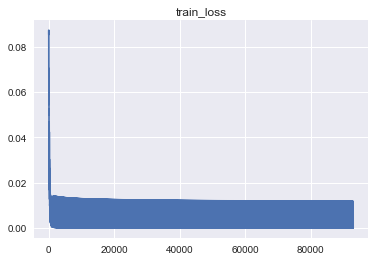

In [80]:
print(len(train_loss))
plt.plot(train_loss,'-')
plt.title('train_loss')


7068


Text(0.5,1,'test_loss')

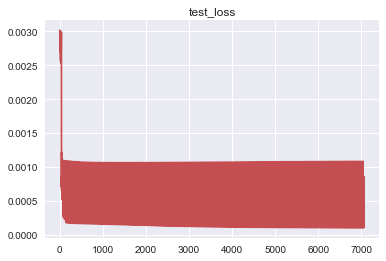

In [81]:
print(len(test_loss))
plt.plot(test_loss,'r')
plt.title('test_loss')


#### Demornamization

In [ ]:
# normalized this way:
#test_norm =  (df_new_test - df_new_test.mean()) / (df_new_test.max() - df_new_test.min())

In [82]:
rmse = np.sqrt(mse)

In [83]:
rmse_denorm = (rmse * (df_new_test['Kt'].max() - df_new_test['Kt'].min()))+ df_new_test['Kt'].mean()

In [84]:
rmse_denorm

19.4803850042061

In [85]:
#df_new_test['Kt'].sort_values()

In [86]:
df_new_test['Kt'].describe()

count    3872.000000
mean        8.332994
std        41.099477
min        -0.031211
25%        -0.006043
50%         0.063551
75%         1.179040
max      1026.823214
Name: Kt, dtype: float64

### Saving train and test losses to a csv

In [87]:
df_trainLoss = pd.DataFrame(data={'Train Loss':train_loss, 'iteration': train_iter}, columns=['Train Loss','iteration'])
df_trainLoss.to_csv('RNN Paper Results/Exp1_Boulder_1000Epoch_TrainLoss.csv')
df_testLoss = pd.DataFrame(data={'Test Loss':test_loss, 'iteration': test_iter}, columns=['Test Loss','iteration'])
df_testLoss.to_csv('RNN Paper Results/Exp1_Boulder_1000EpochTestLoss.csv')